In [ ]:
/home/sit/Downloads/5 flows/plot  jason/bbr3_5flow1_1.json /home/sit/Downloads/5 flows/plot  jason/bbr3_5flow2_1.json /home/sit/Downloads/5 flows/plot  jason/bbr3_5flow3_1.json /home/sit/Downloads/5 flows/plot  jason/bbr3_5flow4_1.json /home/sit/Downloads/5 flows/plot  jason/bbr3_5flow5_1.json 

5 flows

✅ CSV saved to: /home/sit/Downloads/5 flows/plot jason1/tcp_metrics_5flows.csv


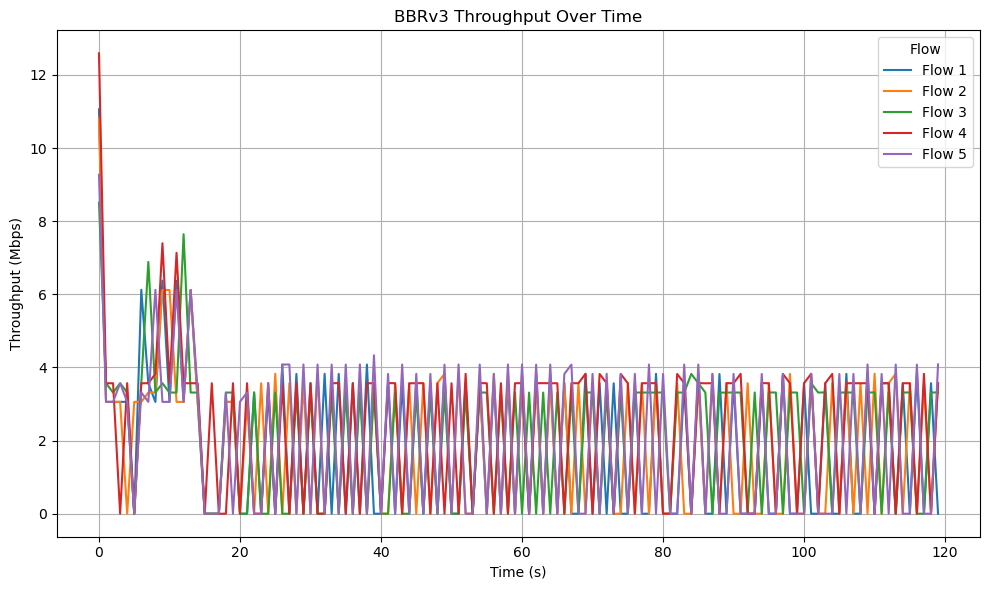

✅ Saved: /home/sit/Downloads/5 flows/plot jason1/bbrv3_plots/throughput.png


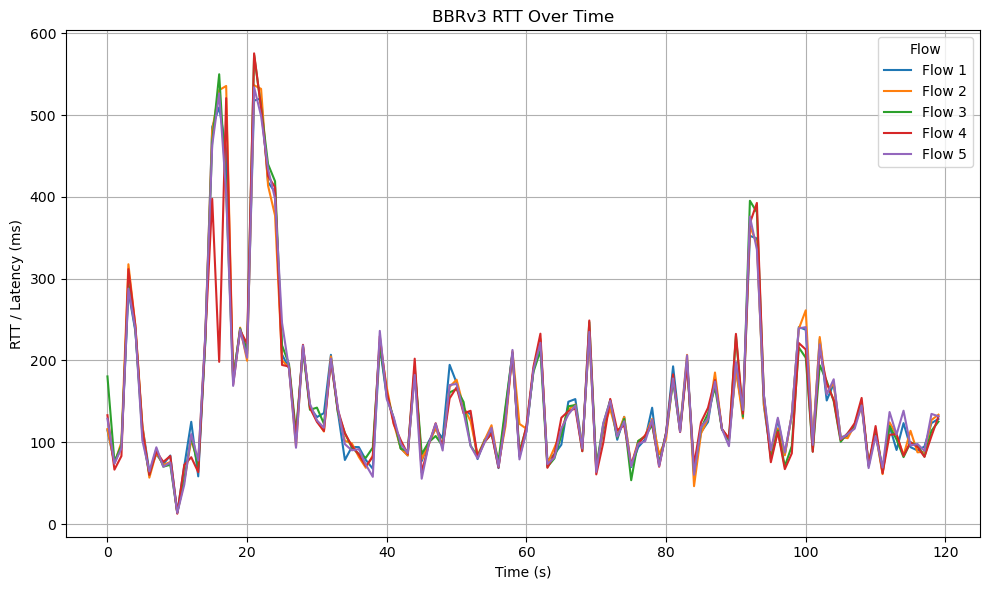

✅ Saved: /home/sit/Downloads/5 flows/plot jason1/bbrv3_plots/rtt.png


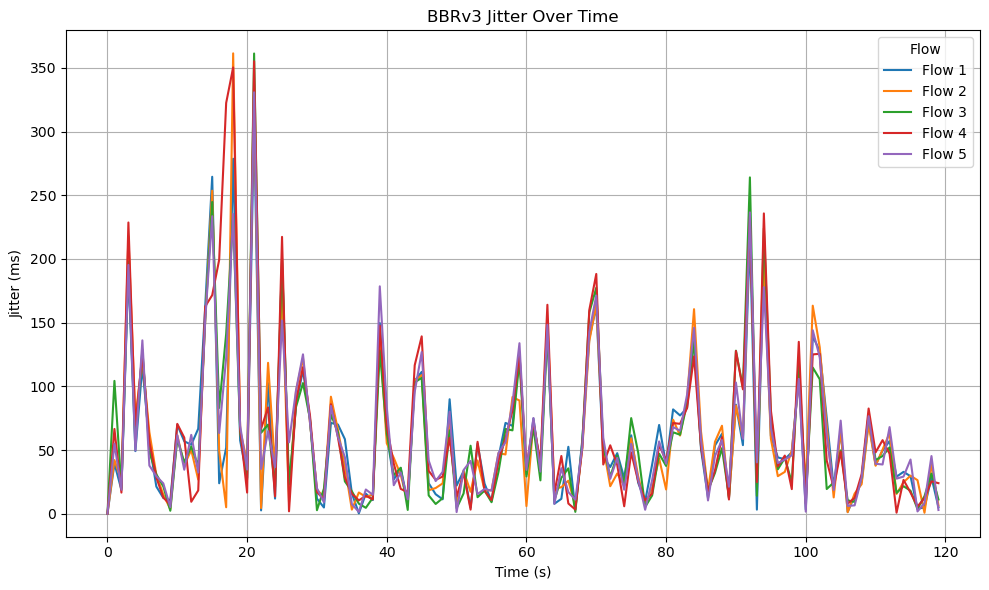

✅ Saved: /home/sit/Downloads/5 flows/plot jason1/bbrv3_plots/jitter.png


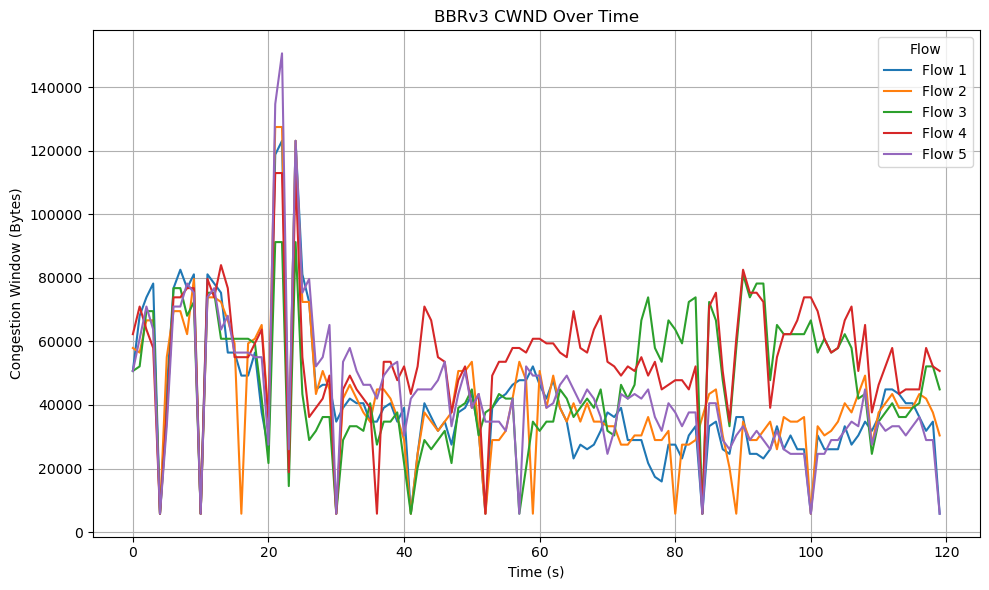

✅ Saved: /home/sit/Downloads/5 flows/plot jason1/bbrv3_plots/cwnd.png


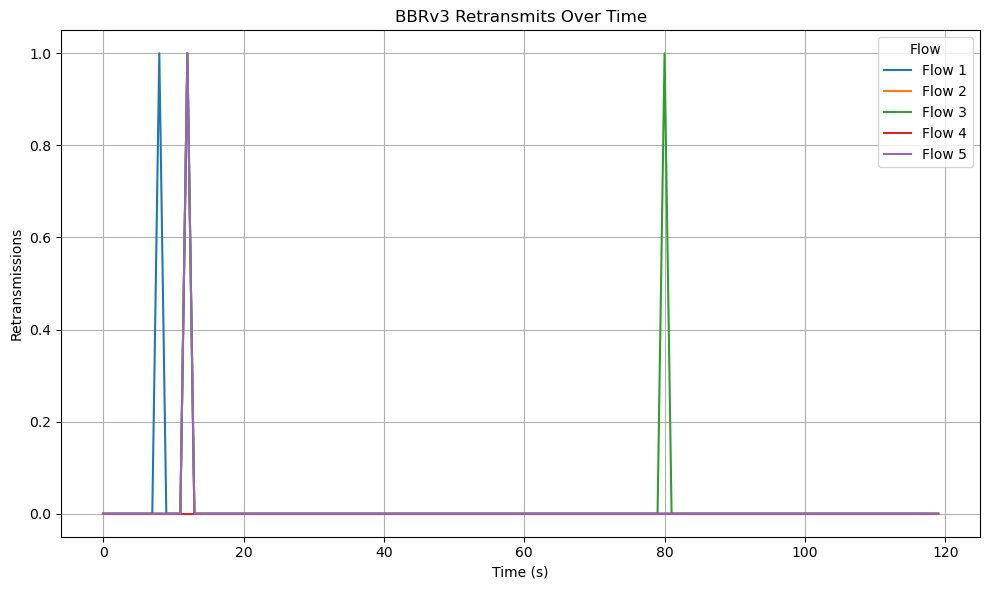

✅ Saved: /home/sit/Downloads/5 flows/plot jason1/bbrv3_plots/retransmits.png


In [105]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt

def extract_metrics(filepath, label):
    with open(filepath) as f:
        data = json.load(f)

    metrics = []
    prev_rtt_ms = None

    for i, interval in enumerate(data.get("intervals", [])):
        stream = interval["streams"][0]
        rtt_ms = stream.get("rtt", 0) / 1000  # Convert µs to ms
        jitter_ms = abs(rtt_ms - prev_rtt_ms) if prev_rtt_ms is not None else 0
        prev_rtt_ms = rtt_ms

        metrics.append({
            "time_sec": i,
            "throughput_mbps": stream.get("bits_per_second", 0) / 1e6,
            "rtt_ms": rtt_ms,
            "jitter_ms": jitter_ms,
            "cwnd_bytes": stream.get("snd_cwnd", 0),
            "retransmits": stream.get("retransmits", 0),
            "label": label
        })

    return pd.DataFrame(metrics)

def plot_metric(df, metric, ylabel, title, save_path):
    plt.figure(figsize=(10, 6))
    for label, group in df.groupby("label"):
        plt.plot(group["time_sec"], group[metric], label=label)
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(title="Flow")
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()
    plt.close()
    print(f"✅ Saved: {save_path}")
   


def process_tcp_flows(folder_path, file_pattern, output_csv_name, algo_name):
    all_data = []

    for i in range(1, 6):
        filename = file_pattern.format(i)
        filepath = os.path.join(folder_path, filename)
        label = f"Flow {i}"
        if os.path.exists(filepath):
            df = extract_metrics(filepath, label)
            all_data.append(df)
        else:
            print(f"❌ File not found: {filepath}")

    if not all_data:
        print("⚠️ No data to process.")
        return

    df_all = pd.concat(all_data, ignore_index=True)
    
    # Save CSV
    output_csv = os.path.join(folder_path, output_csv_name)
    df_all.to_csv(output_csv, index=False)
    print(f"✅ CSV saved to: {output_csv}")

    # Create directory for plots
    plot_dir = os.path.join(folder_path, f"{algo_name.lower()}_plots")
    os.makedirs(plot_dir, exist_ok=True)

    # Plot metrics
    plot_metric(df_all, "throughput_mbps", "Throughput (Mbps)", f"{algo_name} Throughput Over Time", os.path.join(plot_dir, "throughput.png"))
    plot_metric(df_all, "rtt_ms", "RTT / Latency (ms)", f"{algo_name} RTT Over Time", os.path.join(plot_dir, "rtt.png"))
    plot_metric(df_all, "jitter_ms", "Jitter (ms)", f"{algo_name} Jitter Over Time", os.path.join(plot_dir, "jitter.png"))
    plot_metric(df_all, "cwnd_bytes", "Congestion Window (Bytes)", f"{algo_name} CWND Over Time", os.path.join(plot_dir, "cwnd.png"))
    plot_metric(df_all, "retransmits", "Retransmissions", f"{algo_name} Retransmits Over Time", os.path.join(plot_dir, "retransmits.png"))

# --------------------------------------------
# ✅ To run it (for BBR):
process_tcp_flows(
    folder_path="/home/sit/Downloads/5 flows/plot jason1",
    file_pattern="bbr3_flow{}.json",  # Adjust this pattern for your file names
    output_csv_name="tcp_metrics_5flows.csv",
    algo_name="BBRv3"
)


In [ ]:
/home/sit/Downloads/5 flows/plot jason1/bbr3_flow1.json /home/sit/Downloads/5 flows/plot jason1/bbr3_flow2.json /home/sit/Downloads/5 flows/plot jason1/bbr3_flow3.json /home/sit/Downloads/5 flows/plot jason1/bbr3_flow4.json /home/sit/Downloads/5 flows/plot jason1/bbr3_flow5.json

✅ CSV saved to: /home/sit/Downloads/5 flows/plot  jason/tcp_metrics_5flows1.csv


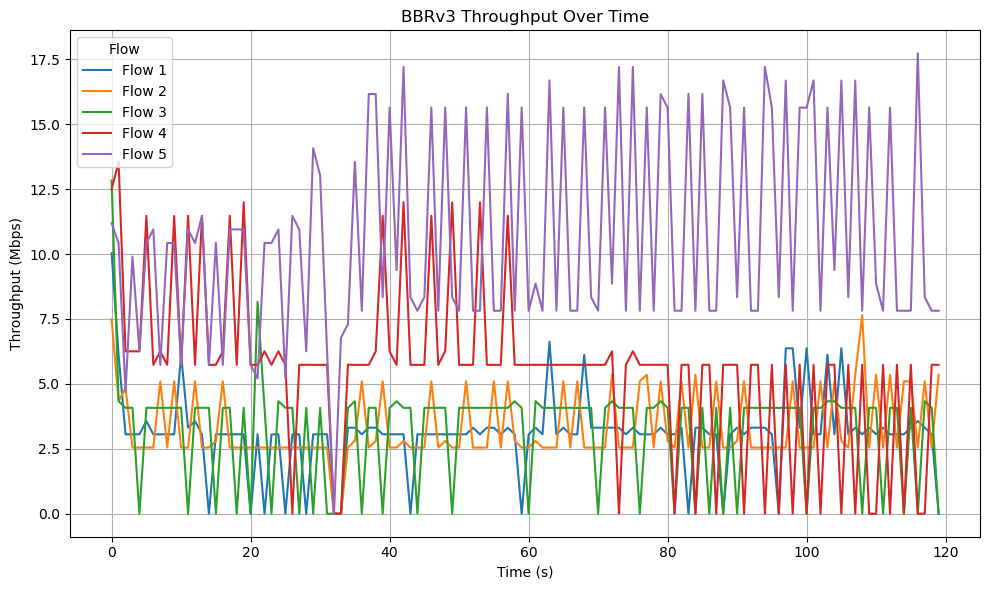

✅ Saved: /home/sit/Downloads/5 flows/plot  jason/bbrv3_plots/throughput.png


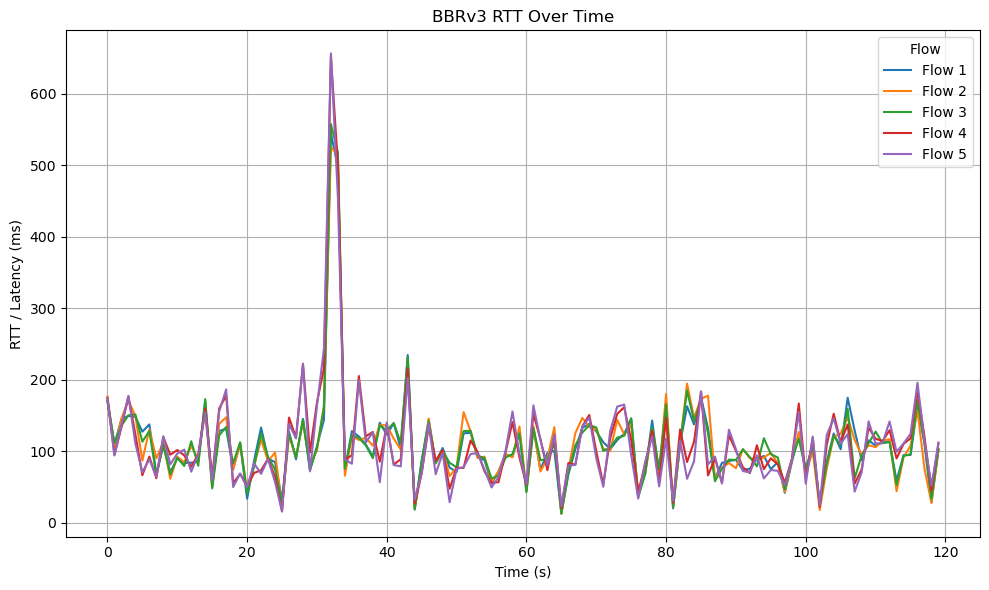

✅ Saved: /home/sit/Downloads/5 flows/plot  jason/bbrv3_plots/rtt.png


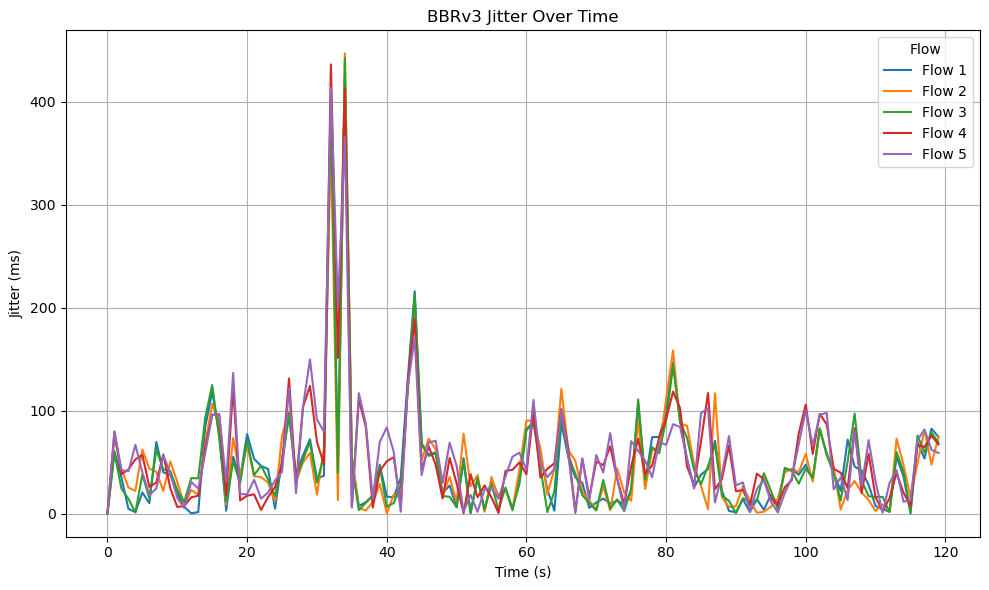

✅ Saved: /home/sit/Downloads/5 flows/plot  jason/bbrv3_plots/jitter.png


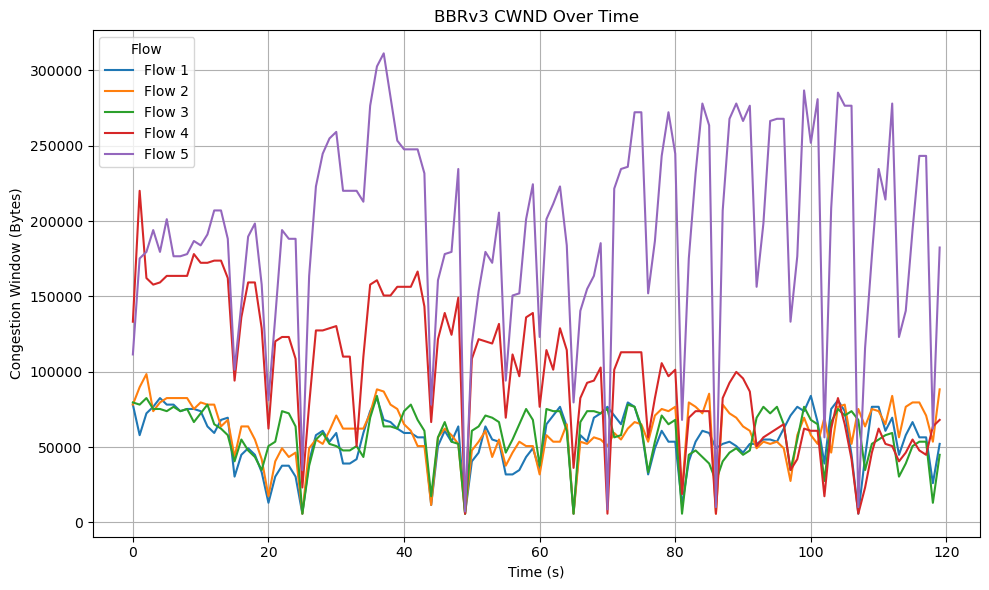

✅ Saved: /home/sit/Downloads/5 flows/plot  jason/bbrv3_plots/cwnd.png


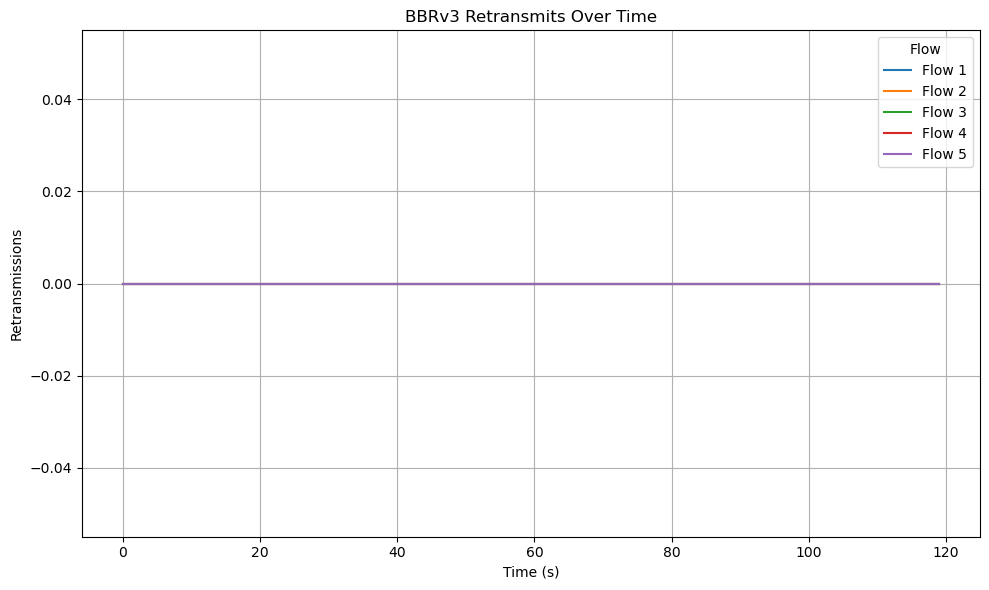

✅ Saved: /home/sit/Downloads/5 flows/plot  jason/bbrv3_plots/retransmits.png


In [101]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt

def extract_metrics(filepath, label):
    with open(filepath) as f:
        data = json.load(f)

    metrics = []
    prev_rtt_ms = None

    for i, interval in enumerate(data.get("intervals", [])):
        stream = interval["streams"][0]
        rtt_ms = stream.get("rtt", 0) / 1000  # Convert µs to ms
        jitter_ms = abs(rtt_ms - prev_rtt_ms) if prev_rtt_ms is not None else 0
        prev_rtt_ms = rtt_ms

        metrics.append({
            "time_sec": i,
            "throughput_mbps": stream.get("bits_per_second", 0) / 1e6,
            "rtt_ms": rtt_ms,
            "jitter_ms": jitter_ms,
            "cwnd_bytes": stream.get("snd_cwnd", 0),
            "retransmits": stream.get("retransmits", 0),
            "label": label
        })

    return pd.DataFrame(metrics)

def plot_metric(df, metric, ylabel, title, save_path):
    plt.figure(figsize=(10, 6))
    for label, group in df.groupby("label"):
        plt.plot(group["time_sec"], group[metric], label=label)
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(title="Flow")
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()
    plt.close()
    print(f"✅ Saved: {save_path}")
   


def process_tcp_flows(folder_path, file_pattern, output_csv_name, algo_name):
    all_data = []

    for i in range(1, 6):
        filename = file_pattern.format(i)
        filepath = os.path.join(folder_path, filename)
        label = f"Flow {i}"
        if os.path.exists(filepath):
            df = extract_metrics(filepath, label)
            all_data.append(df)
        else:
            print(f"❌ File not found: {filepath}")

    if not all_data:
        print("⚠️ No data to process.")
        return

    df_all = pd.concat(all_data, ignore_index=True)
    
    # Save CSV
    output_csv = os.path.join(folder_path, output_csv_name)
    df_all.to_csv(output_csv, index=False)
    print(f"✅ CSV saved to: {output_csv}")

    # Create directory for plots
    plot_dir = os.path.join(folder_path, f"{algo_name.lower()}_plots")
    os.makedirs(plot_dir, exist_ok=True)

    # Plot metrics
    plot_metric(df_all, "throughput_mbps", "Throughput (Mbps)", f"{algo_name} Throughput Over Time", os.path.join(plot_dir, "throughput.png"))
    plot_metric(df_all, "rtt_ms", "RTT / Latency (ms)", f"{algo_name} RTT Over Time", os.path.join(plot_dir, "rtt.png"))
    plot_metric(df_all, "jitter_ms", "Jitter (ms)", f"{algo_name} Jitter Over Time", os.path.join(plot_dir, "jitter.png"))
    plot_metric(df_all, "cwnd_bytes", "Congestion Window (Bytes)", f"{algo_name} CWND Over Time", os.path.join(plot_dir, "cwnd.png"))
    plot_metric(df_all, "retransmits", "Retransmissions", f"{algo_name} Retransmits Over Time", os.path.join(plot_dir, "retransmits.png"))

# --------------------------------------------
# ✅ To run it (for BBR):
process_tcp_flows(
    folder_path="/home/sit/Downloads/5 flows/plot  jason",
    file_pattern="bbr3_5flow{}_1.json",  # Adjust this pattern for your file names
    output_csv_name="tcp_metrics_5flows1.csv",
    algo_name="BBRv3"
)


In [ ]:
/home/sit/Downloads/5 flows/plot jason2/bbr3_5flow1_2.json /home/sit/Downloads/5 flows/plot jason2/bbr3_5flow2_2.json /home/sit/Downloads/5 flows/plot jason2/bbr3_5flow3_2.json /home/sit/Downloads/5 flows/plot jason2/bbr3_5flow4_2.json /home/sit/Downloads/5 flows/plot jason2/bbr3_5flow5_2.json

✅ CSV saved to: /home/sit/Downloads/5 flows/plot jason2/tcp_metrics_5flows2.csv


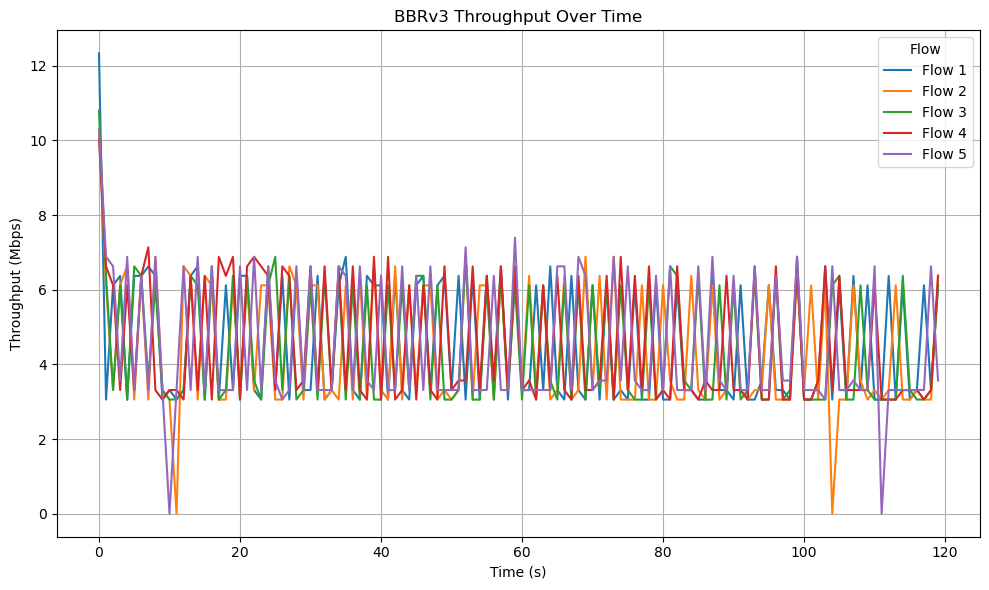

✅ Saved: /home/sit/Downloads/5 flows/plot jason2/bbrv3_plots/throughput.png


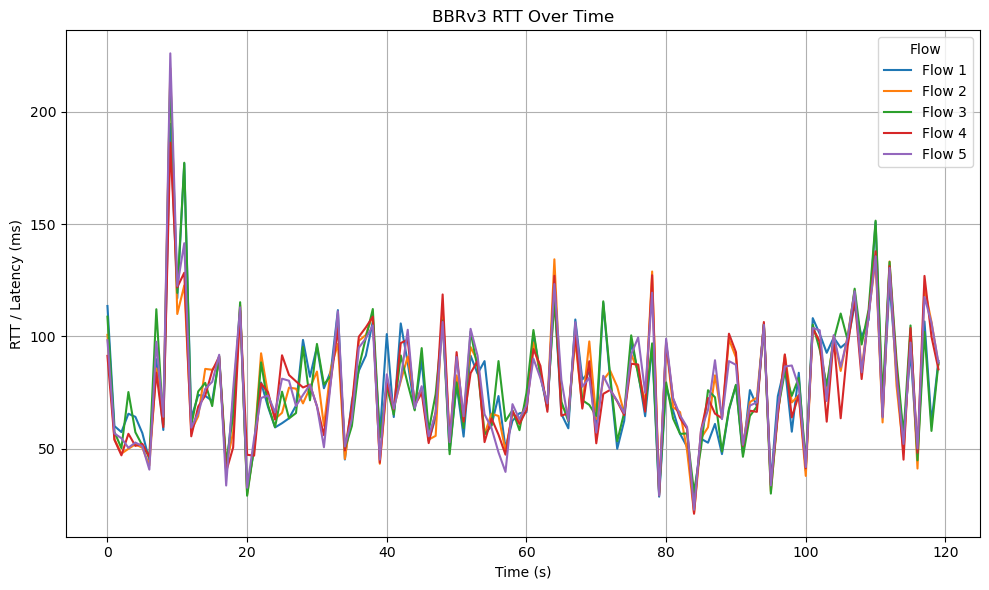

✅ Saved: /home/sit/Downloads/5 flows/plot jason2/bbrv3_plots/rtt.png


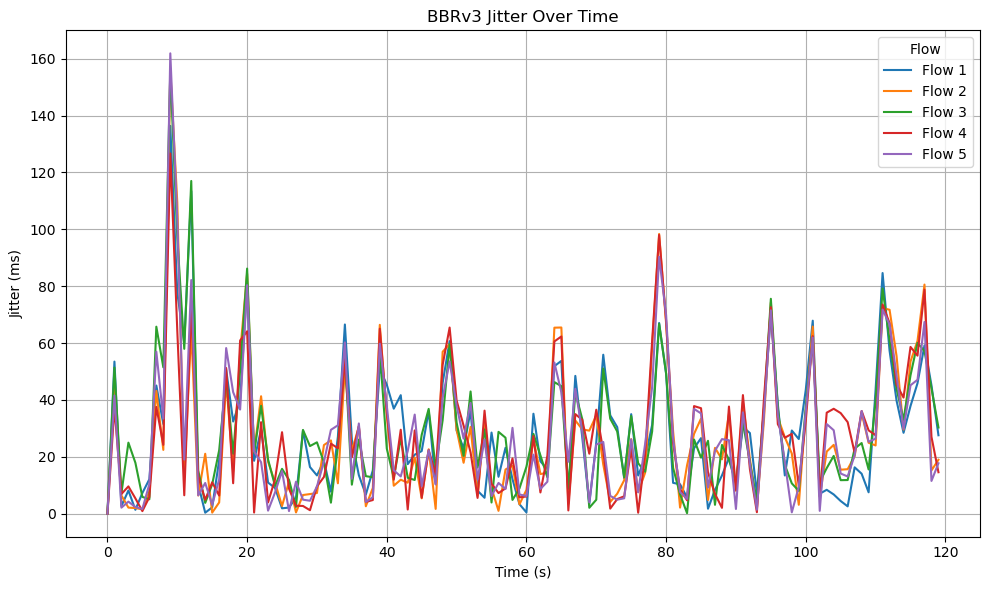

✅ Saved: /home/sit/Downloads/5 flows/plot jason2/bbrv3_plots/jitter.png


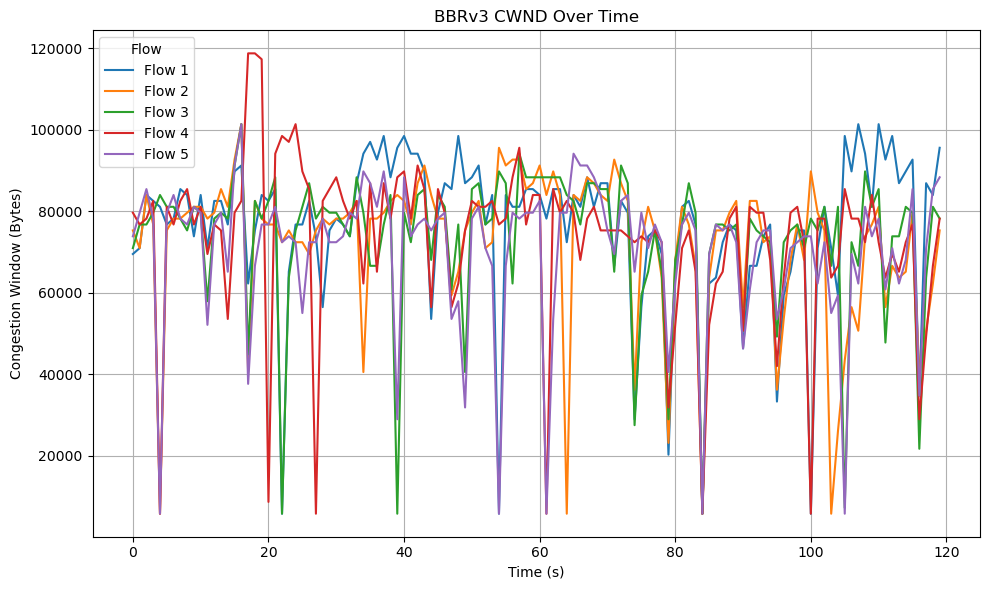

✅ Saved: /home/sit/Downloads/5 flows/plot jason2/bbrv3_plots/cwnd.png


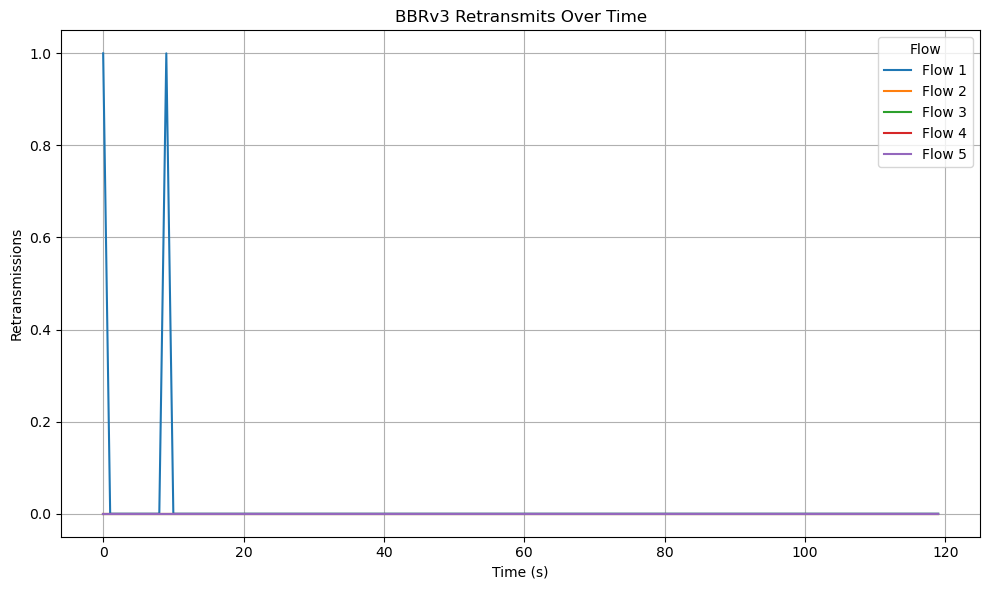

✅ Saved: /home/sit/Downloads/5 flows/plot jason2/bbrv3_plots/retransmits.png


In [95]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt

def extract_metrics(filepath, label):
    with open(filepath) as f:
        data = json.load(f)

    metrics = []
    prev_rtt_ms = None

    for i, interval in enumerate(data.get("intervals", [])):
        stream = interval["streams"][0]
        rtt_ms = stream.get("rtt", 0) / 1000  # Convert µs to ms
        jitter_ms = abs(rtt_ms - prev_rtt_ms) if prev_rtt_ms is not None else 0
        prev_rtt_ms = rtt_ms

        metrics.append({
            "time_sec": i,
            "throughput_mbps": stream.get("bits_per_second", 0) / 1e6,
            "rtt_ms": rtt_ms,
            "jitter_ms": jitter_ms,
            "cwnd_bytes": stream.get("snd_cwnd", 0),
            "retransmits": stream.get("retransmits", 0),
            "label": label
        })

    return pd.DataFrame(metrics)

def plot_metric(df, metric, ylabel, title, save_path):
    plt.figure(figsize=(10, 6))
    for label, group in df.groupby("label"):
        plt.plot(group["time_sec"], group[metric], label=label)
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(title="Flow")
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()
    plt.close()
    print(f"✅ Saved: {save_path}")
   


def process_tcp_flows(folder_path, file_pattern, output_csv_name, algo_name):
    all_data = []

    for i in range(1, 6):
        filename = file_pattern.format(i)
        filepath = os.path.join(folder_path, filename)
        label = f"Flow {i}"
        if os.path.exists(filepath):
            df = extract_metrics(filepath, label)
            all_data.append(df)
        else:
            print(f"❌ File not found: {filepath}")

    if not all_data:
        print("⚠️ No data to process.")
        return

    df_all = pd.concat(all_data, ignore_index=True)
    
    # Save CSV
    output_csv = os.path.join(folder_path, output_csv_name)
    df_all.to_csv(output_csv, index=False)
    print(f"✅ CSV saved to: {output_csv}")

    # Create directory for plots
    plot_dir = os.path.join(folder_path, f"{algo_name.lower()}_plots")
    os.makedirs(plot_dir, exist_ok=True)

    # Plot metrics
    plot_metric(df_all, "throughput_mbps", "Throughput (Mbps)", f"{algo_name} Throughput Over Time", os.path.join(plot_dir, "throughput.png"))
    plot_metric(df_all, "rtt_ms", "RTT / Latency (ms)", f"{algo_name} RTT Over Time", os.path.join(plot_dir, "rtt.png"))
    plot_metric(df_all, "jitter_ms", "Jitter (ms)", f"{algo_name} Jitter Over Time", os.path.join(plot_dir, "jitter.png"))
    plot_metric(df_all, "cwnd_bytes", "Congestion Window (Bytes)", f"{algo_name} CWND Over Time", os.path.join(plot_dir, "cwnd.png"))
    plot_metric(df_all, "retransmits", "Retransmissions", f"{algo_name} Retransmits Over Time", os.path.join(plot_dir, "retransmits.png"))

# --------------------------------------------
# ✅ To run it (for BBR):
process_tcp_flows(
    folder_path="/home/sit/Downloads/5 flows/plot jason2",
    file_pattern="bbr3_5flow{}_2.json",  # Adjust this pattern for your file names
    output_csv_name="tcp_metrics_5flows2.csv",
    algo_name="BBRv3"
)


✅ CSV saved to: /home/sit/Downloads/5 flows/plot jason3/tcp_metrics_5flows2.csv


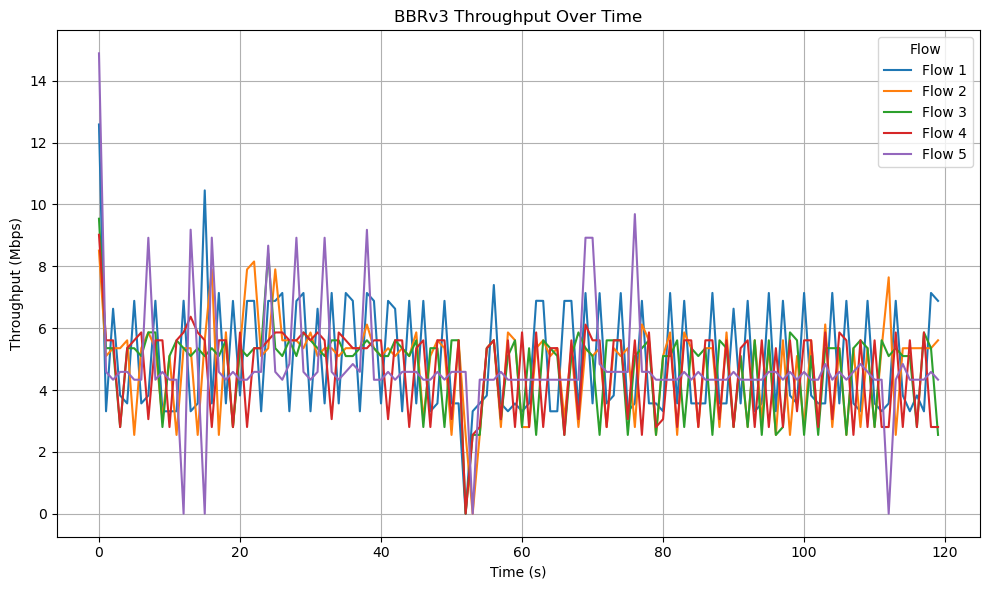

✅ Saved: /home/sit/Downloads/5 flows/plot jason3/bbrv3_plots/throughput.png


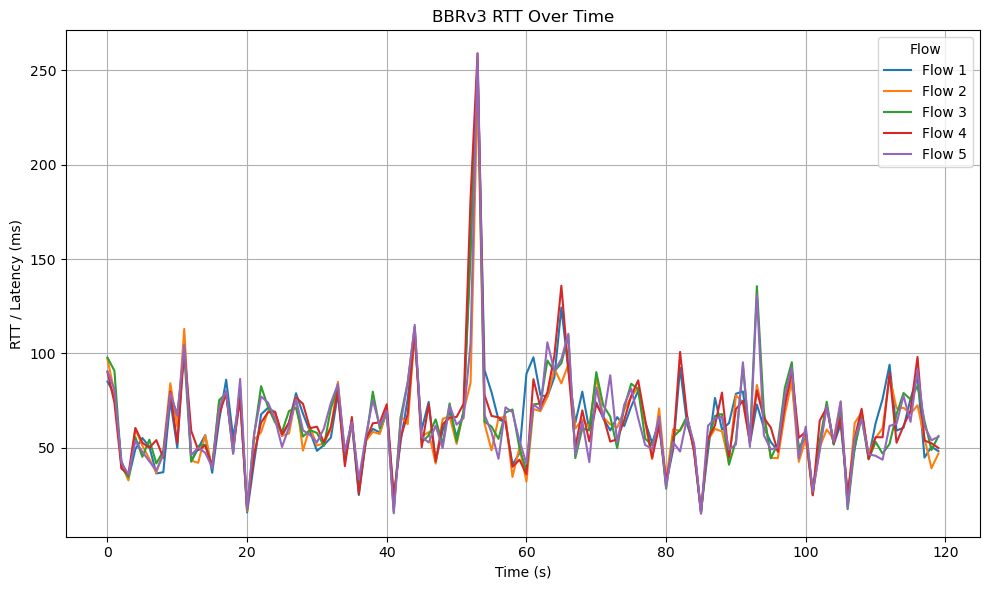

✅ Saved: /home/sit/Downloads/5 flows/plot jason3/bbrv3_plots/rtt.png


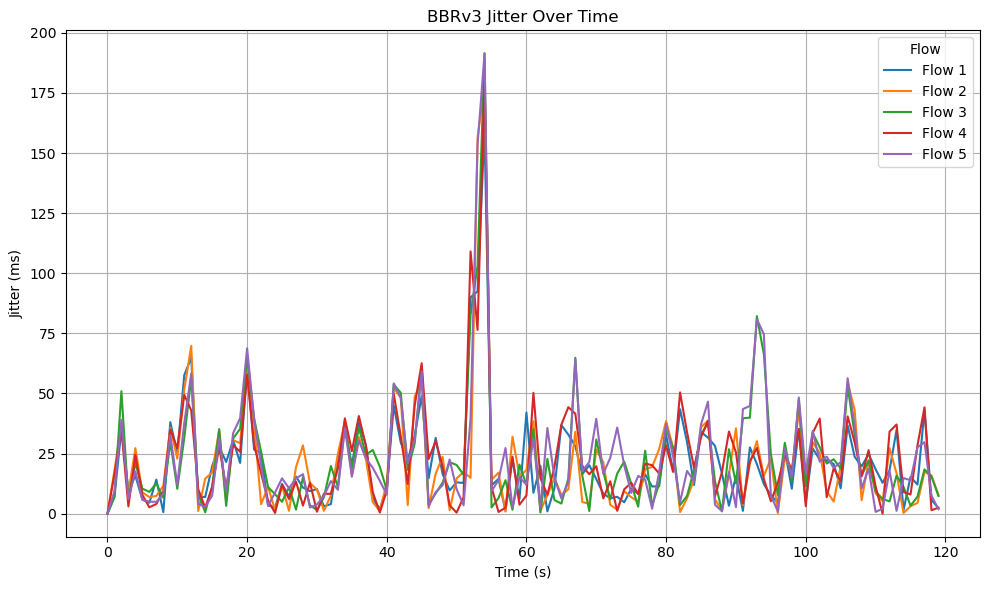

✅ Saved: /home/sit/Downloads/5 flows/plot jason3/bbrv3_plots/jitter.png


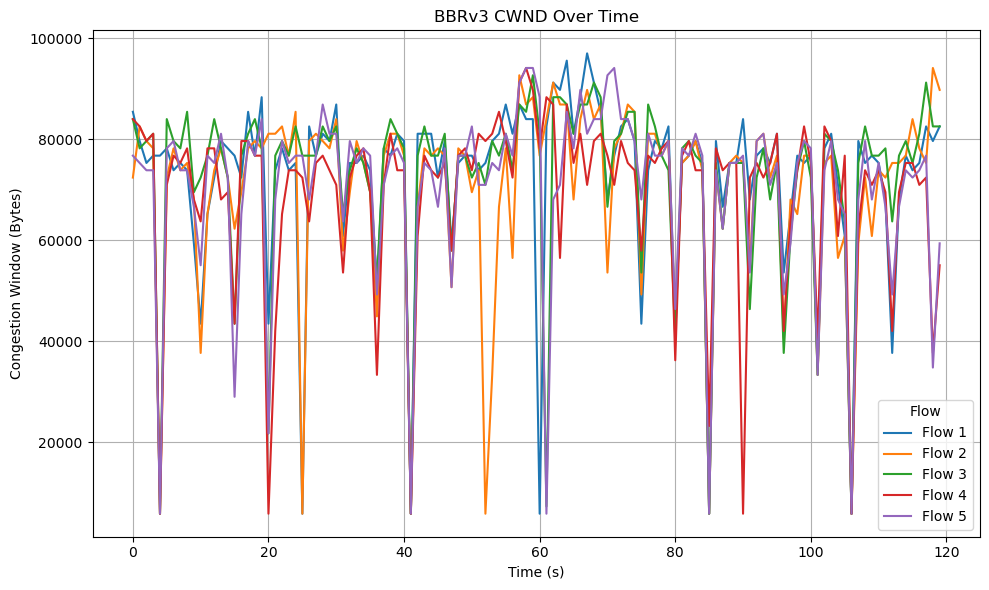

✅ Saved: /home/sit/Downloads/5 flows/plot jason3/bbrv3_plots/cwnd.png


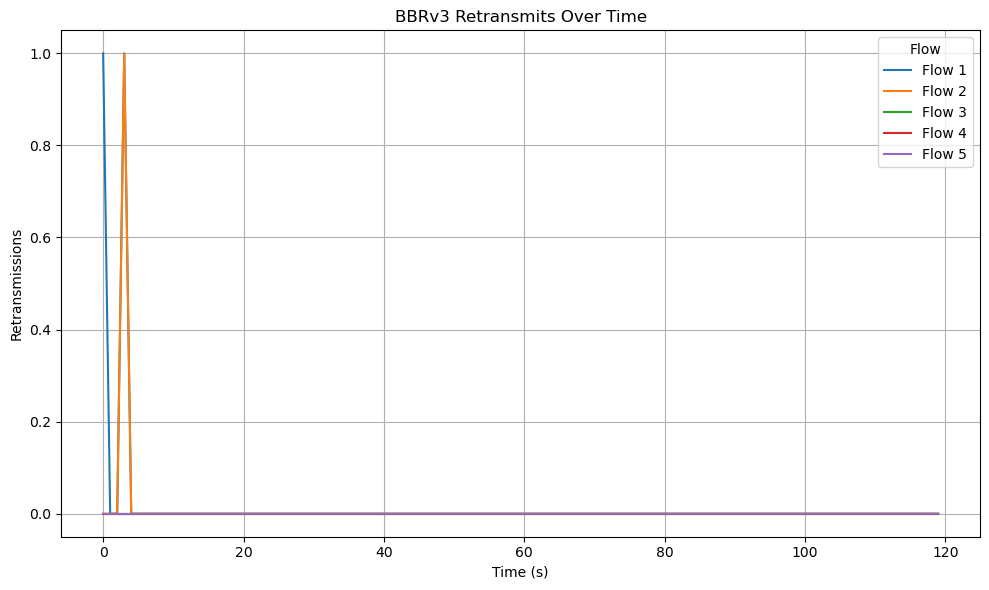

✅ Saved: /home/sit/Downloads/5 flows/plot jason3/bbrv3_plots/retransmits.png


In [20]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt

def extract_metrics(filepath, label):
    with open(filepath) as f:
        data = json.load(f)

    metrics = []
    prev_rtt_ms = None

    for i, interval in enumerate(data.get("intervals", [])):
        stream = interval["streams"][0]
        rtt_ms = stream.get("rtt", 0) / 1000  # Convert µs to ms
        jitter_ms = abs(rtt_ms - prev_rtt_ms) if prev_rtt_ms is not None else 0
        prev_rtt_ms = rtt_ms

        metrics.append({
            "time_sec": i,
            "throughput_mbps": stream.get("bits_per_second", 0) / 1e6,
            "rtt_ms": rtt_ms,
            "jitter_ms": jitter_ms,
            "cwnd_bytes": stream.get("snd_cwnd", 0),
            "retransmits": stream.get("retransmits", 0),
            "label": label
        })

    return pd.DataFrame(metrics)

def plot_metric(df, metric, ylabel, title, save_path):
    plt.figure(figsize=(10, 6))
    for label, group in df.groupby("label"):
        plt.plot(group["time_sec"], group[metric], label=label)
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(title="Flow")
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()
    plt.close()
    print(f"✅ Saved: {save_path}")
   


def process_tcp_flows(folder_path, file_pattern, output_csv_name, algo_name):
    all_data = []

    for i in range(1, 6):
        filename = file_pattern.format(i)
        filepath = os.path.join(folder_path, filename)
        label = f"Flow {i}"
        if os.path.exists(filepath):
            df = extract_metrics(filepath, label)
            all_data.append(df)
        else:
            print(f"❌ File not found: {filepath}")

    if not all_data:
        print("⚠️ No data to process.")
        return

    df_all = pd.concat(all_data, ignore_index=True)
    
    # Save CSV
    output_csv = os.path.join(folder_path, output_csv_name)
    df_all.to_csv(output_csv, index=False)
    print(f"✅ CSV saved to: {output_csv}")

    # Create directory for plots
    plot_dir = os.path.join(folder_path, f"{algo_name.lower()}_plots")
    os.makedirs(plot_dir, exist_ok=True)

    # Plot metrics
    plot_metric(df_all, "throughput_mbps", "Throughput (Mbps)", f"{algo_name} Throughput Over Time", os.path.join(plot_dir, "throughput.png"))
    plot_metric(df_all, "rtt_ms", "RTT / Latency (ms)", f"{algo_name} RTT Over Time", os.path.join(plot_dir, "rtt.png"))
    plot_metric(df_all, "jitter_ms", "Jitter (ms)", f"{algo_name} Jitter Over Time", os.path.join(plot_dir, "jitter.png"))
    plot_metric(df_all, "cwnd_bytes", "Congestion Window (Bytes)", f"{algo_name} CWND Over Time", os.path.join(plot_dir, "cwnd.png"))
    plot_metric(df_all, "retransmits", "Retransmissions", f"{algo_name} Retransmits Over Time", os.path.join(plot_dir, "retransmits.png"))

# --------------------------------------------
# ✅ To run it (for BBR):
process_tcp_flows(
    folder_path="/home/sit/Downloads/5 flows/plot jason3",
    file_pattern="bbr3_5flow{}.json",  # Adjust this pattern for your file names
    output_csv_name="tcp_metrics_5flows2.csv",
    algo_name="BBRv3"
)


In [ ]:
/home/sit/Downloads/3 flows

❌ File not found: /home/sit/Downloads/3 flows/plot jason/bbr3_3flow4.json
❌ File not found: /home/sit/Downloads/3 flows/plot jason/bbr3_3flow5.json
✅ CSV saved to: /home/sit/Downloads/3 flows/plot jason/tcp_metrics_3flows.csv


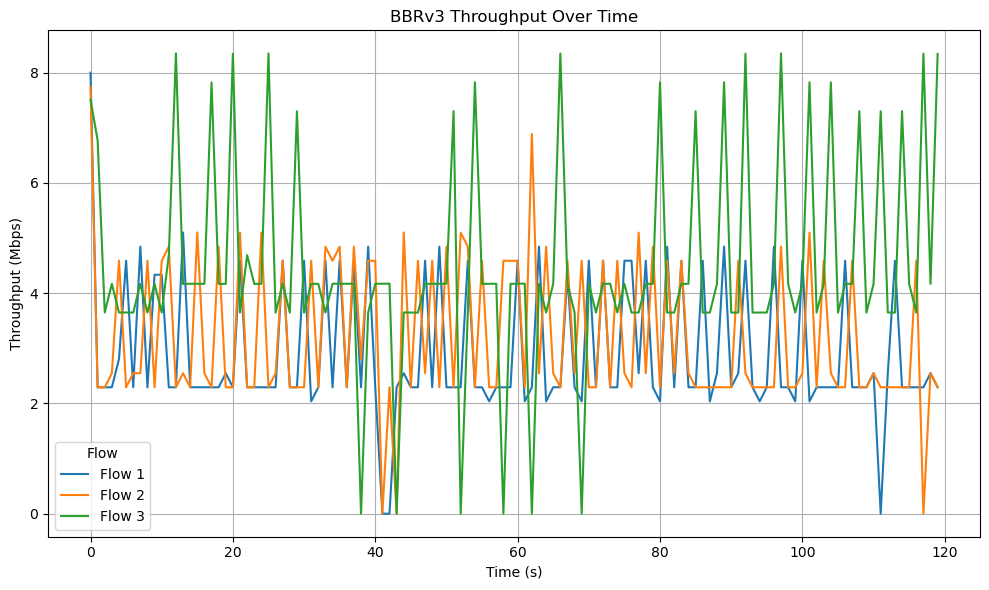

✅ Saved: /home/sit/Downloads/3 flows/plot jason/bbrv3_plots/throughput.png


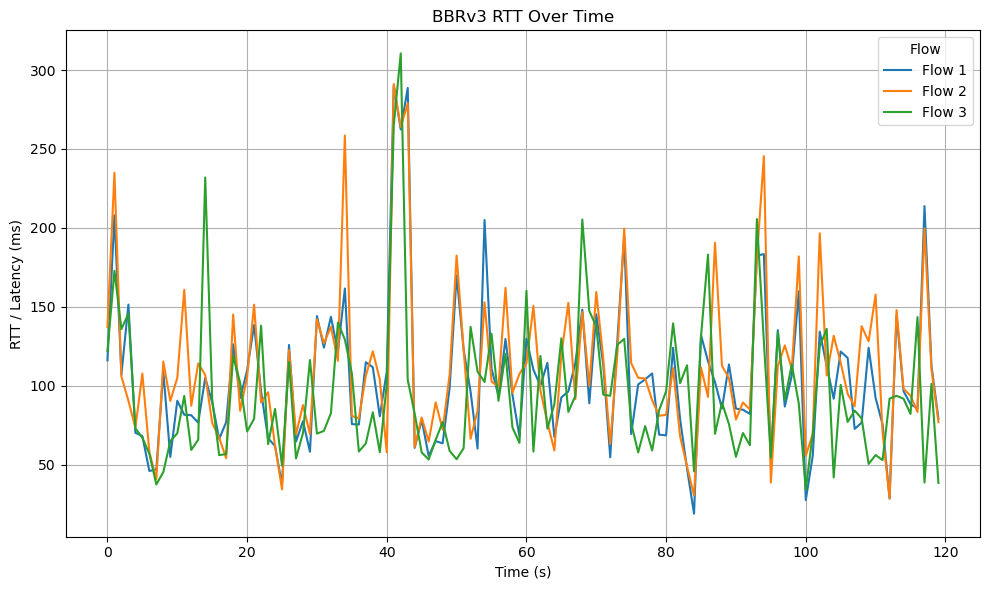

✅ Saved: /home/sit/Downloads/3 flows/plot jason/bbrv3_plots/rtt.png


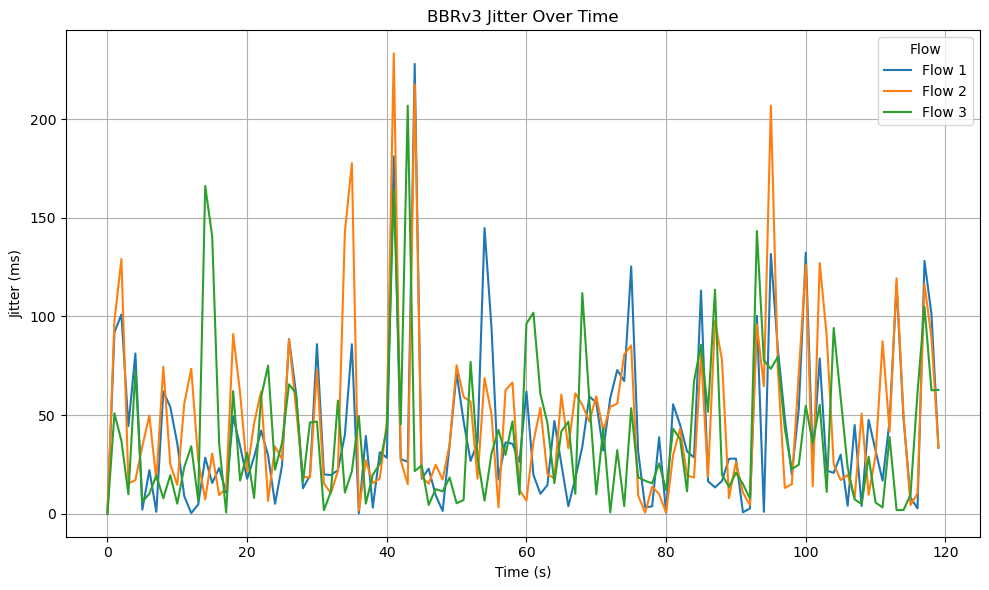

✅ Saved: /home/sit/Downloads/3 flows/plot jason/bbrv3_plots/jitter.png


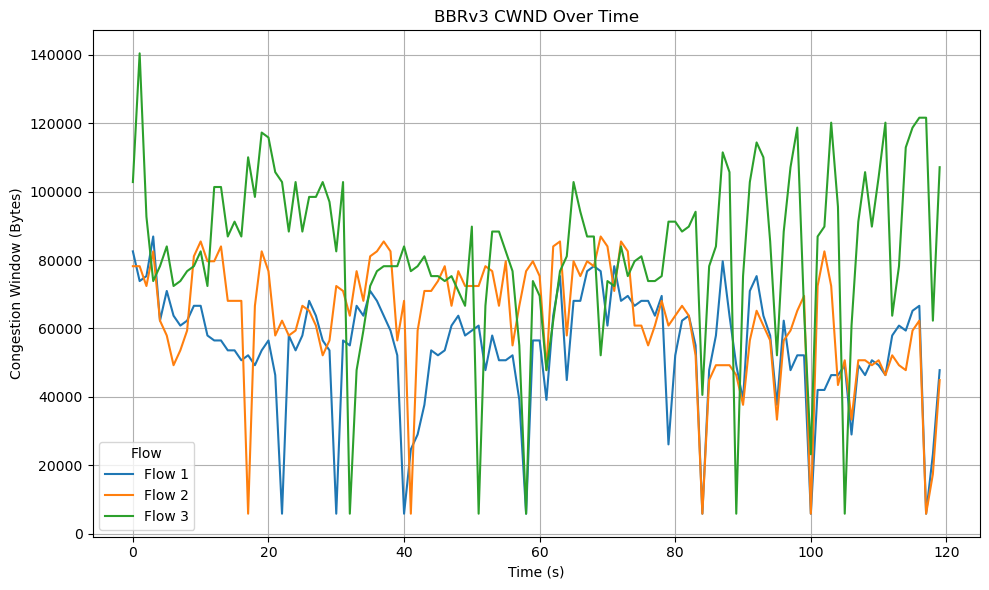

✅ Saved: /home/sit/Downloads/3 flows/plot jason/bbrv3_plots/cwnd.png


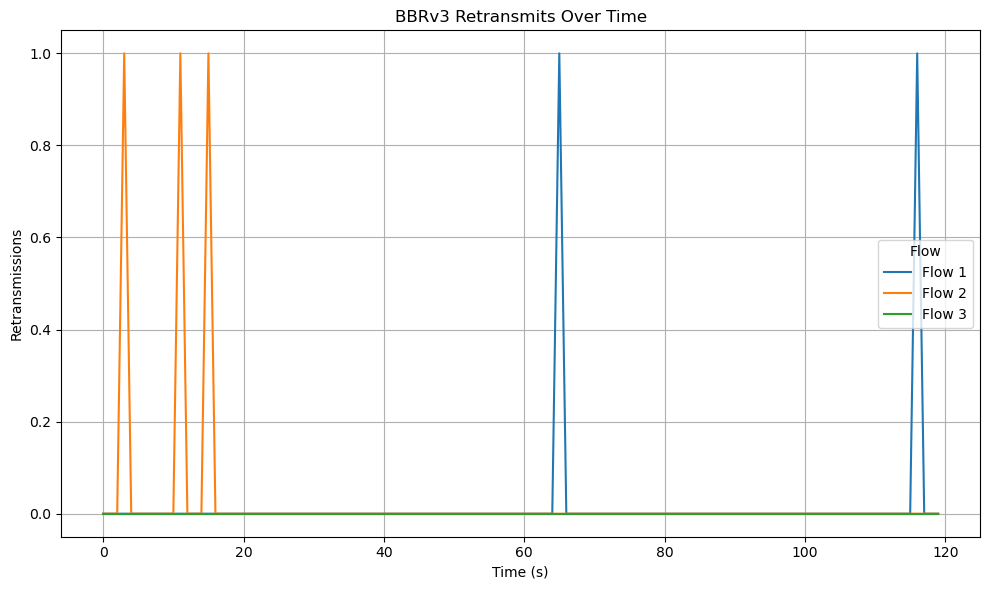

✅ Saved: /home/sit/Downloads/3 flows/plot jason/bbrv3_plots/retransmits.png


In [25]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt

def extract_metrics(filepath, label):
    with open(filepath) as f:
        data = json.load(f)

    metrics = []
    prev_rtt_ms = None

    for i, interval in enumerate(data.get("intervals", [])):
        stream = interval["streams"][0]
        rtt_ms = stream.get("rtt", 0) / 1000  # Convert µs to ms
        jitter_ms = abs(rtt_ms - prev_rtt_ms) if prev_rtt_ms is not None else 0
        prev_rtt_ms = rtt_ms

        metrics.append({
            "time_sec": i,
            "throughput_mbps": stream.get("bits_per_second", 0) / 1e6,
            "rtt_ms": rtt_ms,
            "jitter_ms": jitter_ms,
            "cwnd_bytes": stream.get("snd_cwnd", 0),
            "retransmits": stream.get("retransmits", 0),
            "label": label
        })

    return pd.DataFrame(metrics)

def plot_metric(df, metric, ylabel, title, save_path):
    plt.figure(figsize=(10, 6))
    for label, group in df.groupby("label"):
        plt.plot(group["time_sec"], group[metric], label=label)
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(title="Flow")
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()
    plt.close()
    print(f"✅ Saved: {save_path}")
   


def process_tcp_flows(folder_path, file_pattern, output_csv_name, algo_name):
    all_data = []

    for i in range(1, 6):
        filename = file_pattern.format(i)
        filepath = os.path.join(folder_path, filename)
        label = f"Flow {i}"
        if os.path.exists(filepath):
            df = extract_metrics(filepath, label)
            all_data.append(df)
        else:
            print(f"❌ File not found: {filepath}")

    if not all_data:
        print("⚠️ No data to process.")
        return

    df_all = pd.concat(all_data, ignore_index=True)
    
    # Save CSV
    output_csv = os.path.join(folder_path, output_csv_name)
    df_all.to_csv(output_csv, index=False)
    print(f"✅ CSV saved to: {output_csv}")

    # Create directory for plots
    plot_dir = os.path.join(folder_path, f"{algo_name.lower()}_plots")
    os.makedirs(plot_dir, exist_ok=True)

    # Plot metrics
    plot_metric(df_all, "throughput_mbps", "Throughput (Mbps)", f"{algo_name} Throughput Over Time", os.path.join(plot_dir, "throughput.png"))
    plot_metric(df_all, "rtt_ms", "RTT / Latency (ms)", f"{algo_name} RTT Over Time", os.path.join(plot_dir, "rtt.png"))
    plot_metric(df_all, "jitter_ms", "Jitter (ms)", f"{algo_name} Jitter Over Time", os.path.join(plot_dir, "jitter.png"))
    plot_metric(df_all, "cwnd_bytes", "Congestion Window (Bytes)", f"{algo_name} CWND Over Time", os.path.join(plot_dir, "cwnd.png"))
    plot_metric(df_all, "retransmits", "Retransmissions", f"{algo_name} Retransmits Over Time", os.path.join(plot_dir, "retransmits.png"))

# --------------------------------------------
# ✅ To run it (for BBR):
process_tcp_flows(
    folder_path="/home/sit/Downloads/3 flows/plot jason",
    file_pattern="bbr3_3flow{}.json",  # Adjust this pattern for your file names
    output_csv_name="tcp_metrics_3flows.csv",
    algo_name="BBRv3"
)


❌ File not found: /home/sit/Downloads/3 flows/plot jason2/bbr3_3flow4_2.json
❌ File not found: /home/sit/Downloads/3 flows/plot jason2/bbr3_3flow5_2.json
✅ CSV saved to: /home/sit/Downloads/3 flows/plot jason2/tcp_metrics_3flows2.csv


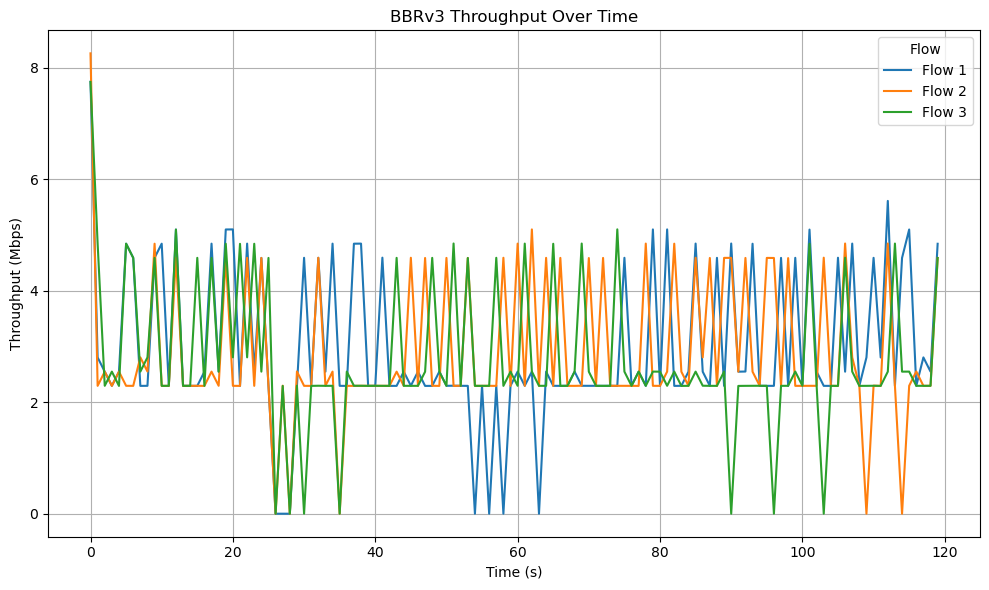

✅ Saved: /home/sit/Downloads/3 flows/plot jason2/bbrv3_plots/throughput.png


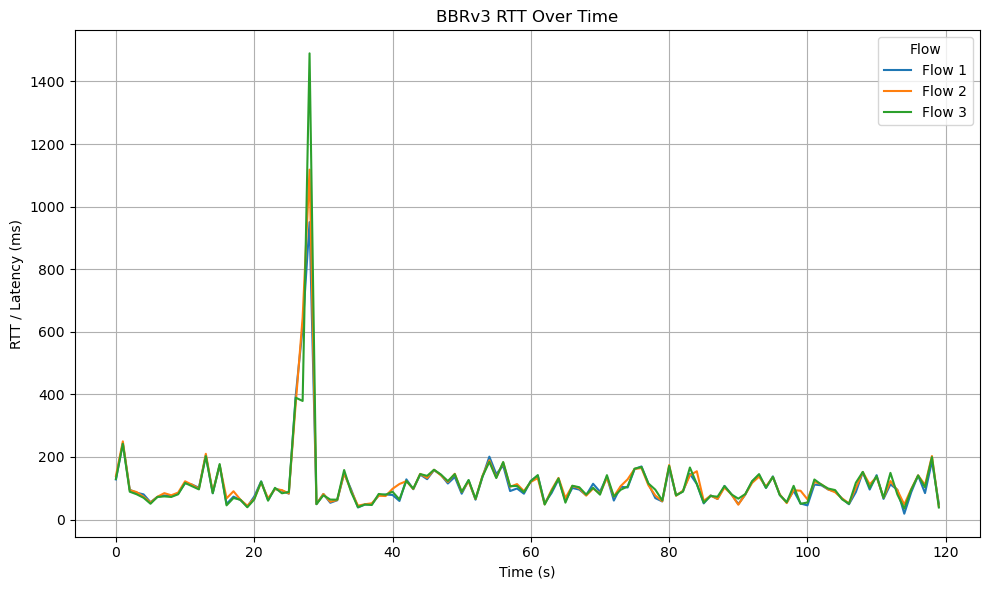

✅ Saved: /home/sit/Downloads/3 flows/plot jason2/bbrv3_plots/rtt.png


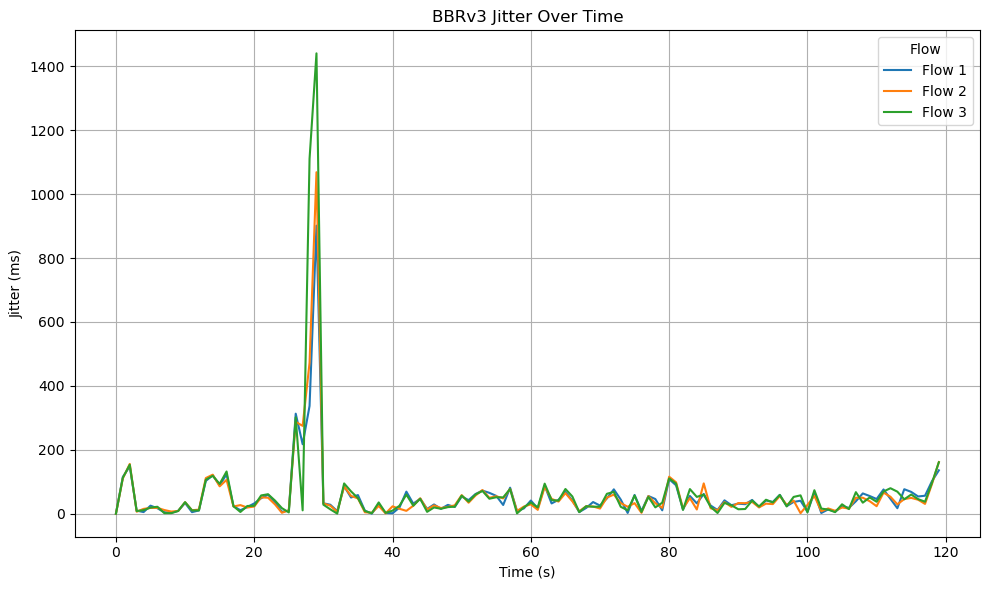

✅ Saved: /home/sit/Downloads/3 flows/plot jason2/bbrv3_plots/jitter.png


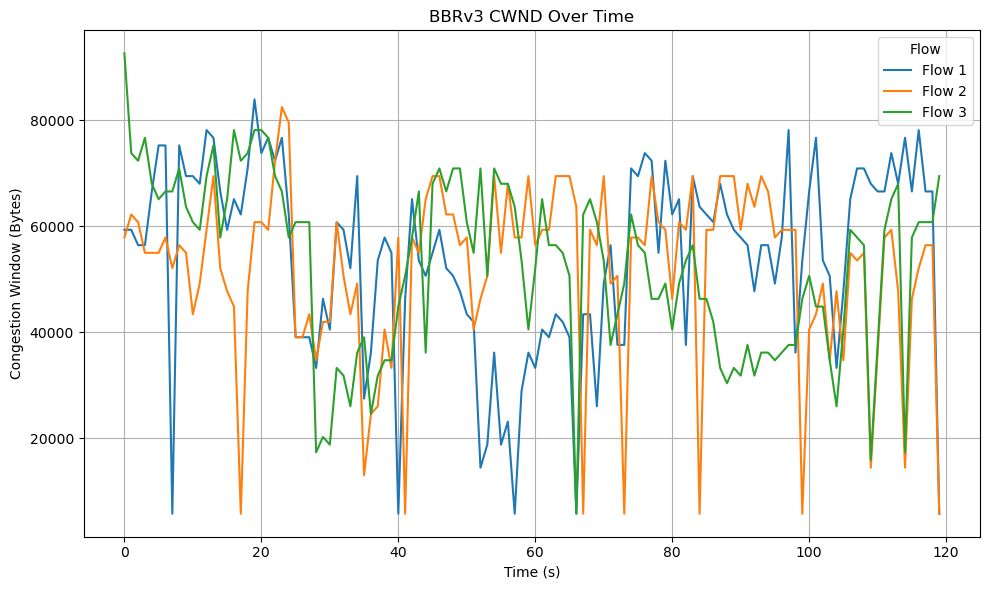

✅ Saved: /home/sit/Downloads/3 flows/plot jason2/bbrv3_plots/cwnd.png


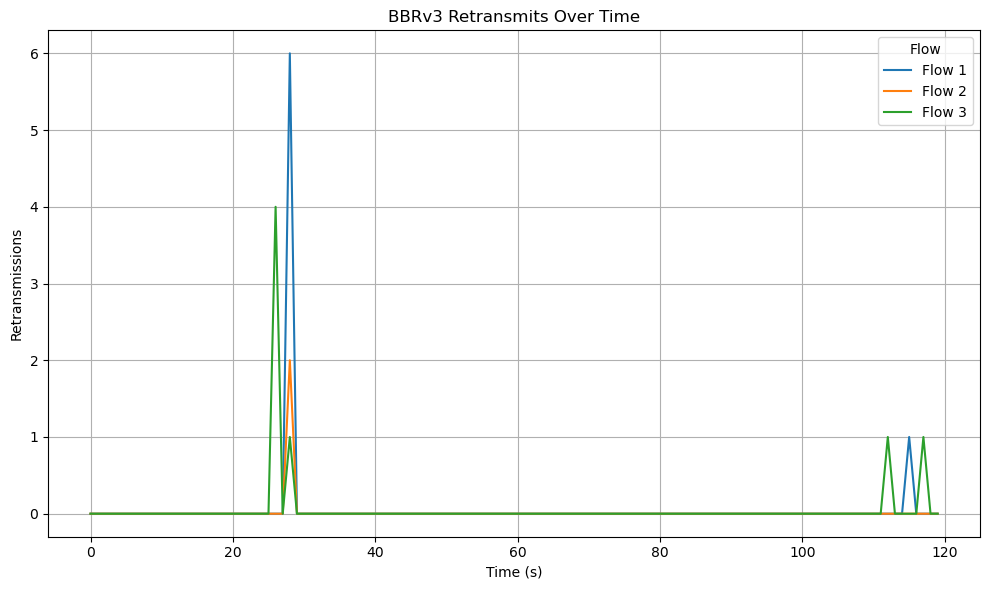

✅ Saved: /home/sit/Downloads/3 flows/plot jason2/bbrv3_plots/retransmits.png


In [ ]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt

def extract_metrics(filepath, label):
    with open(filepath) as f:
        data = json.load(f)

    metrics = []
    prev_rtt_ms = None

    for i, interval in enumerate(data.get("intervals", [])):
        stream = interval["streams"][0]
        rtt_ms = stream.get("rtt", 0) / 1000  # Convert µs to ms
        jitter_ms = abs(rtt_ms - prev_rtt_ms) if prev_rtt_ms is not None else 0
        prev_rtt_ms = rtt_ms

        metrics.append({
            "time_sec": i,
            "throughput_mbps": stream.get("bits_per_second", 0) / 1e6,
            "rtt_ms": rtt_ms,
            "jitter_ms": jitter_ms,
            "cwnd_bytes": stream.get("snd_cwnd", 0),
            "retransmits": stream.get("retransmits", 0),
            "label": label
        })

    return pd.DataFrame(metrics)

def plot_metric(df, metric, ylabel, title, save_path):
    plt.figure(figsize=(10, 6))
    for label, group in df.groupby("label"):
        plt.plot(group["time_sec"], group[metric], label=label)
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(title="Flow")
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()
    plt.close()
    print(f"✅ Saved: {save_path}")
   


def process_tcp_flows(folder_path, file_pattern, output_csv_name, algo_name):
    all_data = []

    for i in range(1, 6):
        filename = file_pattern.format(i)
        filepath = os.path.join(folder_path, filename)
        label = f"Flow {i}"
        if os.path.exists(filepath):
            df = extract_metrics(filepath, label)
            all_data.append(df)
        else:
            print(f"❌ File not found: {filepath}")

    if not all_data:
        print("⚠️ No data to process.")
        return

    df_all = pd.concat(all_data, ignore_index=True)
    
    # Save CSV
    output_csv = os.path.join(folder_path, output_csv_name)
    df_all.to_csv(output_csv, index=False)
    print(f"✅ CSV saved to: {output_csv}")

    # Create directory for plots
    plot_dir = os.path.join(folder_path, f"{algo_name.lower()}_plots")
    os.makedirs(plot_dir, exist_ok=True)

    # Plot metrics
    plot_metric(df_all, "throughput_mbps", "Throughput (Mbps)", f"{algo_name} Throughput Over Time", os.path.join(plot_dir, "throughput.png"))
    plot_metric(df_all, "rtt_ms", "RTT / Latency (ms)", f"{algo_name} RTT Over Time", os.path.join(plot_dir, "rtt.png"))
    plot_metric(df_all, "jitter_ms", "Jitter (ms)", f"{algo_name} Jitter Over Time", os.path.join(plot_dir, "jitter.png"))
    plot_metric(df_all, "cwnd_bytes", "Congestion Window (Bytes)", f"{algo_name} CWND Over Time", os.path.join(plot_dir, "cwnd.png"))
    plot_metric(df_all, "retransmits", "Retransmissions", f"{algo_name} Retransmits Over Time", os.path.join(plot_dir, "retransmits.png"))

# --------------------------------------------
# ✅ To run it (for BBR):
process_tcp_flows(
    folder_path="/home/sit/Downloads/3 flows/plot jason2",
    file_pattern="bbr3_3flow{}_2.json",  # Adjust this pattern for your file names
    output_csv_name="tcp_metrics_3flows2.csv",
    algo_name="BBRv3"
)


❌ File not found: /home/sit/Downloads/3 flows/plot jason3/bbr3_3flow4_3.json
❌ File not found: /home/sit/Downloads/3 flows/plot jason3/bbr3_3flow5_3.json
✅ CSV saved to: /home/sit/Downloads/3 flows/plot jason3/tcp_metrics_3flows3.csv


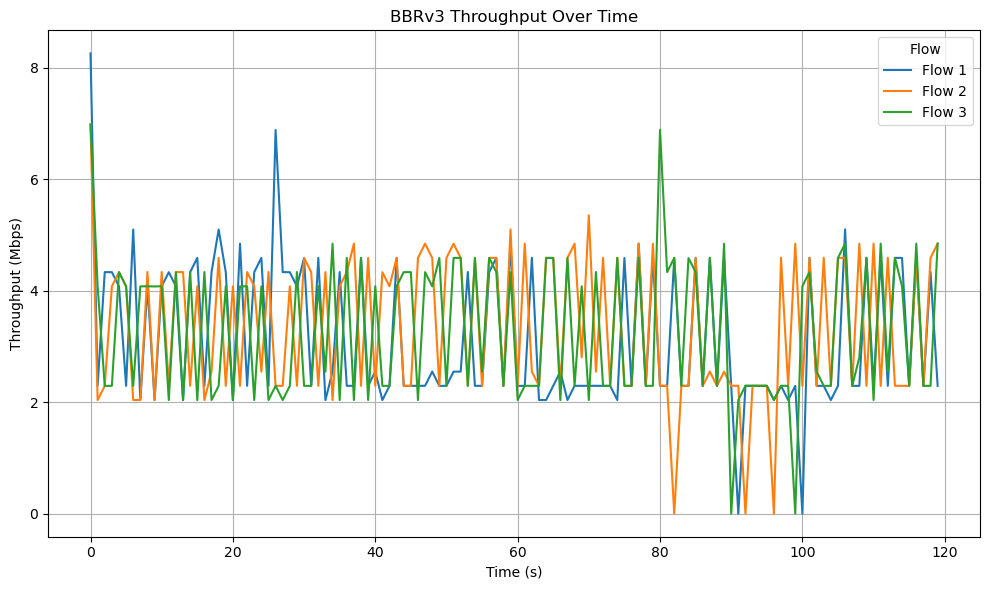

✅ Saved: /home/sit/Downloads/3 flows/plot jason3/bbrv3_plots/throughput.png


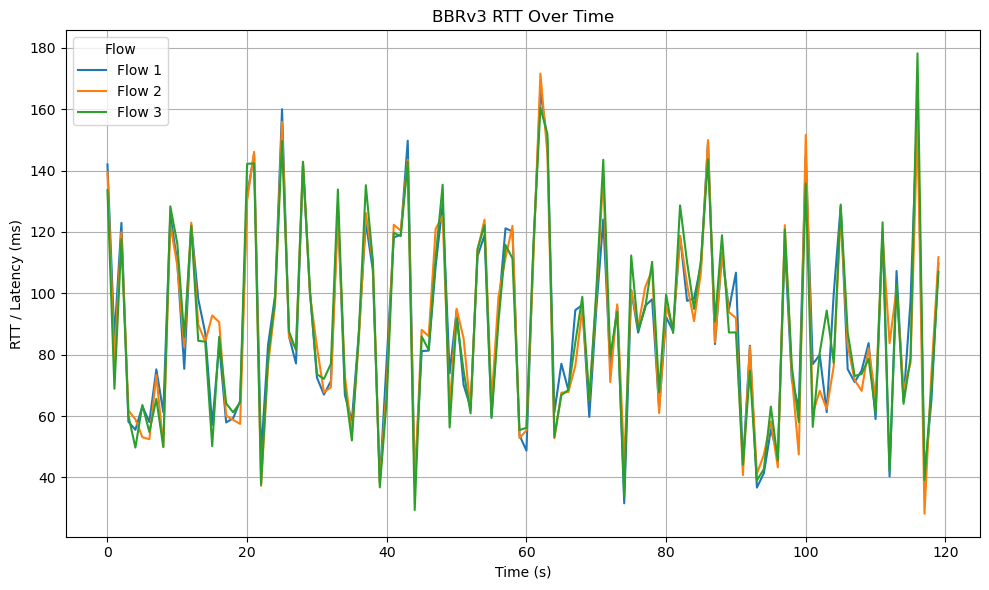

✅ Saved: /home/sit/Downloads/3 flows/plot jason3/bbrv3_plots/rtt.png


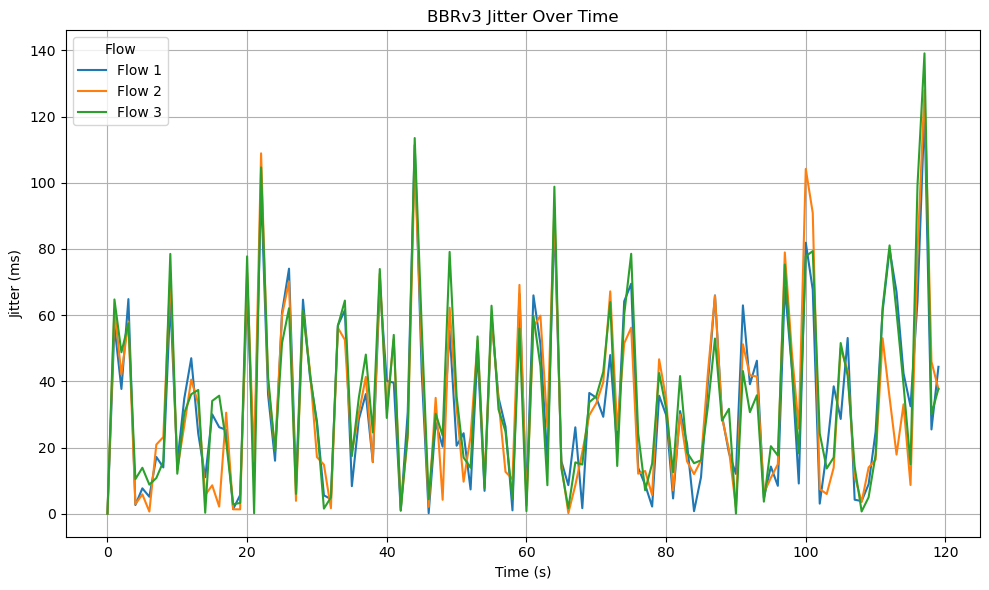

✅ Saved: /home/sit/Downloads/3 flows/plot jason3/bbrv3_plots/jitter.png


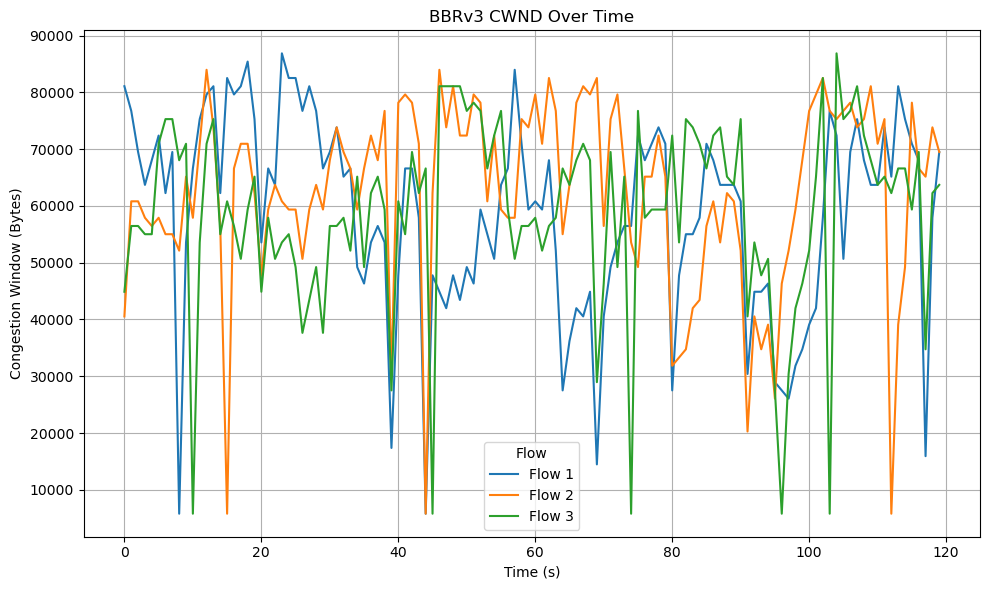

✅ Saved: /home/sit/Downloads/3 flows/plot jason3/bbrv3_plots/cwnd.png


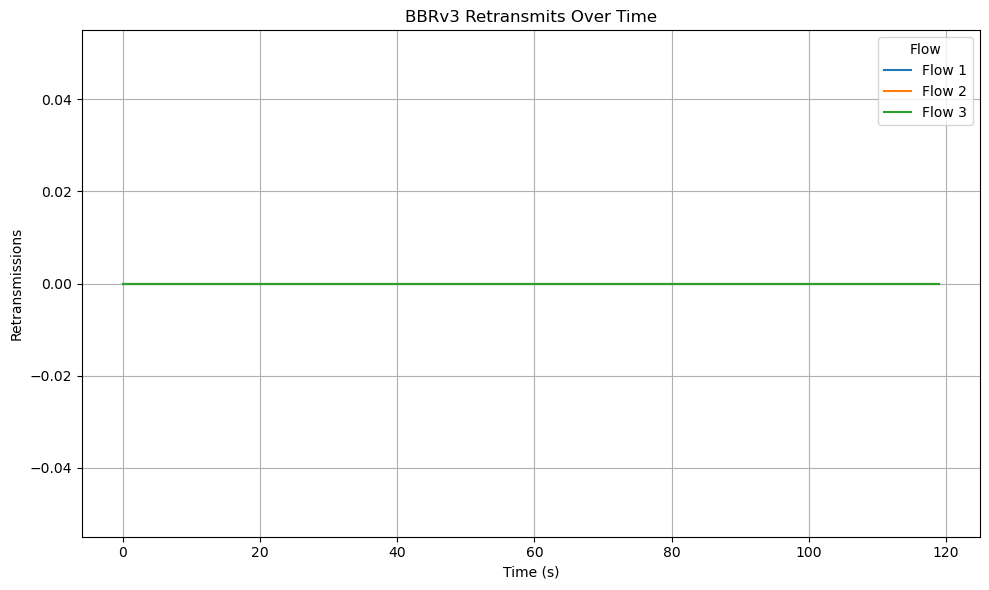

✅ Saved: /home/sit/Downloads/3 flows/plot jason3/bbrv3_plots/retransmits.png


In [28]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt

def extract_metrics(filepath, label):
    with open(filepath) as f:
        data = json.load(f)

    metrics = []
    prev_rtt_ms = None

    for i, interval in enumerate(data.get("intervals", [])):
        stream = interval["streams"][0]
        rtt_ms = stream.get("rtt", 0) / 1000  # Convert µs to ms
        jitter_ms = abs(rtt_ms - prev_rtt_ms) if prev_rtt_ms is not None else 0
        prev_rtt_ms = rtt_ms

        metrics.append({
            "time_sec": i,
            "throughput_mbps": stream.get("bits_per_second", 0) / 1e6,
            "rtt_ms": rtt_ms,
            "jitter_ms": jitter_ms,
            "cwnd_bytes": stream.get("snd_cwnd", 0),
            "retransmits": stream.get("retransmits", 0),
            "label": label
        })

    return pd.DataFrame(metrics)

def plot_metric(df, metric, ylabel, title, save_path):
    plt.figure(figsize=(10, 6))
    for label, group in df.groupby("label"):
        plt.plot(group["time_sec"], group[metric], label=label)
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(title="Flow")
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()
    plt.close()
    print(f"✅ Saved: {save_path}")
   


def process_tcp_flows(folder_path, file_pattern, output_csv_name, algo_name):
    all_data = []

    for i in range(1, 6):
        filename = file_pattern.format(i)
        filepath = os.path.join(folder_path, filename)
        label = f"Flow {i}"
        if os.path.exists(filepath):
            df = extract_metrics(filepath, label)
            all_data.append(df)
        else:
            print(f"❌ File not found: {filepath}")

    if not all_data:
        print("⚠️ No data to process.")
        return

    df_all = pd.concat(all_data, ignore_index=True)
    
    # Save CSV
    output_csv = os.path.join(folder_path, output_csv_name)
    df_all.to_csv(output_csv, index=False)
    print(f"✅ CSV saved to: {output_csv}")

    # Create directory for plots
    plot_dir = os.path.join(folder_path, f"{algo_name.lower()}_plots")
    os.makedirs(plot_dir, exist_ok=True)

    # Plot metrics
    plot_metric(df_all, "throughput_mbps", "Throughput (Mbps)", f"{algo_name} Throughput Over Time", os.path.join(plot_dir, "throughput.png"))
    plot_metric(df_all, "rtt_ms", "RTT / Latency (ms)", f"{algo_name} RTT Over Time", os.path.join(plot_dir, "rtt.png"))
    plot_metric(df_all, "jitter_ms", "Jitter (ms)", f"{algo_name} Jitter Over Time", os.path.join(plot_dir, "jitter.png"))
    plot_metric(df_all, "cwnd_bytes", "Congestion Window (Bytes)", f"{algo_name} CWND Over Time", os.path.join(plot_dir, "cwnd.png"))
    plot_metric(df_all, "retransmits", "Retransmissions", f"{algo_name} Retransmits Over Time", os.path.join(plot_dir, "retransmits.png"))

# --------------------------------------------
# ✅ To run it (for BBR):
process_tcp_flows(
    folder_path="/home/sit/Downloads/3 flows/plot jason3",
    file_pattern="bbr3_3flow{}_3.json",  # Adjust this pattern for your file names
    output_csv_name="tcp_metrics_3flows3.csv",
    algo_name="BBRv3"
)


❌ File not found: /home/sit/Downloads/2 flows/plot jason/bbr3_2flow3.json
❌ File not found: /home/sit/Downloads/2 flows/plot jason/bbr3_2flow4.json
❌ File not found: /home/sit/Downloads/2 flows/plot jason/bbr3_2flow5.json
✅ CSV saved to: /home/sit/Downloads/2 flows/plot jason/tcp_metrics_2flows.csv


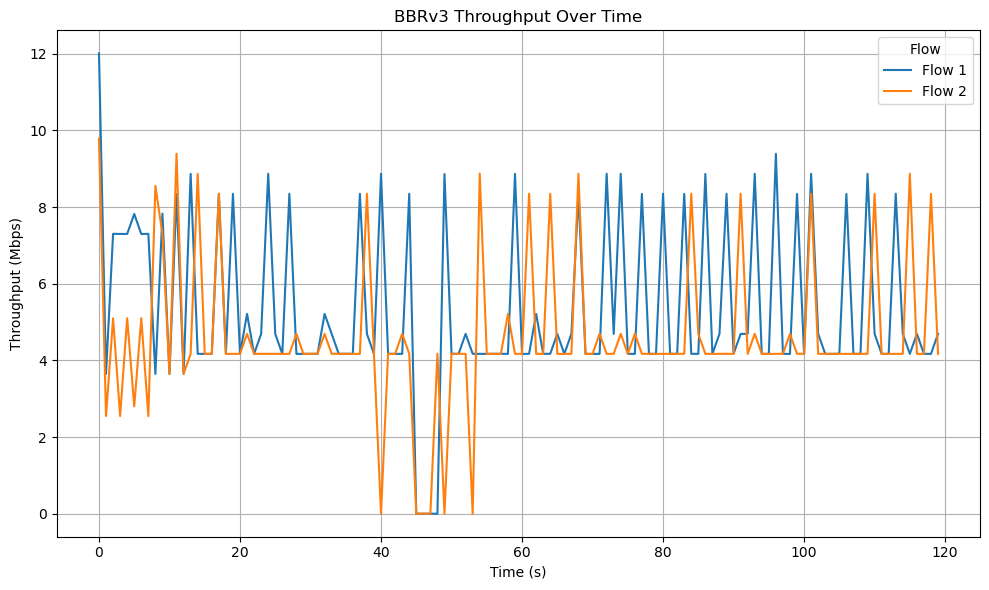

✅ Saved: /home/sit/Downloads/2 flows/plot jason/bbrv3_plots/throughput.png


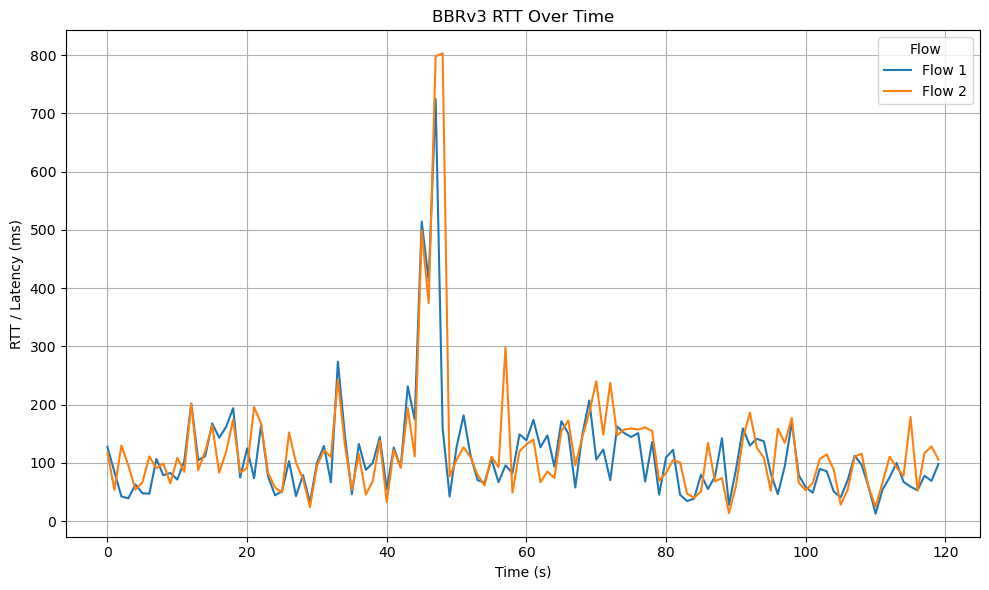

✅ Saved: /home/sit/Downloads/2 flows/plot jason/bbrv3_plots/rtt.png


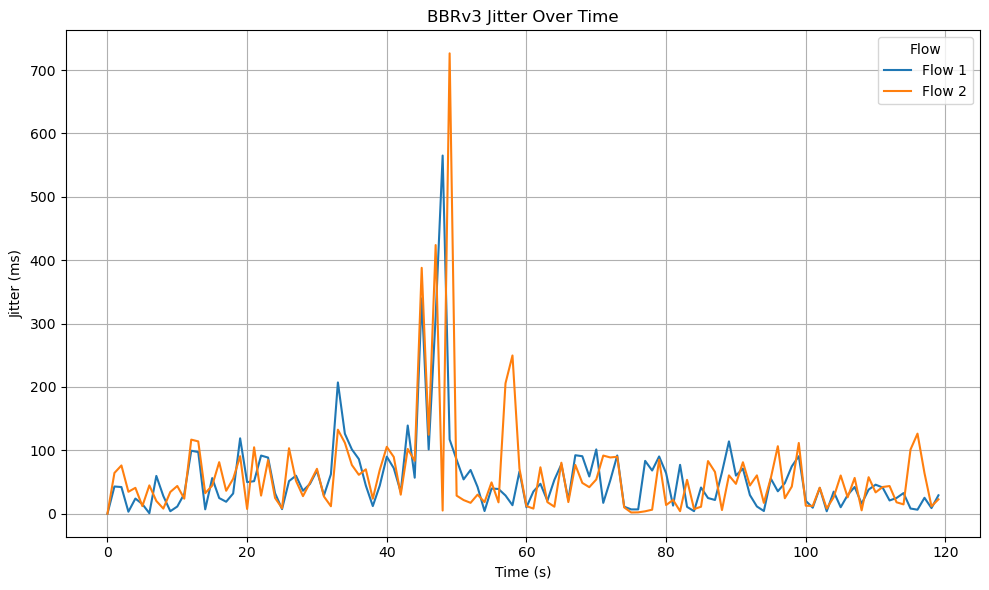

✅ Saved: /home/sit/Downloads/2 flows/plot jason/bbrv3_plots/jitter.png


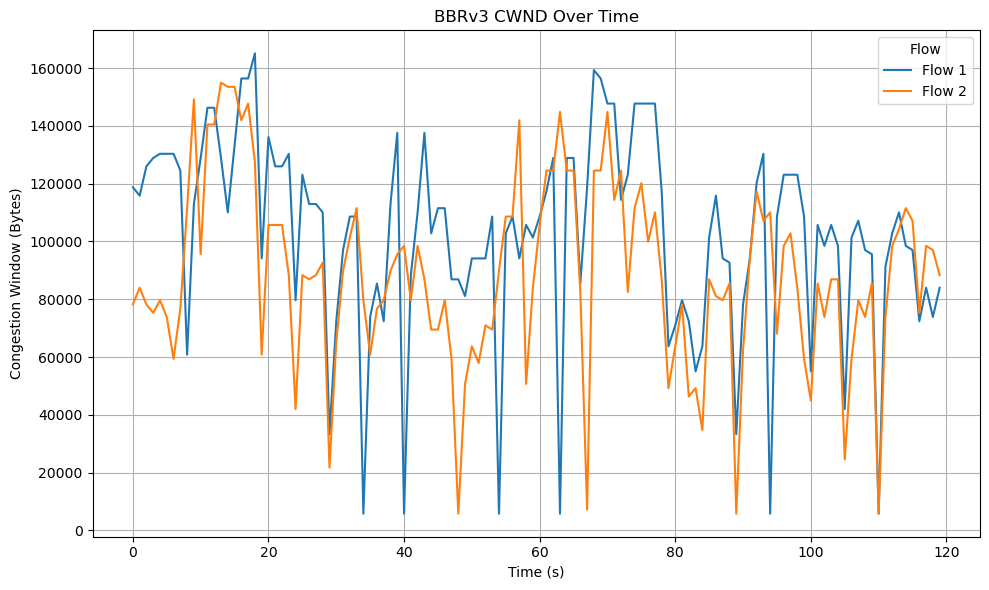

✅ Saved: /home/sit/Downloads/2 flows/plot jason/bbrv3_plots/cwnd.png


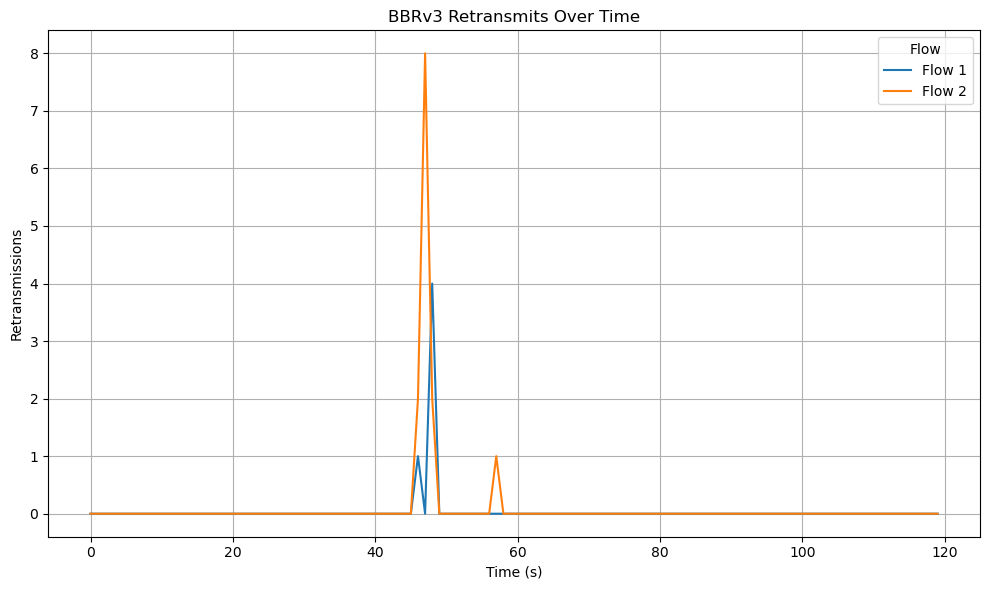

✅ Saved: /home/sit/Downloads/2 flows/plot jason/bbrv3_plots/retransmits.png


In [30]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt

def extract_metrics(filepath, label):
    with open(filepath) as f:
        data = json.load(f)

    metrics = []
    prev_rtt_ms = None

    for i, interval in enumerate(data.get("intervals", [])):
        stream = interval["streams"][0]
        rtt_ms = stream.get("rtt", 0) / 1000  # Convert µs to ms
        jitter_ms = abs(rtt_ms - prev_rtt_ms) if prev_rtt_ms is not None else 0
        prev_rtt_ms = rtt_ms

        metrics.append({
            "time_sec": i,
            "throughput_mbps": stream.get("bits_per_second", 0) / 1e6,
            "rtt_ms": rtt_ms,
            "jitter_ms": jitter_ms,
            "cwnd_bytes": stream.get("snd_cwnd", 0),
            "retransmits": stream.get("retransmits", 0),
            "label": label
        })

    return pd.DataFrame(metrics)

def plot_metric(df, metric, ylabel, title, save_path):
    plt.figure(figsize=(10, 6))
    for label, group in df.groupby("label"):
        plt.plot(group["time_sec"], group[metric], label=label)
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(title="Flow")
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()
    plt.close()
    print(f"✅ Saved: {save_path}")
   


def process_tcp_flows(folder_path, file_pattern, output_csv_name, algo_name):
    all_data = []

    for i in range(1, 6):
        filename = file_pattern.format(i)
        filepath = os.path.join(folder_path, filename)
        label = f"Flow {i}"
        if os.path.exists(filepath):
            df = extract_metrics(filepath, label)
            all_data.append(df)
        else:
            print(f"❌ File not found: {filepath}")

    if not all_data:
        print("⚠️ No data to process.")
        return

    df_all = pd.concat(all_data, ignore_index=True)
    
    # Save CSV
    output_csv = os.path.join(folder_path, output_csv_name)
    df_all.to_csv(output_csv, index=False)
    print(f"✅ CSV saved to: {output_csv}")

    # Create directory for plots
    plot_dir = os.path.join(folder_path, f"{algo_name.lower()}_plots")
    os.makedirs(plot_dir, exist_ok=True)

    # Plot metrics
    plot_metric(df_all, "throughput_mbps", "Throughput (Mbps)", f"{algo_name} Throughput Over Time", os.path.join(plot_dir, "throughput.png"))
    plot_metric(df_all, "rtt_ms", "RTT / Latency (ms)", f"{algo_name} RTT Over Time", os.path.join(plot_dir, "rtt.png"))
    plot_metric(df_all, "jitter_ms", "Jitter (ms)", f"{algo_name} Jitter Over Time", os.path.join(plot_dir, "jitter.png"))
    plot_metric(df_all, "cwnd_bytes", "Congestion Window (Bytes)", f"{algo_name} CWND Over Time", os.path.join(plot_dir, "cwnd.png"))
    plot_metric(df_all, "retransmits", "Retransmissions", f"{algo_name} Retransmits Over Time", os.path.join(plot_dir, "retransmits.png"))

# --------------------------------------------
# ✅ To run it (for BBR):
process_tcp_flows(
    folder_path="/home/sit/Downloads/2 flows/plot jason",
    file_pattern="bbr3_2flow{}.json",  # Adjust this pattern for your file names
    output_csv_name="tcp_metrics_2flows.csv",
    algo_name="BBRv3"
)


❌ File not found: /home/sit/Downloads/2 flows/plot jason1/bbr3_2flow3_1.json
❌ File not found: /home/sit/Downloads/2 flows/plot jason1/bbr3_2flow4_1.json
❌ File not found: /home/sit/Downloads/2 flows/plot jason1/bbr3_2flow5_1.json
✅ CSV saved to: /home/sit/Downloads/2 flows/plot jason1/tcp_metrics_2flows1.csv


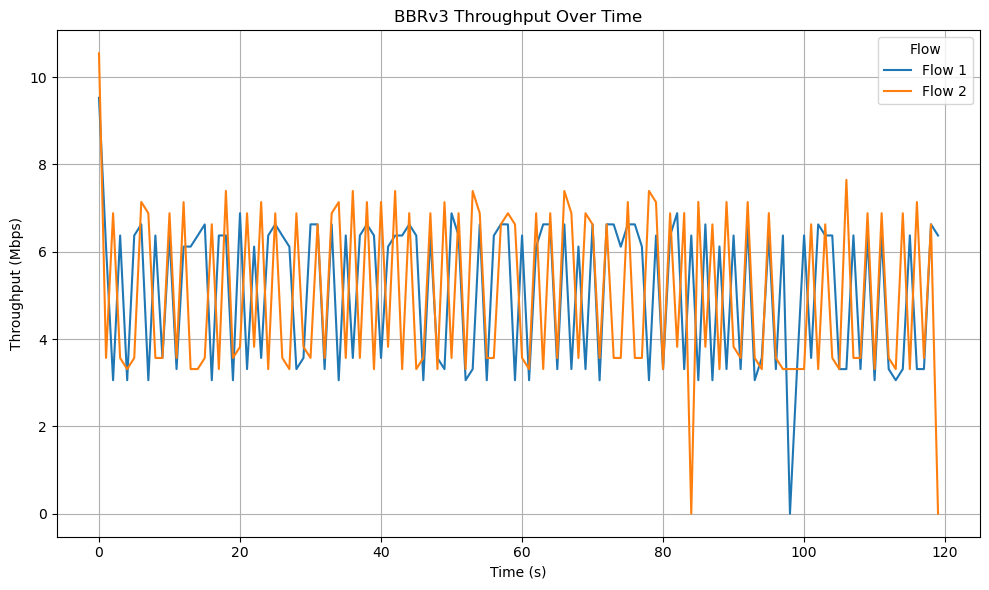

✅ Saved: /home/sit/Downloads/2 flows/plot jason1/bbrv3_plots/throughput.png


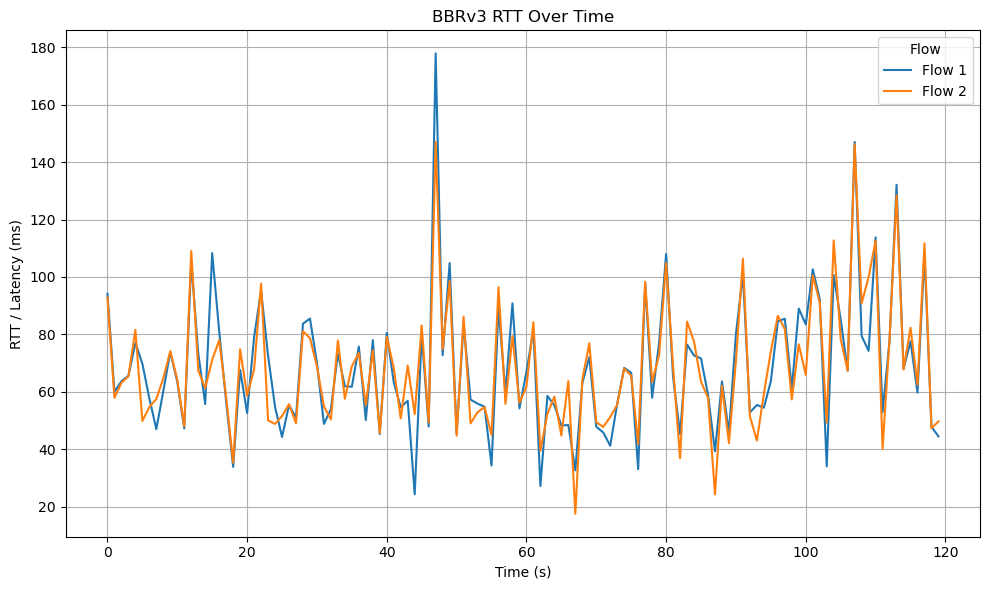

✅ Saved: /home/sit/Downloads/2 flows/plot jason1/bbrv3_plots/rtt.png


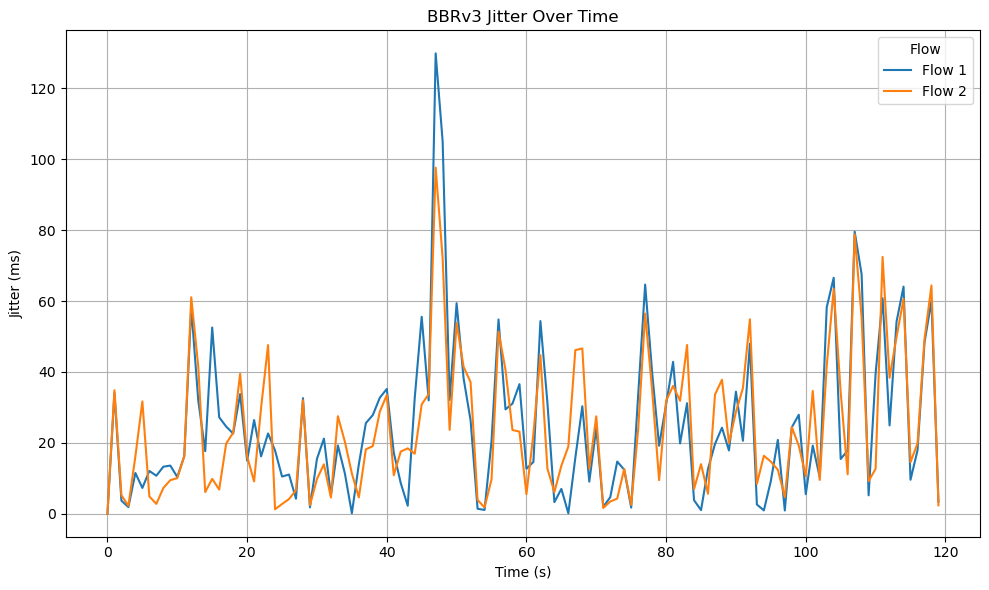

✅ Saved: /home/sit/Downloads/2 flows/plot jason1/bbrv3_plots/jitter.png


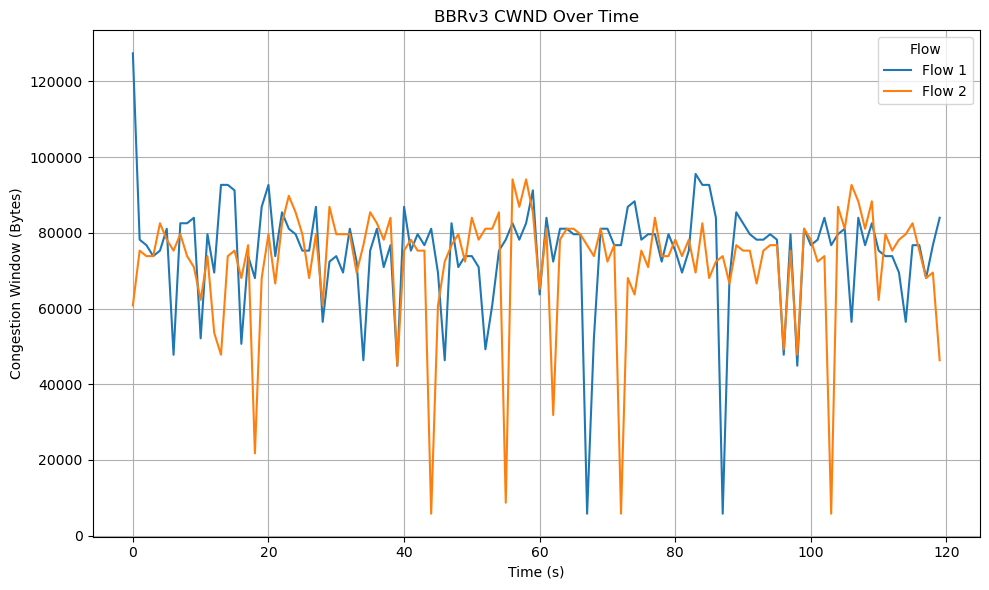

✅ Saved: /home/sit/Downloads/2 flows/plot jason1/bbrv3_plots/cwnd.png


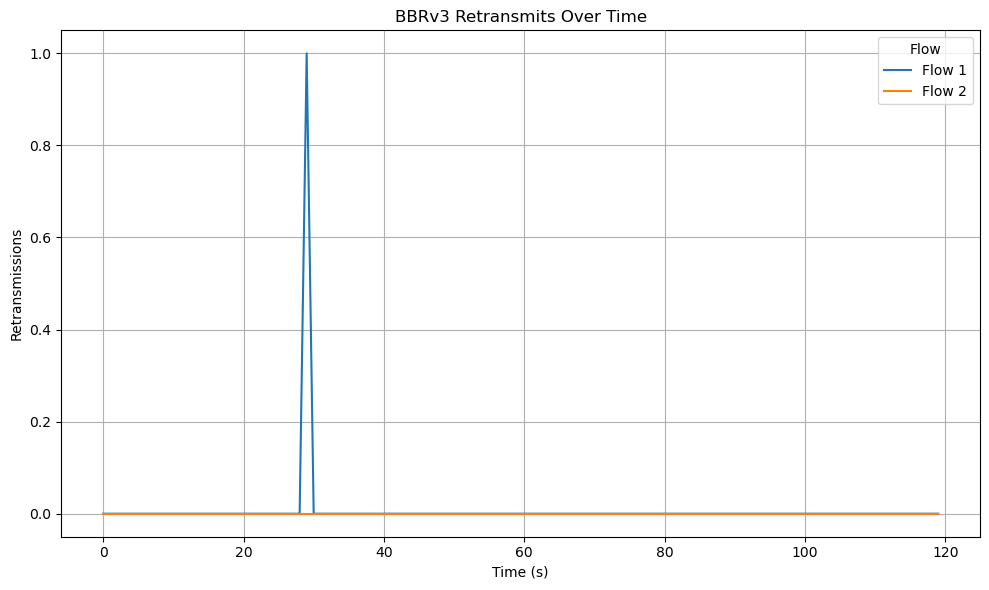

✅ Saved: /home/sit/Downloads/2 flows/plot jason1/bbrv3_plots/retransmits.png


In [31]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt

def extract_metrics(filepath, label):
    with open(filepath) as f:
        data = json.load(f)

    metrics = []
    prev_rtt_ms = None

    for i, interval in enumerate(data.get("intervals", [])):
        stream = interval["streams"][0]
        rtt_ms = stream.get("rtt", 0) / 1000  # Convert µs to ms
        jitter_ms = abs(rtt_ms - prev_rtt_ms) if prev_rtt_ms is not None else 0
        prev_rtt_ms = rtt_ms

        metrics.append({
            "time_sec": i,
            "throughput_mbps": stream.get("bits_per_second", 0) / 1e6,
            "rtt_ms": rtt_ms,
            "jitter_ms": jitter_ms,
            "cwnd_bytes": stream.get("snd_cwnd", 0),
            "retransmits": stream.get("retransmits", 0),
            "label": label
        })

    return pd.DataFrame(metrics)

def plot_metric(df, metric, ylabel, title, save_path):
    plt.figure(figsize=(10, 6))
    for label, group in df.groupby("label"):
        plt.plot(group["time_sec"], group[metric], label=label)
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(title="Flow")
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()
    plt.close()
    print(f"✅ Saved: {save_path}")
   


def process_tcp_flows(folder_path, file_pattern, output_csv_name, algo_name):
    all_data = []

    for i in range(1, 6):
        filename = file_pattern.format(i)
        filepath = os.path.join(folder_path, filename)
        label = f"Flow {i}"
        if os.path.exists(filepath):
            df = extract_metrics(filepath, label)
            all_data.append(df)
        else:
            print(f"❌ File not found: {filepath}")

    if not all_data:
        print("⚠️ No data to process.")
        return

    df_all = pd.concat(all_data, ignore_index=True)
    
    # Save CSV
    output_csv = os.path.join(folder_path, output_csv_name)
    df_all.to_csv(output_csv, index=False)
    print(f"✅ CSV saved to: {output_csv}")

    # Create directory for plots
    plot_dir = os.path.join(folder_path, f"{algo_name.lower()}_plots")
    os.makedirs(plot_dir, exist_ok=True)

    # Plot metrics
    plot_metric(df_all, "throughput_mbps", "Throughput (Mbps)", f"{algo_name} Throughput Over Time", os.path.join(plot_dir, "throughput.png"))
    plot_metric(df_all, "rtt_ms", "RTT / Latency (ms)", f"{algo_name} RTT Over Time", os.path.join(plot_dir, "rtt.png"))
    plot_metric(df_all, "jitter_ms", "Jitter (ms)", f"{algo_name} Jitter Over Time", os.path.join(plot_dir, "jitter.png"))
    plot_metric(df_all, "cwnd_bytes", "Congestion Window (Bytes)", f"{algo_name} CWND Over Time", os.path.join(plot_dir, "cwnd.png"))
    plot_metric(df_all, "retransmits", "Retransmissions", f"{algo_name} Retransmits Over Time", os.path.join(plot_dir, "retransmits.png"))

# --------------------------------------------
# ✅ To run it (for BBR):
process_tcp_flows(
    folder_path="/home/sit/Downloads/2 flows/plot jason1",
    file_pattern="bbr3_2flow{}_1.json",  # Adjust this pattern for your file names
    output_csv_name="tcp_metrics_2flows1.csv",
    algo_name="BBRv3"
)


❌ File not found: /home/sit/Downloads/2 flows/plot jason2/bbr3_2flow3_2.json
❌ File not found: /home/sit/Downloads/2 flows/plot jason2/bbr3_2flow4_2.json
❌ File not found: /home/sit/Downloads/2 flows/plot jason2/bbr3_2flow5_2.json
✅ CSV saved to: /home/sit/Downloads/2 flows/plot jason2/tcp_metrics_2flows2.csv


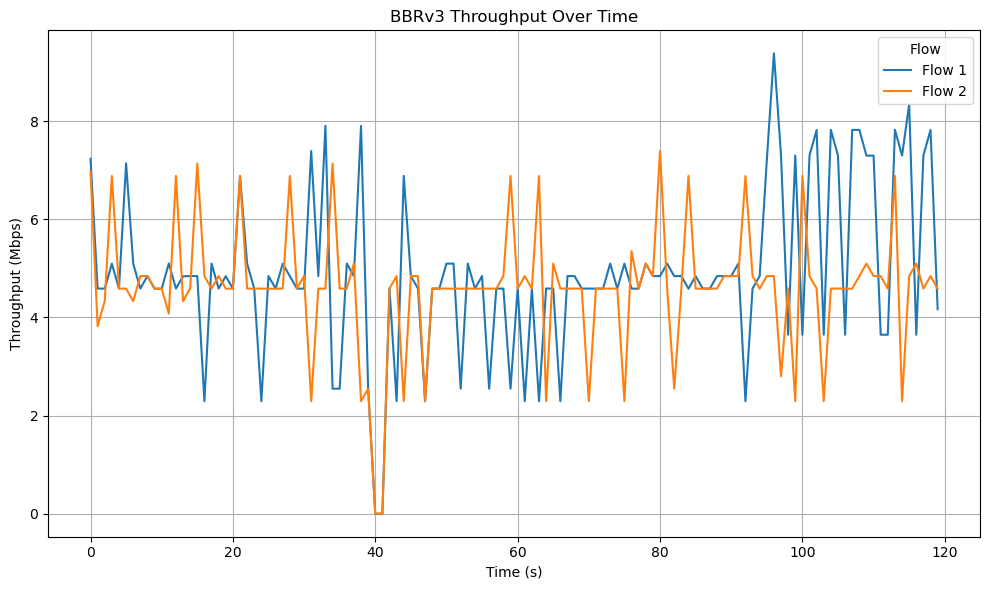

✅ Saved: /home/sit/Downloads/2 flows/plot jason2/bbrv3_plots/throughput.png


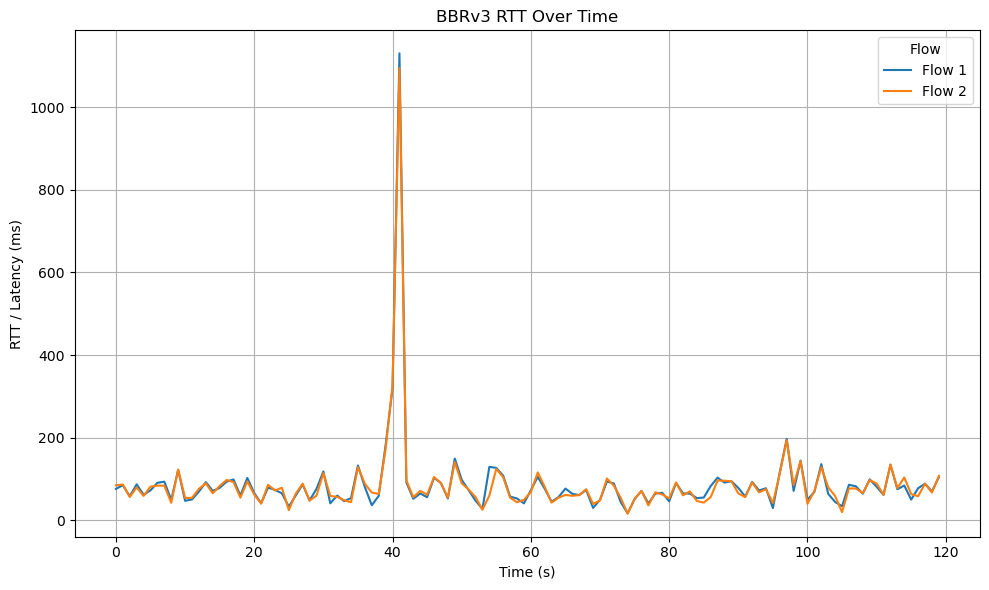

✅ Saved: /home/sit/Downloads/2 flows/plot jason2/bbrv3_plots/rtt.png


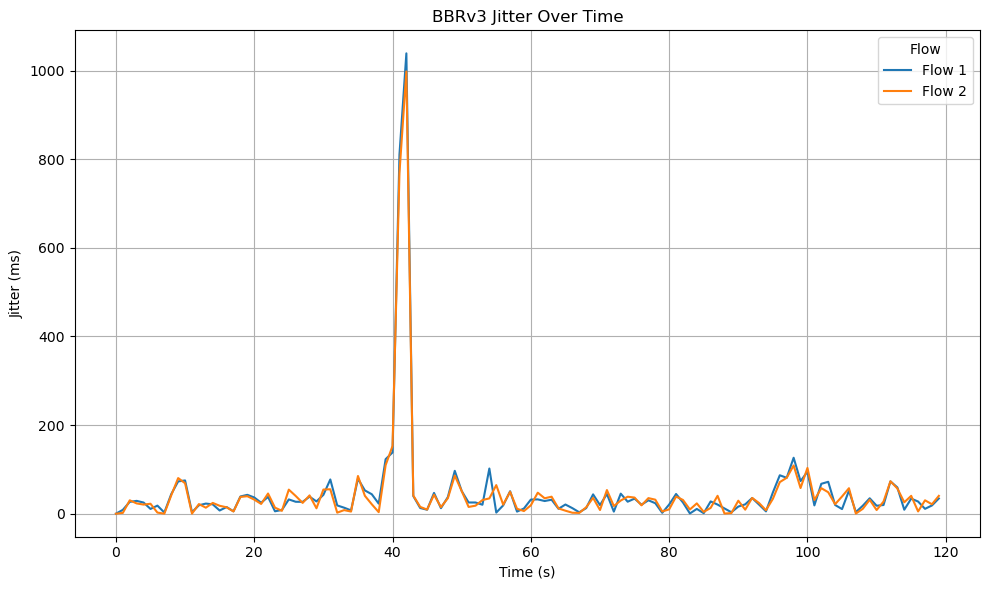

✅ Saved: /home/sit/Downloads/2 flows/plot jason2/bbrv3_plots/jitter.png


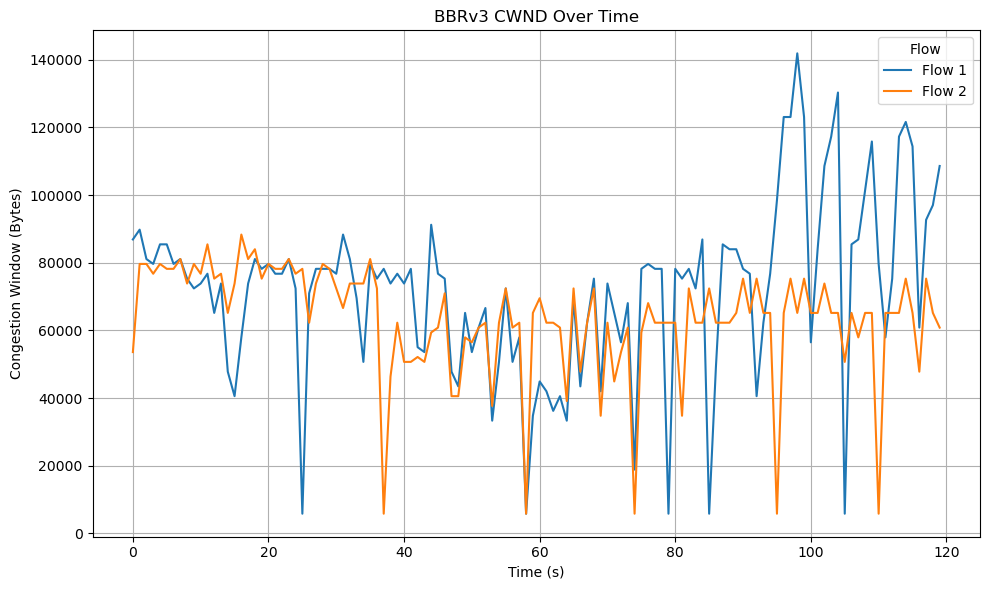

✅ Saved: /home/sit/Downloads/2 flows/plot jason2/bbrv3_plots/cwnd.png


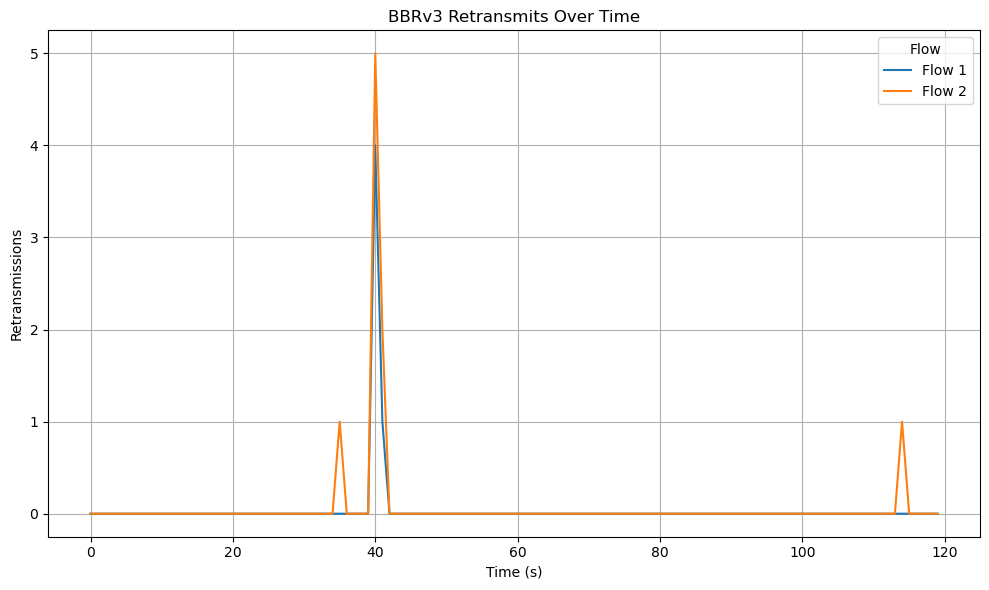

✅ Saved: /home/sit/Downloads/2 flows/plot jason2/bbrv3_plots/retransmits.png


In [32]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt

def extract_metrics(filepath, label):
    with open(filepath) as f:
        data = json.load(f)

    metrics = []
    prev_rtt_ms = None

    for i, interval in enumerate(data.get("intervals", [])):
        stream = interval["streams"][0]
        rtt_ms = stream.get("rtt", 0) / 1000  # Convert µs to ms
        jitter_ms = abs(rtt_ms - prev_rtt_ms) if prev_rtt_ms is not None else 0
        prev_rtt_ms = rtt_ms

        metrics.append({
            "time_sec": i,
            "throughput_mbps": stream.get("bits_per_second", 0) / 1e6,
            "rtt_ms": rtt_ms,
            "jitter_ms": jitter_ms,
            "cwnd_bytes": stream.get("snd_cwnd", 0),
            "retransmits": stream.get("retransmits", 0),
            "label": label
        })

    return pd.DataFrame(metrics)

def plot_metric(df, metric, ylabel, title, save_path):
    plt.figure(figsize=(10, 6))
    for label, group in df.groupby("label"):
        plt.plot(group["time_sec"], group[metric], label=label)
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(title="Flow")
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()
    plt.close()
    print(f"✅ Saved: {save_path}")
   


def process_tcp_flows(folder_path, file_pattern, output_csv_name, algo_name):
    all_data = []

    for i in range(1, 6):
        filename = file_pattern.format(i)
        filepath = os.path.join(folder_path, filename)
        label = f"Flow {i}"
        if os.path.exists(filepath):
            df = extract_metrics(filepath, label)
            all_data.append(df)
        else:
            print(f"❌ File not found: {filepath}")

    if not all_data:
        print("⚠️ No data to process.")
        return

    df_all = pd.concat(all_data, ignore_index=True)
    
    # Save CSV
    output_csv = os.path.join(folder_path, output_csv_name)
    df_all.to_csv(output_csv, index=False)
    print(f"✅ CSV saved to: {output_csv}")

    # Create directory for plots
    plot_dir = os.path.join(folder_path, f"{algo_name.lower()}_plots")
    os.makedirs(plot_dir, exist_ok=True)

    # Plot metrics
    plot_metric(df_all, "throughput_mbps", "Throughput (Mbps)", f"{algo_name} Throughput Over Time", os.path.join(plot_dir, "throughput.png"))
    plot_metric(df_all, "rtt_ms", "RTT / Latency (ms)", f"{algo_name} RTT Over Time", os.path.join(plot_dir, "rtt.png"))
    plot_metric(df_all, "jitter_ms", "Jitter (ms)", f"{algo_name} Jitter Over Time", os.path.join(plot_dir, "jitter.png"))
    plot_metric(df_all, "cwnd_bytes", "Congestion Window (Bytes)", f"{algo_name} CWND Over Time", os.path.join(plot_dir, "cwnd.png"))
    plot_metric(df_all, "retransmits", "Retransmissions", f"{algo_name} Retransmits Over Time", os.path.join(plot_dir, "retransmits.png"))

# --------------------------------------------
# ✅ To run it (for BBR):
process_tcp_flows(
    folder_path="/home/sit/Downloads/2 flows/plot jason2",
    file_pattern="bbr3_2flow{}_2.json",  # Adjust this pattern for your file names
    output_csv_name="tcp_metrics_2flows2.csv",
    algo_name="BBRv3"
)


❌ File not found: /home/sit/Downloads/single flow/plot jason/bbr3_1flow2.json
❌ File not found: /home/sit/Downloads/single flow/plot jason/bbr3_1flow3.json
❌ File not found: /home/sit/Downloads/single flow/plot jason/bbr3_1flow4.json
❌ File not found: /home/sit/Downloads/single flow/plot jason/bbr3_1flow5.json
✅ CSV saved to: /home/sit/Downloads/single flow/plot jason/tcp_metrics_ single flows.csv


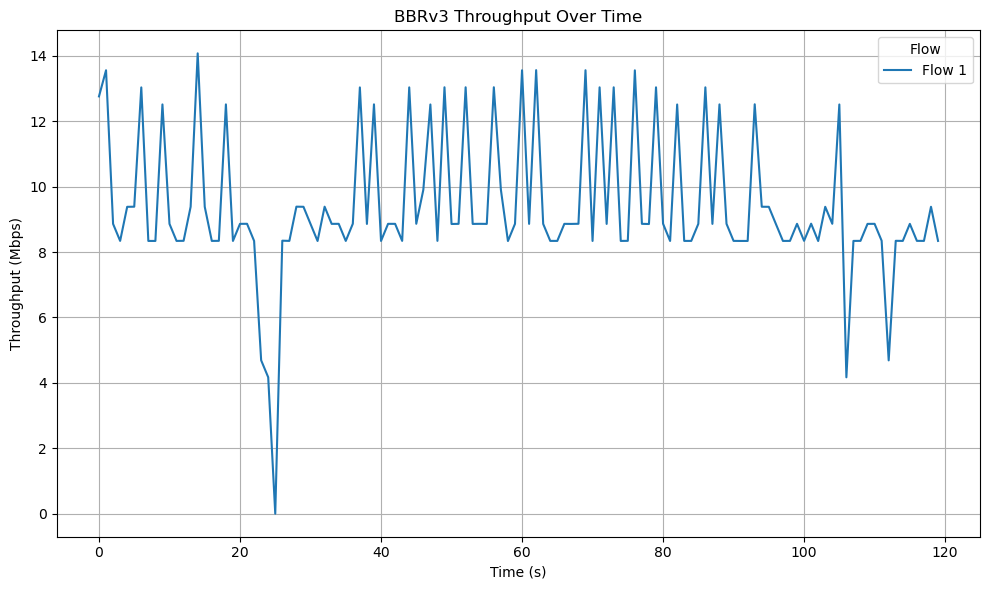

✅ Saved: /home/sit/Downloads/single flow/plot jason/bbrv3_plots/throughput.png


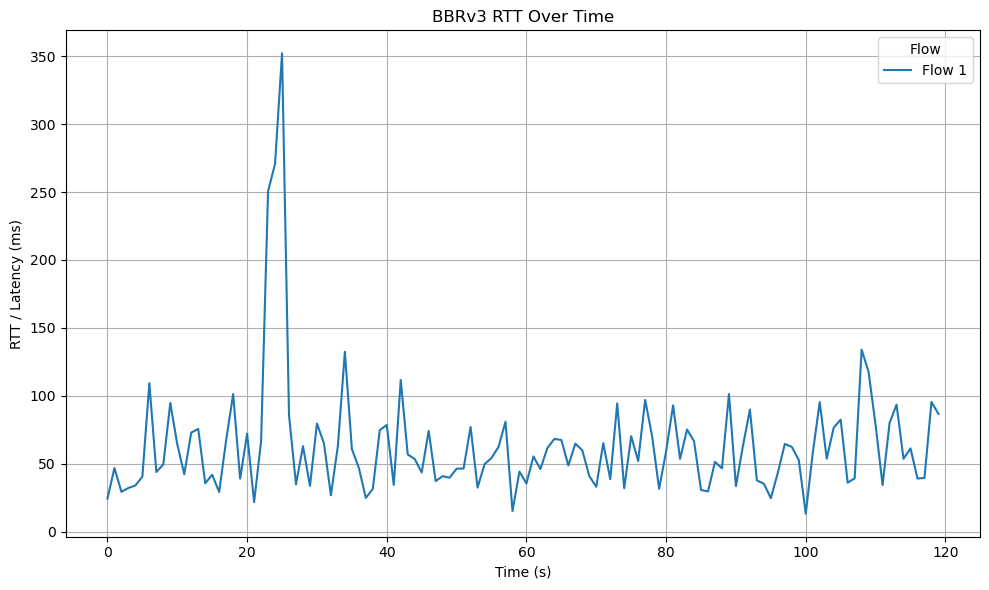

✅ Saved: /home/sit/Downloads/single flow/plot jason/bbrv3_plots/rtt.png


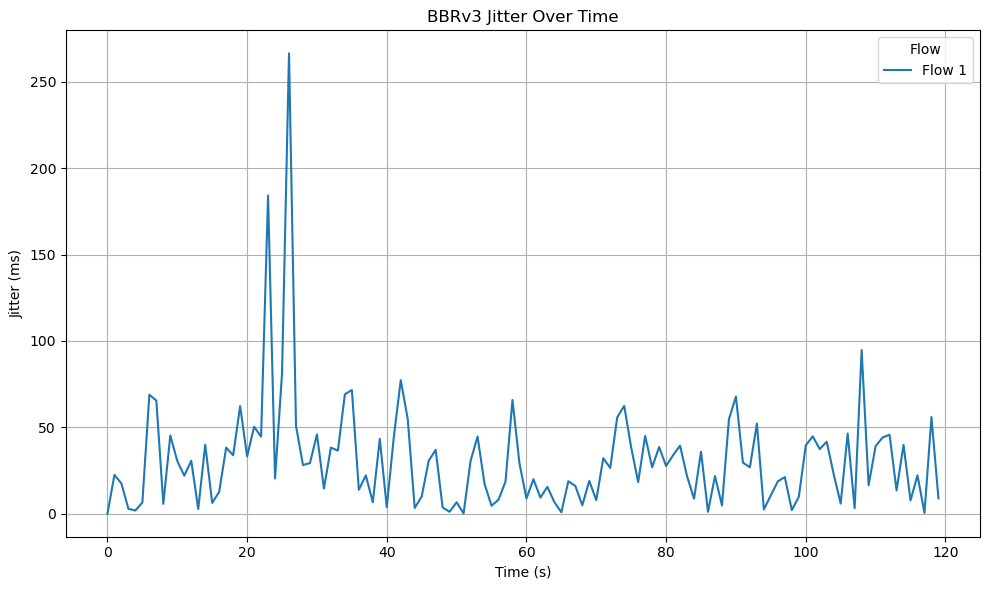

✅ Saved: /home/sit/Downloads/single flow/plot jason/bbrv3_plots/jitter.png


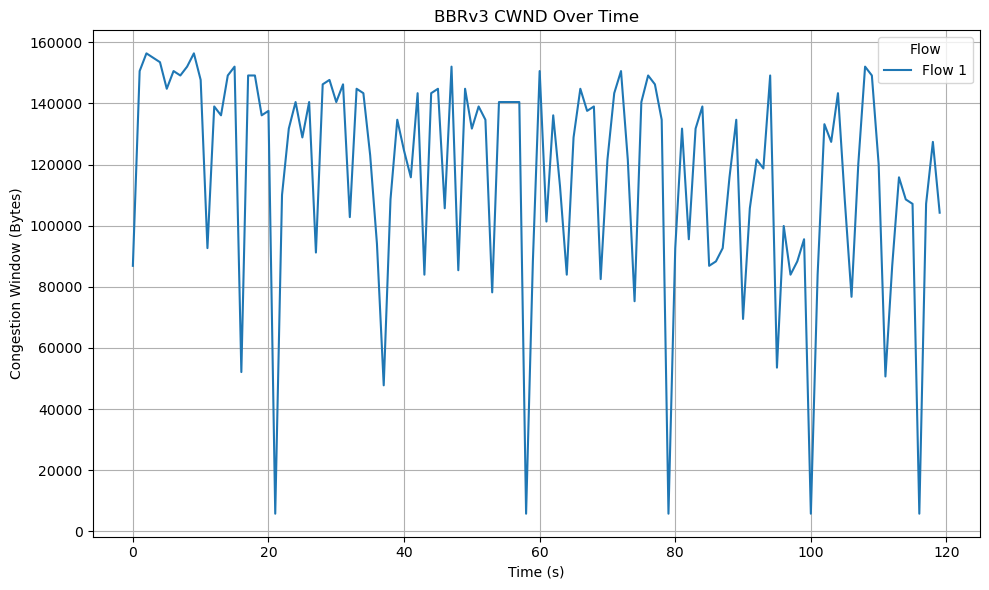

✅ Saved: /home/sit/Downloads/single flow/plot jason/bbrv3_plots/cwnd.png


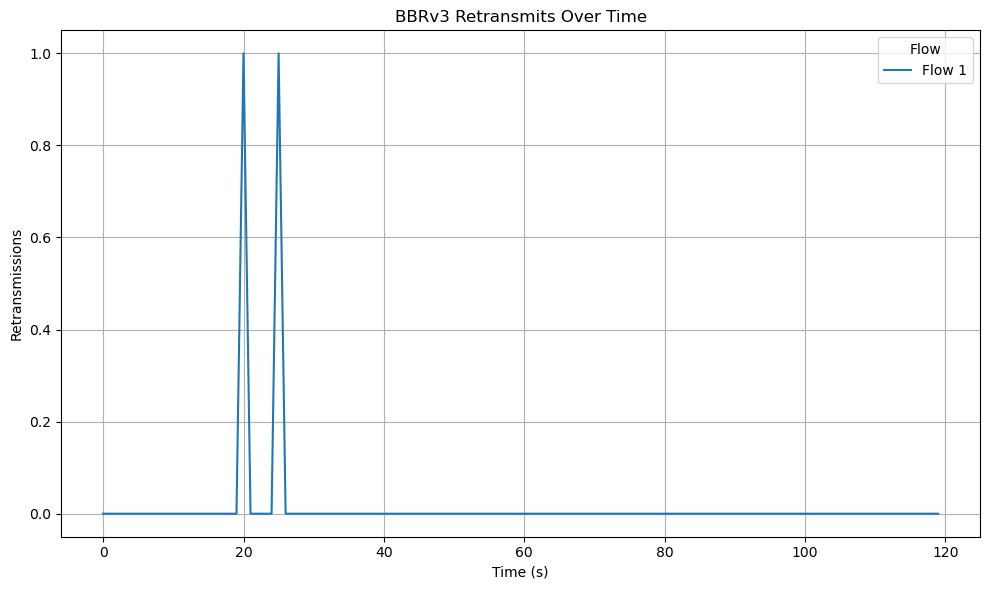

✅ Saved: /home/sit/Downloads/single flow/plot jason/bbrv3_plots/retransmits.png


In [39]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt

def extract_metrics(filepath, label):
    with open(filepath) as f:
        data = json.load(f)

    metrics = []
    prev_rtt_ms = None

    for i, interval in enumerate(data.get("intervals", [])):
        stream = interval["streams"][0]
        rtt_ms = stream.get("rtt", 0) / 1000  # Convert µs to ms
        jitter_ms = abs(rtt_ms - prev_rtt_ms) if prev_rtt_ms is not None else 0
        prev_rtt_ms = rtt_ms

        metrics.append({
            "time_sec": i,
            "throughput_mbps": stream.get("bits_per_second", 0) / 1e6,
            "rtt_ms": rtt_ms,
            "jitter_ms": jitter_ms,
            "cwnd_bytes": stream.get("snd_cwnd", 0),
            "retransmits": stream.get("retransmits", 0),
            "label": label
        })

    return pd.DataFrame(metrics)

def plot_metric(df, metric, ylabel, title, save_path):
    plt.figure(figsize=(10, 6))
    for label, group in df.groupby("label"):
        plt.plot(group["time_sec"], group[metric], label=label)
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(title="Flow")
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()
    plt.close()
    print(f"✅ Saved: {save_path}")
   


def process_tcp_flows(folder_path, file_pattern, output_csv_name, algo_name):
    all_data = []

    for i in range(1, 6):
        filename = file_pattern.format(i)
        filepath = os.path.join(folder_path, filename)
        label = f"Flow {i}"
        if os.path.exists(filepath):
            df = extract_metrics(filepath, label)
            all_data.append(df)
        else:
            print(f"❌ File not found: {filepath}")

    if not all_data:
        print("⚠️ No data to process.")
        return

    df_all = pd.concat(all_data, ignore_index=True)
    
    # Save CSV
    output_csv = os.path.join(folder_path, output_csv_name)
    df_all.to_csv(output_csv, index=False)
    print(f"✅ CSV saved to: {output_csv}")

    # Create directory for plots
    plot_dir = os.path.join(folder_path, f"{algo_name.lower()}_plots")
    os.makedirs(plot_dir, exist_ok=True)

    # Plot metrics
    plot_metric(df_all, "throughput_mbps", "Throughput (Mbps)", f"{algo_name} Throughput Over Time", os.path.join(plot_dir, "throughput.png"))
    plot_metric(df_all, "rtt_ms", "RTT / Latency (ms)", f"{algo_name} RTT Over Time", os.path.join(plot_dir, "rtt.png"))
    plot_metric(df_all, "jitter_ms", "Jitter (ms)", f"{algo_name} Jitter Over Time", os.path.join(plot_dir, "jitter.png"))
    plot_metric(df_all, "cwnd_bytes", "Congestion Window (Bytes)", f"{algo_name} CWND Over Time", os.path.join(plot_dir, "cwnd.png"))
    plot_metric(df_all, "retransmits", "Retransmissions", f"{algo_name} Retransmits Over Time", os.path.join(plot_dir, "retransmits.png"))

# --------------------------------------------
# ✅ To run it (for BBR):
process_tcp_flows(
    folder_path="/home/sit/Downloads/single flow/plot jason",
    file_pattern="bbr3_1flow{}.json",  # Adjust this pattern for your file names
    output_csv_name="tcp_metrics_ single flows.csv",
    algo_name="BBRv3"
)


❌ File not found: /home/sit/Downloads/single flow/plot jason1/bbr3_1flow2_1.json
❌ File not found: /home/sit/Downloads/single flow/plot jason1/bbr3_1flow3_1.json
❌ File not found: /home/sit/Downloads/single flow/plot jason1/bbr3_1flow4_1.json
❌ File not found: /home/sit/Downloads/single flow/plot jason1/bbr3_1flow5_1.json
✅ CSV saved to: /home/sit/Downloads/single flow/plot jason1/tcp_metrics_ single flows1.csv


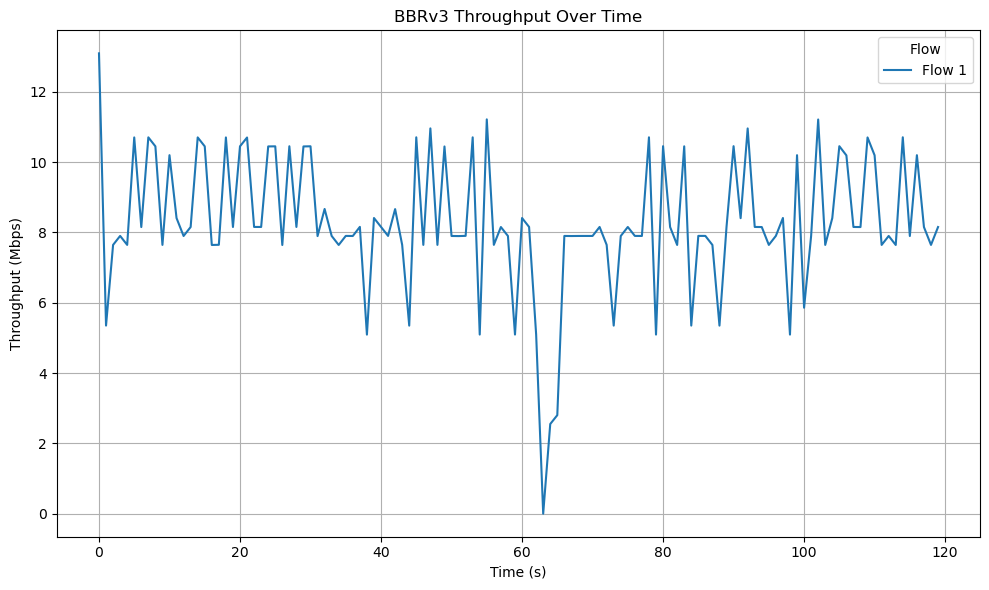

✅ Saved: /home/sit/Downloads/single flow/plot jason1/bbrv3_plots/throughput.png


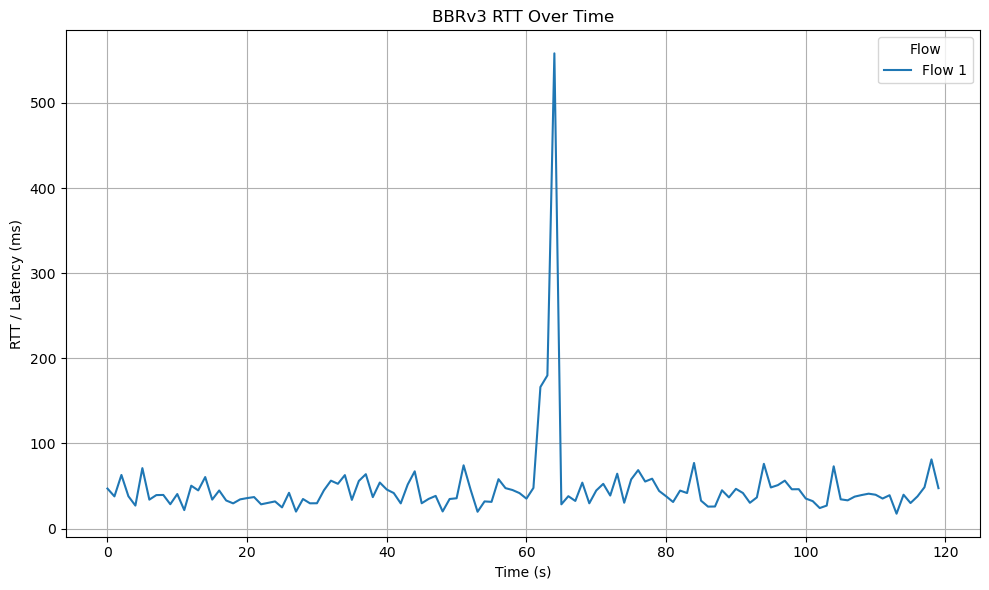

✅ Saved: /home/sit/Downloads/single flow/plot jason1/bbrv3_plots/rtt.png


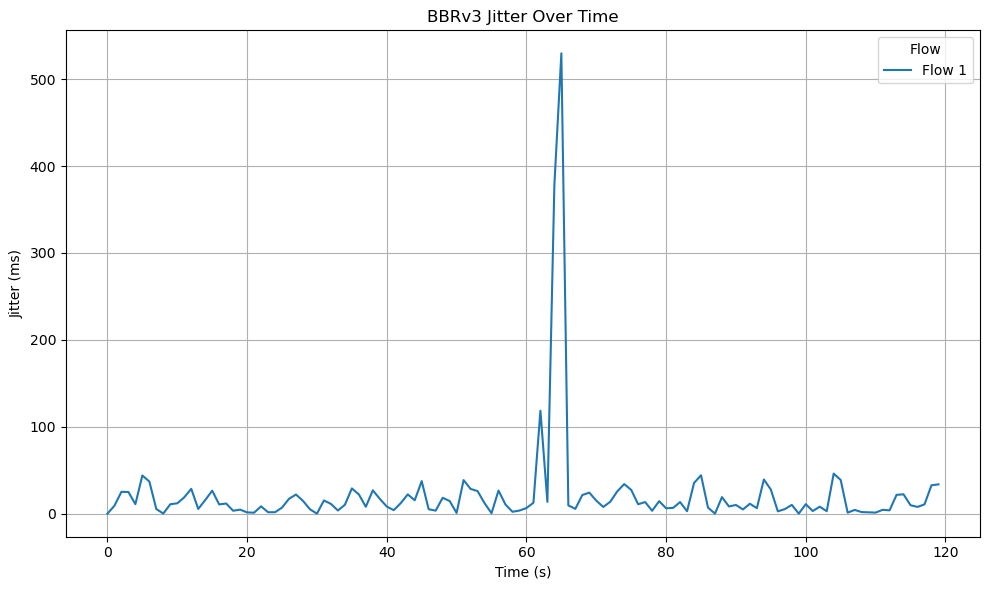

✅ Saved: /home/sit/Downloads/single flow/plot jason1/bbrv3_plots/jitter.png


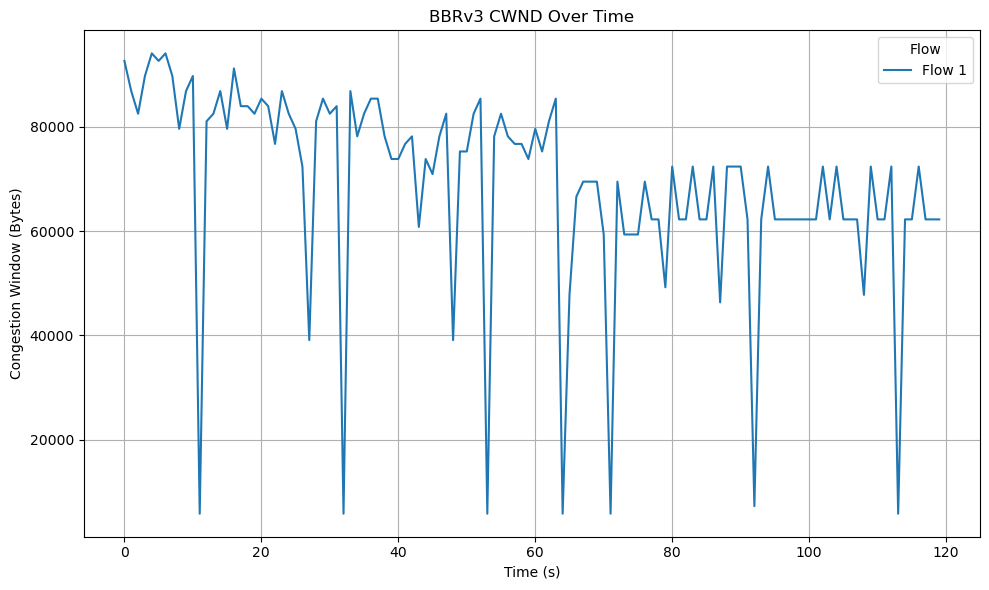

✅ Saved: /home/sit/Downloads/single flow/plot jason1/bbrv3_plots/cwnd.png


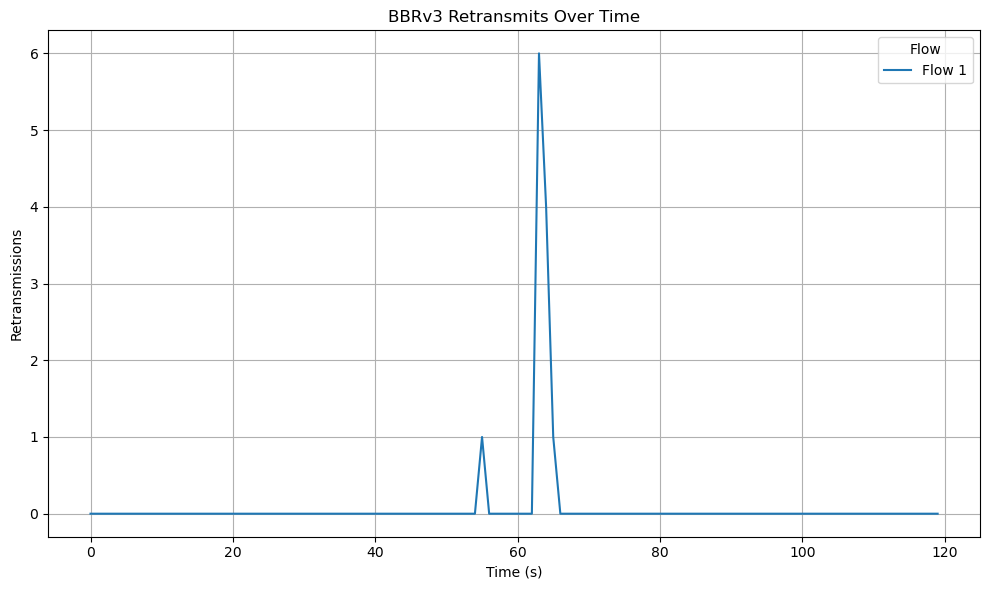

✅ Saved: /home/sit/Downloads/single flow/plot jason1/bbrv3_plots/retransmits.png


In [40]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt

def extract_metrics(filepath, label):
    with open(filepath) as f:
        data = json.load(f)

    metrics = []
    prev_rtt_ms = None

    for i, interval in enumerate(data.get("intervals", [])):
        stream = interval["streams"][0]
        rtt_ms = stream.get("rtt", 0) / 1000  # Convert µs to ms
        jitter_ms = abs(rtt_ms - prev_rtt_ms) if prev_rtt_ms is not None else 0
        prev_rtt_ms = rtt_ms

        metrics.append({
            "time_sec": i,
            "throughput_mbps": stream.get("bits_per_second", 0) / 1e6,
            "rtt_ms": rtt_ms,
            "jitter_ms": jitter_ms,
            "cwnd_bytes": stream.get("snd_cwnd", 0),
            "retransmits": stream.get("retransmits", 0),
            "label": label
        })

    return pd.DataFrame(metrics)

def plot_metric(df, metric, ylabel, title, save_path):
    plt.figure(figsize=(10, 6))
    for label, group in df.groupby("label"):
        plt.plot(group["time_sec"], group[metric], label=label)
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(title="Flow")
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()
    plt.close()
    print(f"✅ Saved: {save_path}")
   


def process_tcp_flows(folder_path, file_pattern, output_csv_name, algo_name):
    all_data = []

    for i in range(1, 6):
        filename = file_pattern.format(i)
        filepath = os.path.join(folder_path, filename)
        label = f"Flow {i}"
        if os.path.exists(filepath):
            df = extract_metrics(filepath, label)
            all_data.append(df)
        else:
            print(f"❌ File not found: {filepath}")

    if not all_data:
        print("⚠️ No data to process.")
        return

    df_all = pd.concat(all_data, ignore_index=True)
    
    # Save CSV
    output_csv = os.path.join(folder_path, output_csv_name)
    df_all.to_csv(output_csv, index=False)
    print(f"✅ CSV saved to: {output_csv}")

    # Create directory for plots
    plot_dir = os.path.join(folder_path, f"{algo_name.lower()}_plots")
    os.makedirs(plot_dir, exist_ok=True)

    # Plot metrics
    plot_metric(df_all, "throughput_mbps", "Throughput (Mbps)", f"{algo_name} Throughput Over Time", os.path.join(plot_dir, "throughput.png"))
    plot_metric(df_all, "rtt_ms", "RTT / Latency (ms)", f"{algo_name} RTT Over Time", os.path.join(plot_dir, "rtt.png"))
    plot_metric(df_all, "jitter_ms", "Jitter (ms)", f"{algo_name} Jitter Over Time", os.path.join(plot_dir, "jitter.png"))
    plot_metric(df_all, "cwnd_bytes", "Congestion Window (Bytes)", f"{algo_name} CWND Over Time", os.path.join(plot_dir, "cwnd.png"))
    plot_metric(df_all, "retransmits", "Retransmissions", f"{algo_name} Retransmits Over Time", os.path.join(plot_dir, "retransmits.png"))

# --------------------------------------------
# ✅ To run it (for BBR):
process_tcp_flows(
    folder_path="/home/sit/Downloads/single flow/plot jason1",
    file_pattern="bbr3_1flow{}_1.json",  # Adjust this pattern for your file names
    output_csv_name="tcp_metrics_ single flows1.csv",
    algo_name="BBRv3"
)


❌ File not found: /home/sit/Downloads/single flow/plot jason2/bbr3_1flow2_2.json
❌ File not found: /home/sit/Downloads/single flow/plot jason2/bbr3_1flow3_2.json
❌ File not found: /home/sit/Downloads/single flow/plot jason2/bbr3_1flow4_2.json
❌ File not found: /home/sit/Downloads/single flow/plot jason2/bbr3_1flow5_2.json
✅ CSV saved to: /home/sit/Downloads/single flow/plot jason2/tcp_metrics_ single flows2.csv


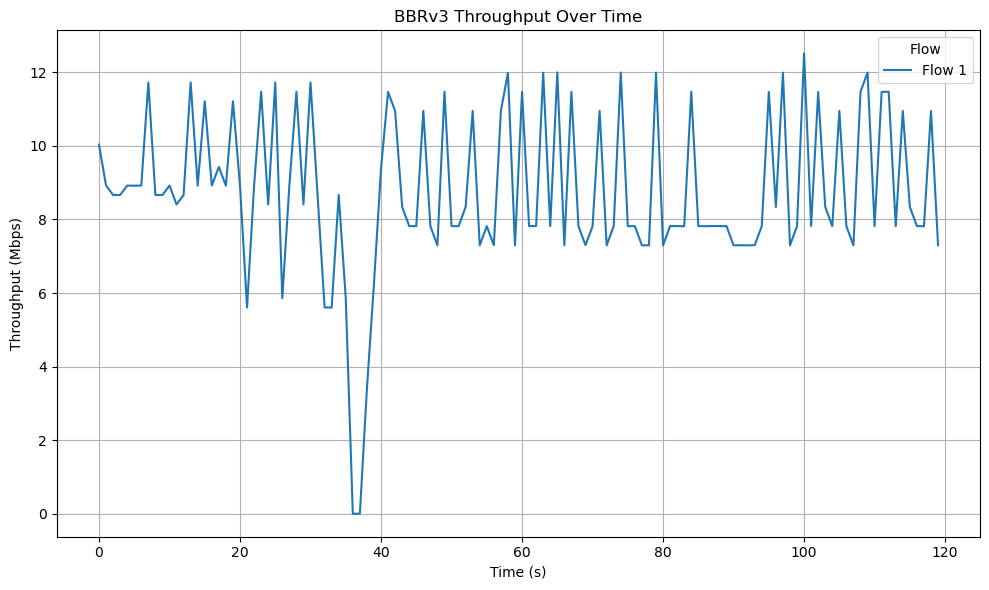

✅ Saved: /home/sit/Downloads/single flow/plot jason2/bbrv3_plots/throughput.png


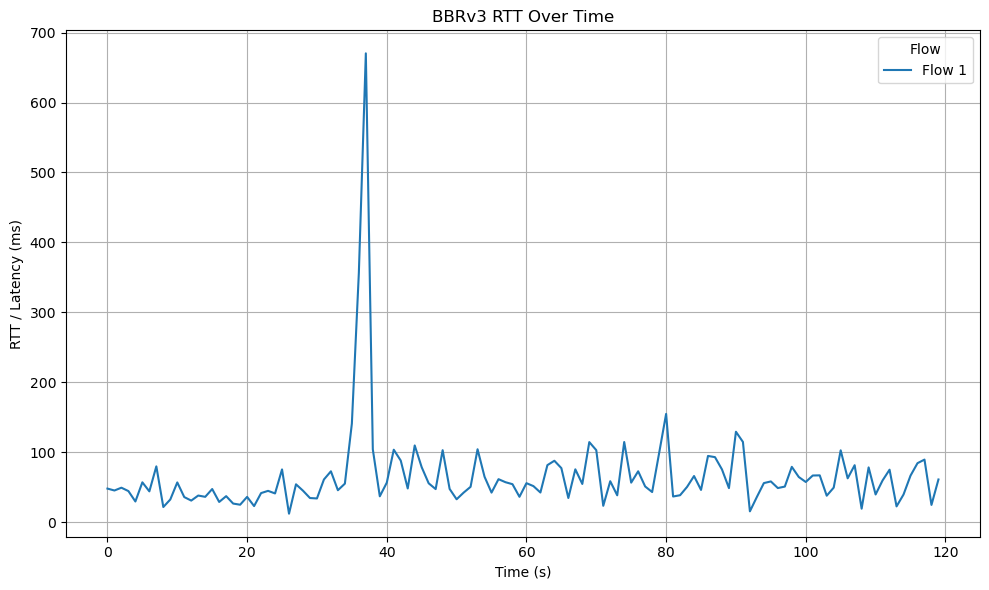

✅ Saved: /home/sit/Downloads/single flow/plot jason2/bbrv3_plots/rtt.png


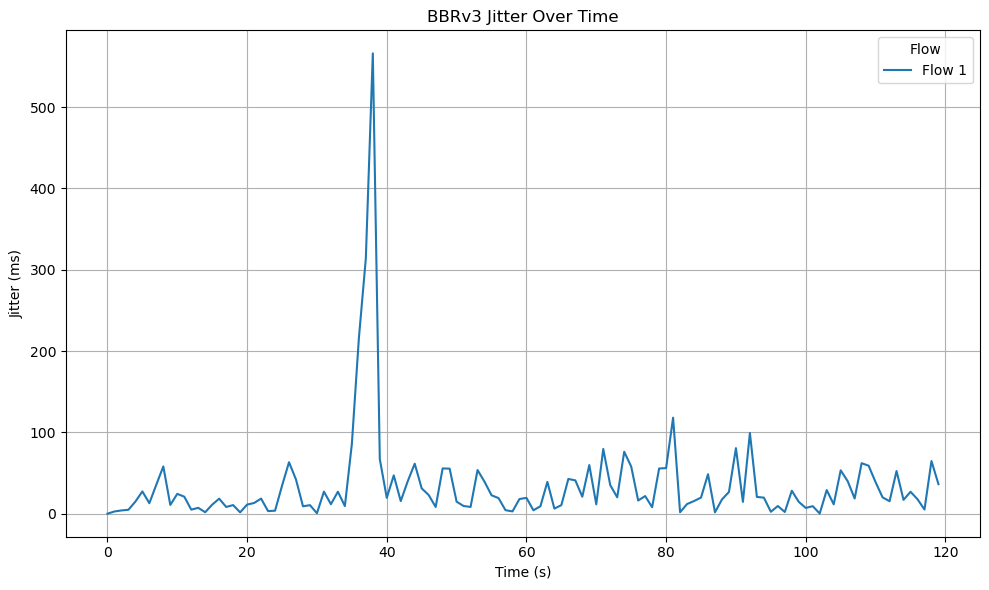

✅ Saved: /home/sit/Downloads/single flow/plot jason2/bbrv3_plots/jitter.png


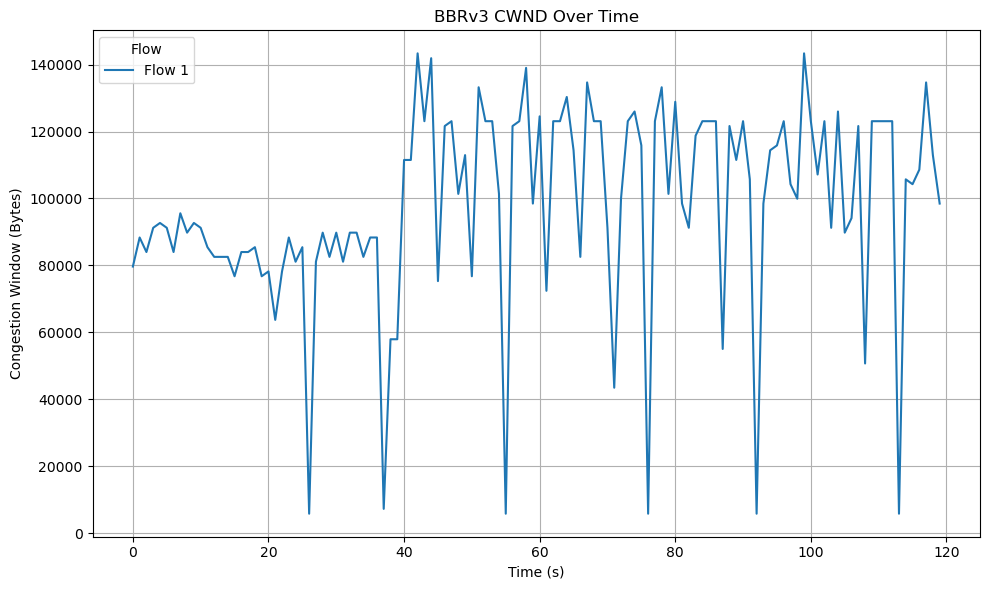

✅ Saved: /home/sit/Downloads/single flow/plot jason2/bbrv3_plots/cwnd.png


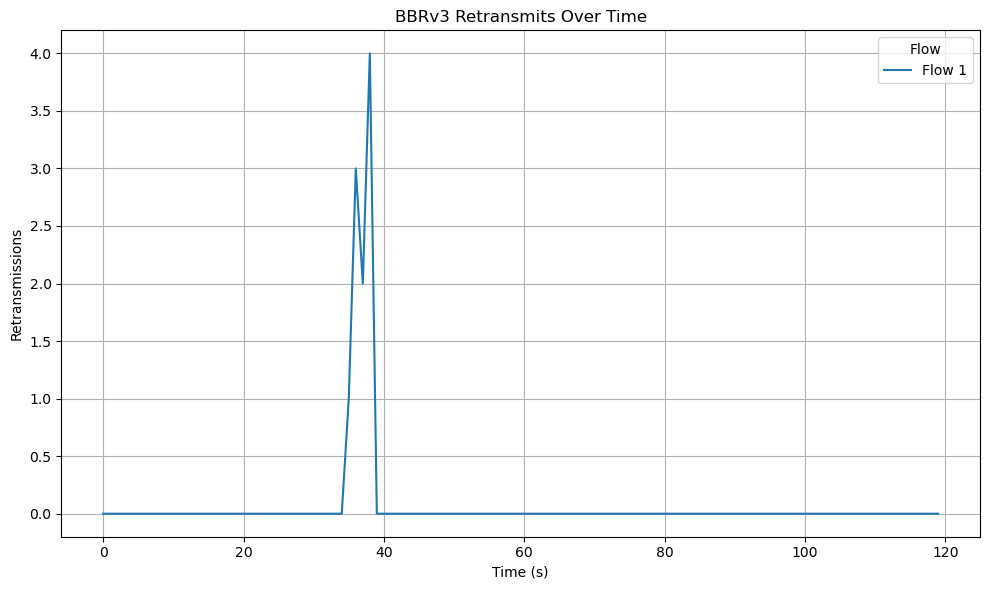

✅ Saved: /home/sit/Downloads/single flow/plot jason2/bbrv3_plots/retransmits.png


In [41]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt

def extract_metrics(filepath, label):
    with open(filepath) as f:
        data = json.load(f)

    metrics = []
    prev_rtt_ms = None

    for i, interval in enumerate(data.get("intervals", [])):
        stream = interval["streams"][0]
        rtt_ms = stream.get("rtt", 0) / 1000  # Convert µs to ms
        jitter_ms = abs(rtt_ms - prev_rtt_ms) if prev_rtt_ms is not None else 0
        prev_rtt_ms = rtt_ms

        metrics.append({
            "time_sec": i,
            "throughput_mbps": stream.get("bits_per_second", 0) / 1e6,
            "rtt_ms": rtt_ms,
            "jitter_ms": jitter_ms,
            "cwnd_bytes": stream.get("snd_cwnd", 0),
            "retransmits": stream.get("retransmits", 0),
            "label": label
        })

    return pd.DataFrame(metrics)

def plot_metric(df, metric, ylabel, title, save_path):
    plt.figure(figsize=(10, 6))
    for label, group in df.groupby("label"):
        plt.plot(group["time_sec"], group[metric], label=label)
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(title="Flow")
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()
    plt.close()
    print(f"✅ Saved: {save_path}")
   


def process_tcp_flows(folder_path, file_pattern, output_csv_name, algo_name):
    all_data = []

    for i in range(1, 6):
        filename = file_pattern.format(i)
        filepath = os.path.join(folder_path, filename)
        label = f"Flow {i}"
        if os.path.exists(filepath):
            df = extract_metrics(filepath, label)
            all_data.append(df)
        else:
            print(f"❌ File not found: {filepath}")

    if not all_data:
        print("⚠️ No data to process.")
        return

    df_all = pd.concat(all_data, ignore_index=True)
    
    # Save CSV
    output_csv = os.path.join(folder_path, output_csv_name)
    df_all.to_csv(output_csv, index=False)
    print(f"✅ CSV saved to: {output_csv}")

    # Create directory for plots
    plot_dir = os.path.join(folder_path, f"{algo_name.lower()}_plots")
    os.makedirs(plot_dir, exist_ok=True)

    # Plot metrics
    plot_metric(df_all, "throughput_mbps", "Throughput (Mbps)", f"{algo_name} Throughput Over Time", os.path.join(plot_dir, "throughput.png"))
    plot_metric(df_all, "rtt_ms", "RTT / Latency (ms)", f"{algo_name} RTT Over Time", os.path.join(plot_dir, "rtt.png"))
    plot_metric(df_all, "jitter_ms", "Jitter (ms)", f"{algo_name} Jitter Over Time", os.path.join(plot_dir, "jitter.png"))
    plot_metric(df_all, "cwnd_bytes", "Congestion Window (Bytes)", f"{algo_name} CWND Over Time", os.path.join(plot_dir, "cwnd.png"))
    plot_metric(df_all, "retransmits", "Retransmissions", f"{algo_name} Retransmits Over Time", os.path.join(plot_dir, "retransmits.png"))

# --------------------------------------------
# ✅ To run it (for BBR):
process_tcp_flows(
    folder_path="/home/sit/Downloads/single flow/plot jason2",
    file_pattern="bbr3_1flow{}_2.json",  # Adjust this pattern for your file names
    output_csv_name="tcp_metrics_ single flows2.csv",
    algo_name="BBRv3"
)


❌ File not found: /home/sit/Downloads/single flow/plot jason3/bbr3_1flow2_3.json
❌ File not found: /home/sit/Downloads/single flow/plot jason3/bbr3_1flow3_3.json
❌ File not found: /home/sit/Downloads/single flow/plot jason3/bbr3_1flow4_3.json
❌ File not found: /home/sit/Downloads/single flow/plot jason3/bbr3_1flow5_3.json
✅ CSV saved to: /home/sit/Downloads/single flow/plot jason3/tcp_metrics_ single flows3.csv


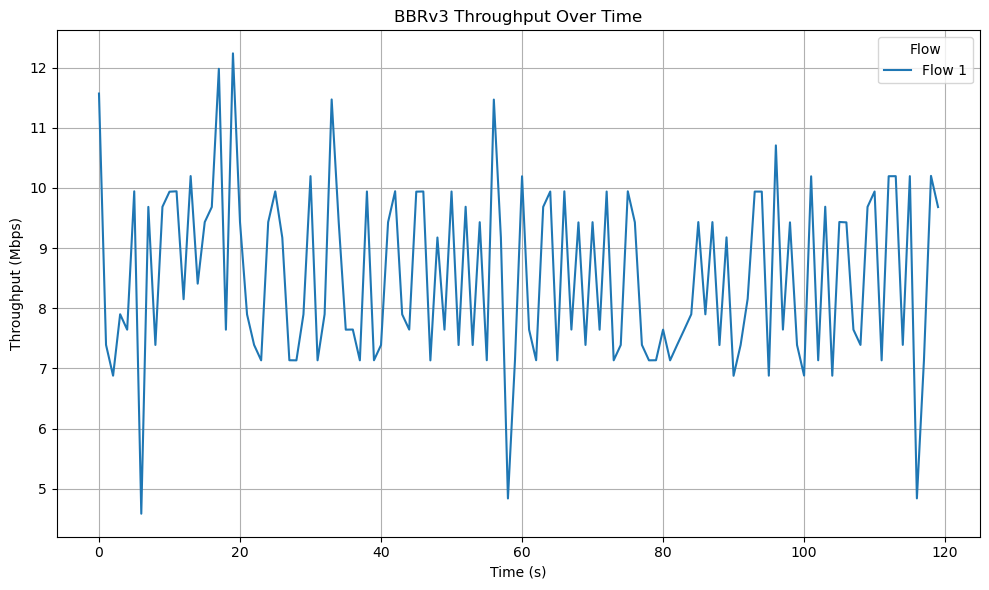

✅ Saved: /home/sit/Downloads/single flow/plot jason3/bbrv3_plots/throughput.png


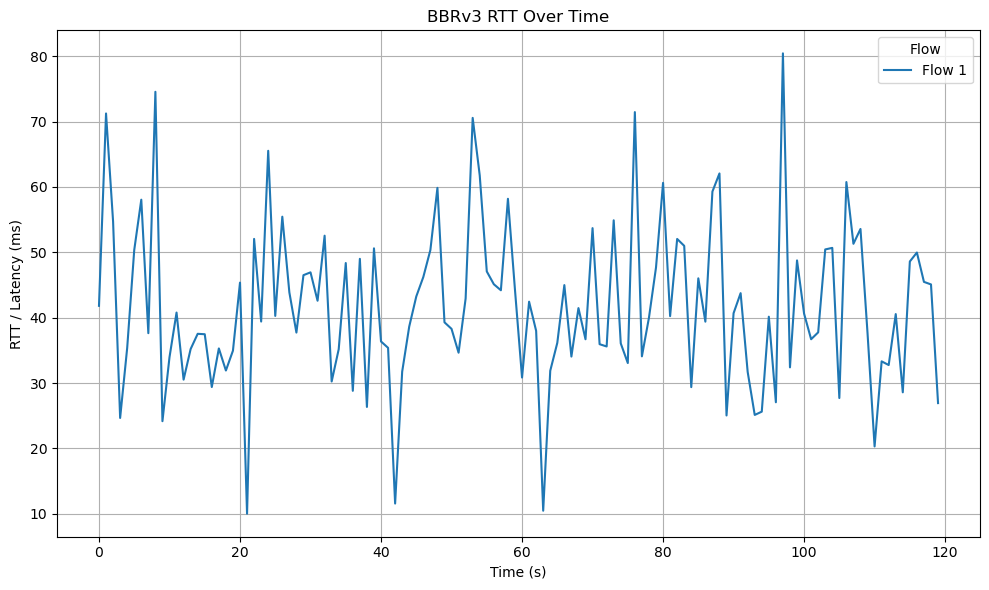

✅ Saved: /home/sit/Downloads/single flow/plot jason3/bbrv3_plots/rtt.png


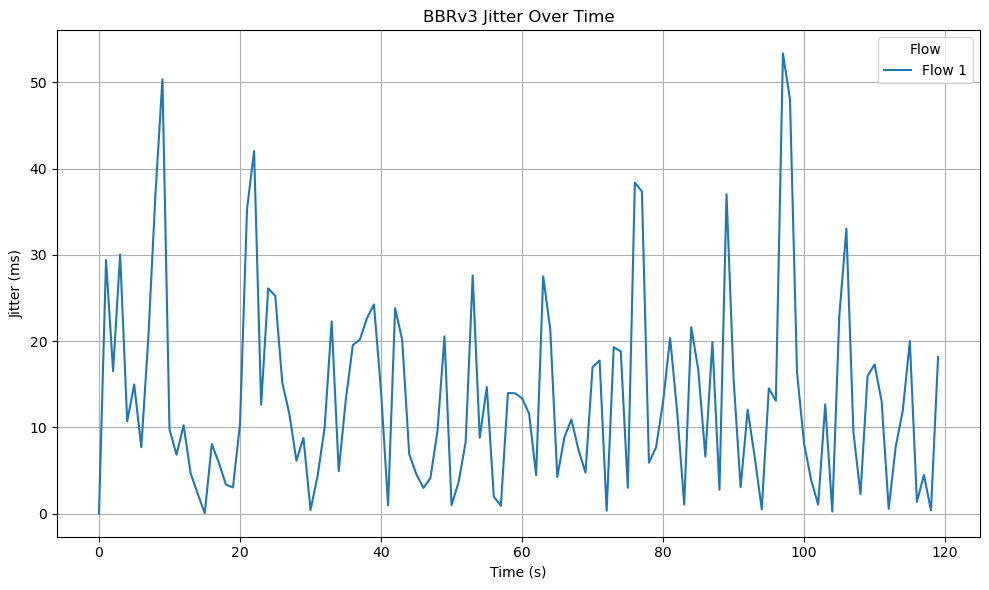

✅ Saved: /home/sit/Downloads/single flow/plot jason3/bbrv3_plots/jitter.png


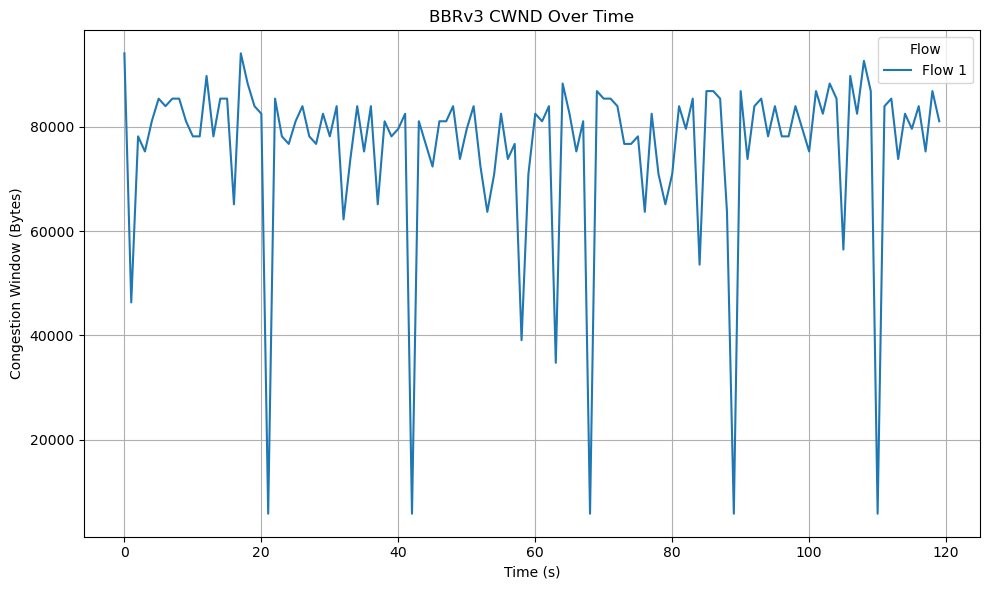

✅ Saved: /home/sit/Downloads/single flow/plot jason3/bbrv3_plots/cwnd.png


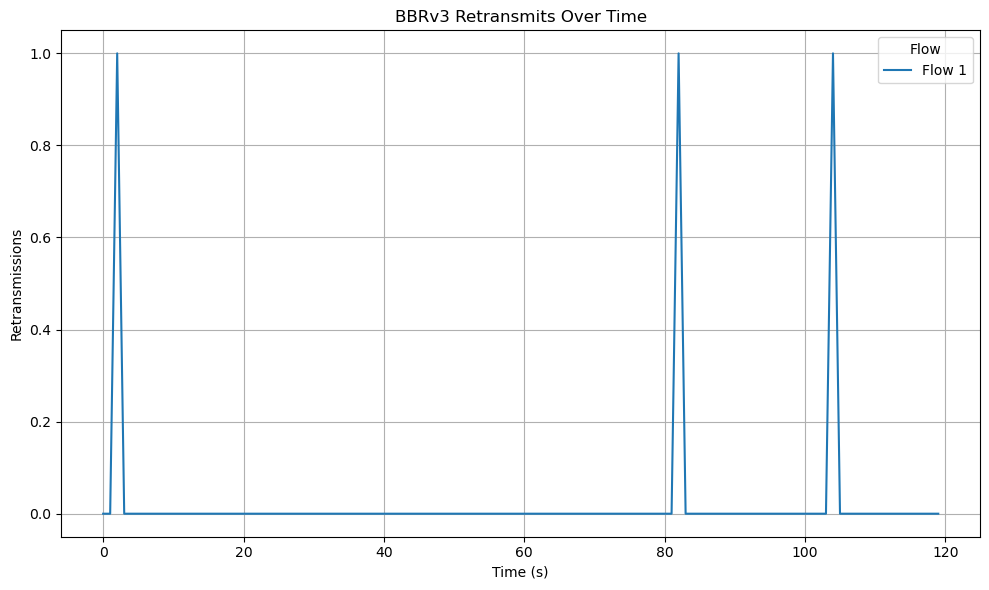

✅ Saved: /home/sit/Downloads/single flow/plot jason3/bbrv3_plots/retransmits.png


In [42]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt

def extract_metrics(filepath, label):
    with open(filepath) as f:
        data = json.load(f)

    metrics = []
    prev_rtt_ms = None

    for i, interval in enumerate(data.get("intervals", [])):
        stream = interval["streams"][0]
        rtt_ms = stream.get("rtt", 0) / 1000  # Convert µs to ms
        jitter_ms = abs(rtt_ms - prev_rtt_ms) if prev_rtt_ms is not None else 0
        prev_rtt_ms = rtt_ms

        metrics.append({
            "time_sec": i,
            "throughput_mbps": stream.get("bits_per_second", 0) / 1e6,
            "rtt_ms": rtt_ms,
            "jitter_ms": jitter_ms,
            "cwnd_bytes": stream.get("snd_cwnd", 0),
            "retransmits": stream.get("retransmits", 0),
            "label": label
        })

    return pd.DataFrame(metrics)

def plot_metric(df, metric, ylabel, title, save_path):
    plt.figure(figsize=(10, 6))
    for label, group in df.groupby("label"):
        plt.plot(group["time_sec"], group[metric], label=label)
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(title="Flow")
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()
    plt.close()
    print(f"✅ Saved: {save_path}")
   


def process_tcp_flows(folder_path, file_pattern, output_csv_name, algo_name):
    all_data = []

    for i in range(1, 6):
        filename = file_pattern.format(i)
        filepath = os.path.join(folder_path, filename)
        label = f"Flow {i}"
        if os.path.exists(filepath):
            df = extract_metrics(filepath, label)
            all_data.append(df)
        else:
            print(f"❌ File not found: {filepath}")

    if not all_data:
        print("⚠️ No data to process.")
        return

    df_all = pd.concat(all_data, ignore_index=True)
    
    # Save CSV
    output_csv = os.path.join(folder_path, output_csv_name)
    df_all.to_csv(output_csv, index=False)
    print(f"✅ CSV saved to: {output_csv}")

    # Create directory for plots
    plot_dir = os.path.join(folder_path, f"{algo_name.lower()}_plots")
    os.makedirs(plot_dir, exist_ok=True)

    # Plot metrics
    plot_metric(df_all, "throughput_mbps", "Throughput (Mbps)", f"{algo_name} Throughput Over Time", os.path.join(plot_dir, "throughput.png"))
    plot_metric(df_all, "rtt_ms", "RTT / Latency (ms)", f"{algo_name} RTT Over Time", os.path.join(plot_dir, "rtt.png"))
    plot_metric(df_all, "jitter_ms", "Jitter (ms)", f"{algo_name} Jitter Over Time", os.path.join(plot_dir, "jitter.png"))
    plot_metric(df_all, "cwnd_bytes", "Congestion Window (Bytes)", f"{algo_name} CWND Over Time", os.path.join(plot_dir, "cwnd.png"))
    plot_metric(df_all, "retransmits", "Retransmissions", f"{algo_name} Retransmits Over Time", os.path.join(plot_dir, "retransmits.png"))

# --------------------------------------------
# ✅ To run it (for BBR):
process_tcp_flows(
    folder_path="/home/sit/Downloads/single flow/plot jason3",
    file_pattern="bbr3_1flow{}_3.json",  # Adjust this pattern for your file names
    output_csv_name="tcp_metrics_ single flows3.csv",
    algo_name="BBRv3"
)


❌ File not found: /home/sit/Downloads/single flow/plot jason4/bbr3_1flow2_4.json
❌ File not found: /home/sit/Downloads/single flow/plot jason4/bbr3_1flow3_4.json
❌ File not found: /home/sit/Downloads/single flow/plot jason4/bbr3_1flow4_4.json
❌ File not found: /home/sit/Downloads/single flow/plot jason4/bbr3_1flow5_4.json
✅ CSV saved to: /home/sit/Downloads/single flow/plot jason4/tcp_metrics_ single flows4.csv


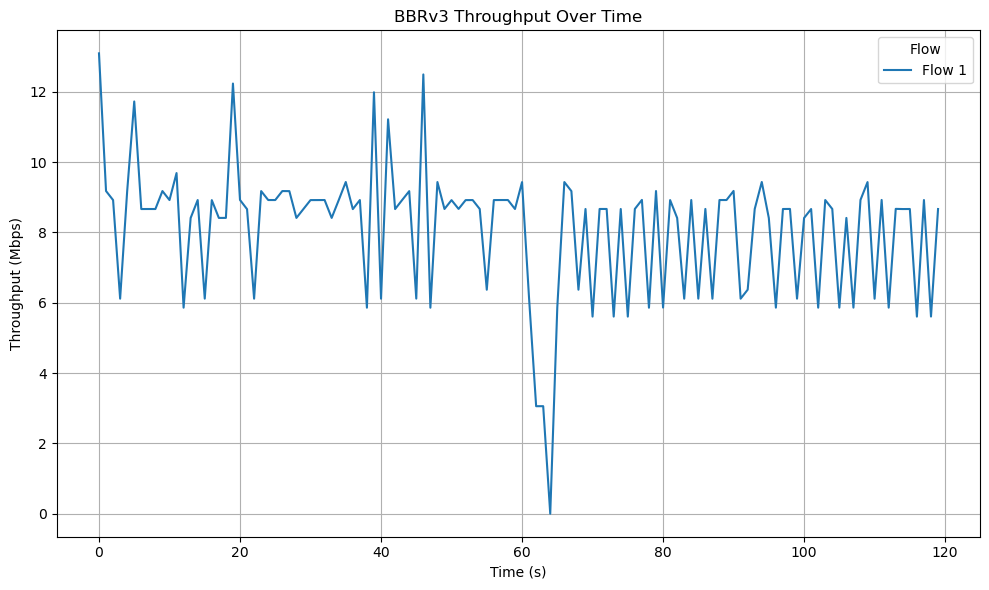

✅ Saved: /home/sit/Downloads/single flow/plot jason4/bbrv3_plots/throughput.png


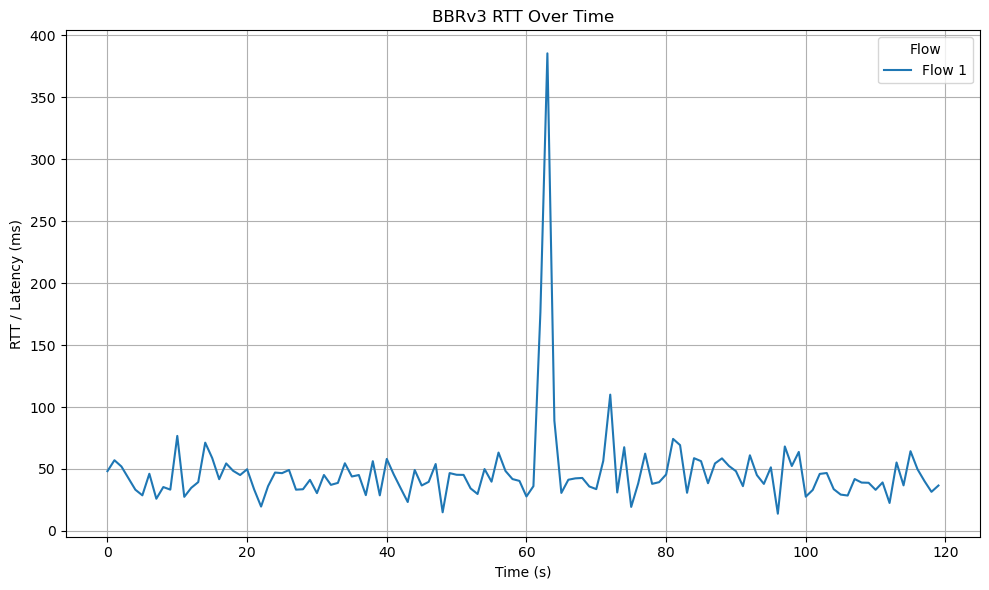

✅ Saved: /home/sit/Downloads/single flow/plot jason4/bbrv3_plots/rtt.png


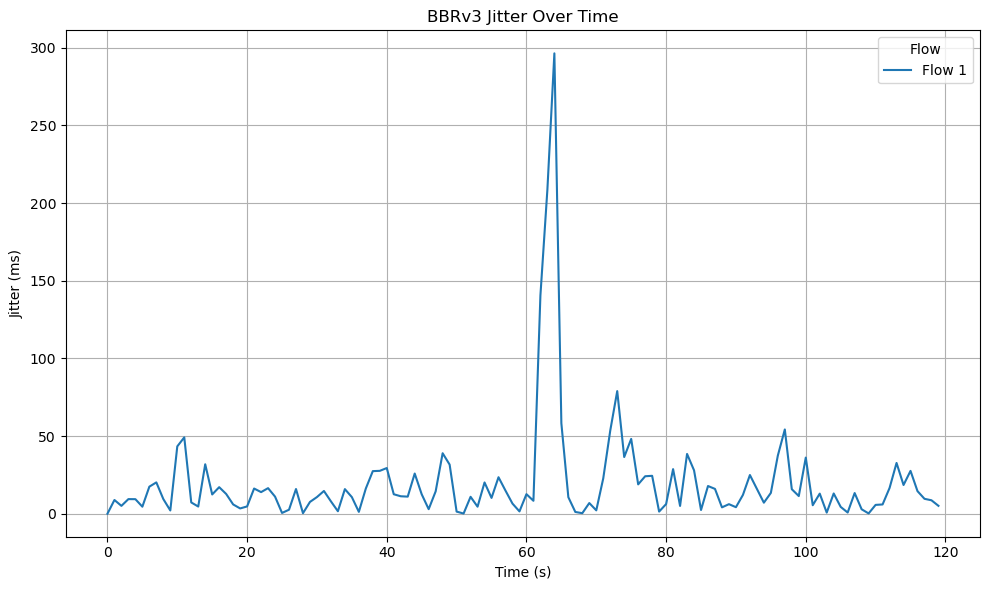

✅ Saved: /home/sit/Downloads/single flow/plot jason4/bbrv3_plots/jitter.png


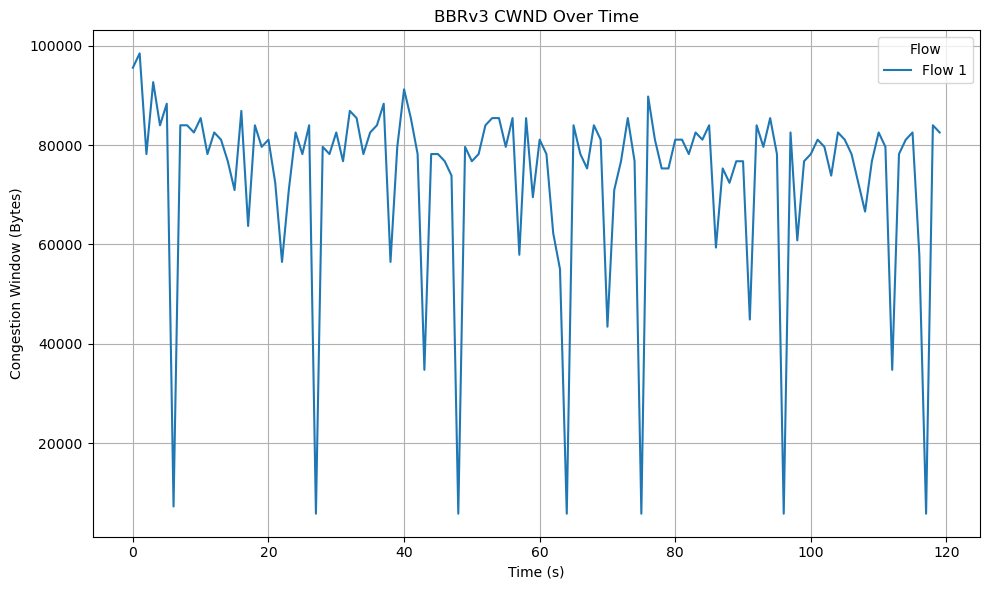

✅ Saved: /home/sit/Downloads/single flow/plot jason4/bbrv3_plots/cwnd.png


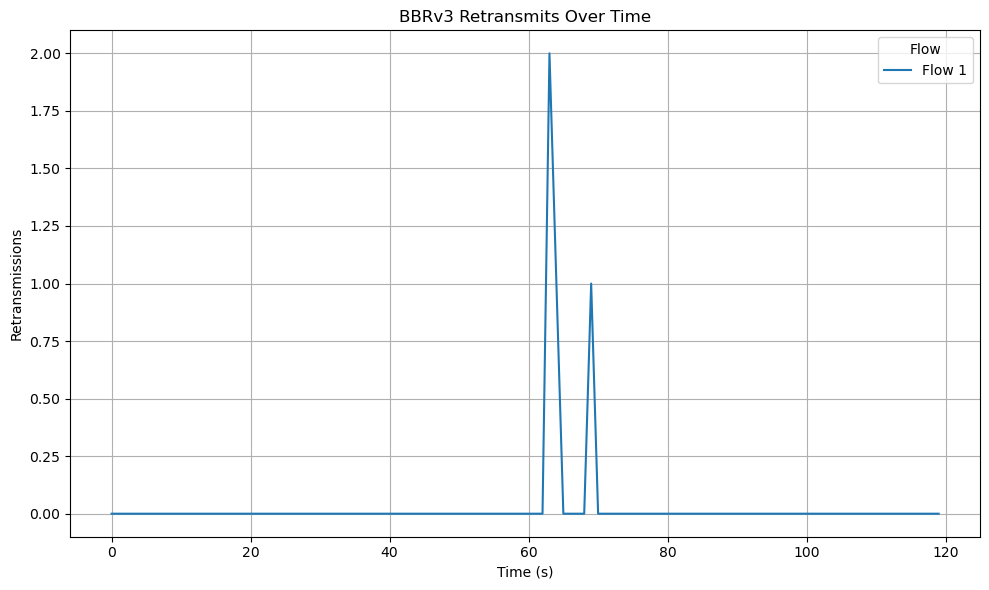

✅ Saved: /home/sit/Downloads/single flow/plot jason4/bbrv3_plots/retransmits.png


In [43]:


import json
import os
import pandas as pd
import matplotlib.pyplot as plt

def extract_metrics(filepath, label):
    with open(filepath) as f:
        data = json.load(f)

    metrics = []
    prev_rtt_ms = None

    for i, interval in enumerate(data.get("intervals", [])):
        stream = interval["streams"][0]
        rtt_ms = stream.get("rtt", 0) / 1000  # Convert µs to ms
        jitter_ms = abs(rtt_ms - prev_rtt_ms) if prev_rtt_ms is not None else 0
        prev_rtt_ms = rtt_ms

        metrics.append({
            "time_sec": i,
            "throughput_mbps": stream.get("bits_per_second", 0) / 1e6,
            "rtt_ms": rtt_ms,
            "jitter_ms": jitter_ms,
            "cwnd_bytes": stream.get("snd_cwnd", 0),
            "retransmits": stream.get("retransmits", 0),
            "label": label
        })

    return pd.DataFrame(metrics)

def plot_metric(df, metric, ylabel, title, save_path):
    plt.figure(figsize=(10, 6))
    for label, group in df.groupby("label"):
        plt.plot(group["time_sec"], group[metric], label=label)
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(title="Flow")
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()
    plt.close()
    print(f"✅ Saved: {save_path}")
   


def process_tcp_flows(folder_path, file_pattern, output_csv_name, algo_name):
    all_data = []

    for i in range(1, 6):
        filename = file_pattern.format(i)
        filepath = os.path.join(folder_path, filename)
        label = f"Flow {i}"
        if os.path.exists(filepath):
            df = extract_metrics(filepath, label)
            all_data.append(df)
        else:
            print(f"❌ File not found: {filepath}")

    if not all_data:
        print("⚠️ No data to process.")
        return

    df_all = pd.concat(all_data, ignore_index=True)
    
    # Save CSV
    output_csv = os.path.join(folder_path, output_csv_name)
    df_all.to_csv(output_csv, index=False)
    print(f"✅ CSV saved to: {output_csv}")

    # Create directory for plots
    plot_dir = os.path.join(folder_path, f"{algo_name.lower()}_plots")
    os.makedirs(plot_dir, exist_ok=True)

    # Plot metrics
    plot_metric(df_all, "throughput_mbps", "Throughput (Mbps)", f"{algo_name} Throughput Over Time", os.path.join(plot_dir, "throughput.png"))
    plot_metric(df_all, "rtt_ms", "RTT / Latency (ms)", f"{algo_name} RTT Over Time", os.path.join(plot_dir, "rtt.png"))
    plot_metric(df_all, "jitter_ms", "Jitter (ms)", f"{algo_name} Jitter Over Time", os.path.join(plot_dir, "jitter.png"))
    plot_metric(df_all, "cwnd_bytes", "Congestion Window (Bytes)", f"{algo_name} CWND Over Time", os.path.join(plot_dir, "cwnd.png"))
    plot_metric(df_all, "retransmits", "Retransmissions", f"{algo_name} Retransmits Over Time", os.path.join(plot_dir, "retransmits.png"))

# --------------------------------------------
# ✅ To run it (for BBR):
process_tcp_flows(
    folder_path="/home/sit/Downloads/single flow/plot jason4",
    file_pattern="bbr3_1flow{}_4.json",  # Adjust this pattern for your file names
    output_csv_name="tcp_metrics_ single flows4.csv",
    algo_name="BBRv3"
)


Stggered BBRv3 flows 

In [ ]:
/home/sit/Downloads/3 flows 15s_staggered/plot jason

❌ File not found: /home/sit/Downloads/3 flows 15s_staggered/plot jason1/bbr3_15s_staggered_flow4_1.json
❌ File not found: /home/sit/Downloads/3 flows 15s_staggered/plot jason1/bbr3_15s_staggered_flow5_1.json
✅ CSV saved to: /home/sit/Downloads/3 flows 15s_staggered/plot jason1/tcp_metrics_3_flows_15s_staggered.csv


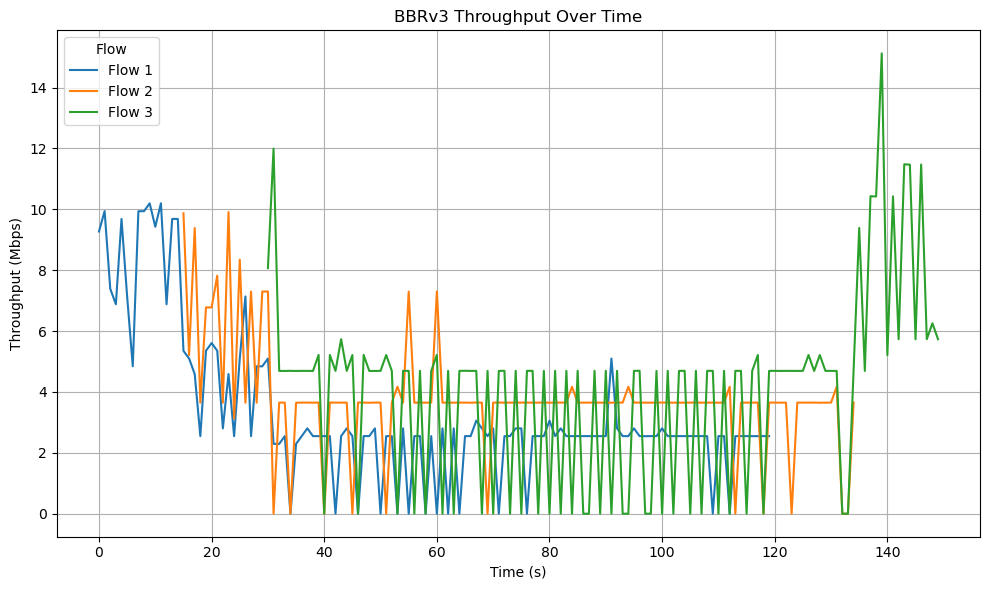

✅ Saved: /home/sit/Downloads/3 flows 15s_staggered/plot jason1/bbrv3_plots/throughput.png


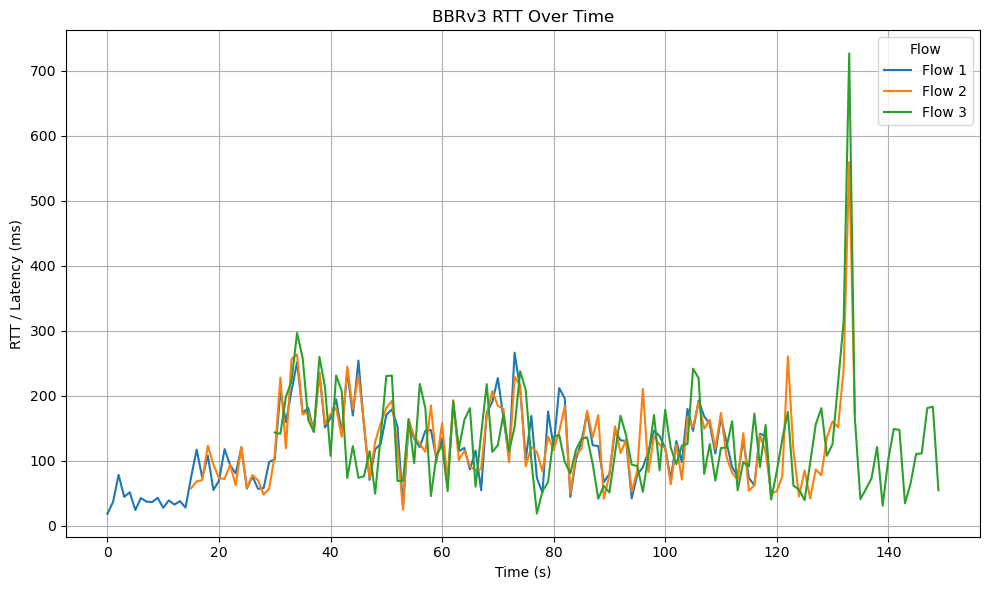

✅ Saved: /home/sit/Downloads/3 flows 15s_staggered/plot jason1/bbrv3_plots/rtt.png


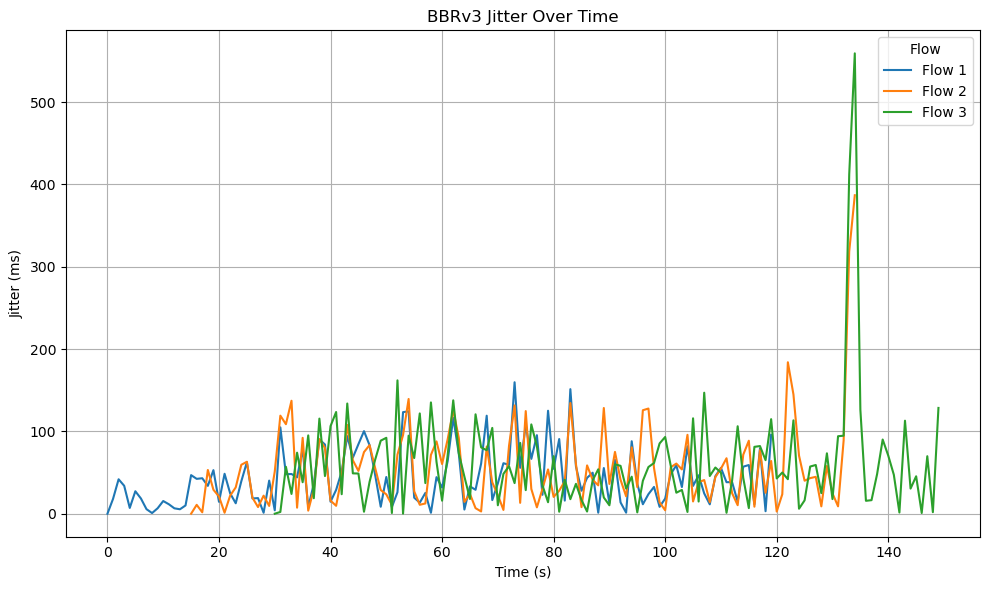

✅ Saved: /home/sit/Downloads/3 flows 15s_staggered/plot jason1/bbrv3_plots/jitter.png


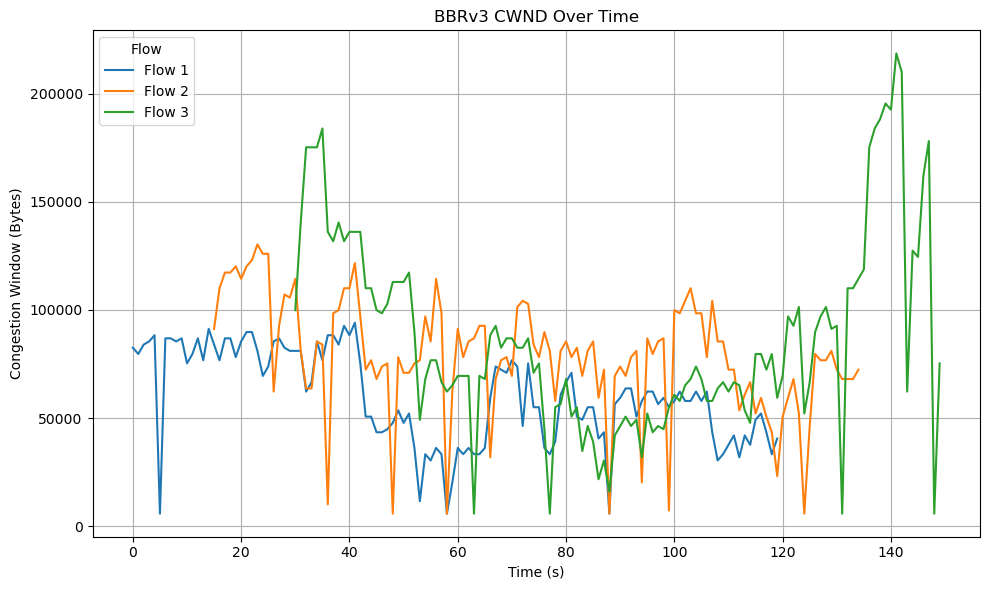

✅ Saved: /home/sit/Downloads/3 flows 15s_staggered/plot jason1/bbrv3_plots/cwnd.png


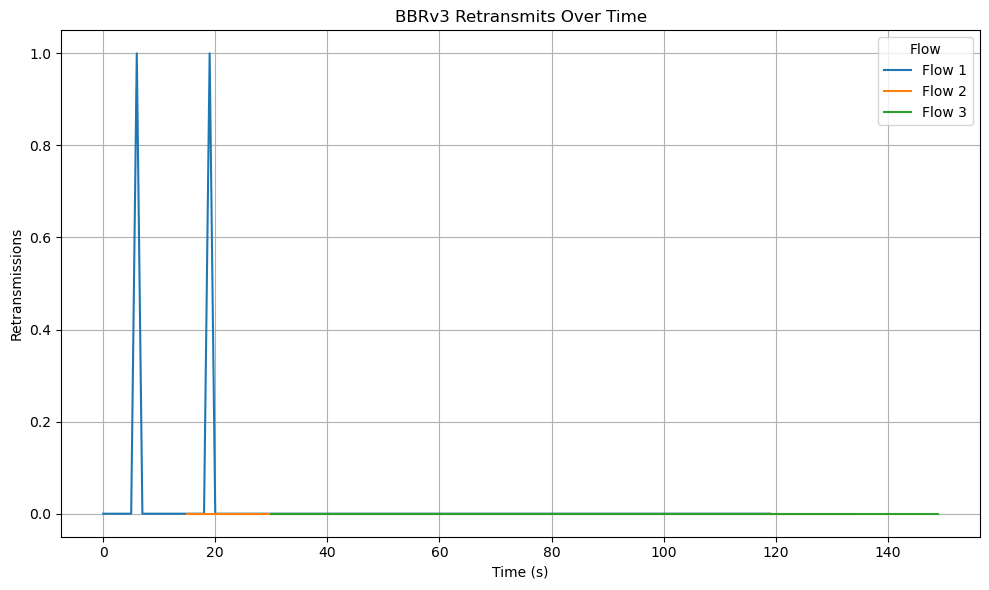

✅ Saved: /home/sit/Downloads/3 flows 15s_staggered/plot jason1/bbrv3_plots/retransmits.png


In [48]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt

def extract_metrics(filepath, label, time_offset=0):
    with open(filepath) as f:
        data = json.load(f)

    metrics = []
    prev_rtt_ms = None

    for i, interval in enumerate(data.get("intervals", [])):
        stream = interval["streams"][0]
        rtt_ms = stream.get("rtt", 0) / 1000  # Convert µs to ms
        jitter_ms = abs(rtt_ms - prev_rtt_ms) if prev_rtt_ms is not None else 0
        prev_rtt_ms = rtt_ms

        metrics.append({
            "time_sec": i + time_offset,  # 🕒 Add offset for staggered start
            "throughput_mbps": stream.get("bits_per_second", 0) / 1e6,
            "rtt_ms": rtt_ms,
            "jitter_ms": jitter_ms,
            "cwnd_bytes": stream.get("snd_cwnd", 0),
            "retransmits": stream.get("retransmits", 0),
            "label": label
        })

    return pd.DataFrame(metrics)

def plot_metric(df, metric, ylabel, title, save_path):
    plt.figure(figsize=(10, 6))
    for label, group in df.groupby("label"):
        plt.plot(group["time_sec"], group[metric], label=label)
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(title="Flow")
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()
    plt.close()
    print(f"✅ Saved: {save_path}")

def process_tcp_flows(folder_path, file_pattern, output_csv_name, algo_name):
    all_data = []

    for i in range(1, 6):
        filename = file_pattern.format(i)
        filepath = os.path.join(folder_path, filename)
        label = f"Flow {i}"
        if os.path.exists(filepath):
            time_offset = (i - 1) * 15  # ⏱️ Stagger each flow by 15s
            df = extract_metrics(filepath, label, time_offset)
            all_data.append(df)
        else:
            print(f"❌ File not found: {filepath}")

    if not all_data:
        print("⚠️ No data to process.")
        return

    df_all = pd.concat(all_data, ignore_index=True)
    
    # Save CSV
    output_csv = os.path.join(folder_path, output_csv_name)
    df_all.to_csv(output_csv, index=False)
    print(f"✅ CSV saved to: {output_csv}")

    # Create directory for plots
    plot_dir = os.path.join(folder_path, f"{algo_name.lower()}_plots")
    os.makedirs(plot_dir, exist_ok=True)

    # Plot metrics
    plot_metric(df_all, "throughput_mbps", "Throughput (Mbps)", f"{algo_name} Throughput Over Time", os.path.join(plot_dir, "throughput.png"))
    plot_metric(df_all, "rtt_ms", "RTT / Latency (ms)", f"{algo_name} RTT Over Time", os.path.join(plot_dir, "rtt.png"))
    plot_metric(df_all, "jitter_ms", "Jitter (ms)", f"{algo_name} Jitter Over Time", os.path.join(plot_dir, "jitter.png"))
    plot_metric(df_all, "cwnd_bytes", "Congestion Window (Bytes)", f"{algo_name} CWND Over Time", os.path.join(plot_dir, "cwnd.png"))
    plot_metric(df_all, "retransmits", "Retransmissions", f"{algo_name} Retransmits Over Time", os.path.join(plot_dir, "retransmits.png"))

# --------------------------------------------
# ✅ Example: To run it (e.g., for BBRv3)
process_tcp_flows(
    folder_path="/home/sit/Downloads/3 flows 15s_staggered/plot jason1",
    file_pattern="bbr3_15s_staggered_flow{}_1.json",  # Adjust pattern as needed
    output_csv_name="tcp_metrics_3_flows_15s_staggered.csv",
    algo_name="BBRv3"
)


❌ File not found: /home/sit/Downloads/3 flows 15s_staggered/plot jason/bbr3_15s_staggered_flow4.json
❌ File not found: /home/sit/Downloads/3 flows 15s_staggered/plot jason/bbr3_15s_staggered_flow5.json
✅ CSV saved to: /home/sit/Downloads/3 flows 15s_staggered/plot jason/tcp_metrics_3_flows_15s_staggered.csv


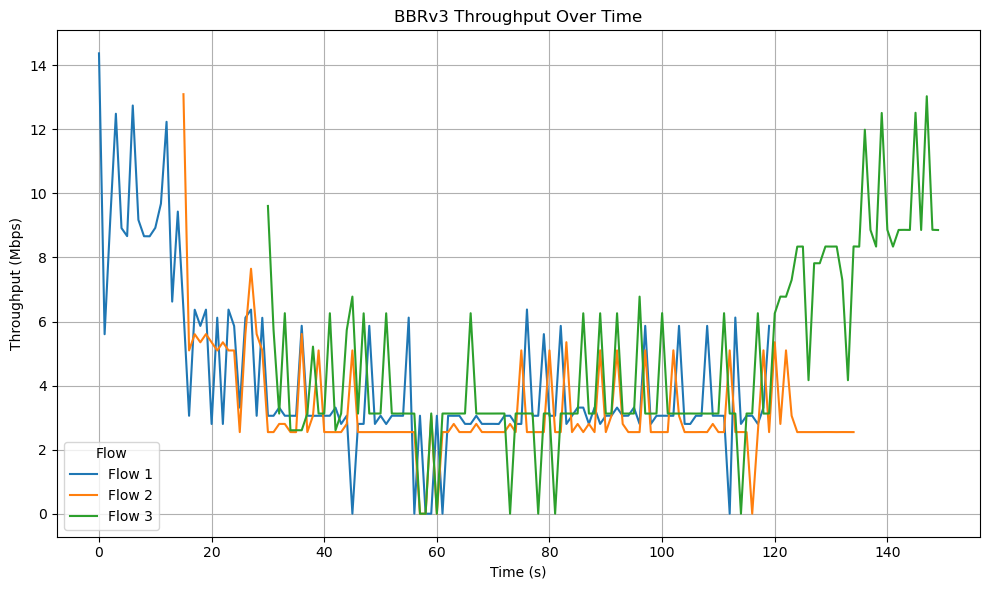

✅ Saved: /home/sit/Downloads/3 flows 15s_staggered/plot jason/bbrv3_plots/throughput.png


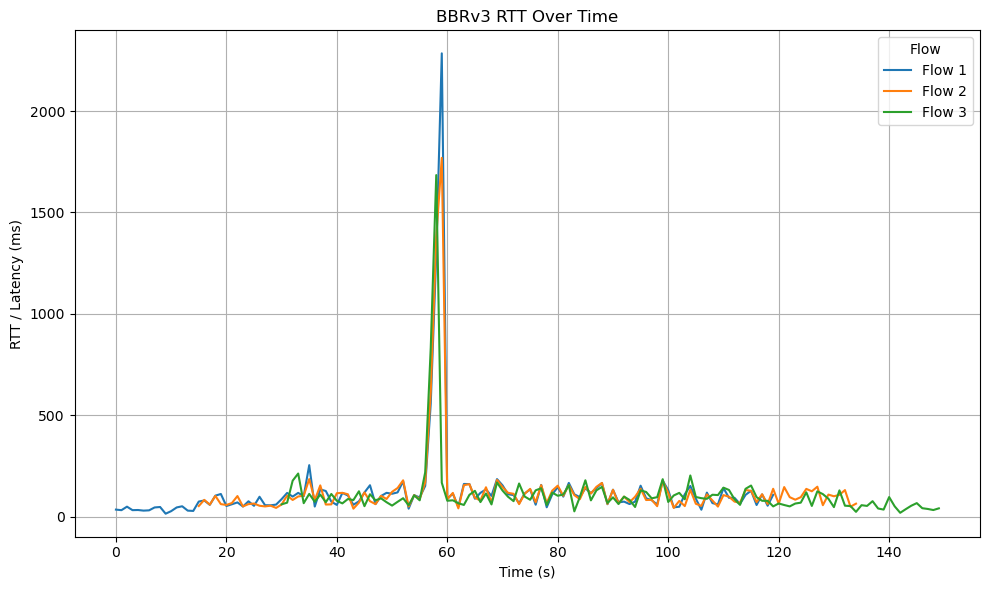

✅ Saved: /home/sit/Downloads/3 flows 15s_staggered/plot jason/bbrv3_plots/rtt.png


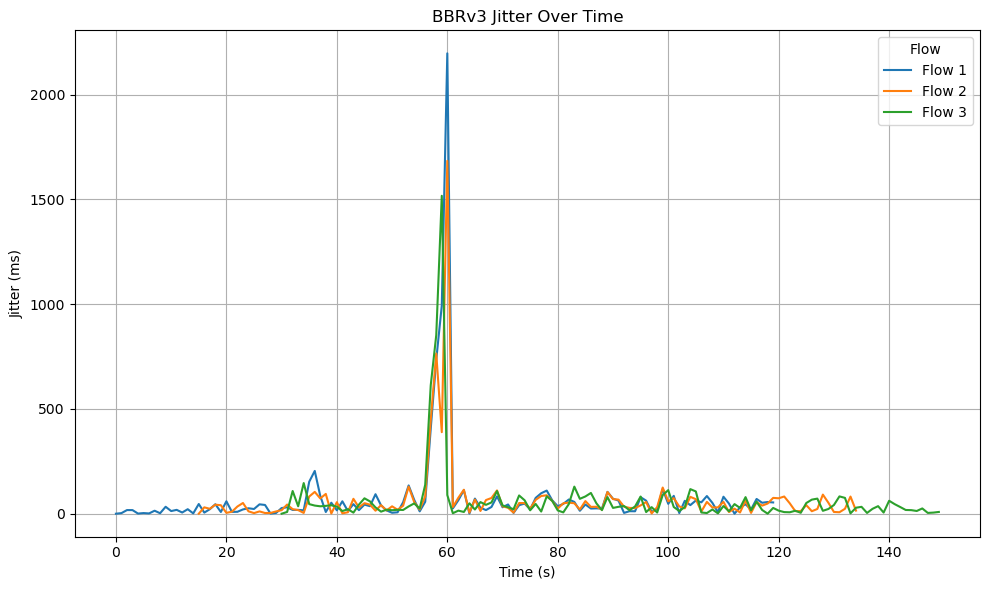

✅ Saved: /home/sit/Downloads/3 flows 15s_staggered/plot jason/bbrv3_plots/jitter.png


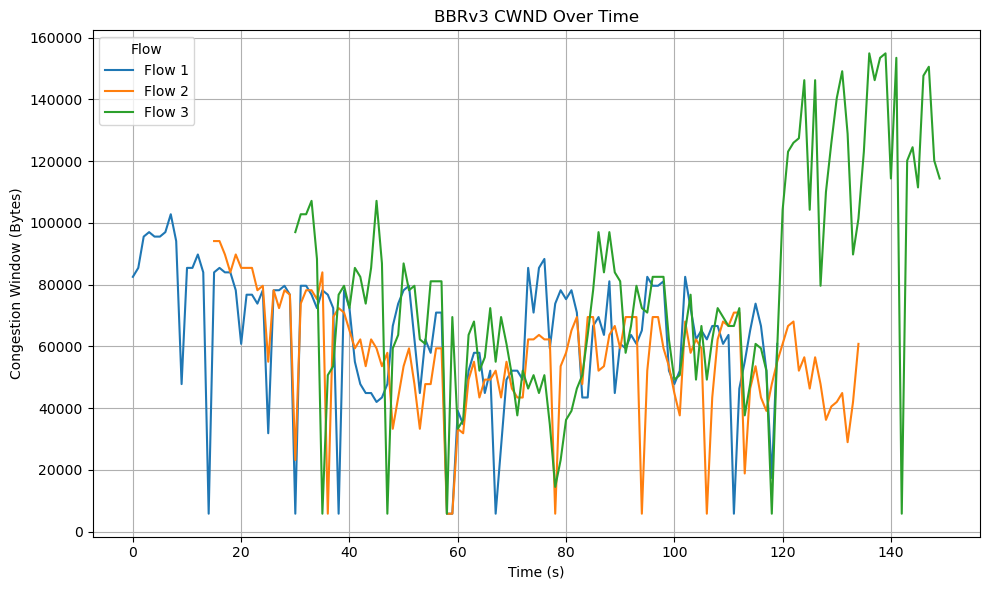

✅ Saved: /home/sit/Downloads/3 flows 15s_staggered/plot jason/bbrv3_plots/cwnd.png


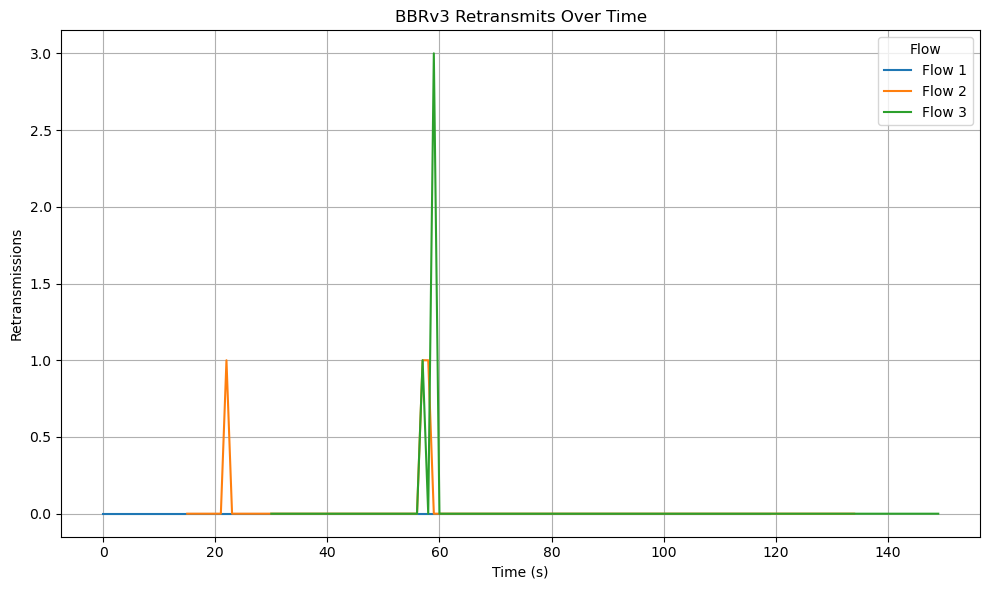

✅ Saved: /home/sit/Downloads/3 flows 15s_staggered/plot jason/bbrv3_plots/retransmits.png


In [49]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt

def extract_metrics(filepath, label, time_offset=0):
    with open(filepath) as f:
        data = json.load(f)

    metrics = []
    prev_rtt_ms = None

    for i, interval in enumerate(data.get("intervals", [])):
        stream = interval["streams"][0]
        rtt_ms = stream.get("rtt", 0) / 1000  # Convert µs to ms
        jitter_ms = abs(rtt_ms - prev_rtt_ms) if prev_rtt_ms is not None else 0
        prev_rtt_ms = rtt_ms

        metrics.append({
            "time_sec": i + time_offset,  # 🕒 Add offset for staggered start
            "throughput_mbps": stream.get("bits_per_second", 0) / 1e6,
            "rtt_ms": rtt_ms,
            "jitter_ms": jitter_ms,
            "cwnd_bytes": stream.get("snd_cwnd", 0),
            "retransmits": stream.get("retransmits", 0),
            "label": label
        })

    return pd.DataFrame(metrics)

def plot_metric(df, metric, ylabel, title, save_path):
    plt.figure(figsize=(10, 6))
    for label, group in df.groupby("label"):
        plt.plot(group["time_sec"], group[metric], label=label)
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(title="Flow")
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()
    plt.close()
    print(f"✅ Saved: {save_path}")

def process_tcp_flows(folder_path, file_pattern, output_csv_name, algo_name):
    all_data = []

    for i in range(1, 6):
        filename = file_pattern.format(i)
        filepath = os.path.join(folder_path, filename)
        label = f"Flow {i}"
        if os.path.exists(filepath):
            time_offset = (i - 1) * 15  # ⏱️ Stagger each flow by 15s
            df = extract_metrics(filepath, label, time_offset)
            all_data.append(df)
        else:
            print(f"❌ File not found: {filepath}")

    if not all_data:
        print("⚠️ No data to process.")
        return

    df_all = pd.concat(all_data, ignore_index=True)
    
    # Save CSV
    output_csv = os.path.join(folder_path, output_csv_name)
    df_all.to_csv(output_csv, index=False)
    print(f"✅ CSV saved to: {output_csv}")

    # Create directory for plots
    plot_dir = os.path.join(folder_path, f"{algo_name.lower()}_plots")
    os.makedirs(plot_dir, exist_ok=True)

    # Plot metrics
    plot_metric(df_all, "throughput_mbps", "Throughput (Mbps)", f"{algo_name} Throughput Over Time", os.path.join(plot_dir, "throughput.png"))
    plot_metric(df_all, "rtt_ms", "RTT / Latency (ms)", f"{algo_name} RTT Over Time", os.path.join(plot_dir, "rtt.png"))
    plot_metric(df_all, "jitter_ms", "Jitter (ms)", f"{algo_name} Jitter Over Time", os.path.join(plot_dir, "jitter.png"))
    plot_metric(df_all, "cwnd_bytes", "Congestion Window (Bytes)", f"{algo_name} CWND Over Time", os.path.join(plot_dir, "cwnd.png"))
    plot_metric(df_all, "retransmits", "Retransmissions", f"{algo_name} Retransmits Over Time", os.path.join(plot_dir, "retransmits.png"))

# --------------------------------------------
# ✅ Example: To run it (e.g., for BBRv3)
process_tcp_flows(
    folder_path="/home/sit/Downloads/3 flows 15s_staggered/plot jason",
    file_pattern="bbr3_15s_staggered_flow{}.json",  # Adjust pattern as needed
    output_csv_name="tcp_metrics_3_flows_15s_staggered.csv",
    algo_name="BBRv3"
)


❌ File not found: /home/sit/Downloads/2 flows_15s_staggered/plot jason/bbr3_15s_staggered_flow3.json
❌ File not found: /home/sit/Downloads/2 flows_15s_staggered/plot jason/bbr3_15s_staggered_flow4.json
❌ File not found: /home/sit/Downloads/2 flows_15s_staggered/plot jason/bbr3_15s_staggered_flow5.json
✅ CSV saved to: /home/sit/Downloads/2 flows_15s_staggered/plot jason/tcp_metrics_2_flows_15s_staggered.csv


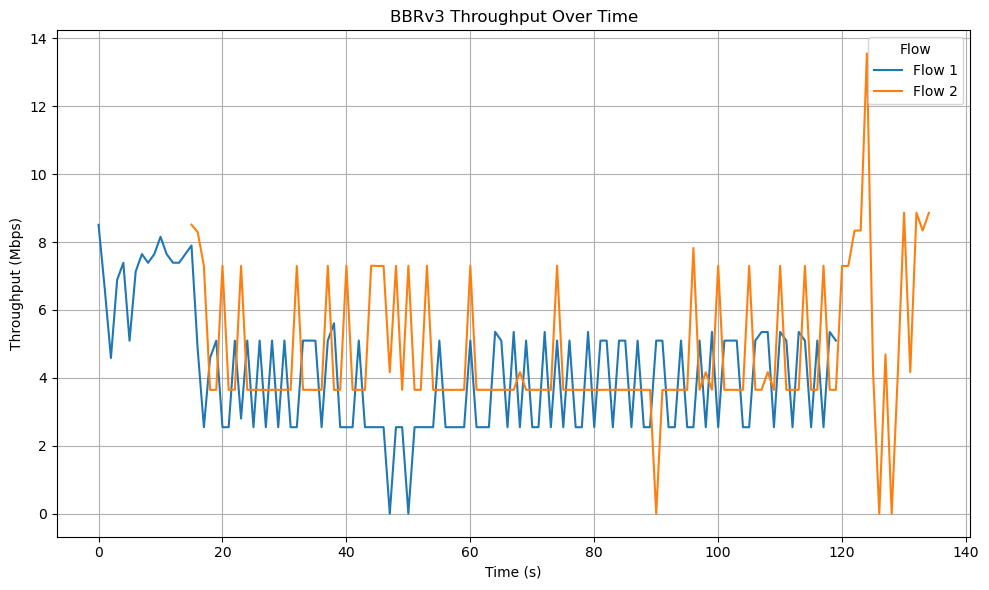

✅ Saved: /home/sit/Downloads/2 flows_15s_staggered/plot jason/bbrv3_plots/throughput.png


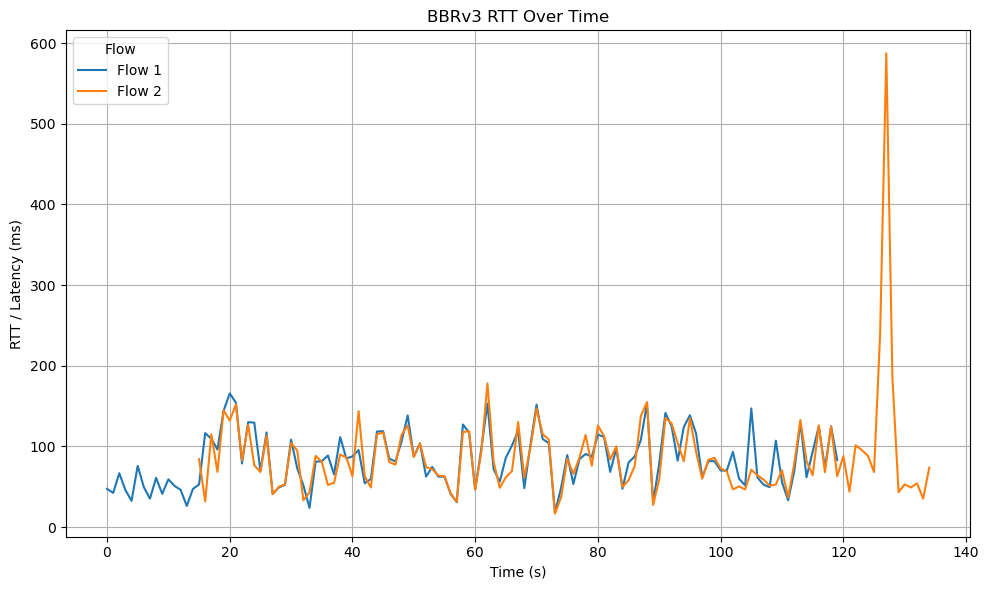

✅ Saved: /home/sit/Downloads/2 flows_15s_staggered/plot jason/bbrv3_plots/rtt.png


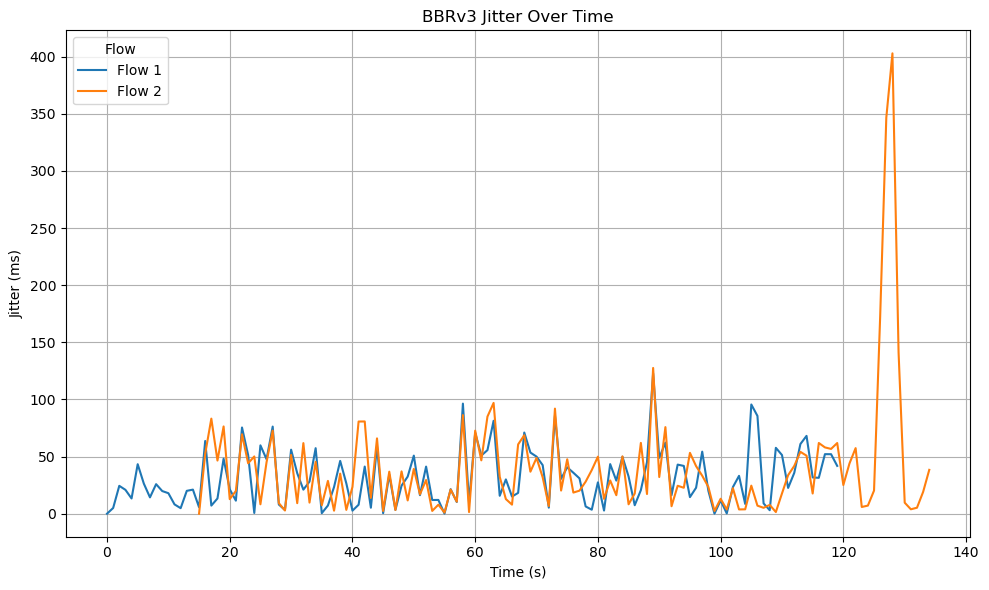

✅ Saved: /home/sit/Downloads/2 flows_15s_staggered/plot jason/bbrv3_plots/jitter.png


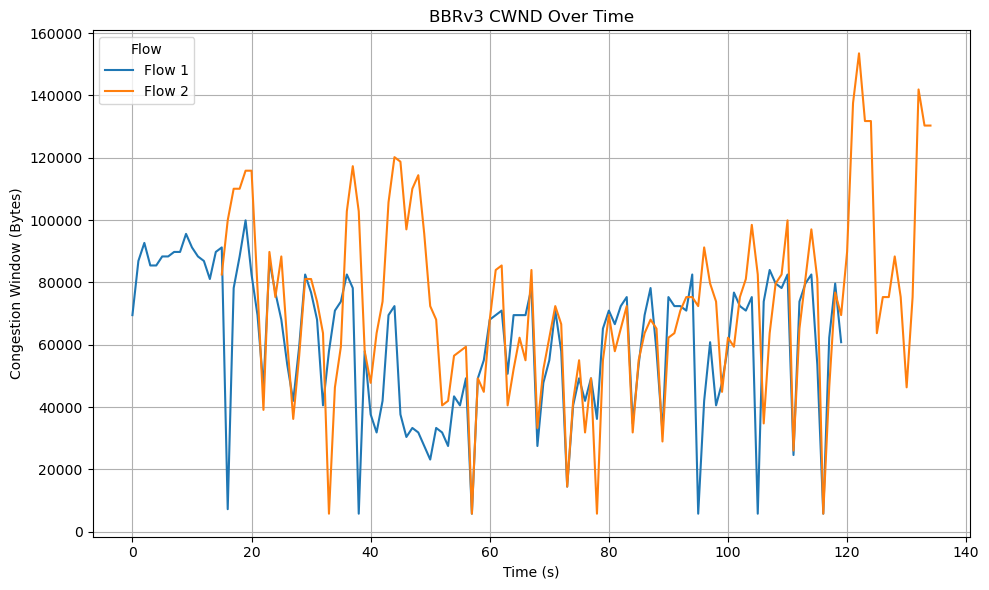

✅ Saved: /home/sit/Downloads/2 flows_15s_staggered/plot jason/bbrv3_plots/cwnd.png


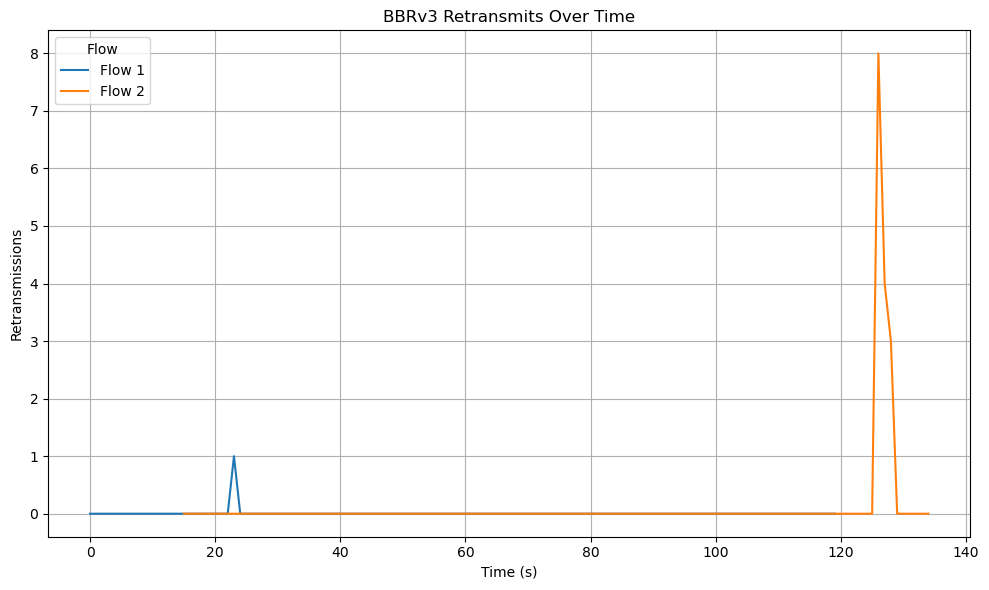

✅ Saved: /home/sit/Downloads/2 flows_15s_staggered/plot jason/bbrv3_plots/retransmits.png


In [52]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt

def extract_metrics(filepath, label, time_offset=0):
    with open(filepath) as f:
        data = json.load(f)

    metrics = []
    prev_rtt_ms = None

    for i, interval in enumerate(data.get("intervals", [])):
        stream = interval["streams"][0]
        rtt_ms = stream.get("rtt", 0) / 1000  # Convert µs to ms
        jitter_ms = abs(rtt_ms - prev_rtt_ms) if prev_rtt_ms is not None else 0
        prev_rtt_ms = rtt_ms

        metrics.append({
            "time_sec": i + time_offset,  # 🕒 Add offset for staggered start
            "throughput_mbps": stream.get("bits_per_second", 0) / 1e6,
            "rtt_ms": rtt_ms,
            "jitter_ms": jitter_ms,
            "cwnd_bytes": stream.get("snd_cwnd", 0),
            "retransmits": stream.get("retransmits", 0),
            "label": label
        })

    return pd.DataFrame(metrics)

def plot_metric(df, metric, ylabel, title, save_path):
    plt.figure(figsize=(10, 6))
    for label, group in df.groupby("label"):
        plt.plot(group["time_sec"], group[metric], label=label)
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(title="Flow")
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()
    plt.close()
    print(f"✅ Saved: {save_path}")

def process_tcp_flows(folder_path, file_pattern, output_csv_name, algo_name):
    all_data = []

    for i in range(1, 6):
        filename = file_pattern.format(i)
        filepath = os.path.join(folder_path, filename)
        label = f"Flow {i}"
        if os.path.exists(filepath):
            time_offset = (i - 1) * 15  # ⏱️ Stagger each flow by 15s
            df = extract_metrics(filepath, label, time_offset)
            all_data.append(df)
        else:
            print(f"❌ File not found: {filepath}")

    if not all_data:
        print("⚠️ No data to process.")
        return

    df_all = pd.concat(all_data, ignore_index=True)
    
    # Save CSV
    output_csv = os.path.join(folder_path, output_csv_name)
    df_all.to_csv(output_csv, index=False)
    print(f"✅ CSV saved to: {output_csv}")

    # Create directory for plots
    plot_dir = os.path.join(folder_path, f"{algo_name.lower()}_plots")
    os.makedirs(plot_dir, exist_ok=True)

    # Plot metrics
    plot_metric(df_all, "throughput_mbps", "Throughput (Mbps)", f"{algo_name} Throughput Over Time", os.path.join(plot_dir, "throughput.png"))
    plot_metric(df_all, "rtt_ms", "RTT / Latency (ms)", f"{algo_name} RTT Over Time", os.path.join(plot_dir, "rtt.png"))
    plot_metric(df_all, "jitter_ms", "Jitter (ms)", f"{algo_name} Jitter Over Time", os.path.join(plot_dir, "jitter.png"))
    plot_metric(df_all, "cwnd_bytes", "Congestion Window (Bytes)", f"{algo_name} CWND Over Time", os.path.join(plot_dir, "cwnd.png"))
    plot_metric(df_all, "retransmits", "Retransmissions", f"{algo_name} Retransmits Over Time", os.path.join(plot_dir, "retransmits.png"))

# --------------------------------------------
# ✅ Example: To run it (e.g., for BBRv3)
process_tcp_flows(
    folder_path="/home/sit/Downloads/2 flows_15s_staggered/plot jason",
    file_pattern="bbr3_15s_staggered_flow{}.json",  # Adjust pattern as needed
    output_csv_name="tcp_metrics_2_flows_15s_staggered.csv",
    algo_name="BBRv3"
)


In [ ]:
/home/sit/Downloads/2 flows_15s_staggered/plot jason

❌ File not found: /home/sit/Downloads/2 flows_15s_staggered/plot jason 1/bbr3_15s_staggered_flow3_1.json
❌ File not found: /home/sit/Downloads/2 flows_15s_staggered/plot jason 1/bbr3_15s_staggered_flow4_1.json
❌ File not found: /home/sit/Downloads/2 flows_15s_staggered/plot jason 1/bbr3_15s_staggered_flow5_1.json
✅ CSV saved to: /home/sit/Downloads/2 flows_15s_staggered/plot jason 1/tcp_metrics_2_flows_15s_staggered1.csv


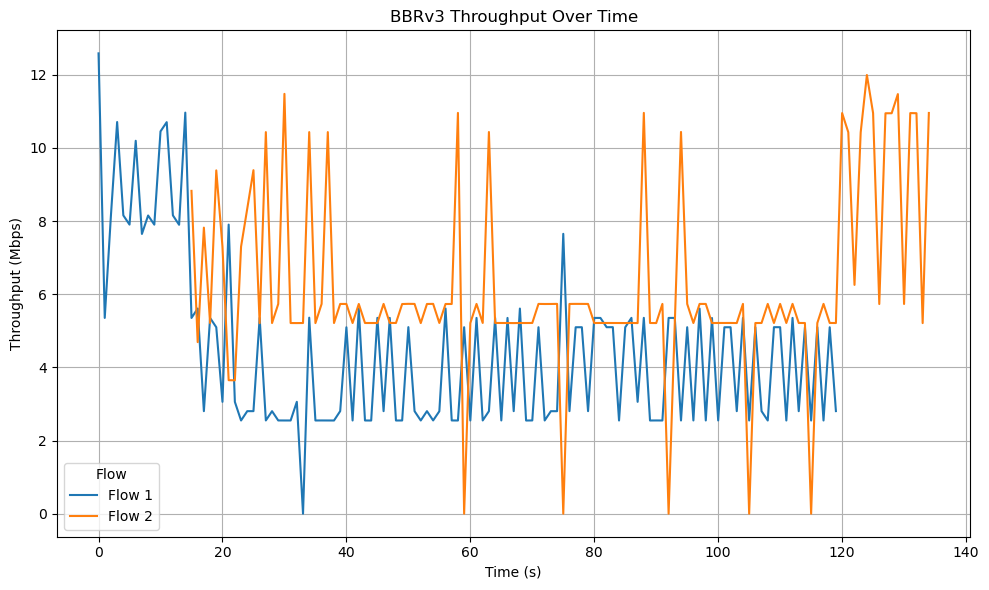

✅ Saved: /home/sit/Downloads/2 flows_15s_staggered/plot jason 1/bbrv3_plots/throughput.png


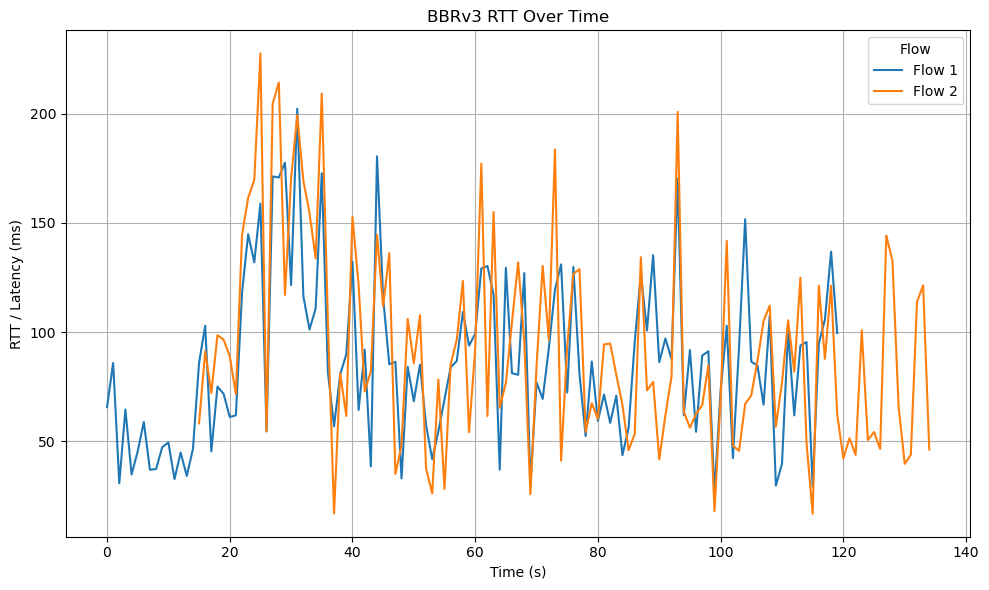

✅ Saved: /home/sit/Downloads/2 flows_15s_staggered/plot jason 1/bbrv3_plots/rtt.png


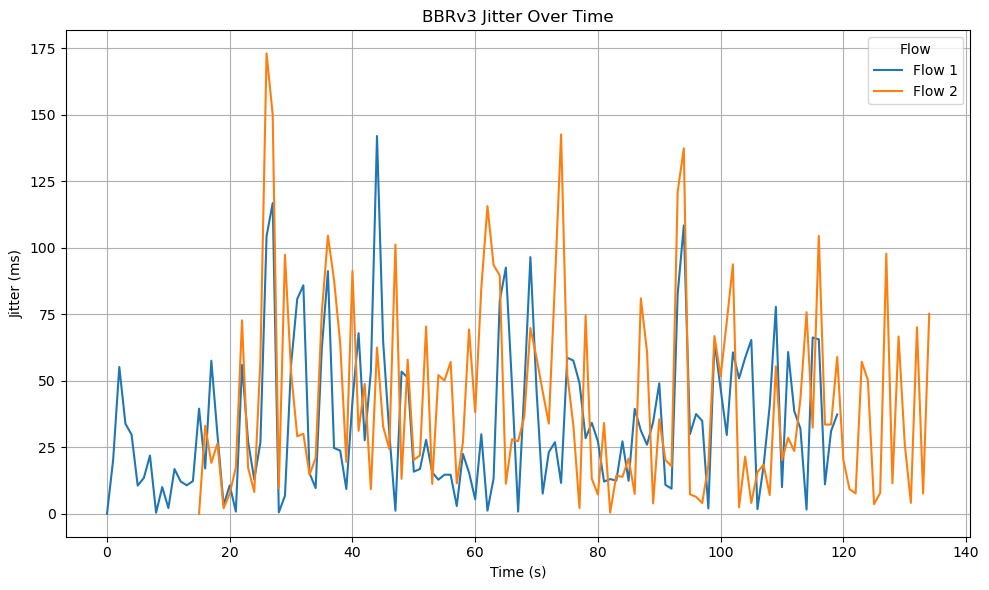

✅ Saved: /home/sit/Downloads/2 flows_15s_staggered/plot jason 1/bbrv3_plots/jitter.png


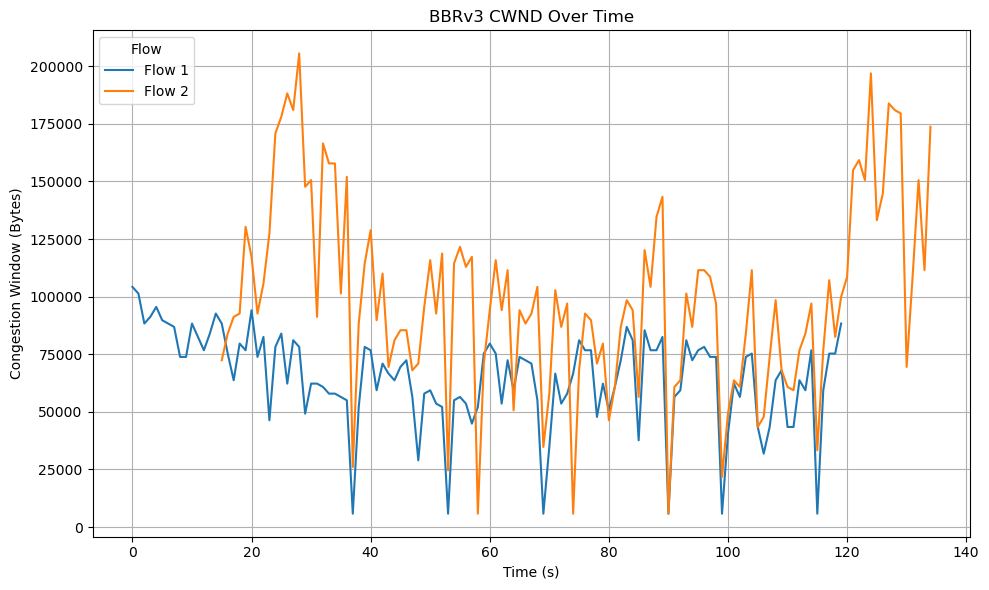

✅ Saved: /home/sit/Downloads/2 flows_15s_staggered/plot jason 1/bbrv3_plots/cwnd.png


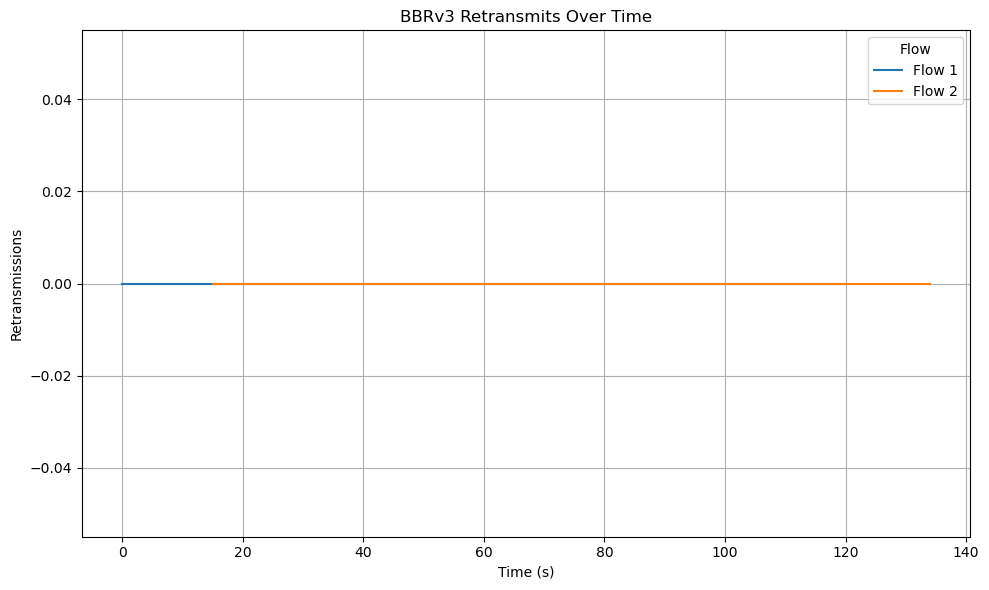

✅ Saved: /home/sit/Downloads/2 flows_15s_staggered/plot jason 1/bbrv3_plots/retransmits.png


In [56]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt

def extract_metrics(filepath, label, time_offset=0):
    with open(filepath) as f:
        data = json.load(f)

    metrics = []
    prev_rtt_ms = None

    for i, interval in enumerate(data.get("intervals", [])):
        stream = interval["streams"][0]
        rtt_ms = stream.get("rtt", 0) / 1000  # Convert µs to ms
        jitter_ms = abs(rtt_ms - prev_rtt_ms) if prev_rtt_ms is not None else 0
        prev_rtt_ms = rtt_ms

        metrics.append({
            "time_sec": i + time_offset,  # 🕒 Add offset for staggered start
            "throughput_mbps": stream.get("bits_per_second", 0) / 1e6,
            "rtt_ms": rtt_ms,
            "jitter_ms": jitter_ms,
            "cwnd_bytes": stream.get("snd_cwnd", 0),
            "retransmits": stream.get("retransmits", 0),
            "label": label
        })

    return pd.DataFrame(metrics)

def plot_metric(df, metric, ylabel, title, save_path):
    plt.figure(figsize=(10, 6))
    for label, group in df.groupby("label"):
        plt.plot(group["time_sec"], group[metric], label=label)
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(title="Flow")
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()
    plt.close()
    print(f"✅ Saved: {save_path}")

def process_tcp_flows(folder_path, file_pattern, output_csv_name, algo_name):
    all_data = []

    for i in range(1, 6):
        filename = file_pattern.format(i)
        filepath = os.path.join(folder_path, filename)
        label = f"Flow {i}"
        if os.path.exists(filepath):
            time_offset = (i - 1) * 15  # ⏱️ Stagger each flow by 15s
            df = extract_metrics(filepath, label, time_offset)
            all_data.append(df)
        else:
            print(f"❌ File not found: {filepath}")

    if not all_data:
        print("⚠️ No data to process.")
        return

    df_all = pd.concat(all_data, ignore_index=True)
    
    # Save CSV
    output_csv = os.path.join(folder_path, output_csv_name)
    df_all.to_csv(output_csv, index=False)
    print(f"✅ CSV saved to: {output_csv}")

    # Create directory for plots
    plot_dir = os.path.join(folder_path, f"{algo_name.lower()}_plots")
    os.makedirs(plot_dir, exist_ok=True)

    # Plot metrics
    plot_metric(df_all, "throughput_mbps", "Throughput (Mbps)", f"{algo_name} Throughput Over Time", os.path.join(plot_dir, "throughput.png"))
    plot_metric(df_all, "rtt_ms", "RTT / Latency (ms)", f"{algo_name} RTT Over Time", os.path.join(plot_dir, "rtt.png"))
    plot_metric(df_all, "jitter_ms", "Jitter (ms)", f"{algo_name} Jitter Over Time", os.path.join(plot_dir, "jitter.png"))
    plot_metric(df_all, "cwnd_bytes", "Congestion Window (Bytes)", f"{algo_name} CWND Over Time", os.path.join(plot_dir, "cwnd.png"))
    plot_metric(df_all, "retransmits", "Retransmissions", f"{algo_name} Retransmits Over Time", os.path.join(plot_dir, "retransmits.png"))

# --------------------------------------------
# ✅ Example: To run it (e.g., for BBRv3)
process_tcp_flows(
    folder_path="/home/sit/Downloads/2 flows_15s_staggered/plot jason 1",
    file_pattern="bbr3_15s_staggered_flow{}_1.json",  # Adjust pattern as needed
    output_csv_name="tcp_metrics_2_flows_15s_staggered1.csv",
    algo_name="BBRv3"
)


❌ File not found: /home/sit/Downloads/2 flows_15s_staggered/plot jason 2/bbr3_15s_staggered_flow3_2.json
❌ File not found: /home/sit/Downloads/2 flows_15s_staggered/plot jason 2/bbr3_15s_staggered_flow4_2.json
❌ File not found: /home/sit/Downloads/2 flows_15s_staggered/plot jason 2/bbr3_15s_staggered_flow5_2.json
✅ CSV saved to: /home/sit/Downloads/2 flows_15s_staggered/plot jason 2/tcp_metrics_2_flows_15s_staggered2.csv


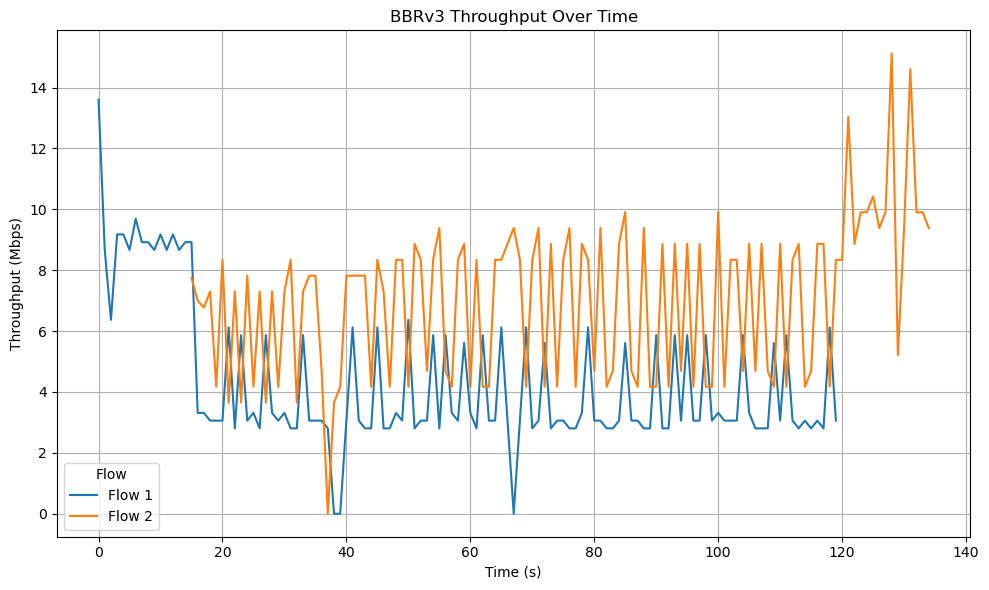

✅ Saved: /home/sit/Downloads/2 flows_15s_staggered/plot jason 2/bbrv3_plots/throughput.png


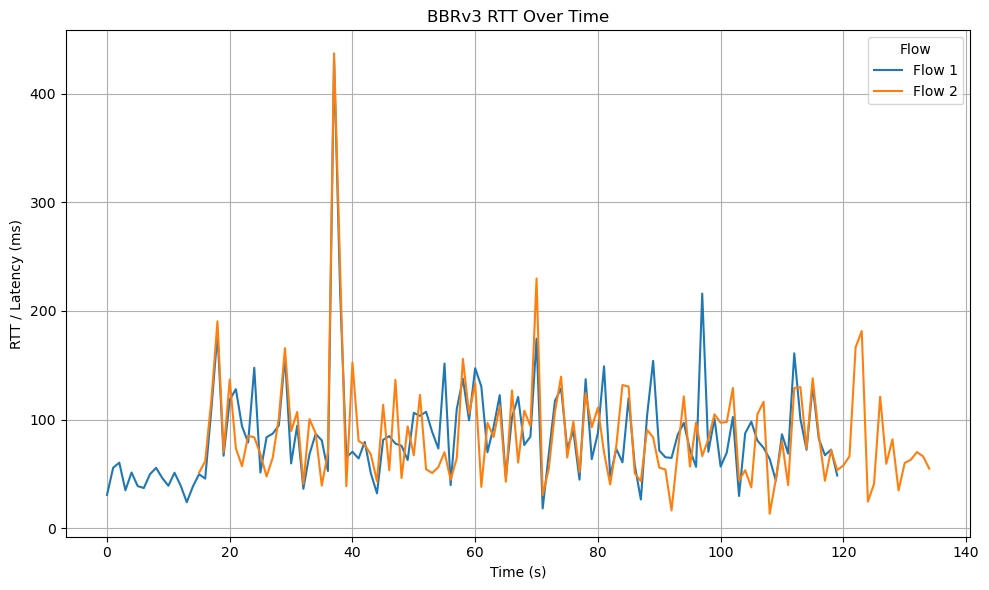

✅ Saved: /home/sit/Downloads/2 flows_15s_staggered/plot jason 2/bbrv3_plots/rtt.png


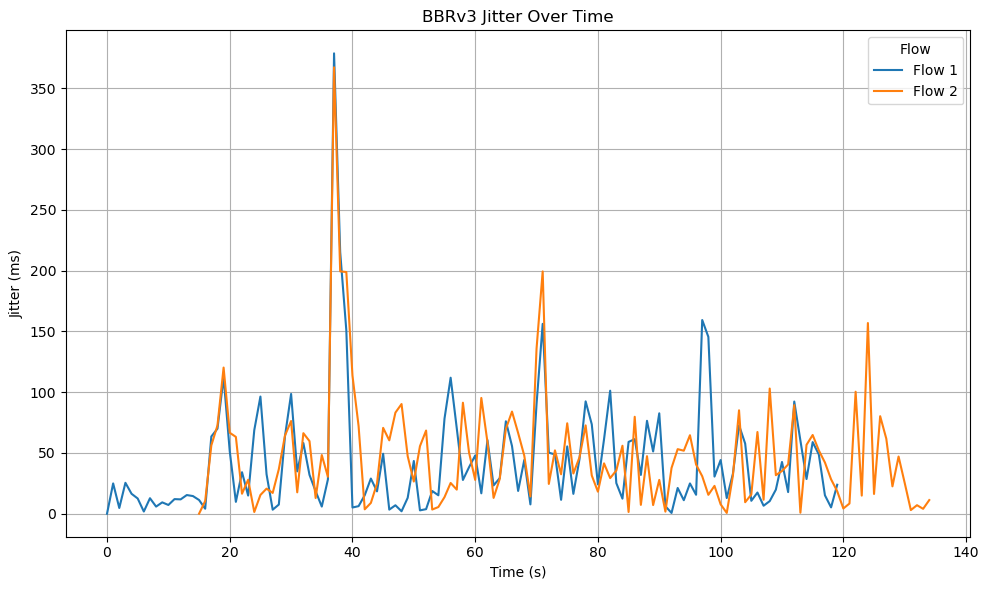

✅ Saved: /home/sit/Downloads/2 flows_15s_staggered/plot jason 2/bbrv3_plots/jitter.png


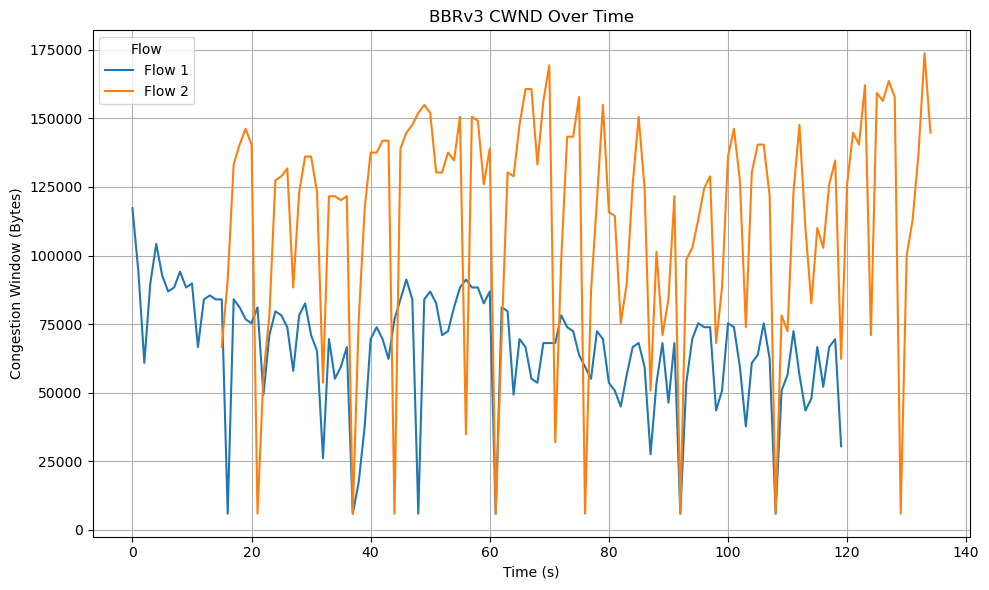

✅ Saved: /home/sit/Downloads/2 flows_15s_staggered/plot jason 2/bbrv3_plots/cwnd.png


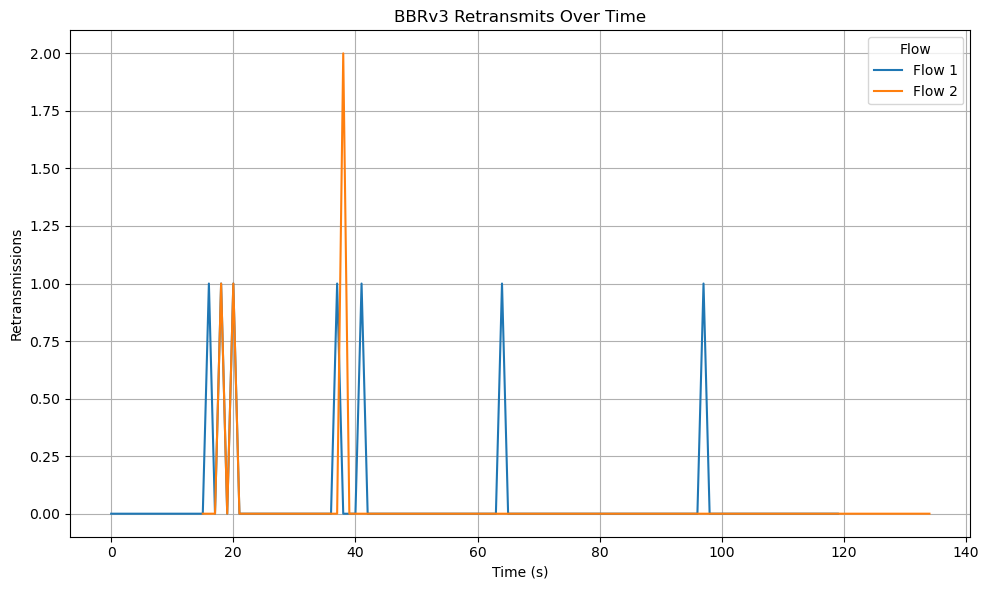

✅ Saved: /home/sit/Downloads/2 flows_15s_staggered/plot jason 2/bbrv3_plots/retransmits.png


In [60]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt

def extract_metrics(filepath, label, time_offset=0):
    with open(filepath) as f:
        data = json.load(f)

    metrics = []
    prev_rtt_ms = None

    for i, interval in enumerate(data.get("intervals", [])):
        stream = interval["streams"][0]
        rtt_ms = stream.get("rtt", 0) / 1000  # Convert µs to ms
        jitter_ms = abs(rtt_ms - prev_rtt_ms) if prev_rtt_ms is not None else 0
        prev_rtt_ms = rtt_ms

        metrics.append({
            "time_sec": i + time_offset,  # 🕒 Add offset for staggered start
            "throughput_mbps": stream.get("bits_per_second", 0) / 1e6,
            "rtt_ms": rtt_ms,
            "jitter_ms": jitter_ms,
            "cwnd_bytes": stream.get("snd_cwnd", 0),
            "retransmits": stream.get("retransmits", 0),
            "label": label
        })

    return pd.DataFrame(metrics)

def plot_metric(df, metric, ylabel, title, save_path):
    plt.figure(figsize=(10, 6))
    for label, group in df.groupby("label"):
        plt.plot(group["time_sec"], group[metric], label=label)
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(title="Flow")
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()
    plt.close()
    print(f"✅ Saved: {save_path}")

def process_tcp_flows(folder_path, file_pattern, output_csv_name, algo_name):
    all_data = []

    for i in range(1, 6):
        filename = file_pattern.format(i)
        filepath = os.path.join(folder_path, filename)
        label = f"Flow {i}"
        if os.path.exists(filepath):
            time_offset = (i - 1) * 15  # ⏱️ Stagger each flow by 15s
            df = extract_metrics(filepath, label, time_offset)
            all_data.append(df)
        else:
            print(f"❌ File not found: {filepath}")

    if not all_data:
        print("⚠️ No data to process.")
        return

    df_all = pd.concat(all_data, ignore_index=True)
    
    # Save CSV
    output_csv = os.path.join(folder_path, output_csv_name)
    df_all.to_csv(output_csv, index=False)
    print(f"✅ CSV saved to: {output_csv}")

    # Create directory for plots
    plot_dir = os.path.join(folder_path, f"{algo_name.lower()}_plots")
    os.makedirs(plot_dir, exist_ok=True)

    # Plot metrics
    plot_metric(df_all, "throughput_mbps", "Throughput (Mbps)", f"{algo_name} Throughput Over Time", os.path.join(plot_dir, "throughput.png"))
    plot_metric(df_all, "rtt_ms", "RTT / Latency (ms)", f"{algo_name} RTT Over Time", os.path.join(plot_dir, "rtt.png"))
    plot_metric(df_all, "jitter_ms", "Jitter (ms)", f"{algo_name} Jitter Over Time", os.path.join(plot_dir, "jitter.png"))
    plot_metric(df_all, "cwnd_bytes", "Congestion Window (Bytes)", f"{algo_name} CWND Over Time", os.path.join(plot_dir, "cwnd.png"))
    plot_metric(df_all, "retransmits", "Retransmissions", f"{algo_name} Retransmits Over Time", os.path.join(plot_dir, "retransmits.png"))

# --------------------------------------------
# ✅ Example: To run it (e.g., for BBRv3)
process_tcp_flows(
    folder_path="/home/sit/Downloads/2 flows_15s_staggered/plot jason 2",
    file_pattern="bbr3_15s_staggered_flow{}_2.json",  # Adjust pattern as needed
    output_csv_name="tcp_metrics_2_flows_15s_staggered2.csv",
    algo_name="BBRv3"
)


5 second staggered
[text](<../../Downloads/3 flows_5s_staggered/plot json>)

In [ ]:
/home/sit/Downloads/3 flows_5s_staggered/plot json

❌ File not found: /home/sit/Downloads/3 flows_5s_staggered/plot json1/bbr3_5s_staggered_flow4_1.json
❌ File not found: /home/sit/Downloads/3 flows_5s_staggered/plot json1/bbr3_5s_staggered_flow5_1.json
✅ CSV saved to: /home/sit/Downloads/3 flows_5s_staggered/plot json1/tcp_metrics_3_flows_5s_staggered1.csv


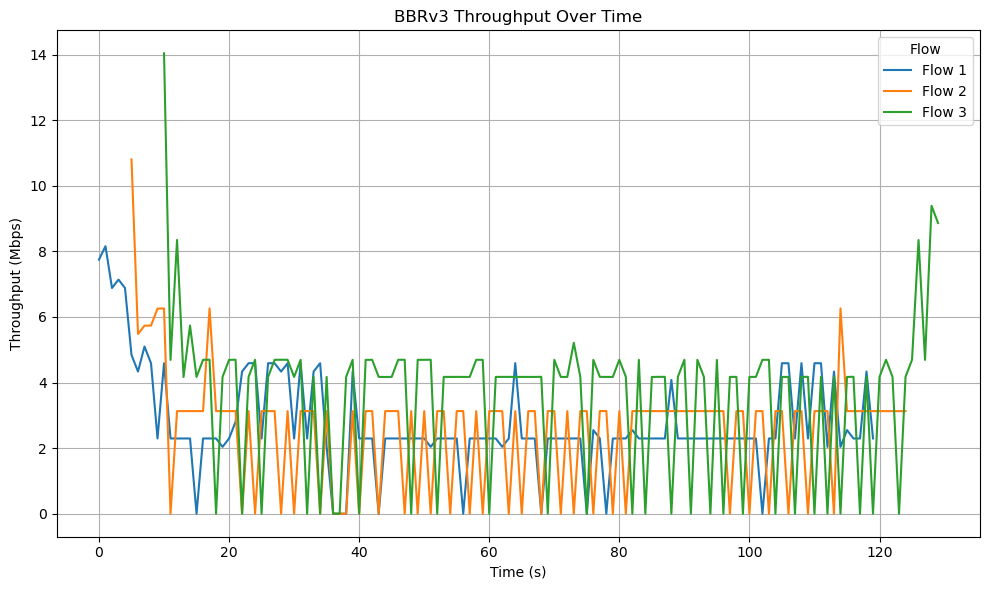

✅ Saved: /home/sit/Downloads/3 flows_5s_staggered/plot json1/bbrv3_plots/throughput.png


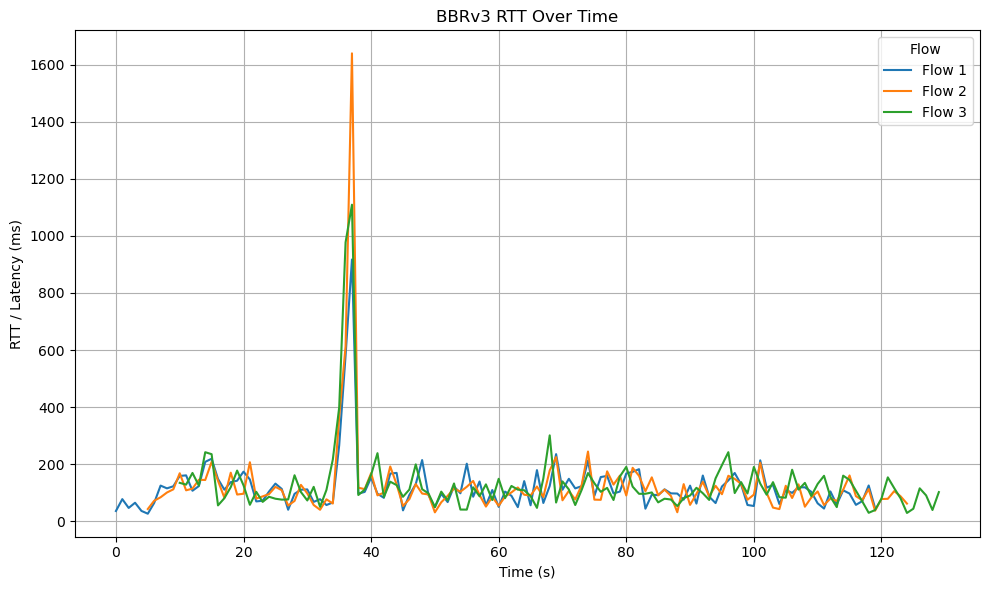

✅ Saved: /home/sit/Downloads/3 flows_5s_staggered/plot json1/bbrv3_plots/rtt.png


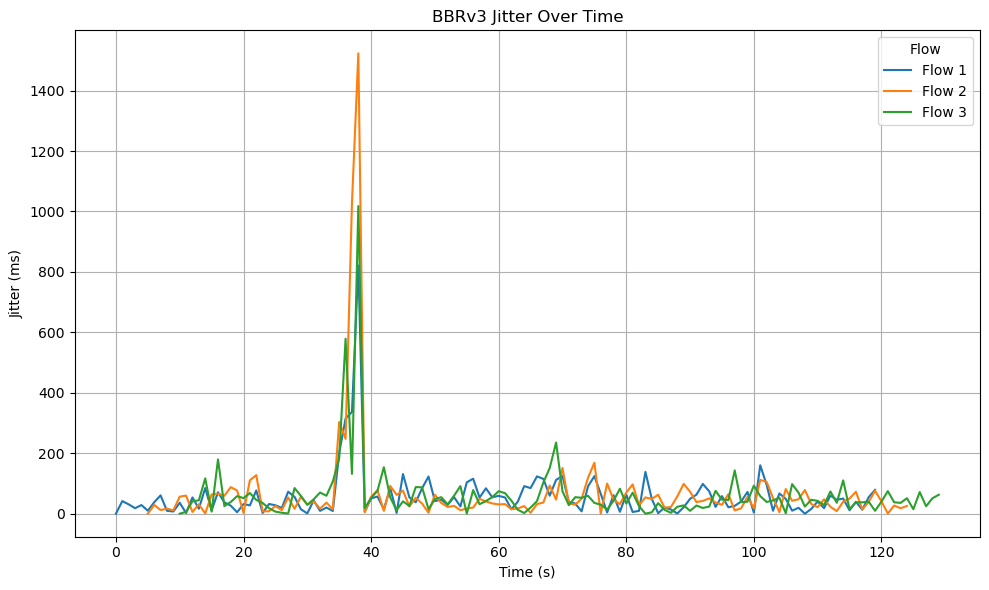

✅ Saved: /home/sit/Downloads/3 flows_5s_staggered/plot json1/bbrv3_plots/jitter.png


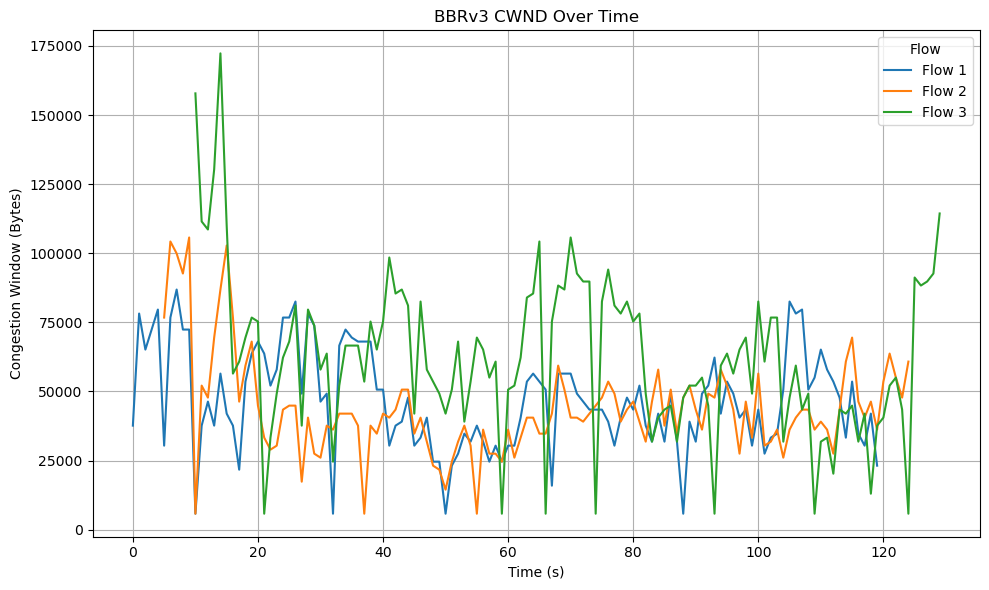

✅ Saved: /home/sit/Downloads/3 flows_5s_staggered/plot json1/bbrv3_plots/cwnd.png


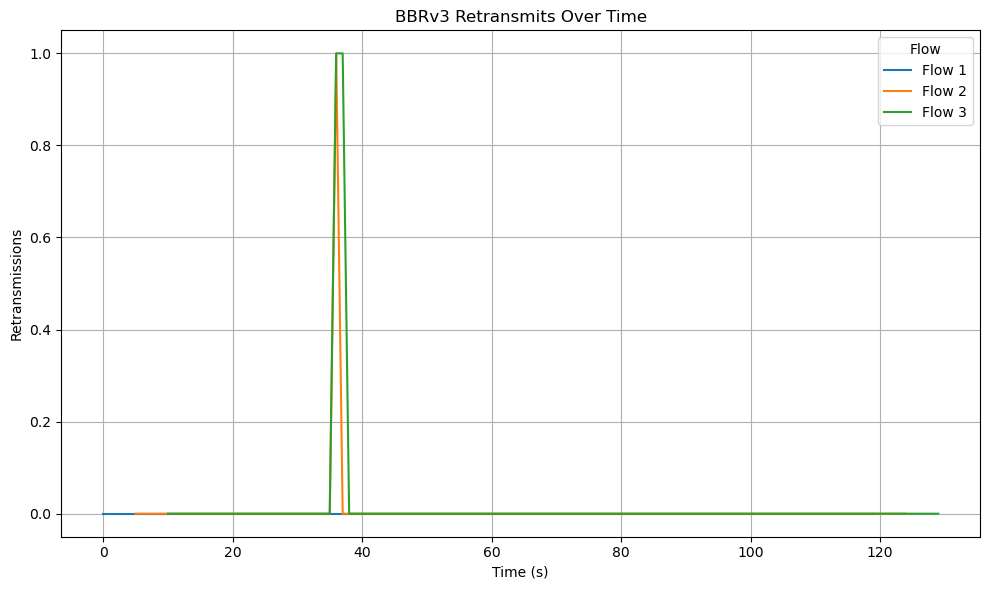

✅ Saved: /home/sit/Downloads/3 flows_5s_staggered/plot json1/bbrv3_plots/retransmits.png


In [74]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt

def extract_metrics(filepath, label, time_offset=0):
    with open(filepath) as f:
        data = json.load(f)

    metrics = []
    prev_rtt_ms = None

    for i, interval in enumerate(data.get("intervals", [])):
        stream = interval["streams"][0]
        rtt_ms = stream.get("rtt", 0) / 1000  # Convert µs to ms
        jitter_ms = abs(rtt_ms - prev_rtt_ms) if prev_rtt_ms is not None else 0
        prev_rtt_ms = rtt_ms

        metrics.append({
            "time_sec": i + time_offset,  # 🕒 Add offset for staggered start
            "throughput_mbps": stream.get("bits_per_second", 0) / 1e6,
            "rtt_ms": rtt_ms,
            "jitter_ms": jitter_ms,
            "cwnd_bytes": stream.get("snd_cwnd", 0),
            "retransmits": stream.get("retransmits", 0),
            "label": label
        })

    return pd.DataFrame(metrics)

def plot_metric(df, metric, ylabel, title, save_path):
    plt.figure(figsize=(10, 6))
    for label, group in df.groupby("label"):
        plt.plot(group["time_sec"], group[metric], label=label)
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(title="Flow")
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()
    plt.close()
    print(f"✅ Saved: {save_path}")

def process_tcp_flows(folder_path, file_pattern, output_csv_name, algo_name):
    all_data = []

    for i in range(1, 6):
        filename = file_pattern.format(i)
        filepath = os.path.join(folder_path, filename)
        label = f"Flow {i}"
        if os.path.exists(filepath):
            time_offset = (i - 1) * 5  # ⏱️ Stagger each flow by 15s
            df = extract_metrics(filepath, label, time_offset)
            all_data.append(df)
        else:
            print(f"❌ File not found: {filepath}")

    if not all_data:
        print("⚠️ No data to process.")
        return

    df_all = pd.concat(all_data, ignore_index=True)
    
    # Save CSV
    output_csv = os.path.join(folder_path, output_csv_name)
    df_all.to_csv(output_csv, index=False)
    print(f"✅ CSV saved to: {output_csv}")

    # Create directory for plots
    plot_dir = os.path.join(folder_path, f"{algo_name.lower()}_plots")
    os.makedirs(plot_dir, exist_ok=True)

    # Plot metrics
    plot_metric(df_all, "throughput_mbps", "Throughput (Mbps)", f"{algo_name} Throughput Over Time", os.path.join(plot_dir, "throughput.png"))
    plot_metric(df_all, "rtt_ms", "RTT / Latency (ms)", f"{algo_name} RTT Over Time", os.path.join(plot_dir, "rtt.png"))
    plot_metric(df_all, "jitter_ms", "Jitter (ms)", f"{algo_name} Jitter Over Time", os.path.join(plot_dir, "jitter.png"))
    plot_metric(df_all, "cwnd_bytes", "Congestion Window (Bytes)", f"{algo_name} CWND Over Time", os.path.join(plot_dir, "cwnd.png"))
    plot_metric(df_all, "retransmits", "Retransmissions", f"{algo_name} Retransmits Over Time", os.path.join(plot_dir, "retransmits.png"))

# --------------------------------------------
# ✅ Example: To run it (e.g., for BBRv3)
process_tcp_flows(
    folder_path="/home/sit/Downloads/3 flows_5s_staggered/plot json1",
    file_pattern="bbr3_5s_staggered_flow{}_1.json",  # Adjust pattern as needed
    output_csv_name="tcp_metrics_3_flows_5s_staggered1.csv",
    algo_name="BBRv3"
)


❌ File not found: /home/sit/Downloads/3 flows_5s_staggered/plot json2/bbr3_5s_staggered_flow4_2.json
❌ File not found: /home/sit/Downloads/3 flows_5s_staggered/plot json2/bbr3_5s_staggered_flow5_2.json
✅ CSV saved to: /home/sit/Downloads/3 flows_5s_staggered/plot json2/tcp_metrics_3_flows_5s_staggered2.csv


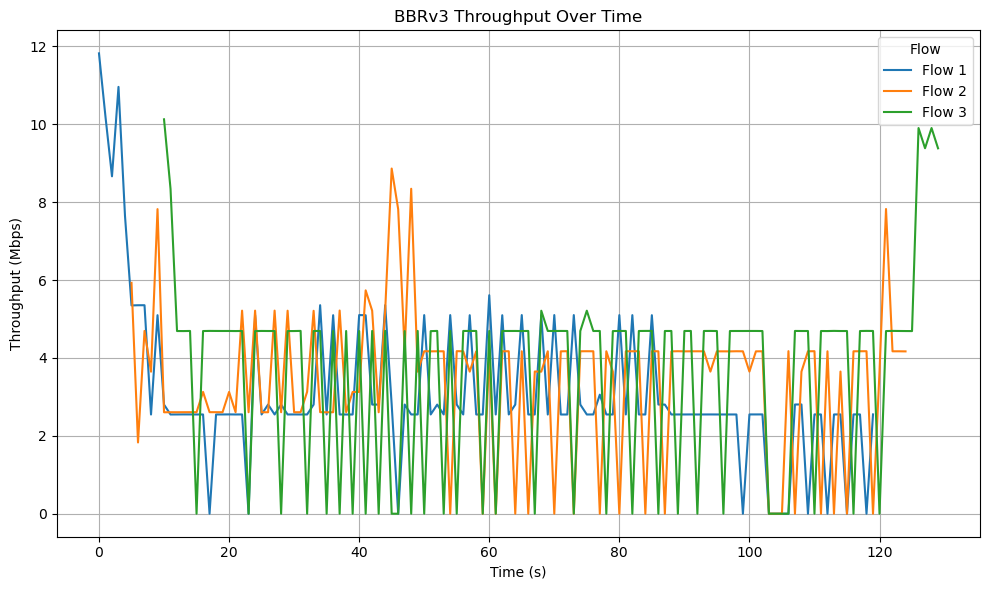

✅ Saved: /home/sit/Downloads/3 flows_5s_staggered/plot json2/bbrv3_plots/throughput.png


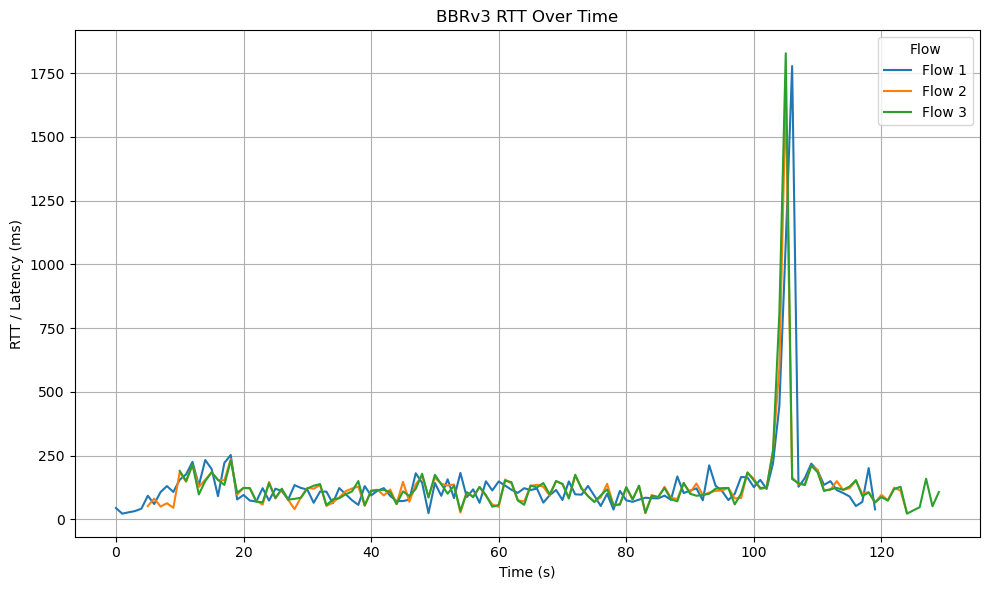

✅ Saved: /home/sit/Downloads/3 flows_5s_staggered/plot json2/bbrv3_plots/rtt.png


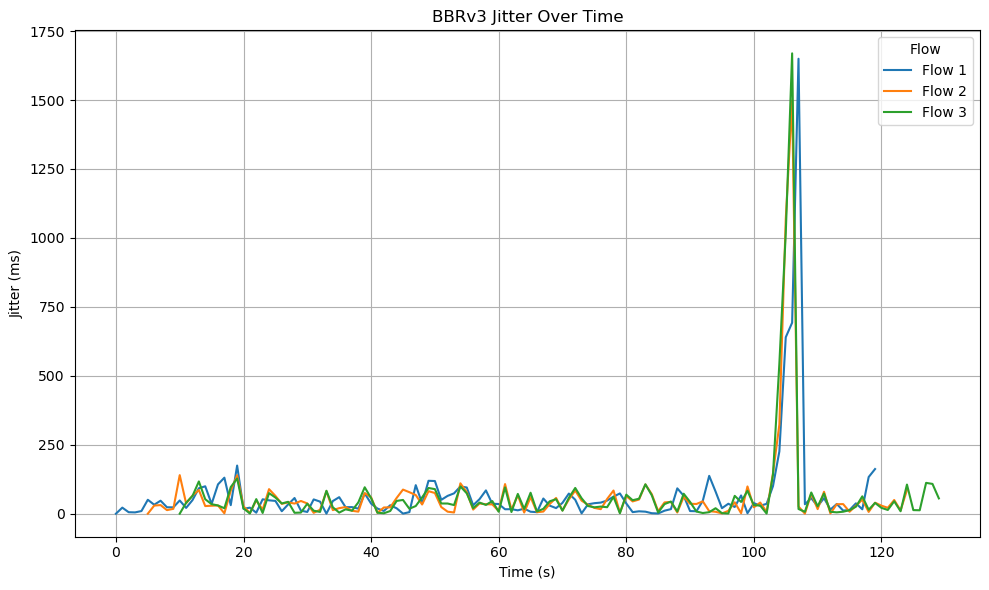

✅ Saved: /home/sit/Downloads/3 flows_5s_staggered/plot json2/bbrv3_plots/jitter.png


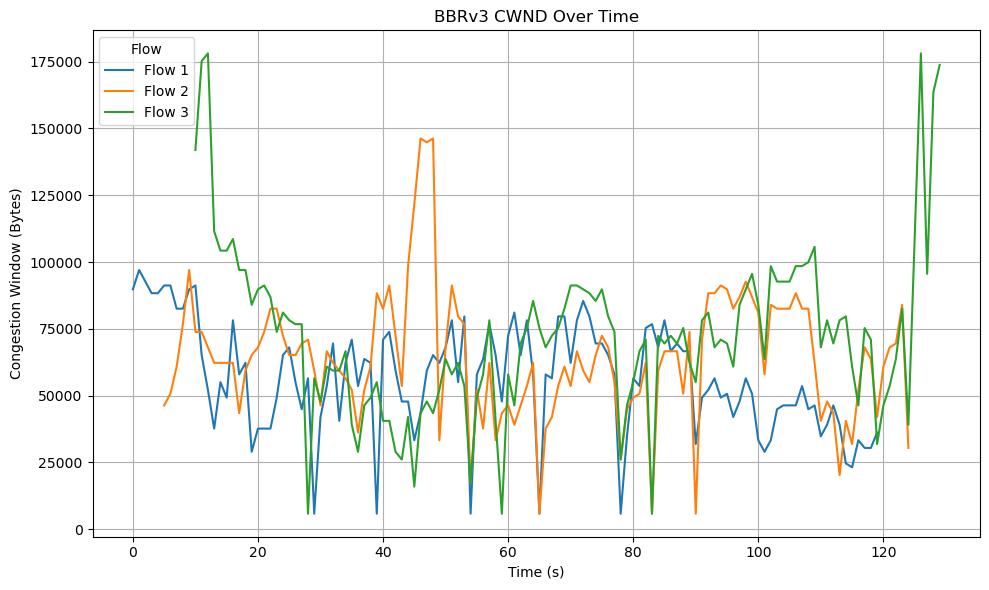

✅ Saved: /home/sit/Downloads/3 flows_5s_staggered/plot json2/bbrv3_plots/cwnd.png


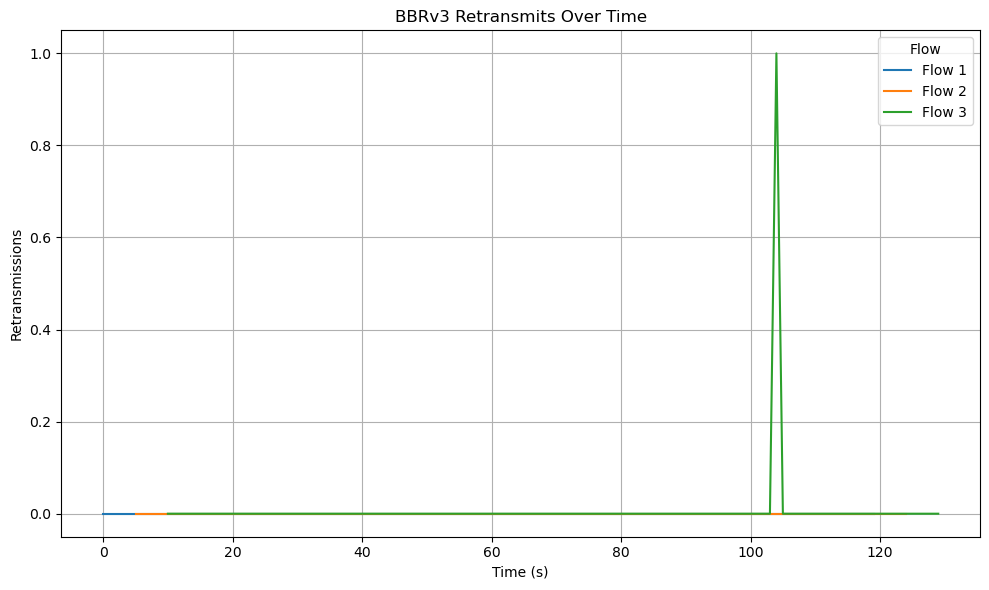

✅ Saved: /home/sit/Downloads/3 flows_5s_staggered/plot json2/bbrv3_plots/retransmits.png


In [73]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt

def extract_metrics(filepath, label, time_offset=0):
    with open(filepath) as f:
        data = json.load(f)

    metrics = []
    prev_rtt_ms = None

    for i, interval in enumerate(data.get("intervals", [])):
        stream = interval["streams"][0]
        rtt_ms = stream.get("rtt", 0) / 1000  # Convert µs to ms
        jitter_ms = abs(rtt_ms - prev_rtt_ms) if prev_rtt_ms is not None else 0
        prev_rtt_ms = rtt_ms

        metrics.append({
            "time_sec": i + time_offset,  # 🕒 Add offset for staggered start
            "throughput_mbps": stream.get("bits_per_second", 0) / 1e6,
            "rtt_ms": rtt_ms,
            "jitter_ms": jitter_ms,
            "cwnd_bytes": stream.get("snd_cwnd", 0),
            "retransmits": stream.get("retransmits", 0),
            "label": label
        })

    return pd.DataFrame(metrics)

def plot_metric(df, metric, ylabel, title, save_path):
    plt.figure(figsize=(10, 6))
    for label, group in df.groupby("label"):
        plt.plot(group["time_sec"], group[metric], label=label)
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(title="Flow")
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()
    plt.close()
    print(f"✅ Saved: {save_path}")

def process_tcp_flows(folder_path, file_pattern, output_csv_name, algo_name):
    all_data = []

    for i in range(1, 6):
        filename = file_pattern.format(i)
        filepath = os.path.join(folder_path, filename)
        label = f"Flow {i}"
        if os.path.exists(filepath):
            time_offset = (i - 1) * 5  # ⏱️ Stagger each flow by 15s
            df = extract_metrics(filepath, label, time_offset)
            all_data.append(df)
        else:
            print(f"❌ File not found: {filepath}")

    if not all_data:
        print("⚠️ No data to process.")
        return

    df_all = pd.concat(all_data, ignore_index=True)
    
    # Save CSV
    output_csv = os.path.join(folder_path, output_csv_name)
    df_all.to_csv(output_csv, index=False)
    print(f"✅ CSV saved to: {output_csv}")

    # Create directory for plots
    plot_dir = os.path.join(folder_path, f"{algo_name.lower()}_plots")
    os.makedirs(plot_dir, exist_ok=True)

    # Plot metrics
    plot_metric(df_all, "throughput_mbps", "Throughput (Mbps)", f"{algo_name} Throughput Over Time", os.path.join(plot_dir, "throughput.png"))
    plot_metric(df_all, "rtt_ms", "RTT / Latency (ms)", f"{algo_name} RTT Over Time", os.path.join(plot_dir, "rtt.png"))
    plot_metric(df_all, "jitter_ms", "Jitter (ms)", f"{algo_name} Jitter Over Time", os.path.join(plot_dir, "jitter.png"))
    plot_metric(df_all, "cwnd_bytes", "Congestion Window (Bytes)", f"{algo_name} CWND Over Time", os.path.join(plot_dir, "cwnd.png"))
    plot_metric(df_all, "retransmits", "Retransmissions", f"{algo_name} Retransmits Over Time", os.path.join(plot_dir, "retransmits.png"))

# --------------------------------------------
# ✅ Example: To run it (e.g., for BBRv3)
process_tcp_flows(
    folder_path="/home/sit/Downloads/3 flows_5s_staggered/plot json2",
    file_pattern="bbr3_5s_staggered_flow{}_2.json",  # Adjust pattern as needed
    output_csv_name="tcp_metrics_3_flows_5s_staggered2.csv",
    algo_name="BBRv3"
)


2 flow 5s staggered


❌ File not found: /home/sit/Downloads/2 flows_5s_staggered/plot json/bbr3_5s_staggered_flow3.json
❌ File not found: /home/sit/Downloads/2 flows_5s_staggered/plot json/bbr3_5s_staggered_flow4.json
❌ File not found: /home/sit/Downloads/2 flows_5s_staggered/plot json/bbr3_5s_staggered_flow5.json
✅ CSV saved to: /home/sit/Downloads/2 flows_5s_staggered/plot json/tcp_metrics_2_flows_5s_staggered.csv


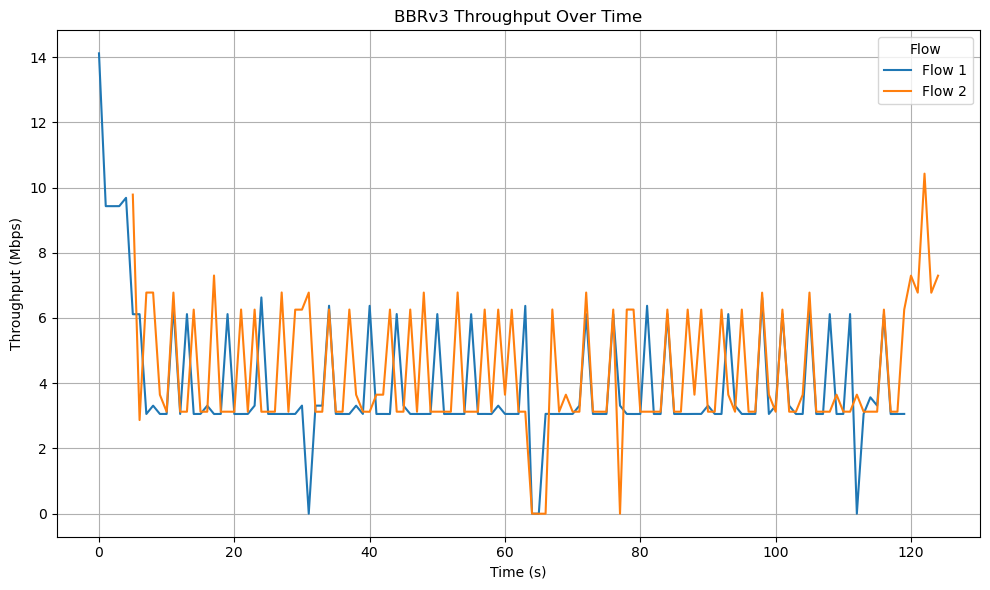

✅ Saved: /home/sit/Downloads/2 flows_5s_staggered/plot json/bbrv3_plots/throughput.png


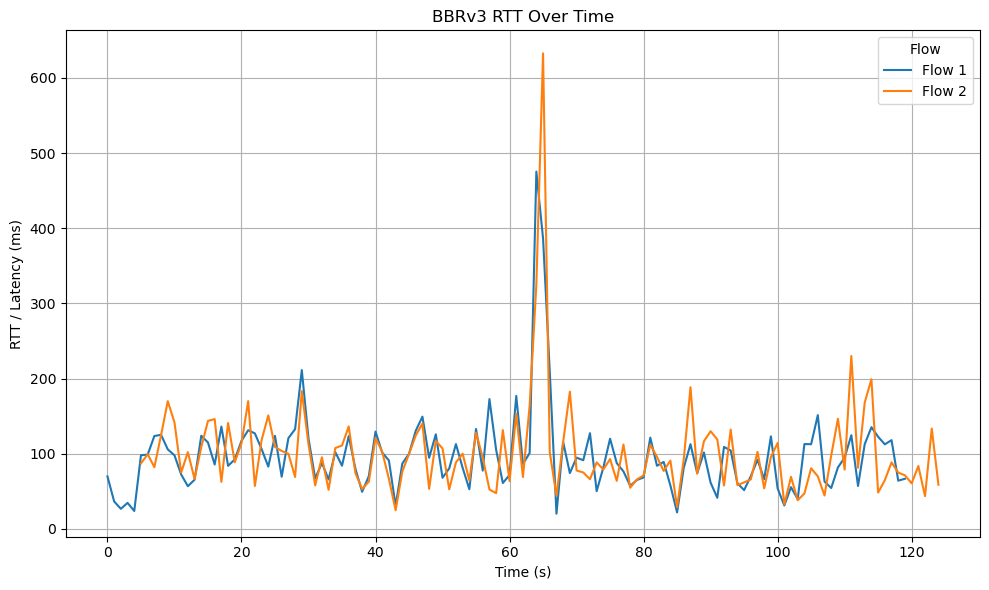

✅ Saved: /home/sit/Downloads/2 flows_5s_staggered/plot json/bbrv3_plots/rtt.png


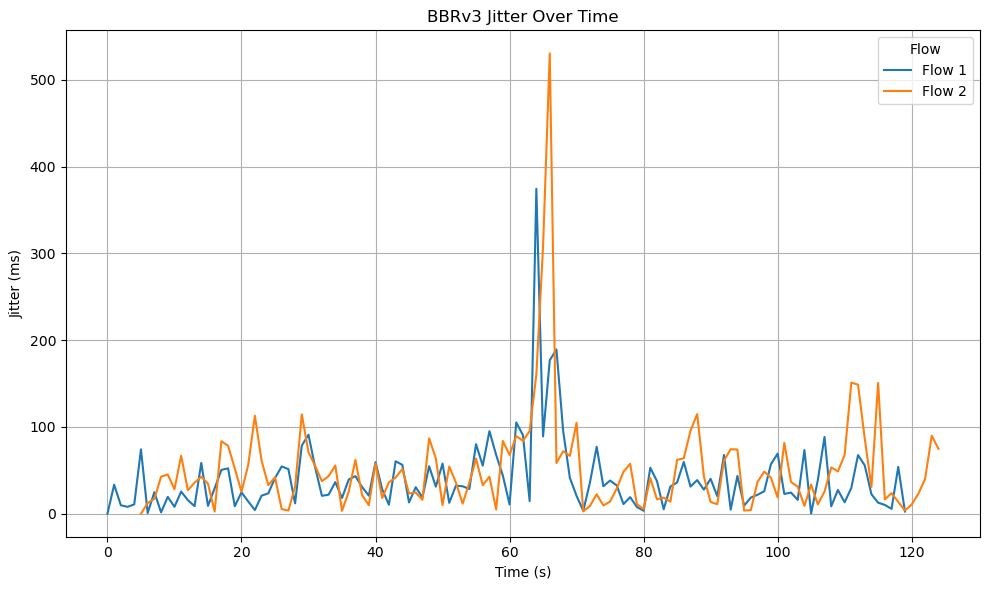

✅ Saved: /home/sit/Downloads/2 flows_5s_staggered/plot json/bbrv3_plots/jitter.png


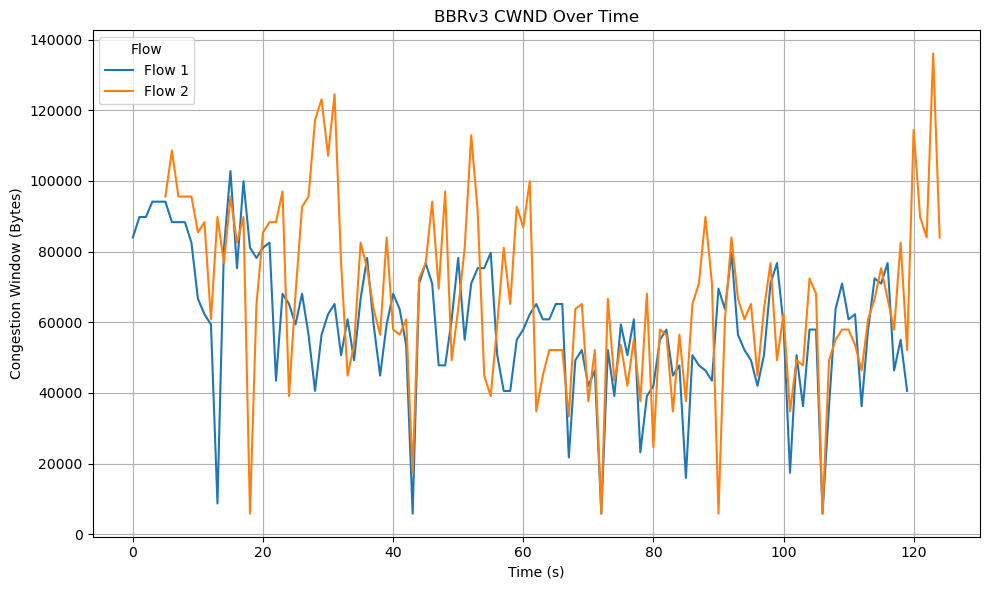

✅ Saved: /home/sit/Downloads/2 flows_5s_staggered/plot json/bbrv3_plots/cwnd.png


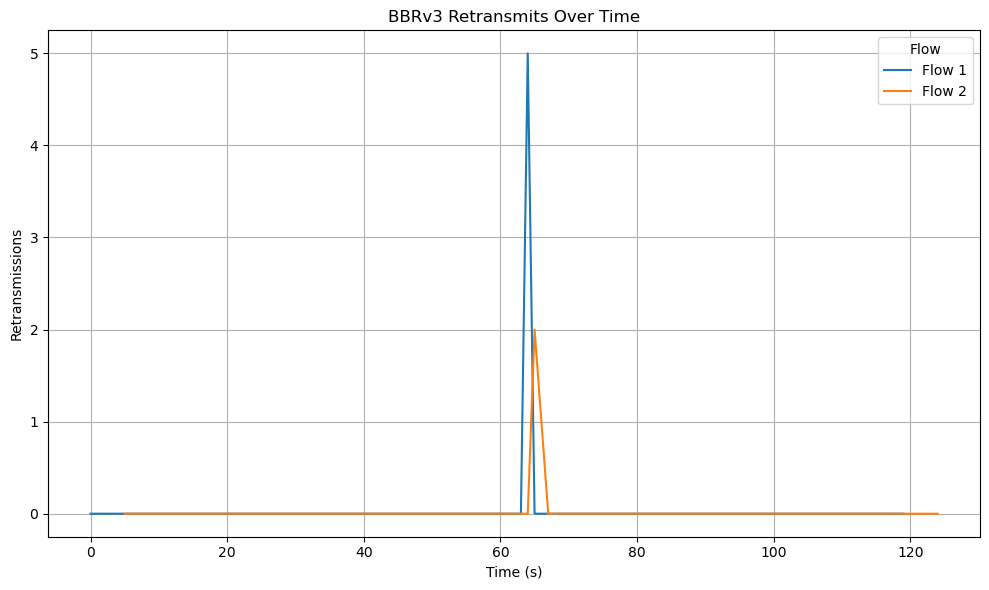

✅ Saved: /home/sit/Downloads/2 flows_5s_staggered/plot json/bbrv3_plots/retransmits.png


In [76]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt

def extract_metrics(filepath, label, time_offset=0):
    with open(filepath) as f:
        data = json.load(f)

    metrics = []
    prev_rtt_ms = None

    for i, interval in enumerate(data.get("intervals", [])):
        stream = interval["streams"][0]
        rtt_ms = stream.get("rtt", 0) / 1000  # Convert µs to ms
        jitter_ms = abs(rtt_ms - prev_rtt_ms) if prev_rtt_ms is not None else 0
        prev_rtt_ms = rtt_ms

        metrics.append({
            "time_sec": i + time_offset,  # 🕒 Add offset for staggered start
            "throughput_mbps": stream.get("bits_per_second", 0) / 1e6,
            "rtt_ms": rtt_ms,
            "jitter_ms": jitter_ms,
            "cwnd_bytes": stream.get("snd_cwnd", 0),
            "retransmits": stream.get("retransmits", 0),
            "label": label
        })

    return pd.DataFrame(metrics)

def plot_metric(df, metric, ylabel, title, save_path):
    plt.figure(figsize=(10, 6))
    for label, group in df.groupby("label"):
        plt.plot(group["time_sec"], group[metric], label=label)
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(title="Flow")
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()
    plt.close()
    print(f"✅ Saved: {save_path}")

def process_tcp_flows(folder_path, file_pattern, output_csv_name, algo_name):
    all_data = []

    for i in range(1, 6):
        filename = file_pattern.format(i)
        filepath = os.path.join(folder_path, filename)
        label = f"Flow {i}"
        if os.path.exists(filepath):
            time_offset = (i - 1) * 5  # ⏱️ Stagger each flow by 15s
            df = extract_metrics(filepath, label, time_offset)
            all_data.append(df)
        else:
            print(f"❌ File not found: {filepath}")

    if not all_data:
        print("⚠️ No data to process.")
        return

    df_all = pd.concat(all_data, ignore_index=True)
    
    # Save CSV
    output_csv = os.path.join(folder_path, output_csv_name)
    df_all.to_csv(output_csv, index=False)
    print(f"✅ CSV saved to: {output_csv}")

    # Create directory for plots
    plot_dir = os.path.join(folder_path, f"{algo_name.lower()}_plots")
    os.makedirs(plot_dir, exist_ok=True)

    # Plot metrics
    plot_metric(df_all, "throughput_mbps", "Throughput (Mbps)", f"{algo_name} Throughput Over Time", os.path.join(plot_dir, "throughput.png"))
    plot_metric(df_all, "rtt_ms", "RTT / Latency (ms)", f"{algo_name} RTT Over Time", os.path.join(plot_dir, "rtt.png"))
    plot_metric(df_all, "jitter_ms", "Jitter (ms)", f"{algo_name} Jitter Over Time", os.path.join(plot_dir, "jitter.png"))
    plot_metric(df_all, "cwnd_bytes", "Congestion Window (Bytes)", f"{algo_name} CWND Over Time", os.path.join(plot_dir, "cwnd.png"))
    plot_metric(df_all, "retransmits", "Retransmissions", f"{algo_name} Retransmits Over Time", os.path.join(plot_dir, "retransmits.png"))

# --------------------------------------------
# ✅ Example: To run it (e.g., for BBRv3)
process_tcp_flows(
    folder_path="/home/sit/Downloads/2 flows_5s_staggered/plot json",
    file_pattern="bbr3_5s_staggered_flow{}.json",  # Adjust pattern as needed
    output_csv_name="tcp_metrics_2_flows_5s_staggered.csv",
    algo_name="BBRv3"
)


❌ File not found: /home/sit/Downloads/2 flows_5s_staggered/plot json1/bbr3_5s_staggered_flow3_1.json
❌ File not found: /home/sit/Downloads/2 flows_5s_staggered/plot json1/bbr3_5s_staggered_flow4_1.json
❌ File not found: /home/sit/Downloads/2 flows_5s_staggered/plot json1/bbr3_5s_staggered_flow5_1.json
✅ CSV saved to: /home/sit/Downloads/2 flows_5s_staggered/plot json1/tcp_metrics_2_flows_5s_staggered1.csv


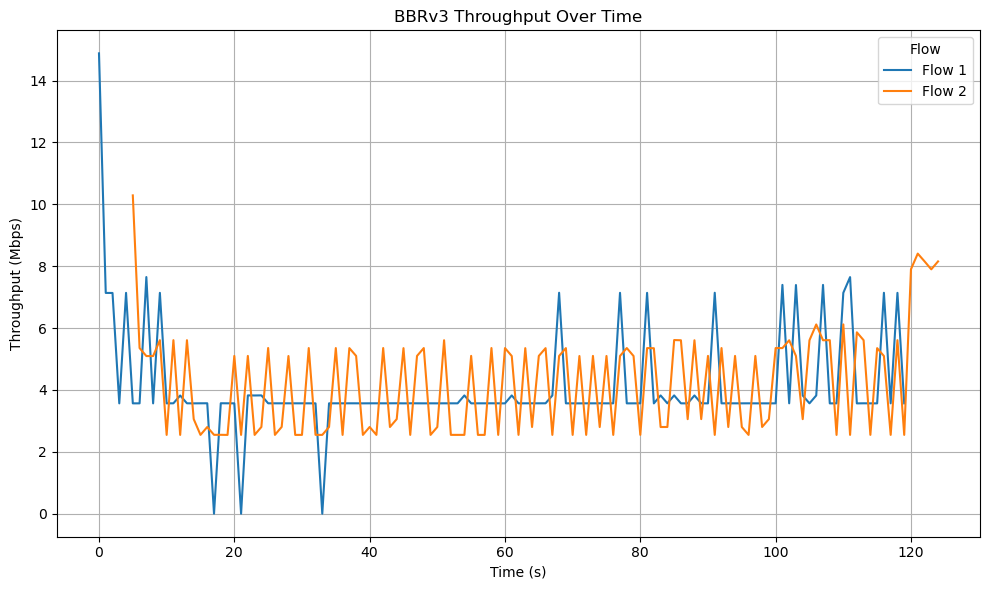

✅ Saved: /home/sit/Downloads/2 flows_5s_staggered/plot json1/bbrv3_plots/throughput.png


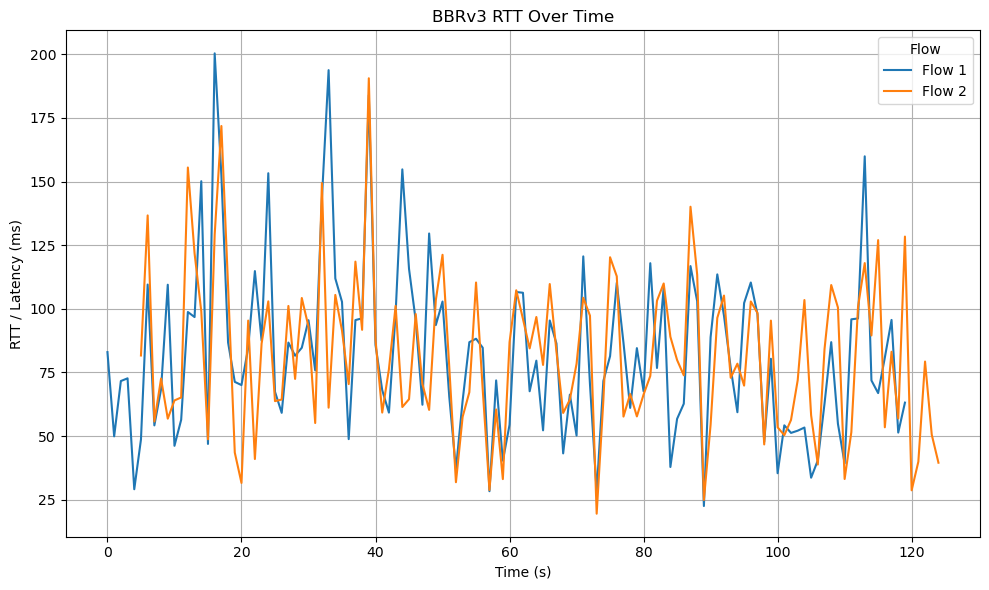

✅ Saved: /home/sit/Downloads/2 flows_5s_staggered/plot json1/bbrv3_plots/rtt.png


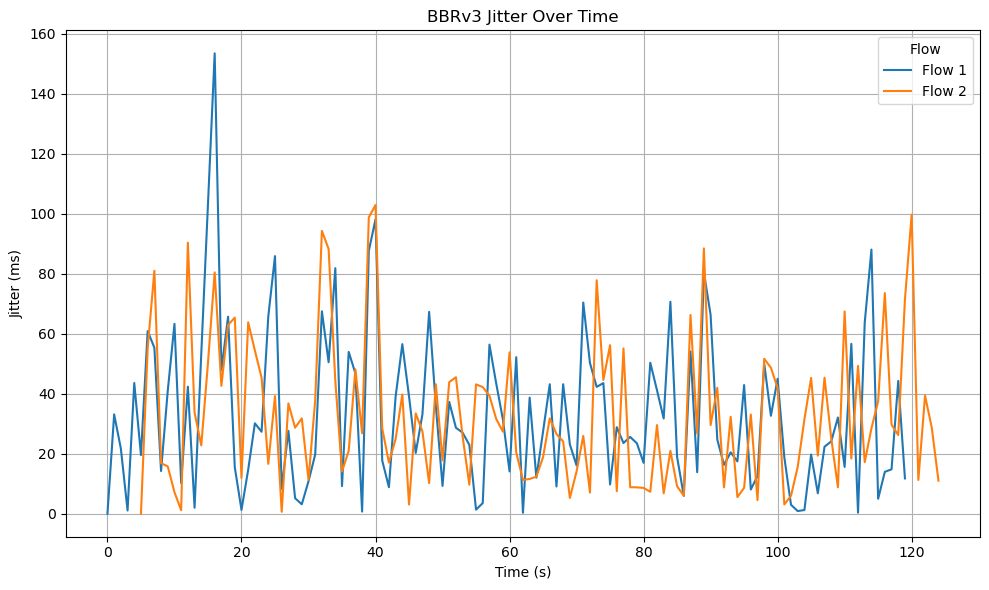

✅ Saved: /home/sit/Downloads/2 flows_5s_staggered/plot json1/bbrv3_plots/jitter.png


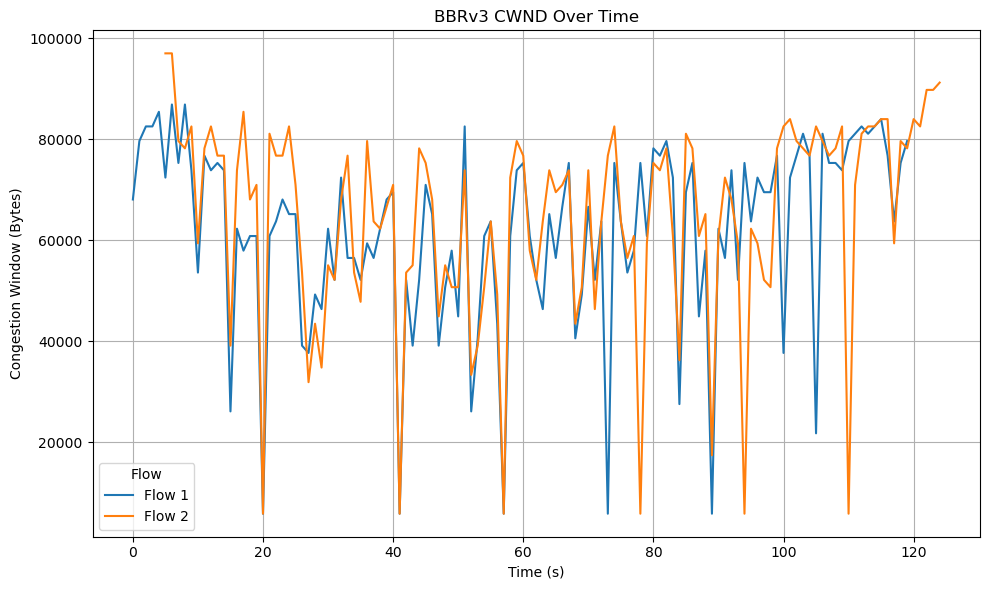

✅ Saved: /home/sit/Downloads/2 flows_5s_staggered/plot json1/bbrv3_plots/cwnd.png


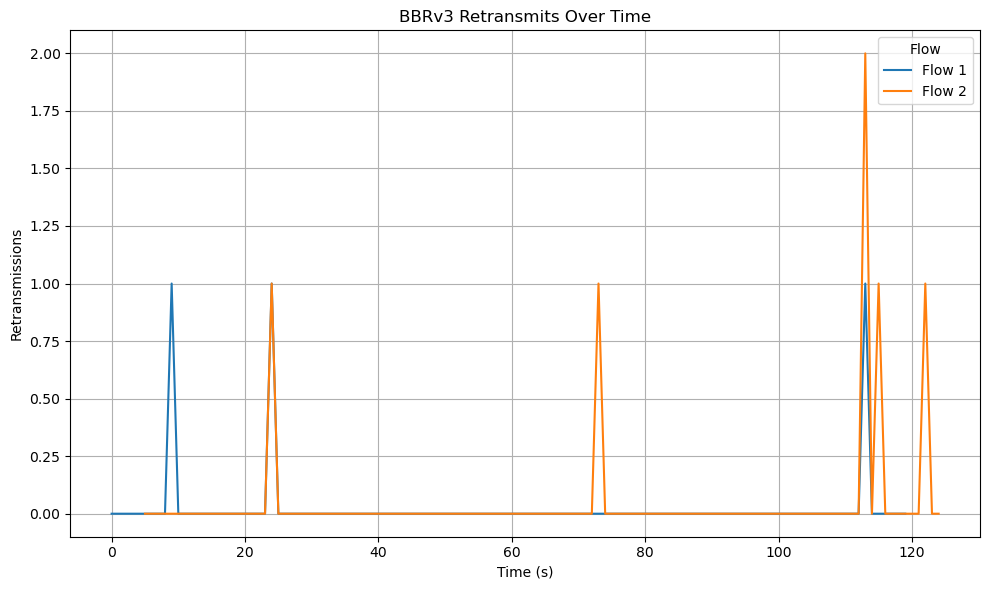

✅ Saved: /home/sit/Downloads/2 flows_5s_staggered/plot json1/bbrv3_plots/retransmits.png


In [77]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt

def extract_metrics(filepath, label, time_offset=0):
    with open(filepath) as f:
        data = json.load(f)

    metrics = []
    prev_rtt_ms = None

    for i, interval in enumerate(data.get("intervals", [])):
        stream = interval["streams"][0]
        rtt_ms = stream.get("rtt", 0) / 1000  # Convert µs to ms
        jitter_ms = abs(rtt_ms - prev_rtt_ms) if prev_rtt_ms is not None else 0
        prev_rtt_ms = rtt_ms

        metrics.append({
            "time_sec": i + time_offset,  # 🕒 Add offset for staggered start
            "throughput_mbps": stream.get("bits_per_second", 0) / 1e6,
            "rtt_ms": rtt_ms,
            "jitter_ms": jitter_ms,
            "cwnd_bytes": stream.get("snd_cwnd", 0),
            "retransmits": stream.get("retransmits", 0),
            "label": label
        })

    return pd.DataFrame(metrics)

def plot_metric(df, metric, ylabel, title, save_path):
    plt.figure(figsize=(10, 6))
    for label, group in df.groupby("label"):
        plt.plot(group["time_sec"], group[metric], label=label)
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(title="Flow")
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()
    plt.close()
    print(f"✅ Saved: {save_path}")

def process_tcp_flows(folder_path, file_pattern, output_csv_name, algo_name):
    all_data = []

    for i in range(1, 6):
        filename = file_pattern.format(i)
        filepath = os.path.join(folder_path, filename)
        label = f"Flow {i}"
        if os.path.exists(filepath):
            time_offset = (i - 1) * 5  # ⏱️ Stagger each flow by 15s
            df = extract_metrics(filepath, label, time_offset)
            all_data.append(df)
        else:
            print(f"❌ File not found: {filepath}")

    if not all_data:
        print("⚠️ No data to process.")
        return

    df_all = pd.concat(all_data, ignore_index=True)
    
    # Save CSV
    output_csv = os.path.join(folder_path, output_csv_name)
    df_all.to_csv(output_csv, index=False)
    print(f"✅ CSV saved to: {output_csv}")

    # Create directory for plots
    plot_dir = os.path.join(folder_path, f"{algo_name.lower()}_plots")
    os.makedirs(plot_dir, exist_ok=True)

    # Plot metrics
    plot_metric(df_all, "throughput_mbps", "Throughput (Mbps)", f"{algo_name} Throughput Over Time", os.path.join(plot_dir, "throughput.png"))
    plot_metric(df_all, "rtt_ms", "RTT / Latency (ms)", f"{algo_name} RTT Over Time", os.path.join(plot_dir, "rtt.png"))
    plot_metric(df_all, "jitter_ms", "Jitter (ms)", f"{algo_name} Jitter Over Time", os.path.join(plot_dir, "jitter.png"))
    plot_metric(df_all, "cwnd_bytes", "Congestion Window (Bytes)", f"{algo_name} CWND Over Time", os.path.join(plot_dir, "cwnd.png"))
    plot_metric(df_all, "retransmits", "Retransmissions", f"{algo_name} Retransmits Over Time", os.path.join(plot_dir, "retransmits.png"))

# --------------------------------------------
# ✅ Example: To run it (e.g., for BBRv3)
process_tcp_flows(
    folder_path="/home/sit/Downloads/2 flows_5s_staggered/plot json1",
    file_pattern="bbr3_5s_staggered_flow{}_1.json",  # Adjust pattern as needed
    output_csv_name="tcp_metrics_2_flows_5s_staggered1.csv",
    algo_name="BBRv3"
)


❌ File not found: /home/sit/Downloads/2 flows_5s_staggered/plot json2/bbr3_5s_staggered_flow3_2.json
❌ File not found: /home/sit/Downloads/2 flows_5s_staggered/plot json2/bbr3_5s_staggered_flow4_2.json
❌ File not found: /home/sit/Downloads/2 flows_5s_staggered/plot json2/bbr3_5s_staggered_flow5_2.json
✅ CSV saved to: /home/sit/Downloads/2 flows_5s_staggered/plot json2/tcp_metrics_2_flows_5s_staggered2.csv


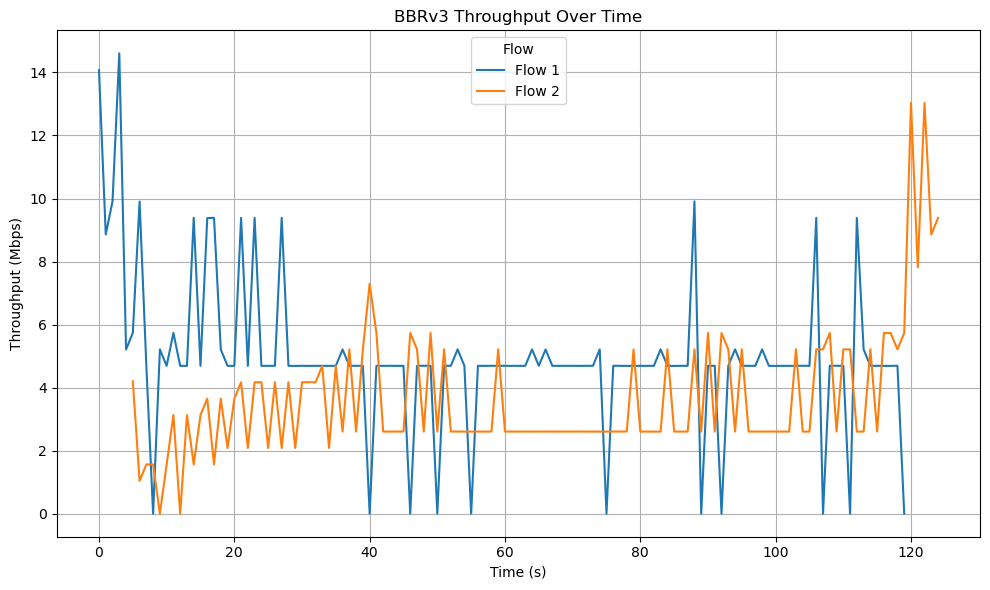

✅ Saved: /home/sit/Downloads/2 flows_5s_staggered/plot json2/bbrv3_plots/throughput.png


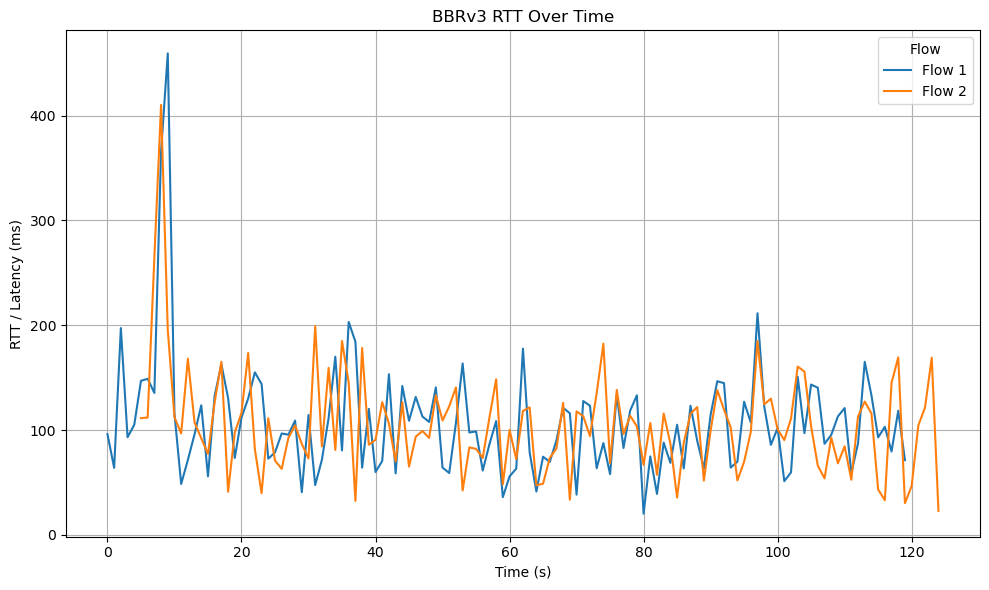

✅ Saved: /home/sit/Downloads/2 flows_5s_staggered/plot json2/bbrv3_plots/rtt.png


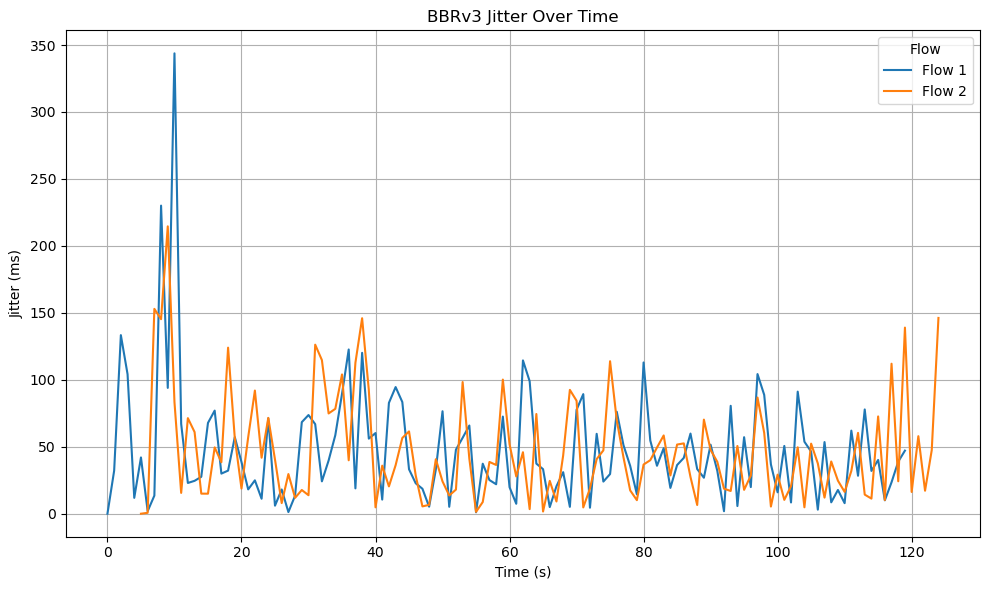

✅ Saved: /home/sit/Downloads/2 flows_5s_staggered/plot json2/bbrv3_plots/jitter.png


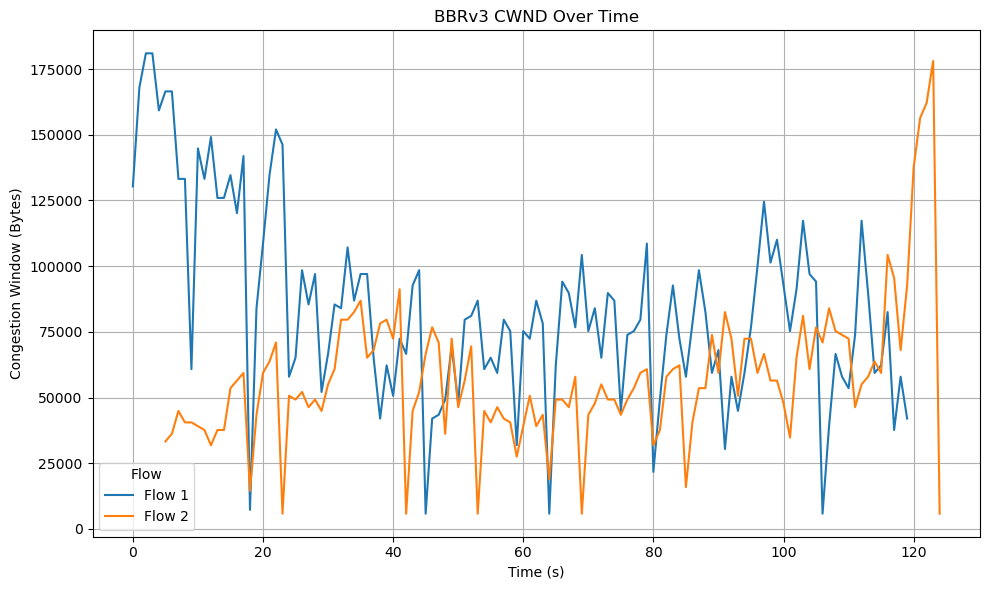

✅ Saved: /home/sit/Downloads/2 flows_5s_staggered/plot json2/bbrv3_plots/cwnd.png


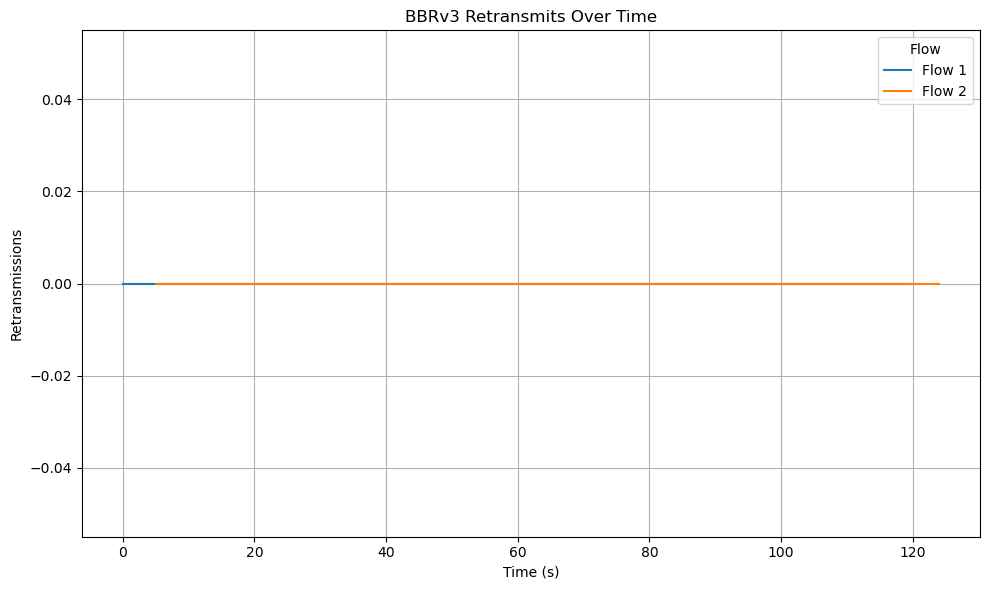

✅ Saved: /home/sit/Downloads/2 flows_5s_staggered/plot json2/bbrv3_plots/retransmits.png


In [80]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt

def extract_metrics(filepath, label, time_offset=0):
    with open(filepath) as f:
        data = json.load(f)

    metrics = []
    prev_rtt_ms = None

    for i, interval in enumerate(data.get("intervals", [])):
        stream = interval["streams"][0]
        rtt_ms = stream.get("rtt", 0) / 1000  # Convert µs to ms
        jitter_ms = abs(rtt_ms - prev_rtt_ms) if prev_rtt_ms is not None else 0
        prev_rtt_ms = rtt_ms

        metrics.append({
            "time_sec": i + time_offset,  # 🕒 Add offset for staggered start
            "throughput_mbps": stream.get("bits_per_second", 0) / 1e6,
            "rtt_ms": rtt_ms,
            "jitter_ms": jitter_ms,
            "cwnd_bytes": stream.get("snd_cwnd", 0),
            "retransmits": stream.get("retransmits", 0),
            "label": label
        })

    return pd.DataFrame(metrics)

def plot_metric(df, metric, ylabel, title, save_path):
    plt.figure(figsize=(10, 6))
    for label, group in df.groupby("label"):
        plt.plot(group["time_sec"], group[metric], label=label)
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(title="Flow")
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()
    plt.close()
    print(f"✅ Saved: {save_path}")

def process_tcp_flows(folder_path, file_pattern, output_csv_name, algo_name):
    all_data = []

    for i in range(1, 6):
        filename = file_pattern.format(i)
        filepath = os.path.join(folder_path, filename)
        label = f"Flow {i}"
        if os.path.exists(filepath):
            time_offset = (i - 1) * 5  # ⏱️ Stagger each flow by 15s
            df = extract_metrics(filepath, label, time_offset)
            all_data.append(df)
        else:
            print(f"❌ File not found: {filepath}")

    if not all_data:
        print("⚠️ No data to process.")
        return

    df_all = pd.concat(all_data, ignore_index=True)
    
    # Save CSV
    output_csv = os.path.join(folder_path, output_csv_name)
    df_all.to_csv(output_csv, index=False)
    print(f"✅ CSV saved to: {output_csv}")

    # Create directory for plots
    plot_dir = os.path.join(folder_path, f"{algo_name.lower()}_plots")
    os.makedirs(plot_dir, exist_ok=True)

    # Plot metrics
    plot_metric(df_all, "throughput_mbps", "Throughput (Mbps)", f"{algo_name} Throughput Over Time", os.path.join(plot_dir, "throughput.png"))
    plot_metric(df_all, "rtt_ms", "RTT / Latency (ms)", f"{algo_name} RTT Over Time", os.path.join(plot_dir, "rtt.png"))
    plot_metric(df_all, "jitter_ms", "Jitter (ms)", f"{algo_name} Jitter Over Time", os.path.join(plot_dir, "jitter.png"))
    plot_metric(df_all, "cwnd_bytes", "Congestion Window (Bytes)", f"{algo_name} CWND Over Time", os.path.join(plot_dir, "cwnd.png"))
    plot_metric(df_all, "retransmits", "Retransmissions", f"{algo_name} Retransmits Over Time", os.path.join(plot_dir, "retransmits.png"))

# --------------------------------------------
# ✅ Example: To run it (e.g., for BBRv3)
process_tcp_flows(
    folder_path="/home/sit/Downloads/2 flows_5s_staggered/plot json2",
    file_pattern="bbr3_5s_staggered_flow{}_2.json",  # Adjust pattern as needed
    output_csv_name="tcp_metrics_2_flows_5s_staggered2.csv",
    algo_name="BBRv3"
)


In [81]:
/home/sit/Downloads/bbrv3/plot json11/bbr3_flow1_11.json /home/sit/Downloads/bbrv3/plot json11/cubic_flow1_11.json

SyntaxError: invalid syntax (1838253066.py, line 1)

✅ CSV saved to: /home/sit/Downloads/bbrv3/plot json11/comparison_bbr3_vs_cubic_no_stagger.csv


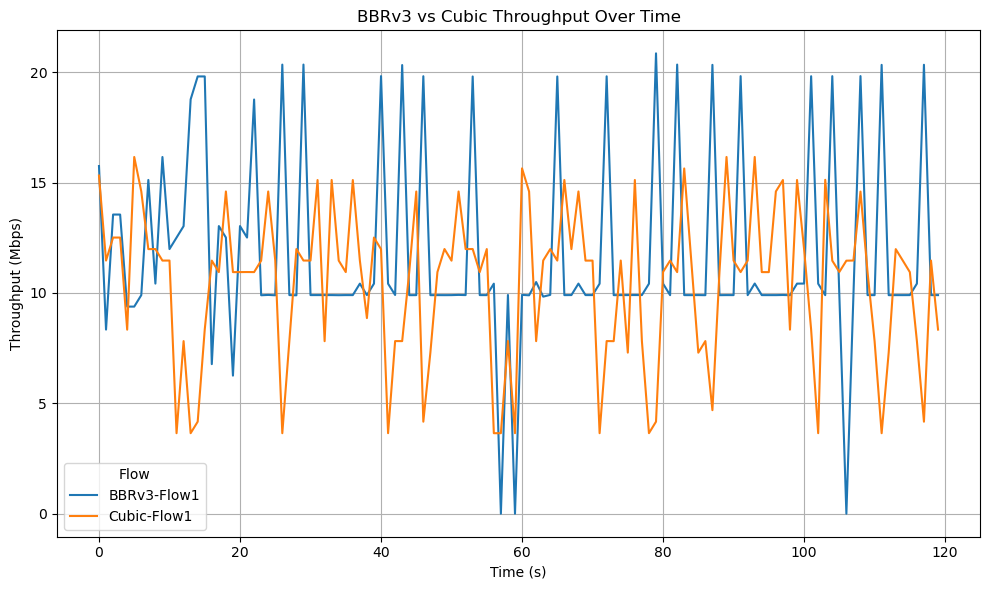

✅ Saved: /home/sit/Downloads/bbrv3/plot json11/bbrv3_vs_cubic_plots/throughput.png


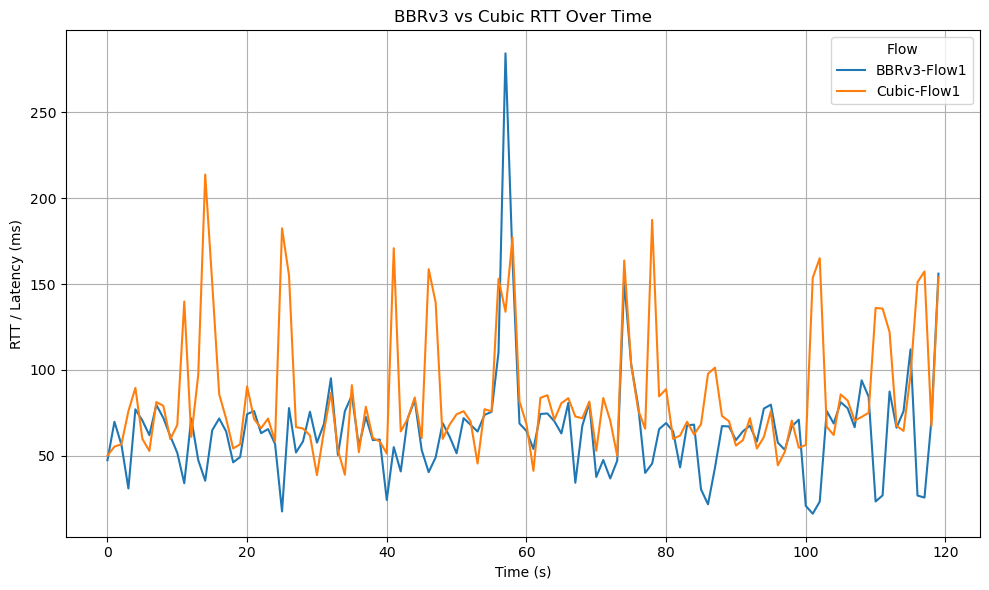

✅ Saved: /home/sit/Downloads/bbrv3/plot json11/bbrv3_vs_cubic_plots/rtt.png


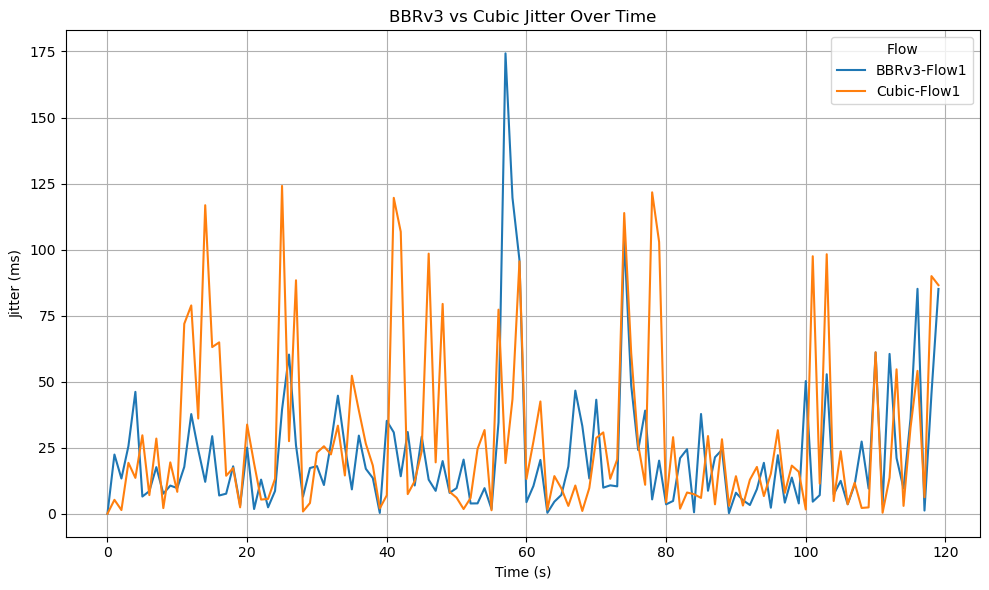

✅ Saved: /home/sit/Downloads/bbrv3/plot json11/bbrv3_vs_cubic_plots/jitter.png


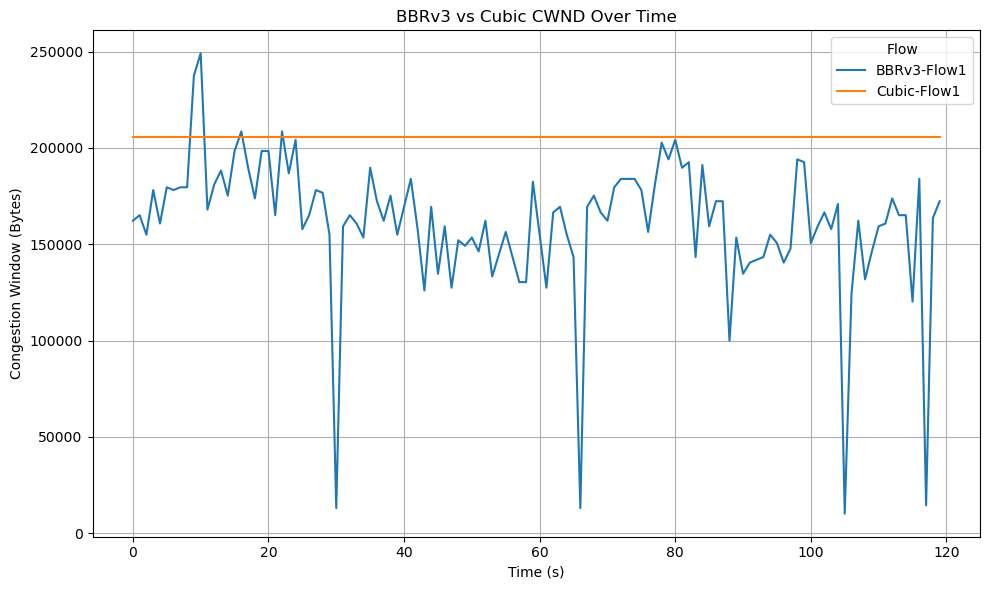

✅ Saved: /home/sit/Downloads/bbrv3/plot json11/bbrv3_vs_cubic_plots/cwnd.png


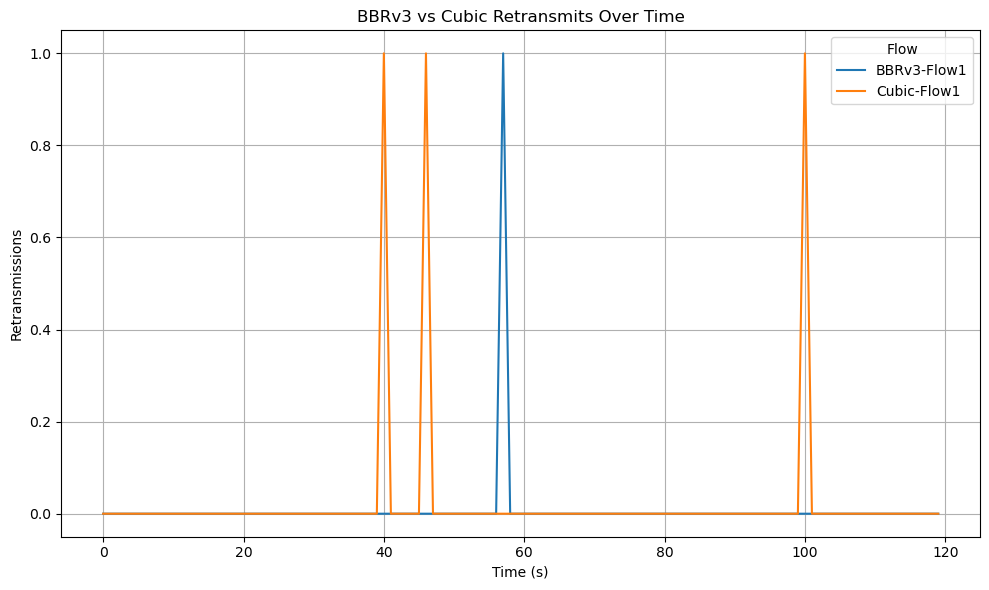

✅ Saved: /home/sit/Downloads/bbrv3/plot json11/bbrv3_vs_cubic_plots/retransmits.png


In [82]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt

def extract_metrics(filepath, label):
    with open(filepath) as f:
        data = json.load(f)

    metrics = []
    prev_rtt_ms = None

    for i, interval in enumerate(data.get("intervals", [])):
        stream = interval["streams"][0]
        rtt_ms = stream.get("rtt", 0) / 1000  # Convert µs to ms
        jitter_ms = abs(rtt_ms - prev_rtt_ms) if prev_rtt_ms is not None else 0
        prev_rtt_ms = rtt_ms

        metrics.append({
            "time_sec": i,
            "throughput_mbps": stream.get("bits_per_second", 0) / 1e6,
            "rtt_ms": rtt_ms,
            "jitter_ms": jitter_ms,
            "cwnd_bytes": stream.get("snd_cwnd", 0),
            "retransmits": stream.get("retransmits", 0),
            "label": label
        })

    return pd.DataFrame(metrics)

def plot_metric(df, metric, ylabel, title, save_path):
    plt.figure(figsize=(10, 6))
    for label, group in df.groupby("label"):
        plt.plot(group["time_sec"], group[metric], label=label)
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(title="Flow")
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()
    plt.close()
    print(f"✅ Saved: {save_path}")

def compare_algos_no_stagger(folder_path, algo_files, output_csv_name, plot_title_prefix):
    all_data = []

    for algo_name, file_prefix in algo_files.items():
        for i in range(1, 2):  # Adjust if more flows exist
            filename = f"{file_prefix}_flow{i}_11.json"
            filepath = os.path.join(folder_path, filename)
            label = f"{algo_name}-Flow{i}"
            if os.path.exists(filepath):
                df = extract_metrics(filepath, label)
                all_data.append(df)
            else:
                print(f"❌ File not found: {filepath}")

    if not all_data:
        print("⚠️ No data to process.")
        return

    df_all = pd.concat(all_data, ignore_index=True)

    # Save CSV
    output_csv = os.path.join(folder_path, output_csv_name)
    df_all.to_csv(output_csv, index=False)
    print(f"✅ CSV saved to: {output_csv}")

    # Create directory for plots
    plot_dir = os.path.join(folder_path, f"{plot_title_prefix.lower().replace(' ', '_')}_plots")
    os.makedirs(plot_dir, exist_ok=True)

    # Plot metrics
    plot_metric(df_all, "throughput_mbps", "Throughput (Mbps)", f"{plot_title_prefix} Throughput Over Time", os.path.join(plot_dir, "throughput.png"))
    plot_metric(df_all, "rtt_ms", "RTT / Latency (ms)", f"{plot_title_prefix} RTT Over Time", os.path.join(plot_dir, "rtt.png"))
    plot_metric(df_all, "jitter_ms", "Jitter (ms)", f"{plot_title_prefix} Jitter Over Time", os.path.join(plot_dir, "jitter.png"))
    plot_metric(df_all, "cwnd_bytes", "Congestion Window (Bytes)", f"{plot_title_prefix} CWND Over Time", os.path.join(plot_dir, "cwnd.png"))
    plot_metric(df_all, "retransmits", "Retransmissions", f"{plot_title_prefix} Retransmits Over Time", os.path.join(plot_dir, "retransmits.png"))

# ------------------------------
# ✅ Run comparison (No Staggering)
compare_algos_no_stagger(
    folder_path="/home/sit/Downloads/bbrv3/plot json11",
    algo_files={
        "BBRv3": "bbr3",
        "Cubic": "cubic"
    },
    output_csv_name="comparison_bbr3_vs_cubic_no_stagger.csv",
    plot_title_prefix="BBRv3 vs Cubic"
)


✅ CSV saved to: /home/sit/Downloads/bbrv3/plot json11/bbr3_vs_cubic_metrics.csv


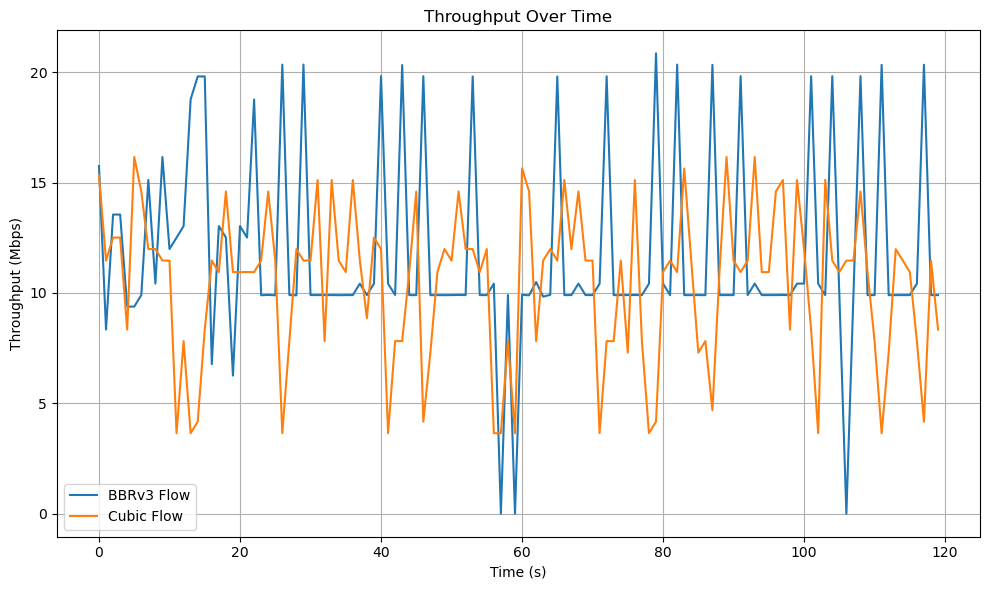

✅ Saved: /home/sit/Downloads/bbrv3/plot json11/mixed_algo_plots/throughput.png


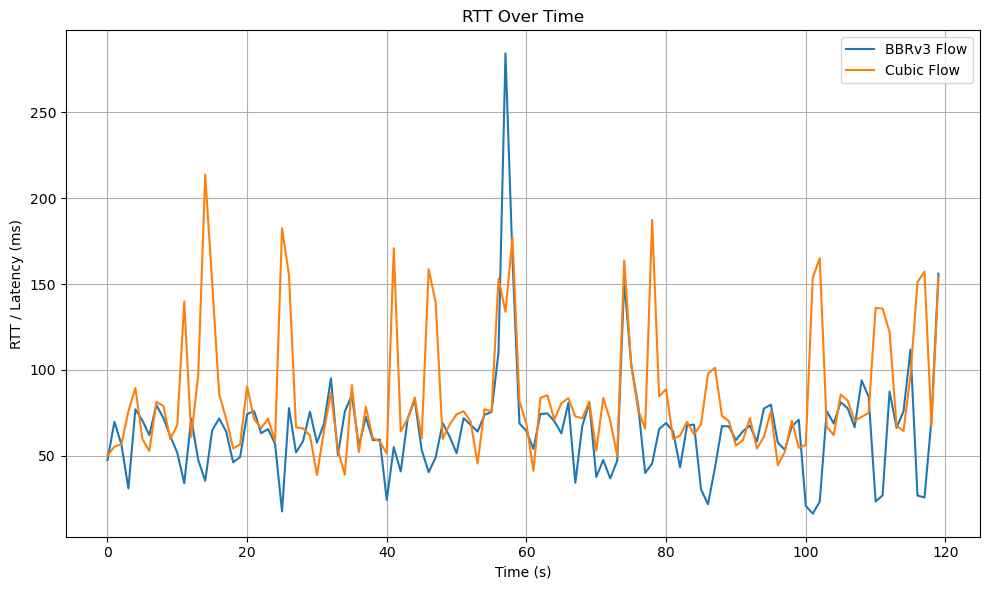

✅ Saved: /home/sit/Downloads/bbrv3/plot json11/mixed_algo_plots/rtt.png


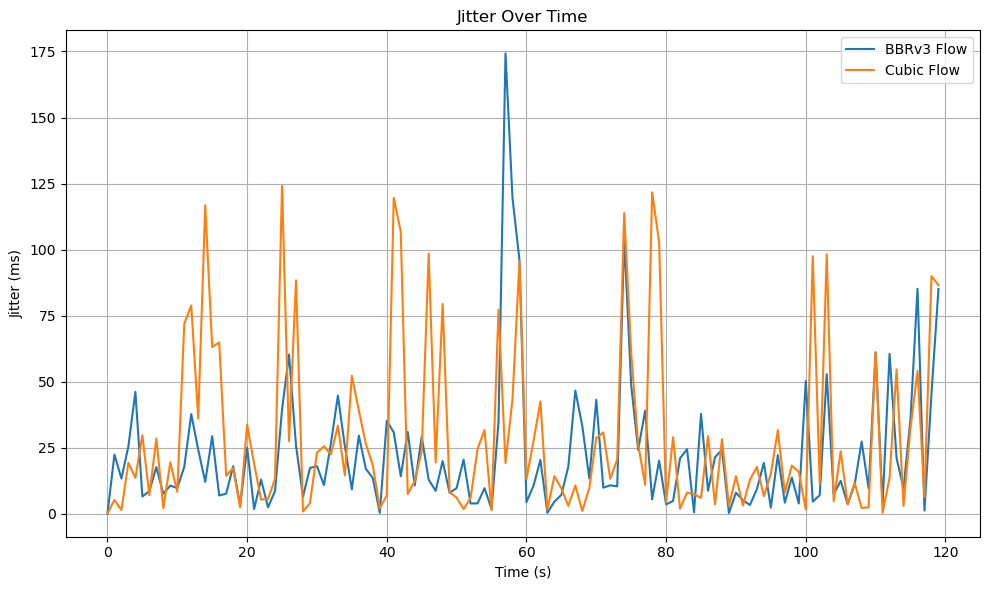

✅ Saved: /home/sit/Downloads/bbrv3/plot json11/mixed_algo_plots/jitter.png


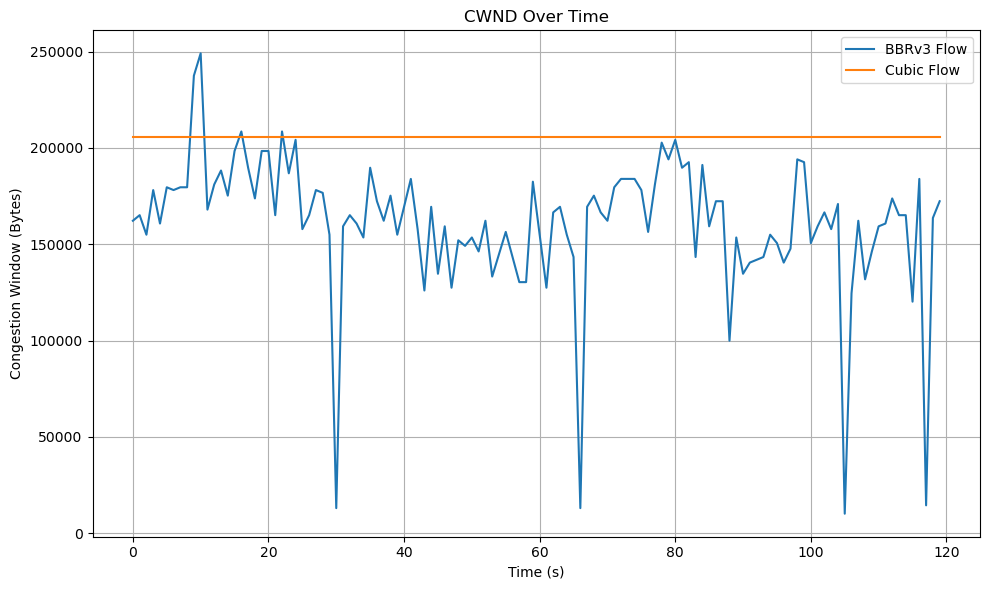

✅ Saved: /home/sit/Downloads/bbrv3/plot json11/mixed_algo_plots/cwnd.png


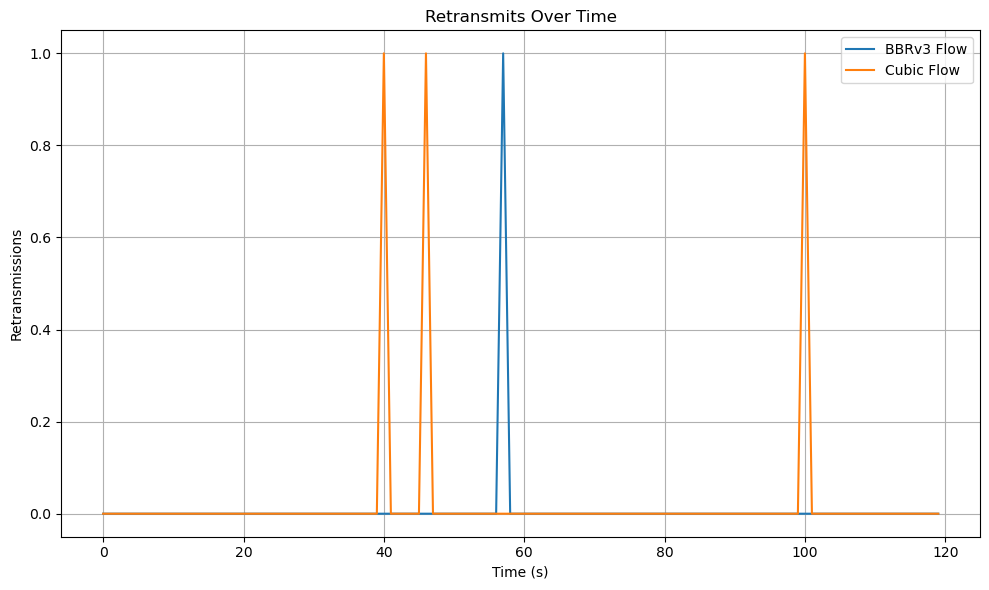

✅ Saved: /home/sit/Downloads/bbrv3/plot json11/mixed_algo_plots/retransmits.png


In [86]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt

def extract_metrics(filepath, label, time_offset=0):
    with open(filepath) as f:
        data = json.load(f)

    metrics = []
    prev_rtt_ms = None

    for i, interval in enumerate(data.get("intervals", [])):
        stream = interval["streams"][0]
        rtt_ms = stream.get("rtt", 0) / 1000  # Convert µs to ms
        jitter_ms = abs(rtt_ms - prev_rtt_ms) if prev_rtt_ms is not None else 0
        prev_rtt_ms = rtt_ms

        metrics.append({
            "time_sec": i + time_offset,  # Add offset (0 for no staggering)
            "throughput_mbps": stream.get("bits_per_second", 0) / 1e6,
            "rtt_ms": rtt_ms,
            "jitter_ms": jitter_ms,
            "cwnd_bytes": stream.get("snd_cwnd", 0),
            "retransmits": stream.get("retransmits", 0),
            "label": label
        })

    return pd.DataFrame(metrics)

def plot_metric(df, metric, ylabel, title, save_path):
    plt.figure(figsize=(10, 6))
    for label, group in df.groupby("label"):
        plt.plot(group["time_sec"], group[metric], label=label)
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()
    plt.close()
    print(f"✅ Saved: {save_path}")

def process_mixed_algos(folder_path, output_csv_name):
    all_data = []

    # Define algorithm names and file prefixes
    algo_files = {
        "BBRv3": "bbr3",
        "Cubic": "cubic"
    }

    for algo_name, file_prefix in algo_files.items():
        for i in range(1, 2):  # 👈 Adjust to `range(1, N+1)` for more flows
            filename = f"{file_prefix}_flow{i}_11.json"
            filepath = os.path.join(folder_path, filename)
            label = f"{algo_name} Flow"
            if os.path.exists(filepath):
                df = extract_metrics(filepath, label)
                all_data.append(df)
            else:
                print(f"❌ File not found: {filepath}")

    if not all_data:
        print("⚠️ No data to process.")
        return

    df_all = pd.concat(all_data, ignore_index=True)

    # Save CSV
    output_csv = os.path.join(folder_path, output_csv_name)
    df_all.to_csv(output_csv, index=False)
    print(f"✅ CSV saved to: {output_csv}")

    # Create plot directory
    plot_dir = os.path.join(folder_path, "mixed_algo_plots")
    os.makedirs(plot_dir, exist_ok=True)

    # Plot metrics
    plot_metric(df_all, "throughput_mbps", "Throughput (Mbps)", "Throughput Over Time", os.path.join(plot_dir, "throughput.png"))
    plot_metric(df_all, "rtt_ms", "RTT / Latency (ms)", "RTT Over Time", os.path.join(plot_dir, "rtt.png"))
    plot_metric(df_all, "jitter_ms", "Jitter (ms)", "Jitter Over Time", os.path.join(plot_dir, "jitter.png"))
    plot_metric(df_all, "cwnd_bytes", "Congestion Window (Bytes)", "CWND Over Time", os.path.join(plot_dir, "cwnd.png"))
    plot_metric(df_all, "retransmits", "Retransmissions", "Retransmits Over Time", os.path.join(plot_dir, "retransmits.png"))

# ----------------------------------------------------
# ✅ Run the function with your directory
process_mixed_algos(
    folder_path="/home/sit/Downloads/bbrv3/plot json11",
    output_csv_name="bbr3_vs_cubic_metrics.csv"
)


✅ CSV saved to: /home/sit/Downloads/bbrv3/plot json12/bbr3_vs_cubic_metrics12.csv


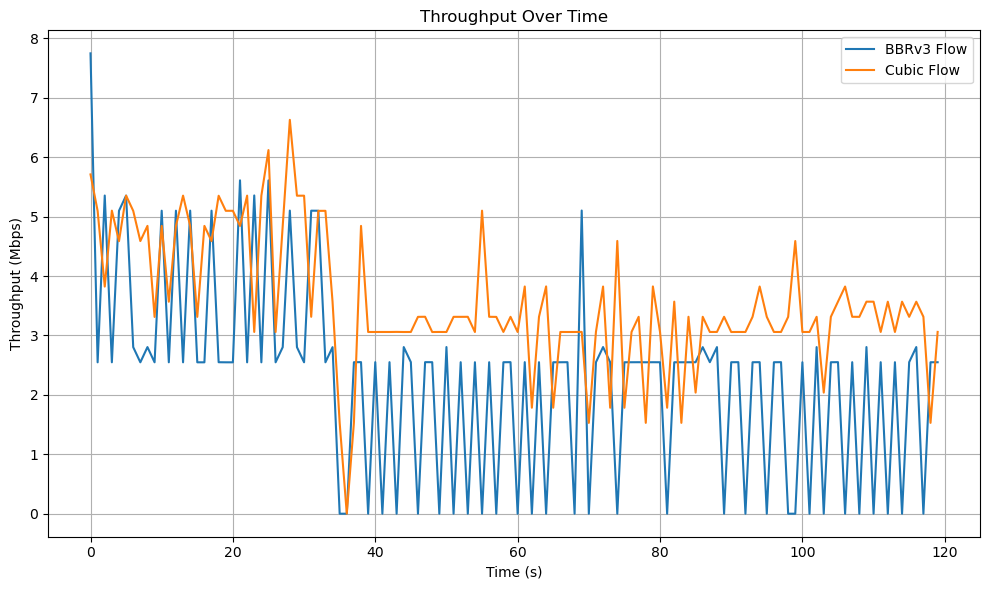

✅ Saved: /home/sit/Downloads/bbrv3/plot json12/mixed_algo_plots/throughput.png


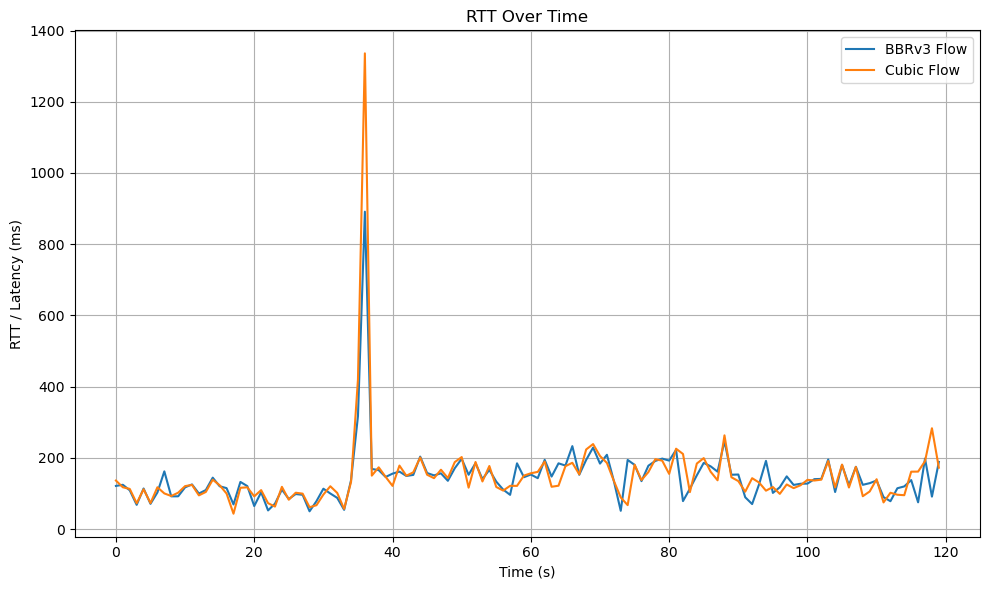

✅ Saved: /home/sit/Downloads/bbrv3/plot json12/mixed_algo_plots/rtt.png


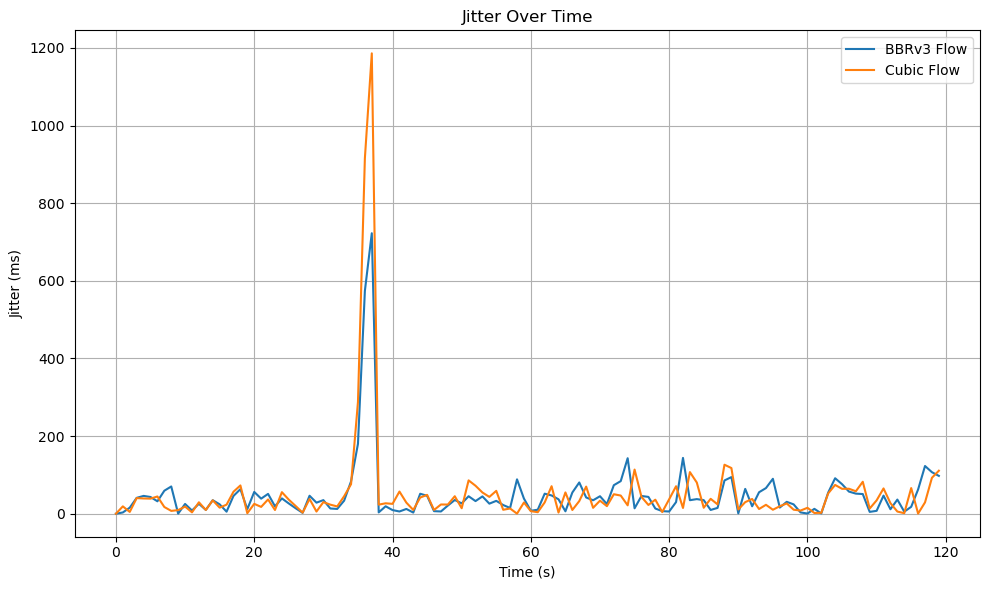

✅ Saved: /home/sit/Downloads/bbrv3/plot json12/mixed_algo_plots/jitter.png


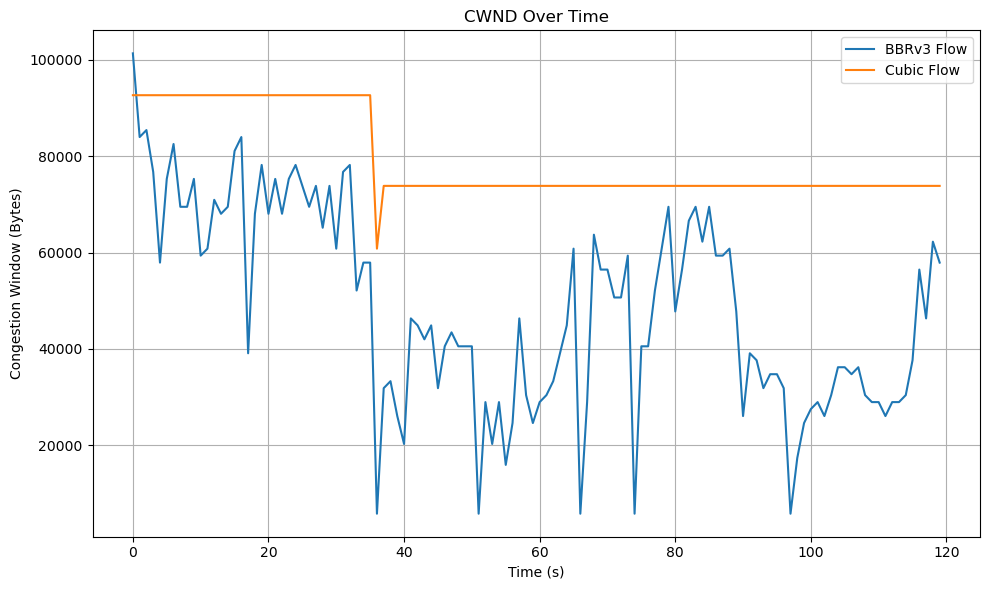

✅ Saved: /home/sit/Downloads/bbrv3/plot json12/mixed_algo_plots/cwnd.png


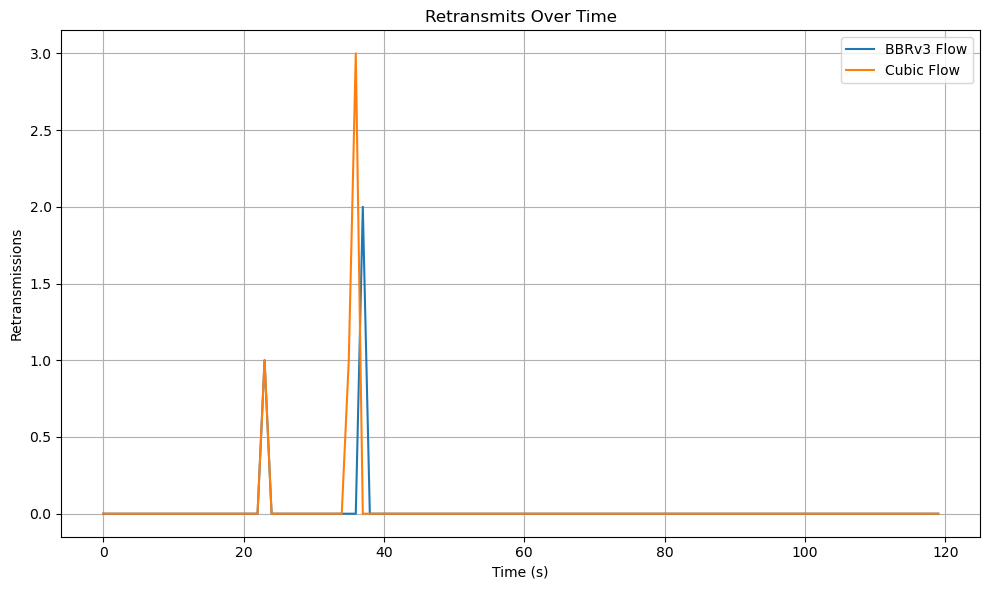

✅ Saved: /home/sit/Downloads/bbrv3/plot json12/mixed_algo_plots/retransmits.png


In [88]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt

def extract_metrics(filepath, label, time_offset=0):
    with open(filepath) as f:
        data = json.load(f)

    metrics = []
    prev_rtt_ms = None

    for i, interval in enumerate(data.get("intervals", [])):
        stream = interval["streams"][0]
        rtt_ms = stream.get("rtt", 0) / 1000  # Convert µs to ms
        jitter_ms = abs(rtt_ms - prev_rtt_ms) if prev_rtt_ms is not None else 0
        prev_rtt_ms = rtt_ms

        metrics.append({
            "time_sec": i + time_offset,  # Add offset (0 for no staggering)
            "throughput_mbps": stream.get("bits_per_second", 0) / 1e6,
            "rtt_ms": rtt_ms,
            "jitter_ms": jitter_ms,
            "cwnd_bytes": stream.get("snd_cwnd", 0),
            "retransmits": stream.get("retransmits", 0),
            "label": label
        })

    return pd.DataFrame(metrics)

def plot_metric(df, metric, ylabel, title, save_path):
    plt.figure(figsize=(10, 6))
    for label, group in df.groupby("label"):
        plt.plot(group["time_sec"], group[metric], label=label)
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()
    plt.close()
    print(f"✅ Saved: {save_path}")

def process_mixed_algos(folder_path, output_csv_name):
    all_data = []

    # Define algorithm names and file prefixes
    algo_files = {
        "BBRv3": "bbr3",
        "Cubic": "cubic"
    }

    for algo_name, file_prefix in algo_files.items():
        for i in range(1, 2):  # 👈 Adjust to `range(1, N+1)` for more flows
            filename = f"{file_prefix}_flow{i}_12.json"
            filepath = os.path.join(folder_path, filename)
            label = f"{algo_name} Flow"
            if os.path.exists(filepath):
                df = extract_metrics(filepath, label)
                all_data.append(df)
            else:
                print(f"❌ File not found: {filepath}")

    if not all_data:
        print("⚠️ No data to process.")
        return

    df_all = pd.concat(all_data, ignore_index=True)

    # Save CSV
    output_csv = os.path.join(folder_path, output_csv_name)
    df_all.to_csv(output_csv, index=False)
    print(f"✅ CSV saved to: {output_csv}")

    # Create plot directory
    plot_dir = os.path.join(folder_path, "mixed_algo_plots")
    os.makedirs(plot_dir, exist_ok=True)

    # Plot metrics
    plot_metric(df_all, "throughput_mbps", "Throughput (Mbps)", "Throughput Over Time", os.path.join(plot_dir, "throughput.png"))
    plot_metric(df_all, "rtt_ms", "RTT / Latency (ms)", "RTT Over Time", os.path.join(plot_dir, "rtt.png"))
    plot_metric(df_all, "jitter_ms", "Jitter (ms)", "Jitter Over Time", os.path.join(plot_dir, "jitter.png"))
    plot_metric(df_all, "cwnd_bytes", "Congestion Window (Bytes)", "CWND Over Time", os.path.join(plot_dir, "cwnd.png"))
    plot_metric(df_all, "retransmits", "Retransmissions", "Retransmits Over Time", os.path.join(plot_dir, "retransmits.png"))

# ----------------------------------------------------
# ✅ Run the function with your directory
process_mixed_algos(
    folder_path="/home/sit/Downloads/bbrv3/plot json12",
    output_csv_name="bbr3_vs_cubic_metrics12.csv"
)


✅ CSV saved to: /home/sit/Downloads/bbrv3/plot json13/bbr3_vs_cubic_metrics13.csv


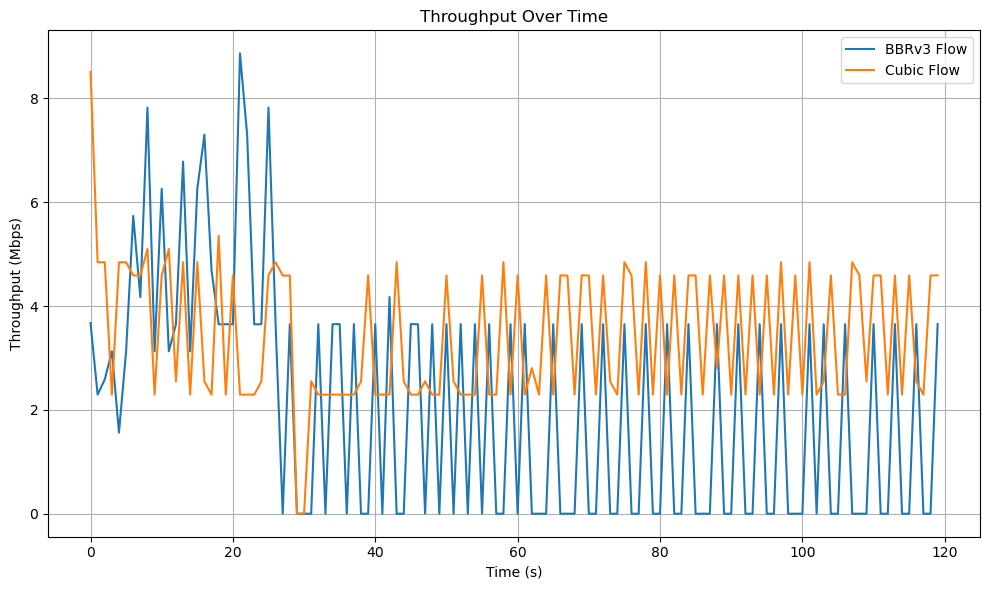

✅ Saved: /home/sit/Downloads/bbrv3/plot json13/mixed_algo_plots/throughput.png


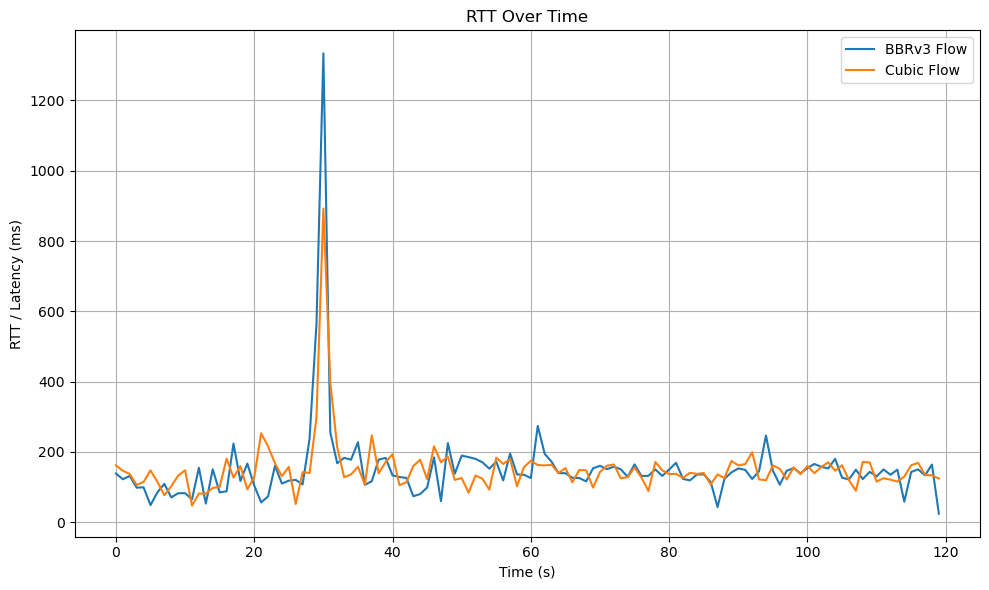

✅ Saved: /home/sit/Downloads/bbrv3/plot json13/mixed_algo_plots/rtt.png


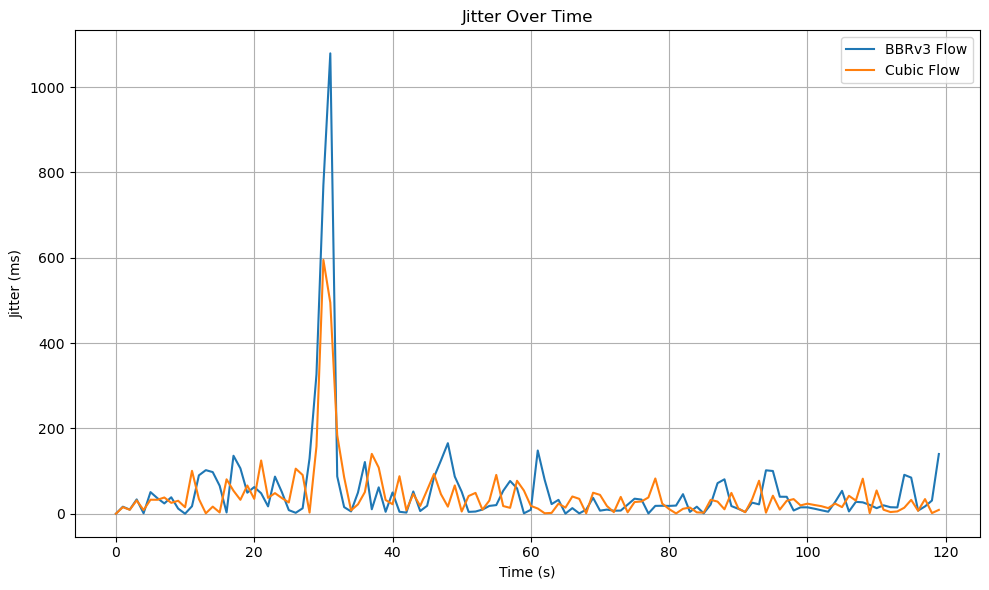

✅ Saved: /home/sit/Downloads/bbrv3/plot json13/mixed_algo_plots/jitter.png


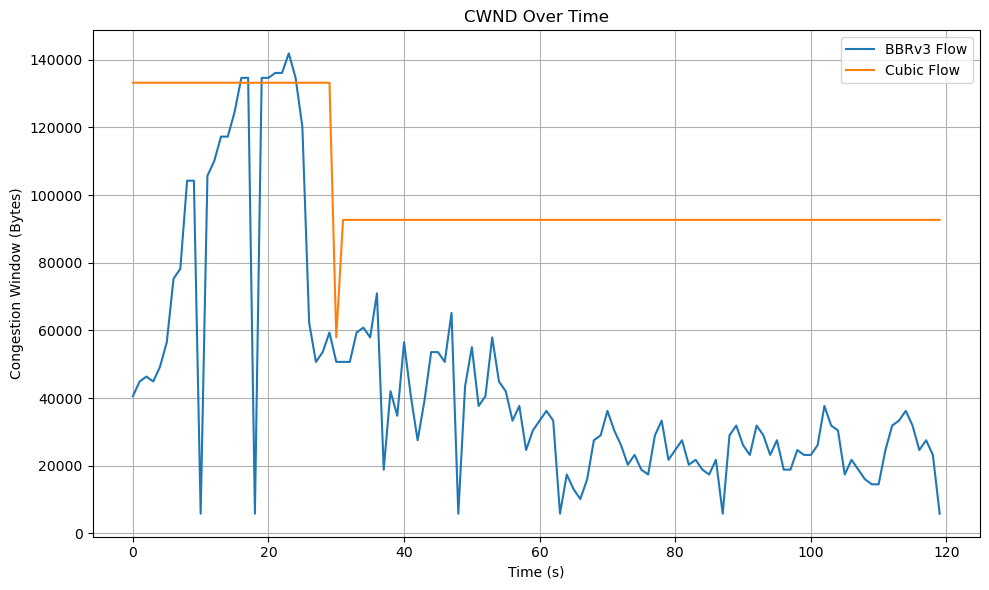

✅ Saved: /home/sit/Downloads/bbrv3/plot json13/mixed_algo_plots/cwnd.png


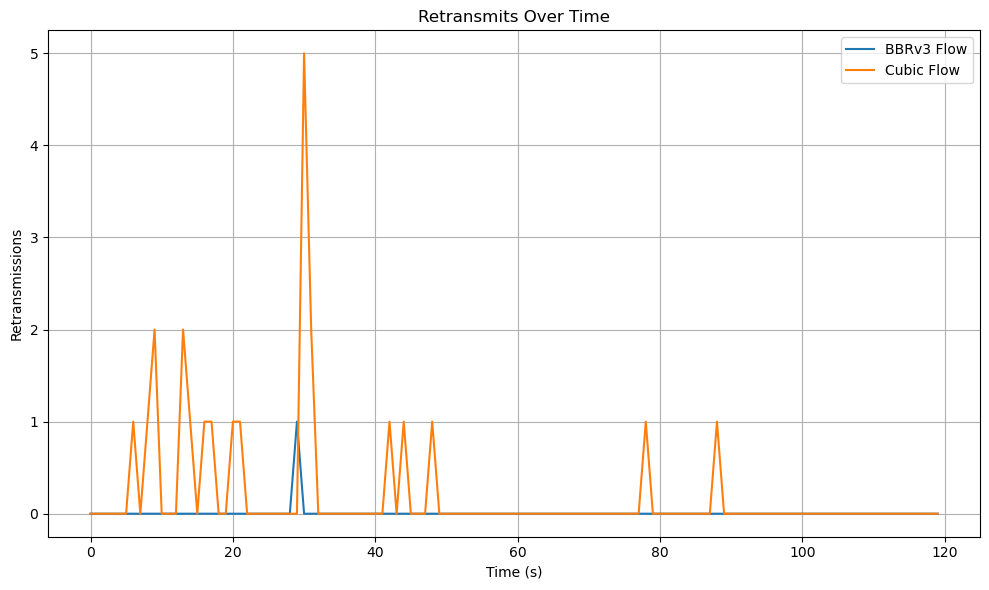

✅ Saved: /home/sit/Downloads/bbrv3/plot json13/mixed_algo_plots/retransmits.png


In [89]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt

def extract_metrics(filepath, label, time_offset=0):
    with open(filepath) as f:
        data = json.load(f)

    metrics = []
    prev_rtt_ms = None

    for i, interval in enumerate(data.get("intervals", [])):
        stream = interval["streams"][0]
        rtt_ms = stream.get("rtt", 0) / 1000  # Convert µs to ms
        jitter_ms = abs(rtt_ms - prev_rtt_ms) if prev_rtt_ms is not None else 0
        prev_rtt_ms = rtt_ms

        metrics.append({
            "time_sec": i + time_offset,  # Add offset (0 for no staggering)
            "throughput_mbps": stream.get("bits_per_second", 0) / 1e6,
            "rtt_ms": rtt_ms,
            "jitter_ms": jitter_ms,
            "cwnd_bytes": stream.get("snd_cwnd", 0),
            "retransmits": stream.get("retransmits", 0),
            "label": label
        })

    return pd.DataFrame(metrics)

def plot_metric(df, metric, ylabel, title, save_path):
    plt.figure(figsize=(10, 6))
    for label, group in df.groupby("label"):
        plt.plot(group["time_sec"], group[metric], label=label)
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()
    plt.close()
    print(f"✅ Saved: {save_path}")

def process_mixed_algos(folder_path, output_csv_name):
    all_data = []

    # Define algorithm names and file prefixes
    algo_files = {
        "BBRv3": "bbr3",
        "Cubic": "cubic"
    }

    for algo_name, file_prefix in algo_files.items():
        for i in range(1, 2):  # 👈 Adjust to `range(1, N+1)` for more flows
            filename = f"{file_prefix}_flow{i}_13.json"
            filepath = os.path.join(folder_path, filename)
            label = f"{algo_name} Flow"
            if os.path.exists(filepath):
                df = extract_metrics(filepath, label)
                all_data.append(df)
            else:
                print(f"❌ File not found: {filepath}")

    if not all_data:
        print("⚠️ No data to process.")
        return

    df_all = pd.concat(all_data, ignore_index=True)

    # Save CSV
    output_csv = os.path.join(folder_path, output_csv_name)
    df_all.to_csv(output_csv, index=False)
    print(f"✅ CSV saved to: {output_csv}")

    # Create plot directory
    plot_dir = os.path.join(folder_path, "mixed_algo_plots")
    os.makedirs(plot_dir, exist_ok=True)

    # Plot metrics
    plot_metric(df_all, "throughput_mbps", "Throughput (Mbps)", "Throughput Over Time", os.path.join(plot_dir, "throughput.png"))
    plot_metric(df_all, "rtt_ms", "RTT / Latency (ms)", "RTT Over Time", os.path.join(plot_dir, "rtt.png"))
    plot_metric(df_all, "jitter_ms", "Jitter (ms)", "Jitter Over Time", os.path.join(plot_dir, "jitter.png"))
    plot_metric(df_all, "cwnd_bytes", "Congestion Window (Bytes)", "CWND Over Time", os.path.join(plot_dir, "cwnd.png"))
    plot_metric(df_all, "retransmits", "Retransmissions", "Retransmits Over Time", os.path.join(plot_dir, "retransmits.png"))

# ----------------------------------------------------
# ✅ Run the function with your directory
process_mixed_algos(
    folder_path="/home/sit/Downloads/bbrv3/plot json13",
    output_csv_name="bbr3_vs_cubic_metrics13.csv"
)


✅ CSV saved to: /home/sit/Downloads/bbrv3/plot json14/bbr3_vs_cubic_metrics14.csv


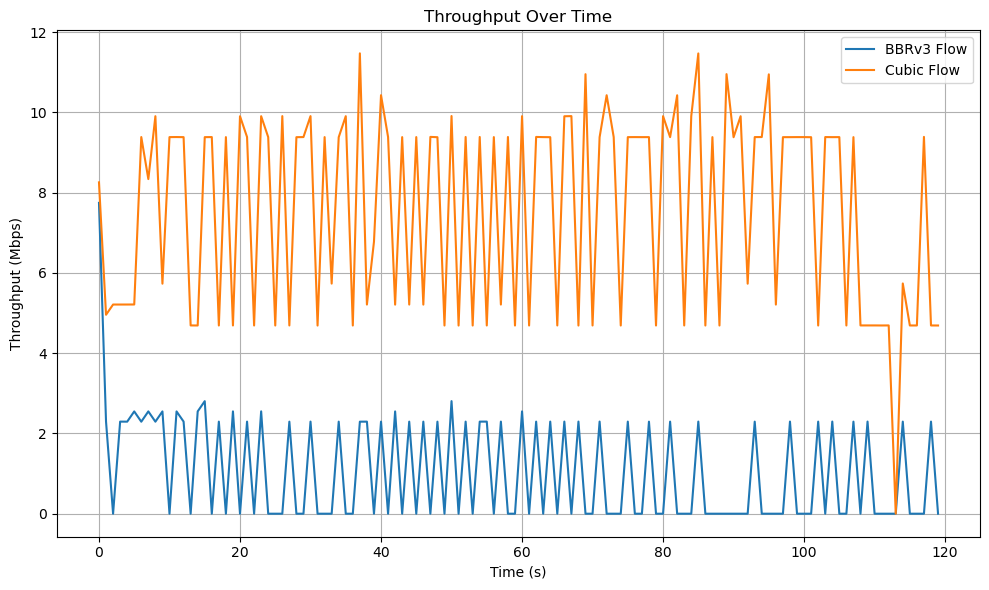

✅ Saved: /home/sit/Downloads/bbrv3/plot json14/mixed_algo_plots/throughput.png


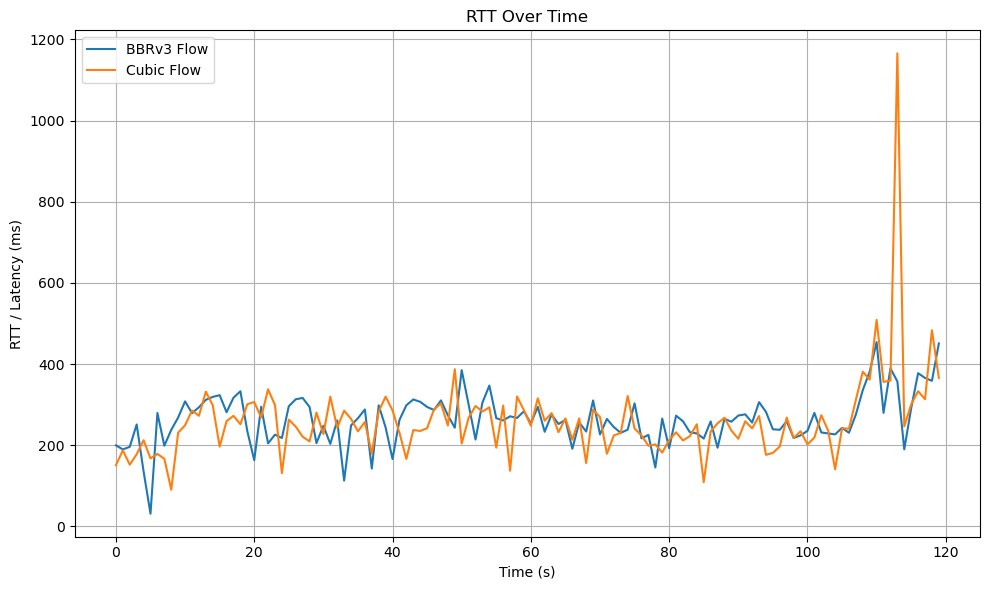

✅ Saved: /home/sit/Downloads/bbrv3/plot json14/mixed_algo_plots/rtt.png


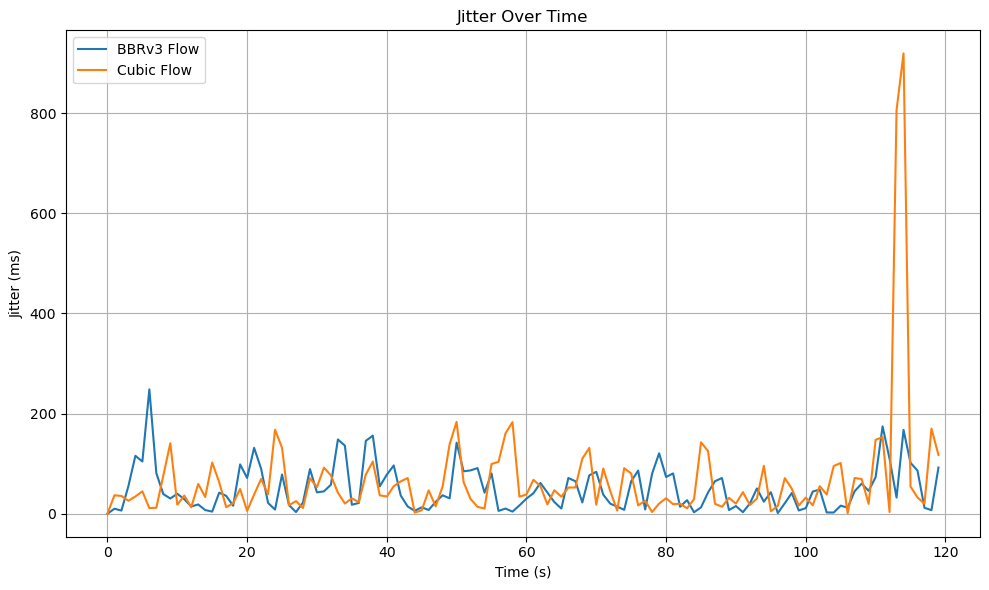

✅ Saved: /home/sit/Downloads/bbrv3/plot json14/mixed_algo_plots/jitter.png


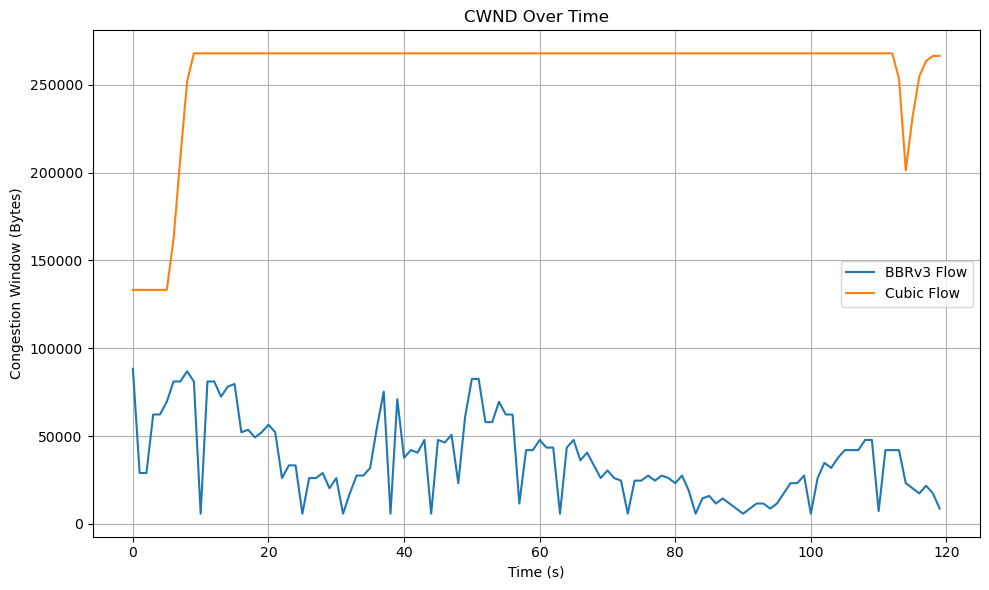

✅ Saved: /home/sit/Downloads/bbrv3/plot json14/mixed_algo_plots/cwnd.png


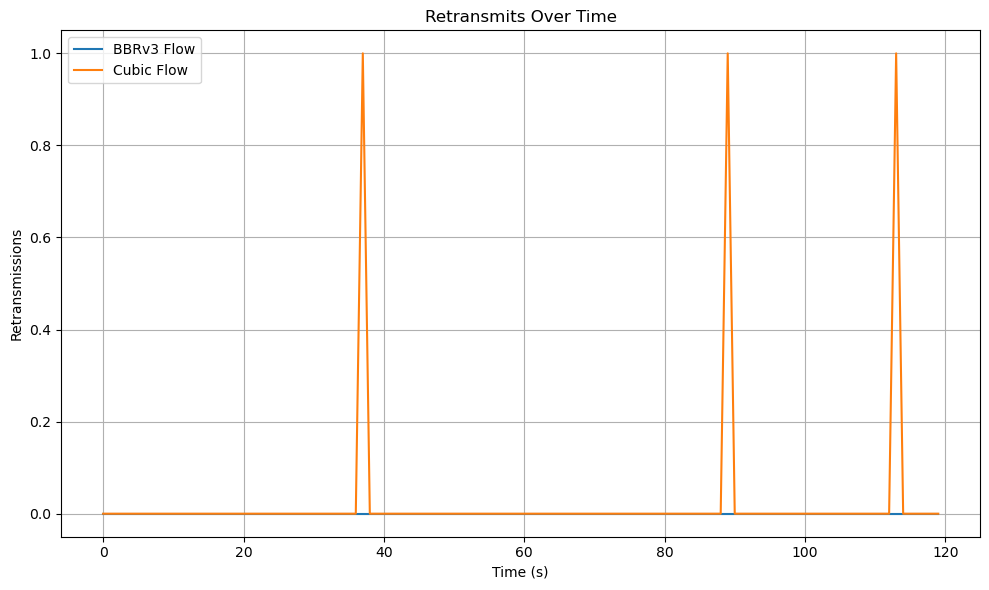

✅ Saved: /home/sit/Downloads/bbrv3/plot json14/mixed_algo_plots/retransmits.png


In [90]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt

def extract_metrics(filepath, label, time_offset=0):
    with open(filepath) as f:
        data = json.load(f)

    metrics = []
    prev_rtt_ms = None

    for i, interval in enumerate(data.get("intervals", [])):
        stream = interval["streams"][0]
        rtt_ms = stream.get("rtt", 0) / 1000  # Convert µs to ms
        jitter_ms = abs(rtt_ms - prev_rtt_ms) if prev_rtt_ms is not None else 0
        prev_rtt_ms = rtt_ms

        metrics.append({
            "time_sec": i + time_offset,  # Add offset (0 for no staggering)
            "throughput_mbps": stream.get("bits_per_second", 0) / 1e6,
            "rtt_ms": rtt_ms,
            "jitter_ms": jitter_ms,
            "cwnd_bytes": stream.get("snd_cwnd", 0),
            "retransmits": stream.get("retransmits", 0),
            "label": label
        })

    return pd.DataFrame(metrics)

def plot_metric(df, metric, ylabel, title, save_path):
    plt.figure(figsize=(10, 6))
    for label, group in df.groupby("label"):
        plt.plot(group["time_sec"], group[metric], label=label)
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()
    plt.close()
    print(f"✅ Saved: {save_path}")

def process_mixed_algos(folder_path, output_csv_name):
    all_data = []

    # Define algorithm names and file prefixes
    algo_files = {
        "BBRv3": "bbr3",
        "Cubic": "cubic"
    }

    for algo_name, file_prefix in algo_files.items():
        for i in range(1, 2):  # 👈 Adjust to `range(1, N+1)` for more flows
            filename = f"{file_prefix}_flow{i}_14.json"
            filepath = os.path.join(folder_path, filename)
            label = f"{algo_name} Flow"
            if os.path.exists(filepath):
                df = extract_metrics(filepath, label)
                all_data.append(df)
            else:
                print(f"❌ File not found: {filepath}")

    if not all_data:
        print("⚠️ No data to process.")
        return

    df_all = pd.concat(all_data, ignore_index=True)

    # Save CSV
    output_csv = os.path.join(folder_path, output_csv_name)
    df_all.to_csv(output_csv, index=False)
    print(f"✅ CSV saved to: {output_csv}")

    # Create plot directory
    plot_dir = os.path.join(folder_path, "mixed_algo_plots")
    os.makedirs(plot_dir, exist_ok=True)

    # Plot metrics
    plot_metric(df_all, "throughput_mbps", "Throughput (Mbps)", "Throughput Over Time", os.path.join(plot_dir, "throughput.png"))
    plot_metric(df_all, "rtt_ms", "RTT / Latency (ms)", "RTT Over Time", os.path.join(plot_dir, "rtt.png"))
    plot_metric(df_all, "jitter_ms", "Jitter (ms)", "Jitter Over Time", os.path.join(plot_dir, "jitter.png"))
    plot_metric(df_all, "cwnd_bytes", "Congestion Window (Bytes)", "CWND Over Time", os.path.join(plot_dir, "cwnd.png"))
    plot_metric(df_all, "retransmits", "Retransmissions", "Retransmits Over Time", os.path.join(plot_dir, "retransmits.png"))

# ----------------------------------------------------
# ✅ Run the function with your directory
process_mixed_algos(
    folder_path="/home/sit/Downloads/bbrv3/plot json14",
    output_csv_name="bbr3_vs_cubic_metrics14.csv"
)


✅ CSV saved to: /home/sit/Downloads/bbrv3/plot json15/bbr3_vs_cubic_metrics15.csv


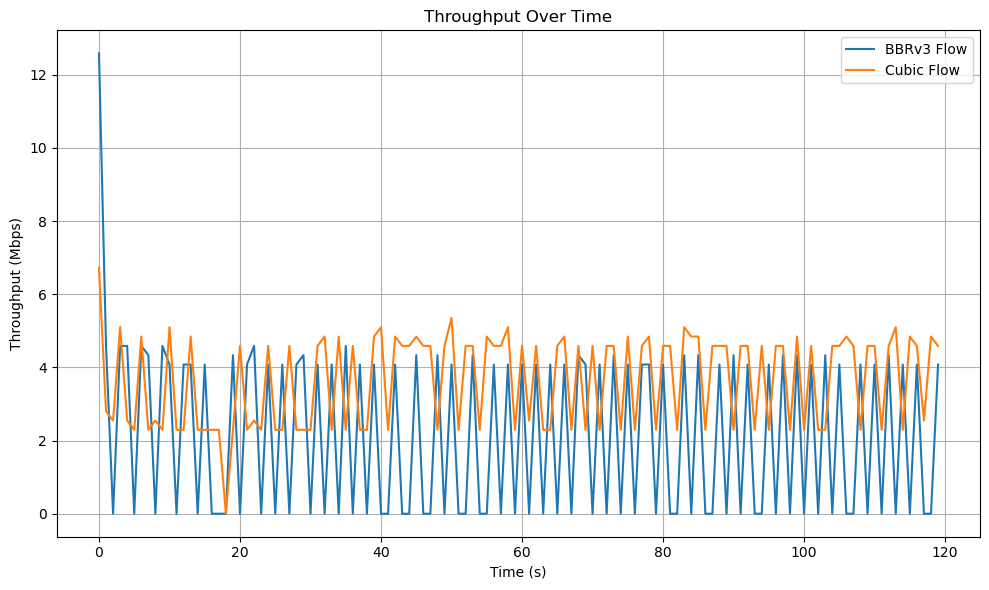

✅ Saved: /home/sit/Downloads/bbrv3/plot json15/mixed_algo_plots/throughput.png


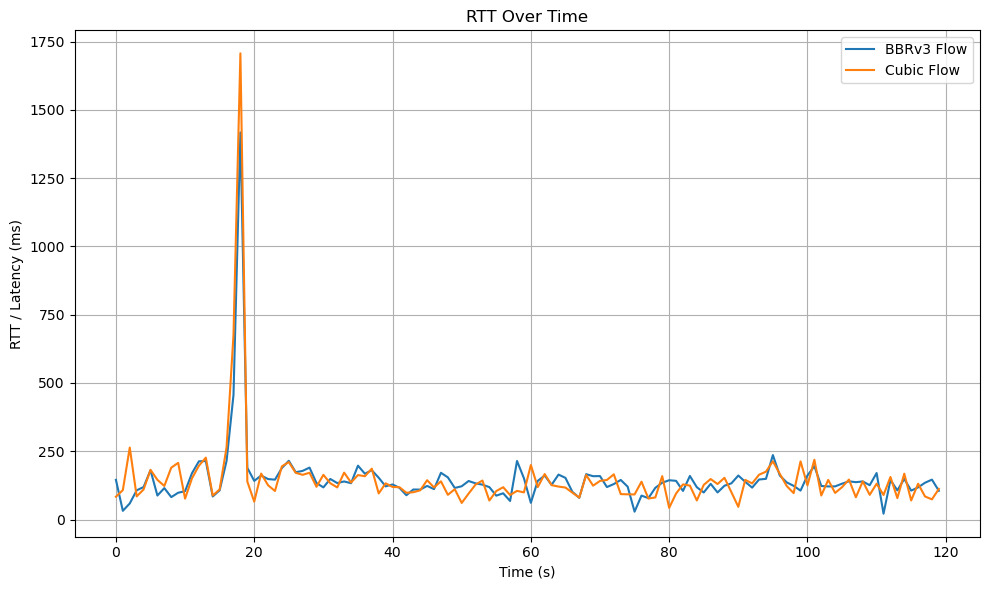

✅ Saved: /home/sit/Downloads/bbrv3/plot json15/mixed_algo_plots/rtt.png


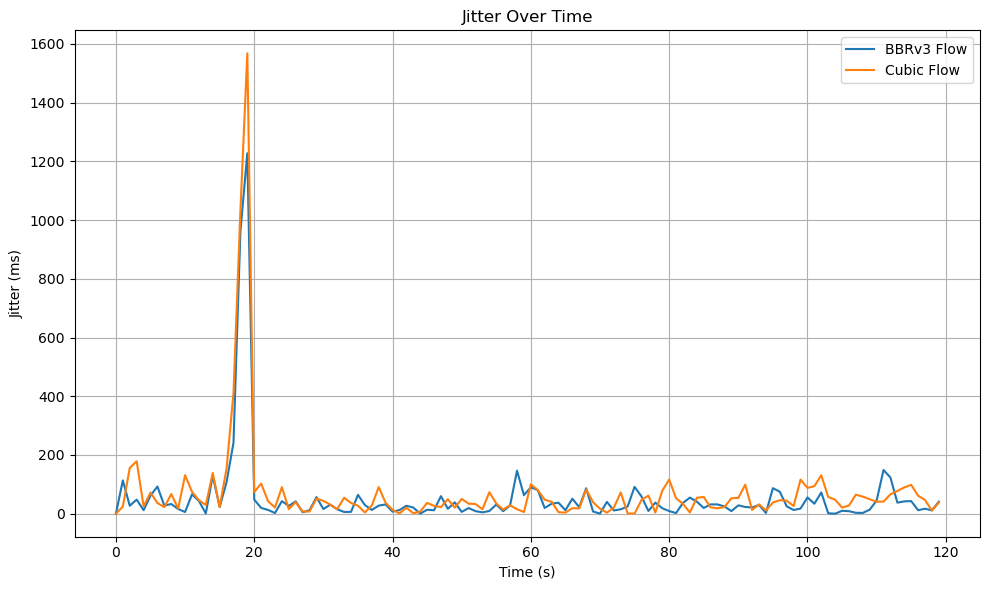

✅ Saved: /home/sit/Downloads/bbrv3/plot json15/mixed_algo_plots/jitter.png


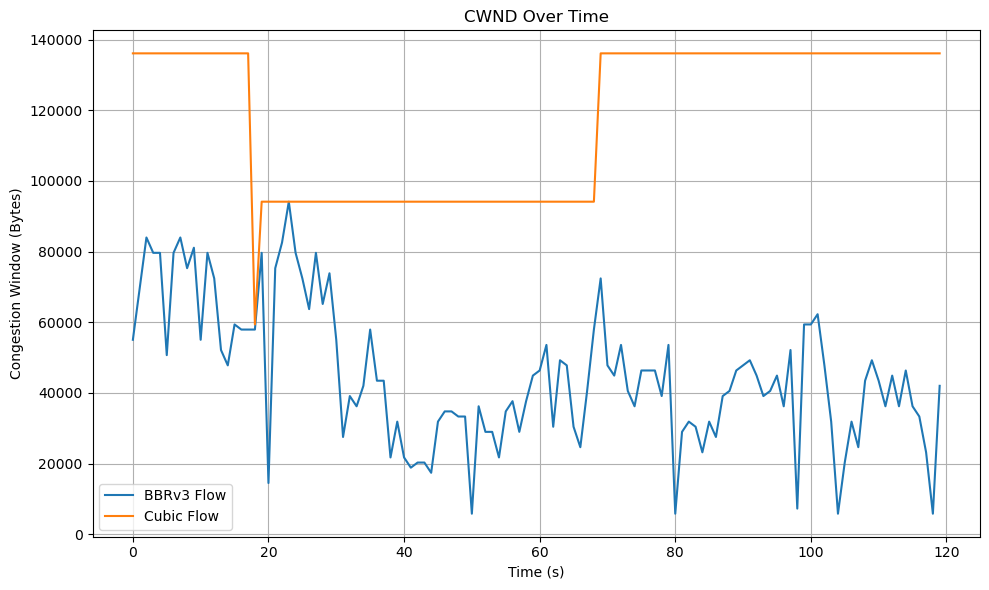

✅ Saved: /home/sit/Downloads/bbrv3/plot json15/mixed_algo_plots/cwnd.png


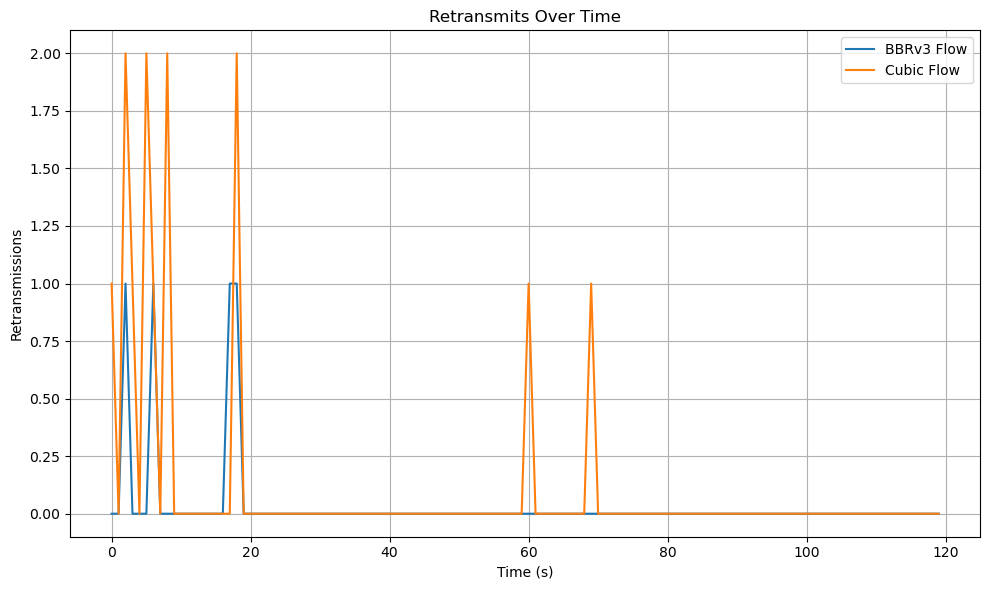

✅ Saved: /home/sit/Downloads/bbrv3/plot json15/mixed_algo_plots/retransmits.png


In [91]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt

def extract_metrics(filepath, label, time_offset=0):
    with open(filepath) as f:
        data = json.load(f)

    metrics = []
    prev_rtt_ms = None

    for i, interval in enumerate(data.get("intervals", [])):
        stream = interval["streams"][0]
        rtt_ms = stream.get("rtt", 0) / 1000  # Convert µs to ms
        jitter_ms = abs(rtt_ms - prev_rtt_ms) if prev_rtt_ms is not None else 0
        prev_rtt_ms = rtt_ms

        metrics.append({
            "time_sec": i + time_offset,  # Add offset (0 for no staggering)
            "throughput_mbps": stream.get("bits_per_second", 0) / 1e6,
            "rtt_ms": rtt_ms,
            "jitter_ms": jitter_ms,
            "cwnd_bytes": stream.get("snd_cwnd", 0),
            "retransmits": stream.get("retransmits", 0),
            "label": label
        })

    return pd.DataFrame(metrics)

def plot_metric(df, metric, ylabel, title, save_path):
    plt.figure(figsize=(10, 6))
    for label, group in df.groupby("label"):
        plt.plot(group["time_sec"], group[metric], label=label)
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()
    plt.close()
    print(f"✅ Saved: {save_path}")

def process_mixed_algos(folder_path, output_csv_name):
    all_data = []

    # Define algorithm names and file prefixes
    algo_files = {
        "BBRv3": "bbr3",
        "Cubic": "cubic"
    }

    for algo_name, file_prefix in algo_files.items():
        for i in range(1, 2):  # 👈 Adjust to `range(1, N+1)` for more flows
            filename = f"{file_prefix}_flow{i}_15.json"
            filepath = os.path.join(folder_path, filename)
            label = f"{algo_name} Flow"
            if os.path.exists(filepath):
                df = extract_metrics(filepath, label)
                all_data.append(df)
            else:
                print(f"❌ File not found: {filepath}")

    if not all_data:
        print("⚠️ No data to process.")
        return

    df_all = pd.concat(all_data, ignore_index=True)

    # Save CSV
    output_csv = os.path.join(folder_path, output_csv_name)
    df_all.to_csv(output_csv, index=False)
    print(f"✅ CSV saved to: {output_csv}")

    # Create plot directory
    plot_dir = os.path.join(folder_path, "mixed_algo_plots")
    os.makedirs(plot_dir, exist_ok=True)

    # Plot metrics
    plot_metric(df_all, "throughput_mbps", "Throughput (Mbps)", "Throughput Over Time", os.path.join(plot_dir, "throughput.png"))
    plot_metric(df_all, "rtt_ms", "RTT / Latency (ms)", "RTT Over Time", os.path.join(plot_dir, "rtt.png"))
    plot_metric(df_all, "jitter_ms", "Jitter (ms)", "Jitter Over Time", os.path.join(plot_dir, "jitter.png"))
    plot_metric(df_all, "cwnd_bytes", "Congestion Window (Bytes)", "CWND Over Time", os.path.join(plot_dir, "cwnd.png"))
    plot_metric(df_all, "retransmits", "Retransmissions", "Retransmits Over Time", os.path.join(plot_dir, "retransmits.png"))

# ----------------------------------------------------
# ✅ Run the function with your directory
process_mixed_algos(
    folder_path="/home/sit/Downloads/bbrv3/plot json15",
    output_csv_name="bbr3_vs_cubic_metrics15.csv"
)


✅ CSV saved to: /home/sit/Downloads/bbrv3/plot json17/bbr3_vs_cubic_metrics17.csv


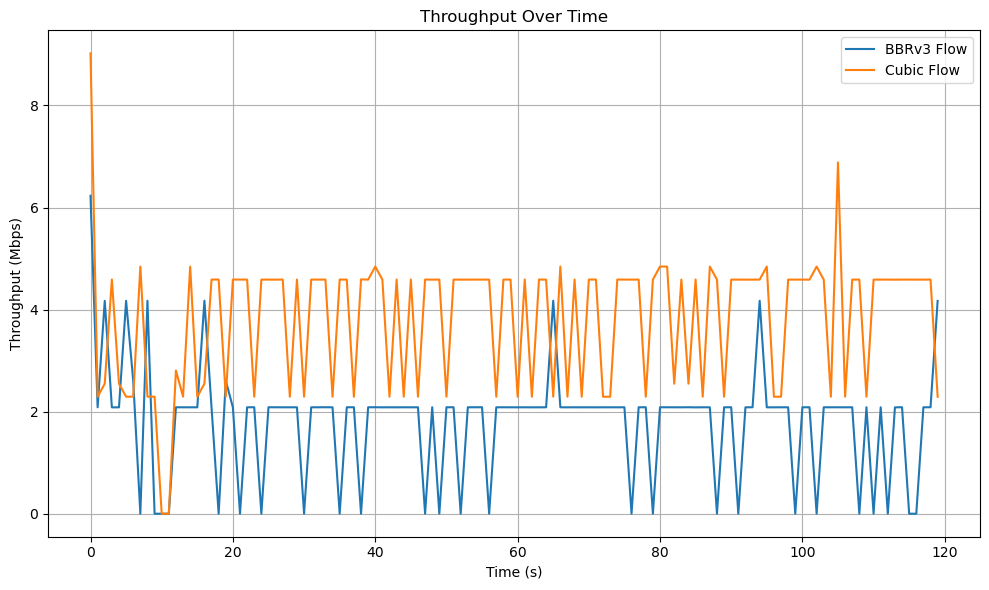

✅ Saved: /home/sit/Downloads/bbrv3/plot json17/mixed_algo_plots/throughput.png


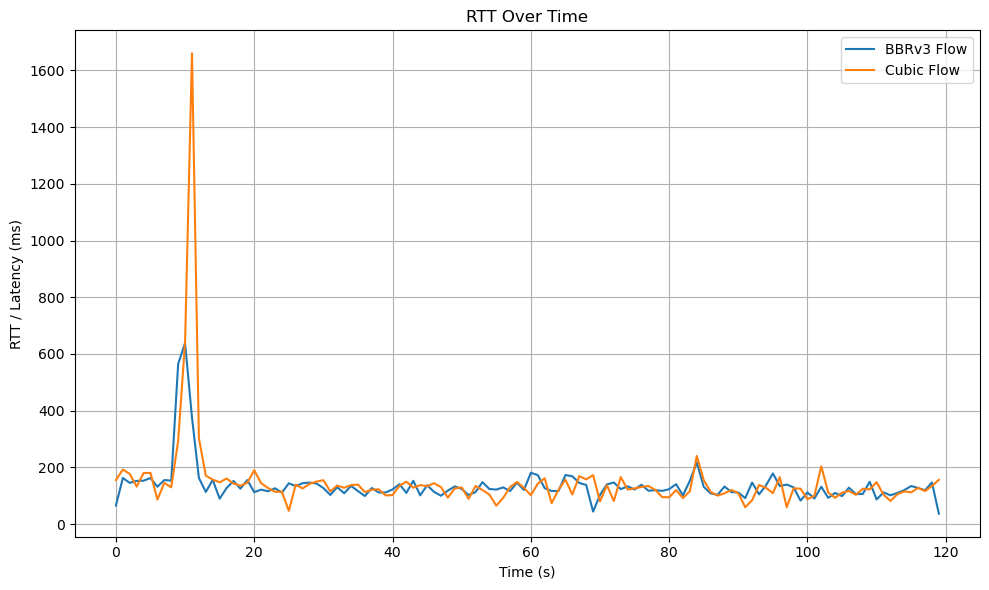

✅ Saved: /home/sit/Downloads/bbrv3/plot json17/mixed_algo_plots/rtt.png


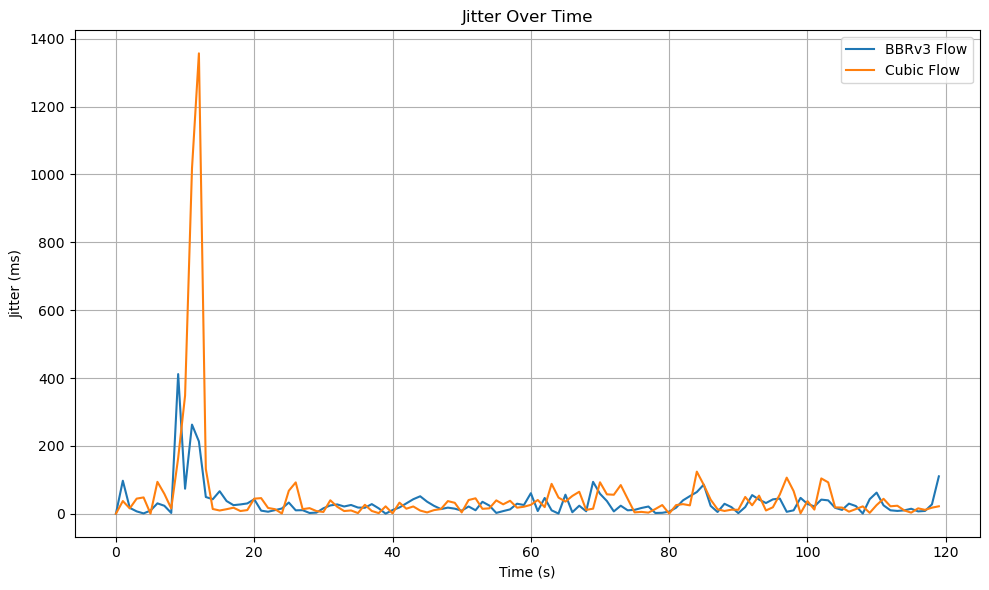

✅ Saved: /home/sit/Downloads/bbrv3/plot json17/mixed_algo_plots/jitter.png


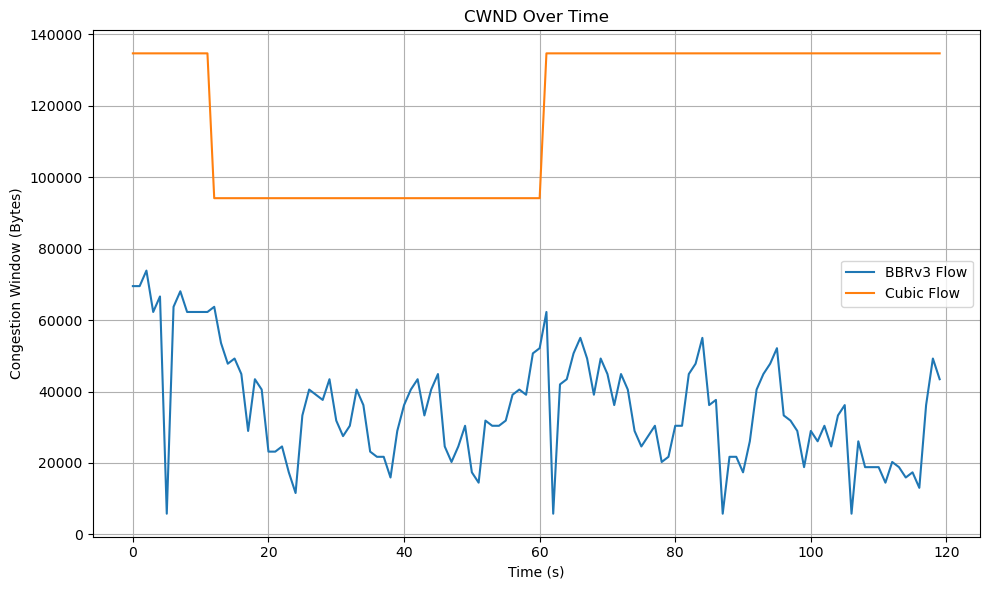

✅ Saved: /home/sit/Downloads/bbrv3/plot json17/mixed_algo_plots/cwnd.png


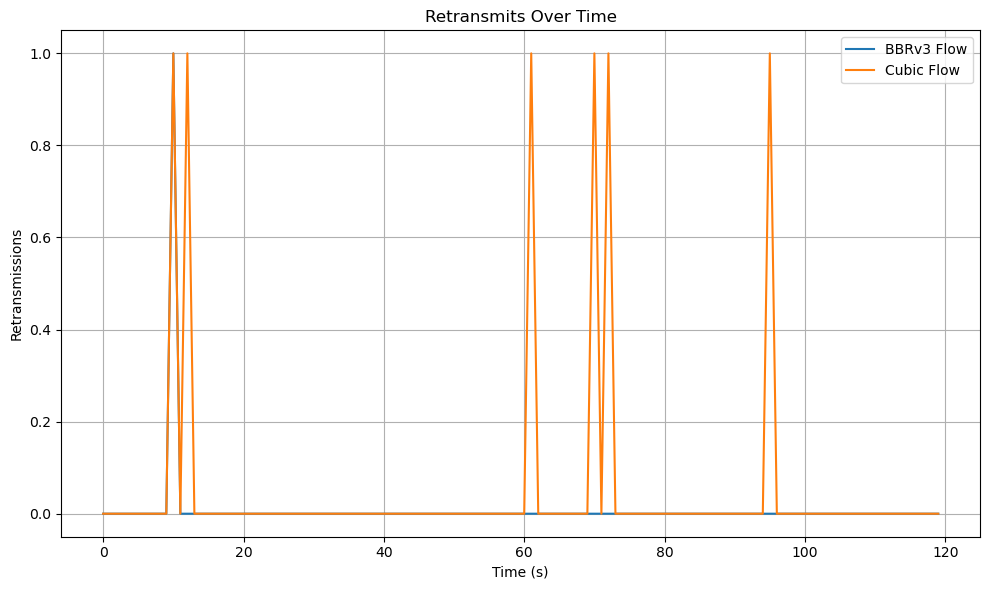

✅ Saved: /home/sit/Downloads/bbrv3/plot json17/mixed_algo_plots/retransmits.png


In [93]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt

def extract_metrics(filepath, label, time_offset=0):
    with open(filepath) as f:
        data = json.load(f)

    metrics = []
    prev_rtt_ms = None

    for i, interval in enumerate(data.get("intervals", [])):
        stream = interval["streams"][0]
        rtt_ms = stream.get("rtt", 0) / 1000  # Convert µs to ms
        jitter_ms = abs(rtt_ms - prev_rtt_ms) if prev_rtt_ms is not None else 0
        prev_rtt_ms = rtt_ms

        metrics.append({
            "time_sec": i + time_offset,  # Add offset (0 for no staggering)
            "throughput_mbps": stream.get("bits_per_second", 0) / 1e6,
            "rtt_ms": rtt_ms,
            "jitter_ms": jitter_ms,
            "cwnd_bytes": stream.get("snd_cwnd", 0),
            "retransmits": stream.get("retransmits", 0),
            "label": label
        })

    return pd.DataFrame(metrics)

def plot_metric(df, metric, ylabel, title, save_path):
    plt.figure(figsize=(10, 6))
    for label, group in df.groupby("label"):
        plt.plot(group["time_sec"], group[metric], label=label)
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()
    plt.close()
    print(f"✅ Saved: {save_path}")

def process_mixed_algos(folder_path, output_csv_name):
    all_data = []

    # Define algorithm names and file prefixes
    algo_files = {
        "BBRv3": "bbr3",
        "Cubic": "cubic"
    }

    for algo_name, file_prefix in algo_files.items():
        for i in range(1, 2):  # 👈 Adjust to `range(1, N+1)` for more flows
            filename = f"{file_prefix}_flow{i}_17.json"
            filepath = os.path.join(folder_path, filename)
            label = f"{algo_name} Flow"
            if os.path.exists(filepath):
                df = extract_metrics(filepath, label)
                all_data.append(df)
            else:
                print(f"❌ File not found: {filepath}")

    if not all_data:
        print("⚠️ No data to process.")
        return

    df_all = pd.concat(all_data, ignore_index=True)

    # Save CSV
    output_csv = os.path.join(folder_path, output_csv_name)
    df_all.to_csv(output_csv, index=False)
    print(f"✅ CSV saved to: {output_csv}")

    # Create plot directory
    plot_dir = os.path.join(folder_path, "mixed_algo_plots")
    os.makedirs(plot_dir, exist_ok=True)

    # Plot metrics
    plot_metric(df_all, "throughput_mbps", "Throughput (Mbps)", "Throughput Over Time", os.path.join(plot_dir, "throughput.png"))
    plot_metric(df_all, "rtt_ms", "RTT / Latency (ms)", "RTT Over Time", os.path.join(plot_dir, "rtt.png"))
    plot_metric(df_all, "jitter_ms", "Jitter (ms)", "Jitter Over Time", os.path.join(plot_dir, "jitter.png"))
    plot_metric(df_all, "cwnd_bytes", "Congestion Window (Bytes)", "CWND Over Time", os.path.join(plot_dir, "cwnd.png"))
    plot_metric(df_all, "retransmits", "Retransmissions", "Retransmits Over Time", os.path.join(plot_dir, "retransmits.png"))

# ----------------------------------------------------
# ✅ Run the function with your directory
process_mixed_algos(
    folder_path="/home/sit/Downloads/bbrv3/plot json17",
    output_csv_name="bbr3_vs_cubic_metrics17.csv"
)


✅ CSV saved to: /home/sit/Downloads/bbrv3/plot json18/bbr3_vs_cubic_metrics18.csv


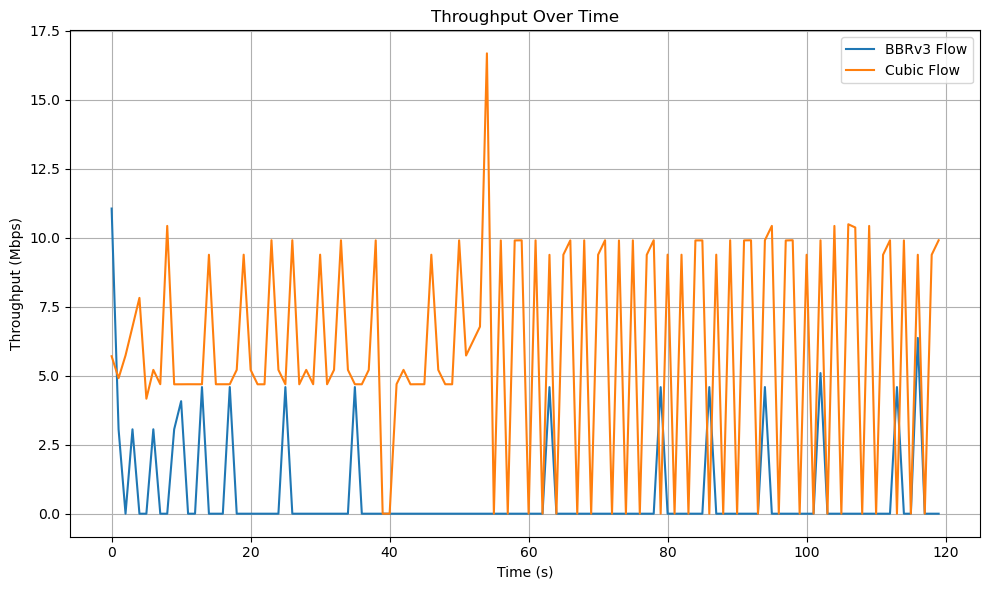

✅ Saved: /home/sit/Downloads/bbrv3/plot json18/mixed_algo_plots/throughput.png


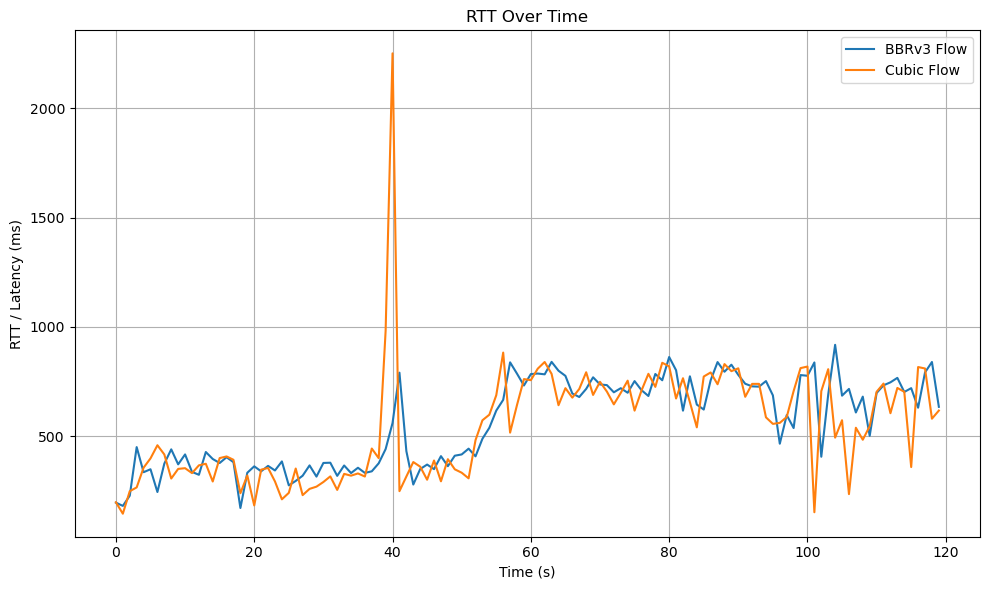

✅ Saved: /home/sit/Downloads/bbrv3/plot json18/mixed_algo_plots/rtt.png


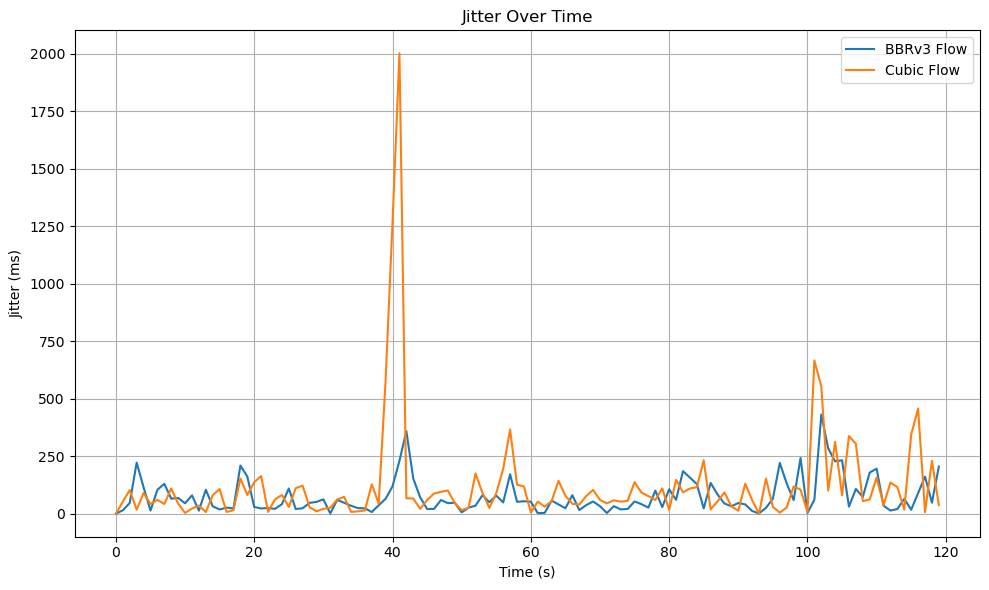

✅ Saved: /home/sit/Downloads/bbrv3/plot json18/mixed_algo_plots/jitter.png


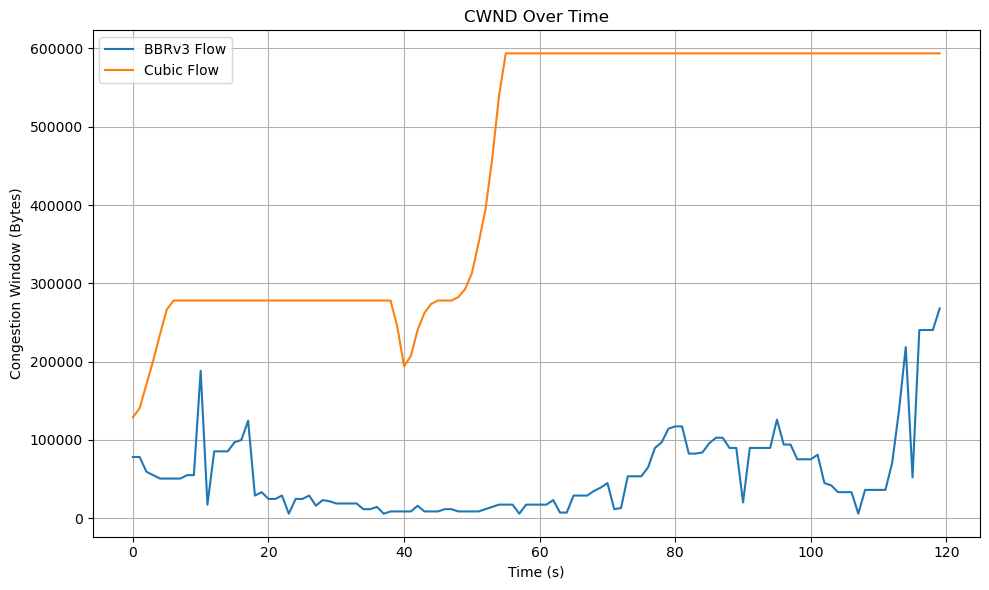

✅ Saved: /home/sit/Downloads/bbrv3/plot json18/mixed_algo_plots/cwnd.png


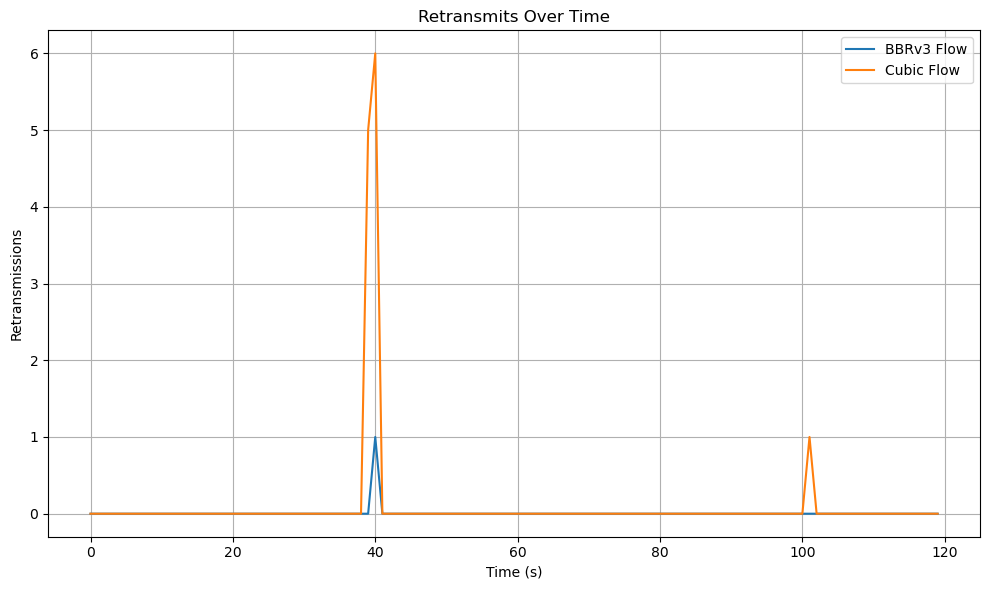

✅ Saved: /home/sit/Downloads/bbrv3/plot json18/mixed_algo_plots/retransmits.png


In [94]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt

def extract_metrics(filepath, label, time_offset=0):
    with open(filepath) as f:
        data = json.load(f)

    metrics = []
    prev_rtt_ms = None

    for i, interval in enumerate(data.get("intervals", [])):
        stream = interval["streams"][0]
        rtt_ms = stream.get("rtt", 0) / 1000  # Convert µs to ms
        jitter_ms = abs(rtt_ms - prev_rtt_ms) if prev_rtt_ms is not None else 0
        prev_rtt_ms = rtt_ms

        metrics.append({
            "time_sec": i + time_offset,  # Add offset (0 for no staggering)
            "throughput_mbps": stream.get("bits_per_second", 0) / 1e6,
            "rtt_ms": rtt_ms,
            "jitter_ms": jitter_ms,
            "cwnd_bytes": stream.get("snd_cwnd", 0),
            "retransmits": stream.get("retransmits", 0),
            "label": label
        })

    return pd.DataFrame(metrics)

def plot_metric(df, metric, ylabel, title, save_path):
    plt.figure(figsize=(10, 6))
    for label, group in df.groupby("label"):
        plt.plot(group["time_sec"], group[metric], label=label)
    plt.xlabel("Time (s)")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()
    plt.close()
    print(f"✅ Saved: {save_path}")

def process_mixed_algos(folder_path, output_csv_name):
    all_data = []

    # Define algorithm names and file prefixes
    algo_files = {
        "BBRv3": "bbr3",
        "Cubic": "cubic"
    }

    for algo_name, file_prefix in algo_files.items():
        for i in range(1, 2):  # 👈 Adjust to `range(1, N+1)` for more flows
            filename = f"{file_prefix}_flow{i}_18.json"
            filepath = os.path.join(folder_path, filename)
            label = f"{algo_name} Flow"
            if os.path.exists(filepath):
                df = extract_metrics(filepath, label)
                all_data.append(df)
            else:
                print(f"❌ File not found: {filepath}")

    if not all_data:
        print("⚠️ No data to process.")
        return

    df_all = pd.concat(all_data, ignore_index=True)

    # Save CSV
    output_csv = os.path.join(folder_path, output_csv_name)
    df_all.to_csv(output_csv, index=False)
    print(f"✅ CSV saved to: {output_csv}")

    # Create plot directory
    plot_dir = os.path.join(folder_path, "mixed_algo_plots")
    os.makedirs(plot_dir, exist_ok=True)

    # Plot metrics
    plot_metric(df_all, "throughput_mbps", "Throughput (Mbps)", "Throughput Over Time", os.path.join(plot_dir, "throughput.png"))
    plot_metric(df_all, "rtt_ms", "RTT / Latency (ms)", "RTT Over Time", os.path.join(plot_dir, "rtt.png"))
    plot_metric(df_all, "jitter_ms", "Jitter (ms)", "Jitter Over Time", os.path.join(plot_dir, "jitter.png"))
    plot_metric(df_all, "cwnd_bytes", "Congestion Window (Bytes)", "CWND Over Time", os.path.join(plot_dir, "cwnd.png"))
    plot_metric(df_all, "retransmits", "Retransmissions", "Retransmits Over Time", os.path.join(plot_dir, "retransmits.png"))

# ----------------------------------------------------
# ✅ Run the function with your directory
process_mixed_algos(
    folder_path="/home/sit/Downloads/bbrv3/plot json18",
    output_csv_name="bbr3_vs_cubic_metrics18.csv"
)
